# VCF Analysis - Set 2 - Bloocoo
## Data Loading

In [1]:
# Import PyVCF
import vcf     as VCF

# VCF Locations   Folder     File
condition1VCF  = "vcf/%s" % "synthetic.challenge.set2.bloocoo.default.nobqsr.raw.snps.indels.vcf"
condition2VCF  = "vcf/%s" % "synthetic.challenge.set2.bloocoo.default.bqsr.raw.snps.indels.vcf"
truthVCF       = "vcf/truth-set/%s" % "synthetic.challenge.set2.tumor.all.truth.vcf"

# Init VCF Readers
c1Reader       = VCF.Reader(open(condition1VCF, 'r'))
c2Reader       = VCF.Reader(open(condition2VCF, 'r'))
trReader       = VCF.Reader(open(truthVCF, 'r'))

## Index
* [Summary](#Summary)
* [Setup](#Setup)
    * Imports & Methods
    * Hash Variants For Comparison
    * Setup Analysis Data Structure
* [Detection Analysis - All Variants](#Detection-Analysis-–-All-Variants)
    * Detected Variants by Coverage
    * Detected Variants by Allele Frequency
    * Detected Variants by Quality Score
    * Detected Variants by Dinucleotide Context
* [Detection Analysis - Passing Variants](#Detection-Analysis-–-Passing-Variants)
    * Detected Variants by Coverage
    * Detected Variants by Allele Frequency
    * Detected Variants by Quality Score
    * Detected Variants by Dinucleotide Context
* [Curve Analysis](#Curve-Analysis)
    * ROC Curve (No BQSR Condition v. BQSR Condition)
    * Sensitivity-Specificity Curve (No BQSR Condition v. BQSR Condition)
    * Second Look: What Threshold Results in The Max Combined Sensitivity-Specificity?
* [Optimal Threshold Analysis](#Optimal-Threshold-Analysis)
    * No BQSR Condition Statistics
    * BQSR Condition Statistics
* [Ranged Distributions-Passing Variants](#Ranged-Distributions---Passing-Variants)
    * Ranged Allele Depth Distributions - Passing
    * Ranged Allele Frequency Distributions - Passing
    * Ranged Allele Quality Score Sum Distributions - Passing
* [Breakapart Curve Analysis - All Variants](#Breakapart-Curve-Analysis---All-Variants)
    * Detected Variants by Coverage
    * Detected Variants by Variant Allele Frequency
    * Detected Variants by Quality Score Sum
    * <span style="color: red;">Detected Variants by Dinucleotide Context</span>
* [Breakapart Curve Aalysis - Passing Variants](#Breakapart-Curve-Analysis---Passing-Variants)
    * Detected Variants by Coverage
    * Detected Variants by Variant Allele Frequency
    * Detected Variants by Quality Score Sum
    * <span style="color: red;">Detected Variants by Dinucleotide Context</span>
* [BQSR / No BQSR Low VAF Performance Comparison - All Variants](#BQSR-/-No-BQSR-Low-VAF-Performance-Comparison---All-Variants)
    * 0.0 - 0.05 VAF - All
    * 0.05 - 0.1 VAF - All
    * 0.1 - 0.15 VAF - All
* [BQSR / No BQSR Low VAF Performance Comparison - Passing Variants](#BQSR-/-No-BQSR-Low-VAF-Performance-Comparison---Passing-Variants)
    * 0.0 - 0.05 VAF - Passing
    * 0.05 - 0.1 VAF - Passing
    * 0.1 - 0.15 VAF - Passing
* [Which Mutect2 Filters Are Creating False Negatives?](#Which-Mutect2-Filters-Are-Creating-False-Negatives?)
    * <span style="color: green;">Plot Filter Frequencies for False Negatives - VAF [0.10 - 0.15]</span>
    * <span style="color: green;">Plot Filter Frequencies for False Negatives - VAF [0.05 - 0.10]</span>
    * <span style="color: green;">Plot Filter Frequencies for False Negatives - VAF [0.01 - 0.05]</span>
* [Mutect2 Performance at Low VAF](#Mutect2-Performance-at-Low-VAF)
    * <span style="color: green;">Called / Not Called by MuTect2 by VAF Range [> 0.00 - 0.05]; [0.05 - 0.10]; [0.10 - 0.15]</span>
* [No BQSR Performance by Metric Group by Threshold](#No-BQSR-Performance-by-Metric-Group-by-Threshold)
    * No BQSR Performance by TPR, TNR, FPR, FNR by Threshold
    * No BQSR Performance by Sensitivity & Specificity by Threshold
    * No BQSR Performance by Precision & Recall by Threshold
    * No BQSR Performance by Accuracy & F1-Score by Threshold
    * No BQSR Performance by Positive Predictive Value & Negative Predictive Value by Threshold
    * No BQSR Performance by False Discovery Rate & False Ommission Rate by Threshold
    * No BQSR Performance by Diagnostic Odds Ratio
* [BQSR Performance by Metric Group by Threshold](#BQSR-Performance-by-Metric-Group-by-Threshold)
    * BQSR Performance by TPR, TNR, FPR, FNR by Threshold
    * BQSR Performance by Sensitivity & Specificity by Threshold
    * BQSR Performance by Precision & Recall by Threshold
    * BQSR Performance by Accuracy & F1-Score by Threshold
    * BQSR Performance by Positive Predictive Value & Negative Predictive Value by Threshold
    * BQSR Performance by False Discovery Rate & False Ommission Rate by Threshold
    * BQSR Performance by Diagnostic Odds Ratio
* [Statistics by Threshold](#Statistics-by-Threshold)
    * No BQSR Condition Statistics by Threshold
    * BQSR Condition Statistics by Threshold

#### Index Key
<div><span style="color: green;">Green</span>: Updated</div>
<div><span style="color: orange;">Orange</span>: In Progress</div>
<div><span style="color: red;">Red</span>: Hold</div>

## Summary

The No BQSR condition appears to consistently outperform the BQSR condition. That said, the difference is very minor. See the [Curve Analysis](#Curve-Analysis) section for a comparison. 

## Setup

### Imports & Methods

In [2]:
# Show Plots Inline
%matplotlib inline

from collections import OrderedDict
from operator import itemgetter
from statistics import mean, median, mode, stdev, variance
import sys
import operator

# Import General Libs
import matplotlib
import matplotlib.patches as mpatches
import matplotlib.pyplot as Plot
import numpy as Np

# Set matplotlib style
matplotlib.style.use('ggplot')

#
# Data Structuring
#

# Variant Hashing Function
def hashVariants (records, props, algorithm = "md5"):
    """
    
    Hash VCF Records and Check for Collisions.
    Accepts Reader object (records) and an algorithm string (algorithm).
    
    @Params:
        PARAMETER    USAGE      DEFAULT   DESCRIPTION
        records    - Required -         - Iterable records object
        props      - Required -         - Properties of record in records iterable
        algorithm  - Optional - "md5"   - String of hashing algorithm 
    @Returns
        hashMap    - OrderdDict
        collisions - Boolean
        
    """
    import hashlib
    from collections import OrderedDict
    hashMap, count, collisions = OrderedDict(), 0, False
    for record in records:
        variantStr = "".join([str(getattr(record, prop)) for prop in props])
        variantMD5 = getattr(hashlib, algorithm)(variantStr.encode()).hexdigest()
        hashMap[variantMD5] = record
        count += 1
    if len(hashMap.keys()) != count:
        collisions = True
        print("Warning: Collision occurred. Try using a difference hashing function.")
        print("Available algorithms: %s\n" % ", ".join(hashlib.algorithms_available))
    return hashMap, collisions

def generateAnalysis (conditionHashMap, truthHashMap, metricKey = "TLOD", operation = "<", threshold = 100):
    # Map Operators
    operators = {
        '>': operator.gt,
        '<': operator.lt,
        '>=': operator.ge,
        '<=': operator.le,
        '=': operator.eq
    }
    # Setup Analysis by Threshold
    analysis = {
        "tp"          : set(),
        "fp"          : set(),
        "tn"          : set(),
        "fn"          : set(),
        "sensitivity" : 0.0,
        "specificity" : 0.0,
        "precision"   : 0.0,
        "recall"      : 0.0,
        "tpr"         : 0.0,
        "tnr"         : 0.0,
        "fpr"         : 0.0,
        "fnr"         : 0.0,
        "accuracy"    : 0.0,
        "f1score"     : 0.0,
        "fdr"         : 0.0,
        "for"         : 0.0,
        "ppv"         : 0.0,
        "npv"         : 0.0,
        "diagnosticOR": 0.0,
        "n"           : 0
    }
    # Sort Variants into TP/TN/FP/FN Sets
    for hashKey, record in conditionHashMap.items():
        if operators[operation](float(record.INFO[metricKey]), threshold):
            if hashKey in truthHashMap:
                analysis["fn"].add(hashKey)
            else:
                analysis["tn"].add(hashKey)
        else:
            if hashKey in truthHashMap:
                analysis["tp"].add(hashKey)
            else:
                analysis["fp"].add(hashKey)

    # TP/TN/FP/FN Values - Add 0.000000000001 to Each to Prevent Zero-Division
    # While the Addition Theoretically Introduces a Bias, Practically Statistics are Unchanged (Validated)
    tp = len(analysis["tp"]) + 0.000000000001
    tn = len(analysis["tn"]) + 0.000000000001
    fp = len(analysis["fp"]) + 0.000000000001
    fn = len(analysis["fn"]) + 0.000000000001

    # Statistics (Some Computations Replicated for Naming)
    analysis["sensitivity"]   = tp / (tp + fn)
    analysis["specificity"]   = tn / (fp + tn)
    analysis["precision"]     = tp / (tp + fp)
    analysis["recall"]        = tp / (tp + fn)
    analysis["tpr"]           = tp / (tp + fn)
    analysis["tnr"]           = tn / (fp + tn)
    analysis["fpr"]           = fp / (fp + tn)
    analysis["fnr"]           = fn / (fn + tp)
    analysis["accuracy"]      = (tp + tn) / (tp + tn + fp + fn)
    analysis["f1score"]       = (2 * tp) / ((2 * tp) + (fp + fn))
    analysis["fdr"]           = fp / (fp + tp)
    analysis["for"]           = fn / (fn + tn)
    analysis["ppv"]           = tp / (fp + tp)
    analysis["npv"]           = tn / (fn + tn)
    analysis["diagnosticOR"]  = (tp / fp) / (fn / tn)
    analysis["n"]             = tp + fp + tn + fn
    return analysis

# Compute Lots of Statistics n' Stuff
def generateAnalyses (conditionHashMap, truthHashMap, metricKey = "TLOD", thresholds = 100, skip = 1):
    # Setup Data Structures
    analyses   = OrderedDict()
    # Use Thresholds to Classify Positive or Negative 
    for threshold in range(0, thresholds, skip):
        analyses[threshold] = generateAnalysis(conditionHashMap, truthHashMap, metricKey = metricKey, threshold = threshold)
    return analyses

def subsetHashMapByKeys (hashMap, keys, isfound = True):
    subset = {}
    for md5, record in hashMap.items():
        if isfound:
            if md5 in keys:
                subset[md5] = record
        else:
            if md5 not in keys:
                subset[md5] = record
    return subset

# Get Info Data From Records in Records HashMap
def subsetHashMapByInfoThreshold (hashMap, threshold, operation = ">", key = "TLOD"):
    subset, excluded = {}, {}
    operators = {
        '>': operator.gt,
        '<': operator.lt,
        '>=': operator.ge,
        '<=': operator.le,
        '=': operator.eq
    }
    for md5, record in hashMap.items():
        if key in record.INFO.keys() and operators[operation](record.INFO[key], threshold):
            subset[md5] = record
        else:
            excluded[md5] = record
    return subset, excluded

# Get Format Data From Records in Records HashMap
def subsetHashMapByFormatThreshold (hashMap, threshold, operation = ">", key = "AF", sampleIdx = 0):
    subset, excluded = {}, {}
    operators = {
        '>': operator.gt,
        '<': operator.lt,
        '>=': operator.ge,
        '<=': operator.le,
        '=': operator.eq
    }
    for md5, record in hashMap.items():
        sample = record.samples[sampleIdx]
        try:
            if type(sample[key]) is list and sum(operators[operation](sample[key], threshold)):
                subset[md5] = record
            elif operators[operation](sample[key], threshold):
                subset[md5] = record
            else: 
                excluded[md5] = record
        except:
            excluded[md5] = record
    return subset, excluded

# Get Info Data From Records in Records HashMap
def subsetHashMapByInfoRange (hashMap, rangeTup, key = "TLOD"):
    subset, excluded = {}, {}
    for md5, record in hashMap.items():
        if key in record.INFO.keys() and record.INFO[key] > rangeTup[0] and record.INFO[key] <= rangeTup[1]:
            subset[md5] = record
        else:
            excluded[md5] = record
    return subset, excluded

# Get Format Data From Records in Records HashMap
def subsetHashMapByFormatRange (hashMap, rangeTup, key = "AF", sampleIdx = 0):
    subset, excluded = {}, {}
    for md5, record in hashMap.items():
        sample = record.samples[sampleIdx]
        if sample[key]:
            if type(sample[key]) is list:
                add = sum(sample[key])
                if rangeTup[0] == 0:
                    subset[md5] = record
                elif add > rangeTup[0] and add <= rangeTup[1]:
                    subset[md5] = record
            else:
                if sample[key] > rangeTup[0] and sample[key] <= rangeTup[1]:
                    subset[md5] = record
        else:
            excluded[md5] = record
    return subset, excluded

# Generate Analysis by Threshold - A Macro Really
def generateMultipleAnalyses (condition, truth, key, thresholds, byType = "info"):
    analyses = []
    i = 0
    printProgress(i, len(thresholds), prefix = "Generating Analyses", suffix = "Computed", barLength = 50)
    for threshold in thresholds:
        if byType.lower() == "info":
            subset = subsetHashMapByInfo(condition, threshold, key = key)
        if byType.lower() == "format":
            subset = subsetHashMapByFormat(condition, threshold, key = key)
        if subset:
            analyses.append(generateAnalyses(subset, truth))
            i += 1
            printProgress(i, len(thresholds), prefix = "Generating Analyses", suffix = "Computed", barLength = 50)
        else:
            print("Error Subsetting: Ensure byType is specified as either 'info' or 'format' and that the key exists.")
    return analyses

#
# VCF Parsing
#

# Get Info Data From Records in Records HashMap
def getInfoData (hashMap, key = "TLOD"):
    data, excluded = [], {}
    for md5, record in hashMap.items():
        try:
            data.append(record.INFO[key])
        except:
            excluded[md5] = record
    return data, excluded

# Get Format Data From Records in Records HashMap
def getFormatData (hashMap, key = "AF", sampleIdx = 0):
    data, excluded = [], {}
    types = set()
    for md5, record in hashMap.items():
        try:
            sample = record.samples[sampleIdx]
            data.append(sample[key])
        except:
            excluded[md5] = record
    return data, excluded

# Retrieve Passing Variants (i.e. Those Which Have No Failing Filters)
def passingVariants (hashMap):
    passing = {}
    for md5, record in hashMap.items():
        if len(record.FILTER) == 0:
            passing[md5] = record
    return passing

#
# Statistics Computation
#

# Compute Quartiles of a Vector
def quartiles(vector):
    from statistics import median
    sort = sorted(vector)
    mid = len(sort) // 2
    if (len(sort) % 2 == 0):
        lowerQ = median(sort[:mid])
        upperQ = median(sort[mid:])
    else:
        lowerQ = median(sort[:mid])
        upperQ = median(sort[mid+1:])
    return lowerQ, upperQ    

# Generate Basic Statistics Summary
def stats(vector, title = "Title"):
    lowerQ, upperQ = quartiles(vector)
    print("%s\n" % title)
    print("Measures of Central Tendency")
    print("\tMean          %s"  % mean(vector))
    print("\tMedian        %s"  % median(vector))
    print("\tMode          %s"  % mode(vector))
    print("Measures of Spread")
    print("\tstdev         %s"  % stdev(vector))
    print("\tvariance      %s"  % variance(vector))
    print("Distribution")
    print("\tMin           %s"  % min(vector))
    print("\tLower Quatile %s"  % lowerQ)
    print("\tMedian        %s"  % median(vector))
    print("\tUpper Quatile %s"  % upperQ)
    print("\tMax           %s\n"% max(vector))
    
def printStatistics (analysis):
    for threshold, records in analysis.items():
        brk()
        print("Tumor LOD Threshold: %d\n" % threshold)
        print("\tTrue Positive:     %d" % len(records["tp"]))
        print("\tTrue Negative:     %d" % len(records["tn"]))
        print("\tFalse Positive:    %d" % len(records["fp"]))
        print("\tFalse Negative:    %d\n" % len(records["fn"]))
        print("\tTPR:               %0.2f%%" % (records["tpr"] * 100))
        print("\tTNR:               %0.2f%%" % (records["tnr"] * 100))
        print("\tFPR:               %0.2f%%" % (records["fpr"] * 100))
        print("\tFNR:               %0.2f%%\n" % (records["fnr"] * 100))
        print("\tSensitivity:       %0.2f%%" % (records["sensitivity"] * 100))
        print("\tSpecificity:       %0.2f%%\n" % (records["specificity"] * 100))
        print("\tPrecision:         %0.2f%%" % (records["precision"] * 100))
        print("\tRecall:            %0.2f%%\n" % (records["recall"] * 100))
        print("\tAccuracy:          %0.2f%%" % (records["accuracy"] * 100))
        print("\tF1-Score:          %0.2f%%" % (records["f1score"] * 100))
        print("\tFDR:               %0.2f%%\n" % (records["fdr"] * 100))
        brk()

# Print Best by Some Metric
def printBest (analysis, metric = "accuracy"):
    threshold, best = max(enumerate([records[metric] for threshold, records in analysis.items()]), key=itemgetter(1))
    records = analysis[threshold]
    print("Best Threshold by '%s'\n" % metric)
    print("Tumor LOD Threshold: %d\n" % threshold)
    print("\tTrue Positive:     %d" % len(records["tp"]))
    print("\tTrue Negative:     %d" % len(records["tn"]))
    print("\tFalse Positive:    %d" % len(records["fp"]))
    print("\tFalse Negative:    %d\n" % len(records["fn"]))
    print("\tTPR:               %0.2f%%" % (records["tpr"] * 100))
    print("\tTNR:               %0.2f%%" % (records["tnr"] * 100))
    print("\tFPR:               %0.2f%%" % (records["fpr"] * 100))
    print("\tFNR:               %0.2f%%\n" % (records["fnr"] * 100))
    print("\tSensitivity:       %0.2f%%" % (records["sensitivity"] * 100))
    print("\tSpecificity:       %0.2f%%\n" % (records["specificity"] * 100))
    print("\tPrecision:         %0.2f%%" % (records["precision"] * 100))
    print("\tRecall:            %0.2f%%\n" % (records["recall"] * 100))
    print("\tAccuracy:          %0.2f%%" % (records["accuracy"] * 100))
    print("\tF1-Score:          %0.2f%%\n" % (records["f1score"] * 100))
    print("\tFDR:               %0.2f%%" % (records["fdr"] * 100))
    print("\tFOR:               %0.2f%%\n" % (records["for"] * 100))
    print("\tNPV:               %0.2f%%" % (records["npv"] * 100))
    print("\tPPV:               %0.2f%%\n" % (records["ppv"] * 100))
    print("\tDiagnostic OR:     %0.2f\n" % (records["diagnosticOR"] * 100))
    
#
# Repeated Computations
#

def computeQuals (hashMap):
    # Compute Quality Score Approximations
    QS = getFormatData(hashMap, "QSS")[0]
    AD = getFormatData(hashMap, "AD")[0]
    # Compute Mean Quality Scores for Reference & Alternate Alleles
    refQS = []
    altQS = []
    for qsPair, adPair in zip(QS, AD):
        if adPair[0] == 0 or adPair[1] == 0:
            pass
        else:
            refQS.append((qsPair[0] / adPair[0]))
            altQS.append((qsPair[1] / adPair[1]))
    return refQS, altQS

# Split Vector by Index of Value Ranges - Default by Value
def generateSplits (vector, n = 10, median = False):
    if median:
        # Split Vectors n Times by Their Median (Attempt to Evenly Distribute Vector by Rounding, Similar to a Split by Index)
        splits    = [vector[round(i * (len(vector) / n)): round((i + 1) * (len(vector) / n))] for i in range(n)]
        vecRanges = [(min(split), max(split)) for split in splits]
    else:
        # Sum Vector and Distribute Evenly by Value
        vecMin, vecMax = min(vector), max(vector)
        vecRanges = [(vecMin + (x * ((vecMax - vecMin) / n)), vecMin + ((x + 1) * ((vecMax - vecMin) / n))) for x in range(n)]
        splits    = [[x for x in vector if (x >= vecRange[0] and x < vecRange[1])] for vecRange in vecRanges]
    return splits, vecRanges

def getRanges (splits):
    ranges = []
    for split in splits:
        ranges.append([min(split), max(split)])
    return ranges    

#
# Interface Management
#

# Print iterations progress
def printProgress (iteration, total, prefix = '', suffix = '', decimals = 1, barLength = 100):
    """
    Call in a loop to create terminal progress bar
    @params:
        iteration   - Required  : current iteration (Int)
        total       - Required  : total iterations (Int)
        prefix      - Optional  : prefix string (Str)
        suffix      - Optional  : suffix string (Str)
        decimals    - Optional  : positive number of decimals in percent complete (Int)
        barLength   - Optional  : character length of bar (Int)
    """
    formatStr = "{0:." + str(decimals) + "f}"
    percent = formatStr.format(100 * (iteration / float(total)))
    filledLength = int(round(barLength * iteration / float(total)))
    bar = '█' * filledLength + '-' * (barLength - filledLength)
    sys.stdout.write('\r%s |%s| %s%s %s' % (prefix, bar, percent, '%', suffix)),
    if iteration == total:
        sys.stdout.write('\n')
    sys.stdout.flush()
    
# Print a Break
def brk(char = "-", n = 50):
    print("\n" + ("-" * n) + "\n")    

#
# Plotting
#

# Generate a Simple Inline Plot
def simpleInlinePlot (x, y, title = "", xlabel = "", ylabel = "", color = "green", plotType = "plot", size = (12, 12), dpi = 1200, domain = [], range = [], opacity = 0.1, bins = 1000):
    # Setup
    figure = Plot.figure(1, size, dpi = dpi)
    domain = domain if len(domain) == 2 else [min(x), max(x)]
    range  = range if len(range) == 2 else [min(y), max(y)]
    # Plot
    Plot.subplot(1,1,1)
    if plotType == "hist":
        getattr(Plot, plotType)(y, bins = bins, color=color, lw=2, alpha = opacity)
    if plotType == "plot":
        Plot.xlim(domain)
        Plot.ylim(range)
        getattr(Plot, plotType)(x, y, color=color, lw=2, alpha = opacity)
        Plot.plot([0, 1], [0, 95000], color='navy', lw=2, linestyle='--')
    axis = figure.add_subplot(1,1,1)
    axis.set_title(title, fontsize = 16)
    axis.set_xlabel(xlabel, fontsize = 10)
    axis.set_ylabel(ylabel, fontsize = 10)
    if plotType == "bar":
        assert len(x) == len(y)
        xs = [int(n) for n in Np.arange(len(x))]
        rects = axis.bar(xs, y, color = color, align = "center")
        i = 0
        for rect in rects:
            h = rect.get_height()
            label = x[i]
            axis.text(rect.get_x() + (rect.get_width() / 2), 1.05 * h, label, ha = 'center', va = 'bottom')
            i += 1
    Plot.show()

# Generate a Simple Histogram Plot
def simpleHist (x, bins = 100, pdf = False, title = "", xlabel = "", ylabel = "", color = "green", opacity = 1.0, size = (12, 12), dpi = 1200):
    norm = 1 if pdf else 0
    # Setup
    figure = Plot.figure(1, size, dpi = dpi)
    # Plot
    Plot.subplot(1,1,1)
    Plot.hist(x, bins = bins, normed = norm, color = color, alpha = opacity)
    # Axis Stuff
    axis = figure.add_subplot(1,1,1)
    axis.set_title(title, fontsize = 16)
    axis.set_xlabel(xlabel, fontsize = 10)
    axis.set_ylabel(ylabel, fontsize = 10)
    Plot.show()
    
# Generates a Plot Scatter
def scatterXY (analysis, x, y, color = "green", opacity = 0.5, n = 100, skip = 1, method = "scatter"):
    X = [analysis[threshold][x] for threshold in range(0, n, skip)]
    Y = [analysis[threshold][y] for threshold in range(0, n, skip)]
    return getattr(Plot, method)(X, Y, color = color, alpha = opacity)
    
def plotCurve (conditions, labels, xKey = "", yKey = "", xLabel = "", yLabel = "", title = "Title", colors = ["green", "orange", "red", "purple", "blue"], diag = 0, method = "plot", legendLoc = "lower right"):
    # Setup
    fig         = Plot.figure(1, (12, 12), dpi = 1200)
    axis        = fig.add_subplot(111)
    axis.set_xlabel(xLabel, fontsize = 10)
    axis.set_ylabel(yLabel, fontsize = 10)
    # Scatter
    legendKeys  = []
    i           = 0
    nLabels     = []
    assert len(conditions) == len(labels)
    # Plot Conditions
    for condition in conditions:
        colorIdx = i % len(colors)
        scattered = scatterXY(condition, xKey, yKey, colors[colorIdx], method = method)
        legendKeys.append(scattered)
        label = str(labels[i])
        nLabels.append(label)
        i += 1
    # Plot Diagonal
    if diag is "bottom":
        Plot.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')
    if diag is "top":
        Plot.plot([0, 1], [1, 0], color='navy', lw=1, linestyle='--')
    Plot.ylim([0, 1])
    Plot.xlim([0, 1])
    Plot.title(title, fontsize = 16)
    # Plot Legend
    if method is "scatter":
        Plot.legend(legendKeys, nLabels, loc = legendLoc, fontsize = 16)
    else:
        handles = [mpatches.Patch(color = key[0]._color, label = label) for key, label in zip(legendKeys, nLabels)]
        Plot.legend(handles=handles, loc = legendLoc, fontsize = 16)
    # Render
    Plot.show()
    
# Plot Maximum of Two Combined Values (e.g. Maximize TPR & TNR)
def plotMaximized (analysis, x, y, color = "red", n = 100, skip = 1):
    combinations = [analysis[threshold][x] + analysis[threshold][y] for threshold in range(0, n, skip)]
    index, combination = max(enumerate(combinations), key=itemgetter(1))
    return Plot.scatter(analysis[index][x], analysis[index][y], s=200, facecolors = 'none', edgecolors = color)

# Quick & Dirty Function to Plot Multiple Curves & Stop me Polluting the Global Scope. Tsk Tsk. 
def plotCurves (c1Tups, c2Tups, truthSet, c1Map, c2Map, subsetKey = "", c1Label = "", c2Label = "", titleStr = ""):
    i = 1
    for c1, c2 in zip(c1Tups, c2Tups):
        # Subset Hashmaps
        c1Hm, excluded = subsetHashMapByFormatRange(c1Map, c1, key = subsetKey)
        c2Hm, excluded = subsetHashMapByFormatRange(c2Map, c2, key = subsetKey)
        # Regenerate Analysis on Subset
        c1A = generateAnalyses(c1Hm, truthSet, "TLOD")
        c2A = generateAnalyses(c2Hm, truthSet, "TLOD")
        c1Title = c1Label + " Range (%.2f, %.2f)" % tuple(c1)
        c2Title = c2Label + " Range (%.2f, %.2f)" % tuple(c2)
        c1Legend = str(c1Label) + ", n = %d" % len(c1Hm.keys())
        c2Legend = str(c2Label) + ", n = %d" % len(c2Hm.keys())
        title = titleStr + " (" + str(i) + ")\n" +  c1Title + " / " + c2Title
        # Call CurvePlotting Function
        plotCurve([c1A, c2A], (c1Legend, c2Legend), xKey = "sensitivity", yKey = "specificity", xLabel = "Sensitivity", yLabel = "Specificity", title = title, diag = "top", method = "plot", legendLoc = "lower left")
        i += 1
        
# Plot Multiple Curves on One Canvas
def multiCurve (c1Tups, c2Tups, truthSet, c1Map, c2Map, subsetKey = "", c1Label = "", c2Label = "", titleStr = "", xKey = "sensitivity", yKey = "specificity", xLabel = "Sensitivity", yLabel = "Specificity", title = "", colors = [["#004400", "#005300", "#006200", "#007100", "#008000", "#008F00", "#009E00", "#00AD00", "#00BC00", "#00CC00"], ["#601D00", "#712300", "#822A00", "#933100", "#A43800", "#B53E00", "#C64500", "#D74C00", "#E85300", "#FA5A00"]], diag = "top", method = "plot", legendLoc = "lower left"):
    # Compute Curves
    analyses = []
    for c1, c2 in zip(c1Tups, c2Tups):
        # Subset Hashmaps
        c1Hm, excluded = subsetHashMapByFormatRange(c1Map, c1, key = subsetKey)
        c2Hm, excluded = subsetHashMapByFormatRange(c2Map, c2, key = subsetKey)
        # Regenerate Analysis on Subset
        c1Analysis = generateAnalyses(c1Hm, truthSet, "TLOD")
        c2Analysis = generateAnalyses(c2Hm, truthSet, "TLOD")
        analyses.append([c1Analysis, c2Analysis])
    # Plot Setup
    fig         = Plot.figure(1, (12, 12), dpi = 1200)
    axis        = fig.add_subplot(111)
    axis.set_xlabel(xLabel, fontsize = 10)
    axis.set_ylabel(yLabel, fontsize = 10)
    alphaSteps = len(analyses) + 1
    i = 0
    # For Each Analysis
    for analysis in analyses:
        legendKeys = []
        j = 0
        alpha = ((i + 1) / alphaSteps * 0.8)
        # For Each Condition
        for condition in analysis:
            colorIdx = i % len(colors[j])
            # Call Scatter Function, 
            legendKeys.append(scatterXY(condition, xKey, yKey, colors[j][colorIdx], opacity = alpha, method = method))
            j += 1
        i += 1
    # Plot
    if diag is "bottom":
        Plot.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')
    if diag is "top":
        Plot.plot([0, 1], [1, 0], color='navy', lw=1, linestyle='--')
    Plot.ylim([0, 1])
    Plot.xlim([0, 1])
    Plot.title(title, fontsize = 16)
    if method is "scatter":
        Plot.legend(legendKeys, labels, loc = legendLoc, fontsize = 16)
    else:
        labels = [c1Label, c2Label]
        handles = [mpatches.Patch(color = key[0]._color, label = label) for key, label in zip(legendKeys, labels)]
        Plot.legend(handles=handles, loc = legendLoc, fontsize = 16)
    Plot.show()
    
def plotQualityScores (ref, alt, title = "Title"):
    # Setup
    fig         = Plot.figure(1, (16, 12), dpi = 1200)
    axis        = fig.add_subplot(111)
    axis.set_ylabel('Quality Score', fontsize = 10)
    axis.set_xlabel('Variant Allele', fontsize = 10)
    # Scatter
    r = Plot.scatter(range(len(ref)), ref, color = "orange", alpha = 0.2)
    a = Plot.scatter(range(len(alt)), alt, color = "blue", alpha = 0.2)
    # Plot
    Plot.ylim([0, 40])
    Plot.xlim([0, len(ref)])
    Plot.title(title, fontsize = 16)
    Plot.legend((r, a), ('Reference', 'Alternate'), loc = 'lower right', fontsize = 16)
    Plot.show()
    
# Plot Mutect Filters by Frequency
def plotFilterFrequencies (hashmap, title = "", xlabel = "", ylabel = ""):
    from collections import defaultdict
    # Which Filters are Catching Variants?
    counts = defaultdict(int)
    for md5hash, record in hashmap.items():
        if len(record.FILTER) > 0:
            for mutectFilter in record.FILTER:
                counts[mutectFilter] += 1
    # Get Frequencies
    frequencies = {key : (value / len(hashmap)) for key, value in counts.items()}
    # Plot Bar Plot
    simpleInlinePlot(list(frequencies.keys()), list(frequencies.values()), title = title, xlabel = xlabel, ylabel = ylabel, plotType = "bar")
    
def plotMetrics(analysis, metrics = ["sensitivity", "specificity"], reduce = lambda x: len(x), title = "Title", colors = ["red", "green", "yellow", "orange"]):
    metricsDict = { metric : [] for metric in metrics }
    thresholds  = []
    for threshold, records in analysis.items():
        thresholds.append(threshold)
        for metric in metrics:
            if hasattr(records[metric], '__iter__'): 
                metricsDict[metric].append(len(records[metric]))
            else:
                metricsDict[metric].append(records[metric])
    index = 0
    figure = Plot.figure(1, (12, 12), dpi = 1200) 
    axis = figure.add_subplot(1,1,1)
    axis.set_title(title, fontsize = 16)
    axis.set_xlabel("Threshold", fontsize = 10)
    axis.set_ylabel("Performance", fontsize = 10)
    box = axis.get_position()
    axis.set_position([box.x0, box.y0, box.width, box.height * 0.9])
    for metric, values in metricsDict.items():
        color = colors[index % len(colors)]
        label = metric
        x = thresholds
        y = values
        Plot.subplot(1,1,1)
        Plot.plot(x, y, label = label, color = color, alpha = 0.6, lw = 2)
        Plot.legend(fontsize = 16, loc = "upper center", ncol = 5, bbox_to_anchor=(0.5, -0.05))
        index += 1
    Plot.show()

### Hash Variants For Comparison

In [3]:
# Variant Record Properties to Define Uniqueness
uniqueProps    = ["CHROM", "POS", "REF", "ALT"]

#
# Store Metadata References
#

# INFO Terms
c1Infos        = c1Reader.infos
c2Infos        = c2Reader.infos
trInfos        = trReader.infos
# Metadata
c1Metadata     = c1Reader.metadata
c2Metadata     = c2Reader.metadata
trMetadata     = trReader.metadata

# Filters
c1Filters      = c1Reader.filters
c2Filters      = c2Reader.filters
trFilters      = trReader.filters

# Formats
c1Formats      = c1Reader.formats
c2Formats      = c2Reader.formats
trFormats      = trReader.formats

#
# Hash Variants
#

# Hash VCF Records for Comparison - Use Values of Unique Props to Generate Hash
c1HashMap, c1Fail = hashVariants(c1Reader, uniqueProps)
c2HashMap, c2Fail = hashVariants(c2Reader, uniqueProps)
trHashMap, trFail = hashVariants(trReader, uniqueProps)

# Sanity Check for Hash Collisions
if c1Fail == c2Fail == trFail == False: 
    print("Status: No Hash Collisions Between VCF Records")

Status: No Hash Collisions Between VCF Records


### Setup Analysis Data Structure

In [4]:
# Get Sets      
trSet   = set(trHashMap.keys())
c1Set   = set(c1HashMap.keys())
c2Set   = set(c2HashMap.keys())

# Lengths
tr      = len(trSet)
c1      = len(c1Set)
c2      = len(c2Set)

# Generate Analyses - With Tumor LOD As Metric to Compute Statistics On
condition1Analysis = generateAnalyses(c1HashMap, trSet, "TLOD")
condition2Analysis = generateAnalyses(c2HashMap, trSet, "TLOD")

## Detection Analysis - All Variants

### Detected Variants by Coverage - All Variants

Note that by coverage I mean the raw number of variant reads at that location – not necessarily the ones supporting the call. Turns out the "DP" field that should be providing us with this is not available in these VCF outputs. From crawling the forums, it looks to be a bug in GATK / MuTect 2.

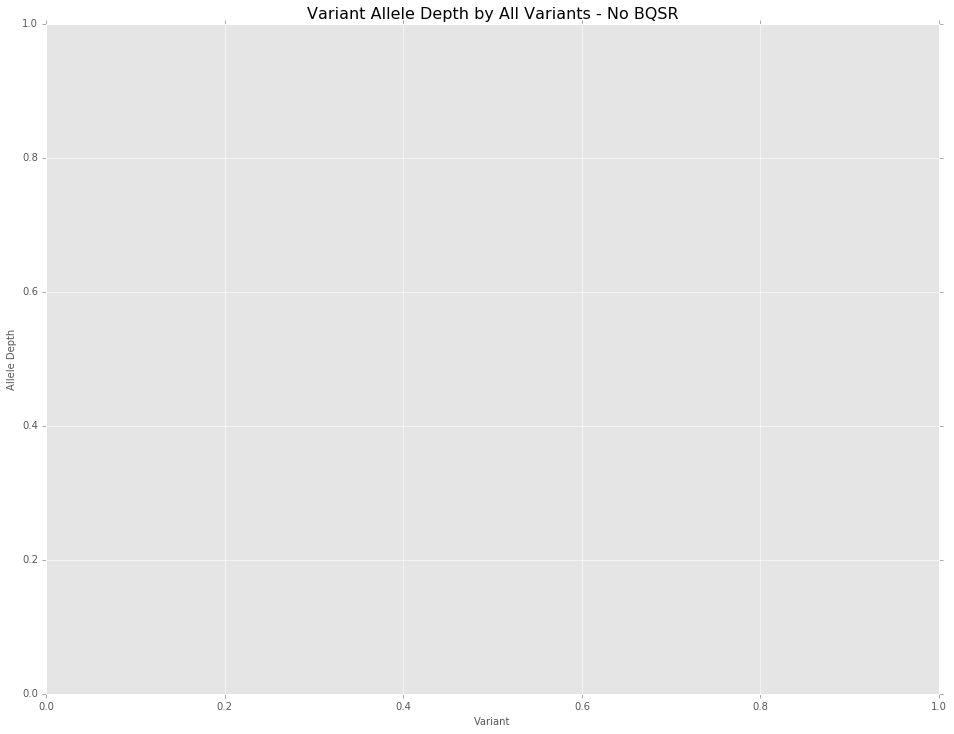

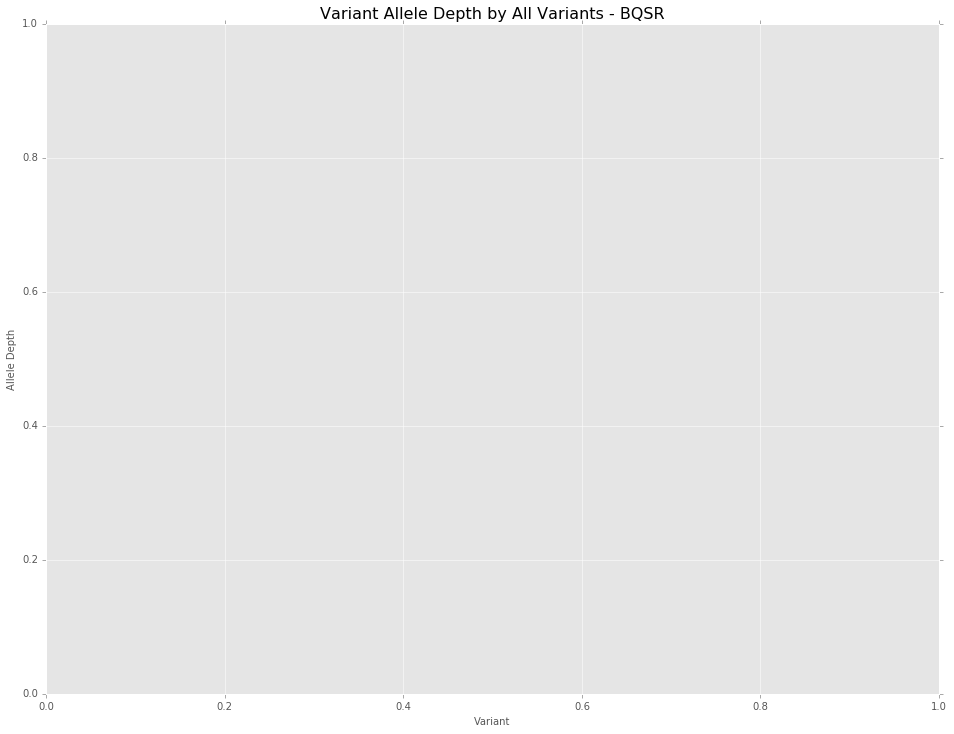

Summary Statistics: Variant Coverage - No BQSR

Measures of Central Tendency
	Mean          7.939267460422067
	Median        4
	Mode          2
Measures of Spread
	stdev         20.45777800815608
	variance      418.5206810309946
Distribution
	Min           0
	Lower Quatile 2
	Median        4
	Upper Quatile 7
	Max           931

Summary Statistics: Variant Coverage - BQSR

Measures of Central Tendency
	Mean          7.939267460422067
	Median        4
	Mode          2
Measures of Spread
	stdev         20.45777800815608
	variance      418.5206810309946
Distribution
	Min           0
	Lower Quatile 2
	Median        4
	Upper Quatile 7
	Max           931



In [5]:
af1       = getFormatData(c1HashMap, key = "AD", sampleIdx = 0)[0]
af2       = getFormatData(c2HashMap, key = "AD", sampleIdx = 0)[0]

# Extract Coverage - All - No BQSR
af1A = []
for ref, alt in af1:
    af1A.append(alt)

# Extract Coverage - All - BQSR
af2A = []
for ref, alt in af1:
    af2A.append(alt)

# Plot
simpleInlinePlot(range(len(af1A)), af1A, title = "Variant Allele Depth by All Variants - No BQSR", xlabel = "Variant", ylabel = "Allele Depth", plotType = "scatter", size = (16, 12), domain = [0,len(af1A)], opacity = 0.1)
simpleInlinePlot(range(len(af2A)), af2A, title = "Variant Allele Depth by All Variants - BQSR", xlabel = "Variant", ylabel = "Allele Depth", plotType = "scatter", size = (16, 12), domain = [0,len(af2A)], opacity = 0.1)

stats(af1A, title = "Summary Statistics: Variant Coverage - No BQSR")
stats(af2A, title = "Summary Statistics: Variant Coverage - BQSR")


#### This doesn't seem right, having over 1200 supporting reads for a variant allele in WGS. Time for a sanity check...

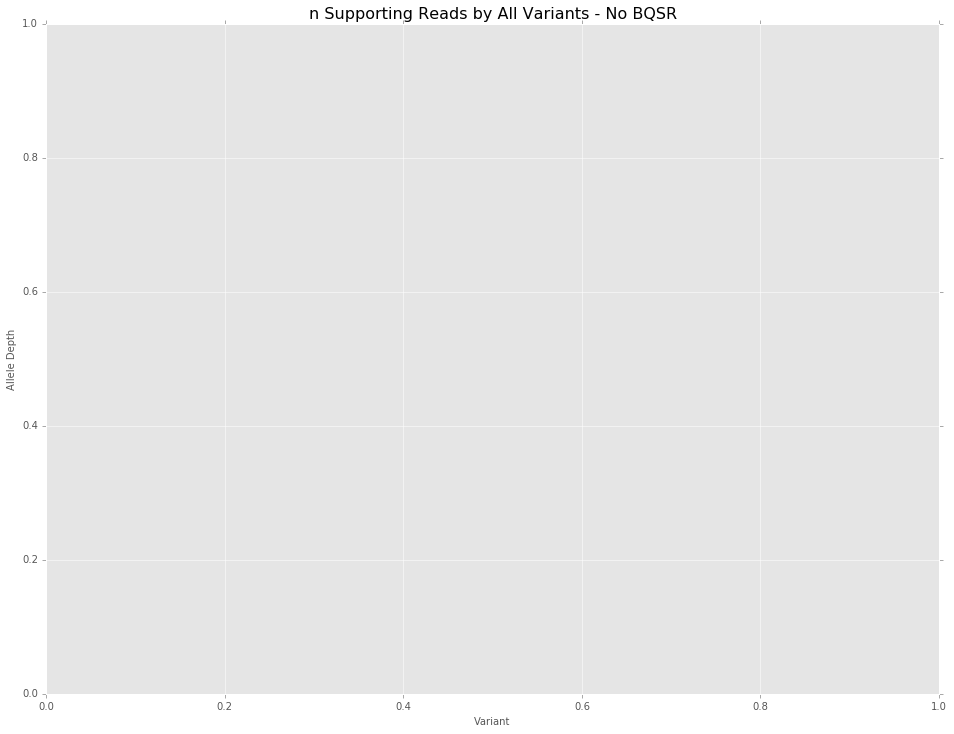

Summary Statistics: Read Counts - No BQSR

Measures of Central Tendency
	Mean          7.77145116646896
	Median        3
	Mode          2
Measures of Spread
	stdev         19.52160680900464
	variance      381.0931324053764
Distribution
	Min           0
	Lower Quatile 2
	Median        3
	Upper Quatile 7
	Max           931



In [6]:
readCounts = []
for md5, record in c1HashMap.items():
    samples = record.samples[0]
    reads = samples["ALT_F2R1"] + samples["ALT_F1R2"]
    readCounts.append(reads)
    
simpleInlinePlot(range(len(readCounts)), readCounts, title = "n Supporting Reads by All Variants - No BQSR", xlabel = "Variant", ylabel = "Allele Depth", plotType = "scatter", size = (16, 12), domain = [0,len(readCounts)], opacity = 0.1)

stats(readCounts, title = "Summary Statistics: Read Counts - No BQSR")

Visually identical, though the measures of central tendency and spread are slightly different.

### Detected Variants by Allele Frequency - All Variants

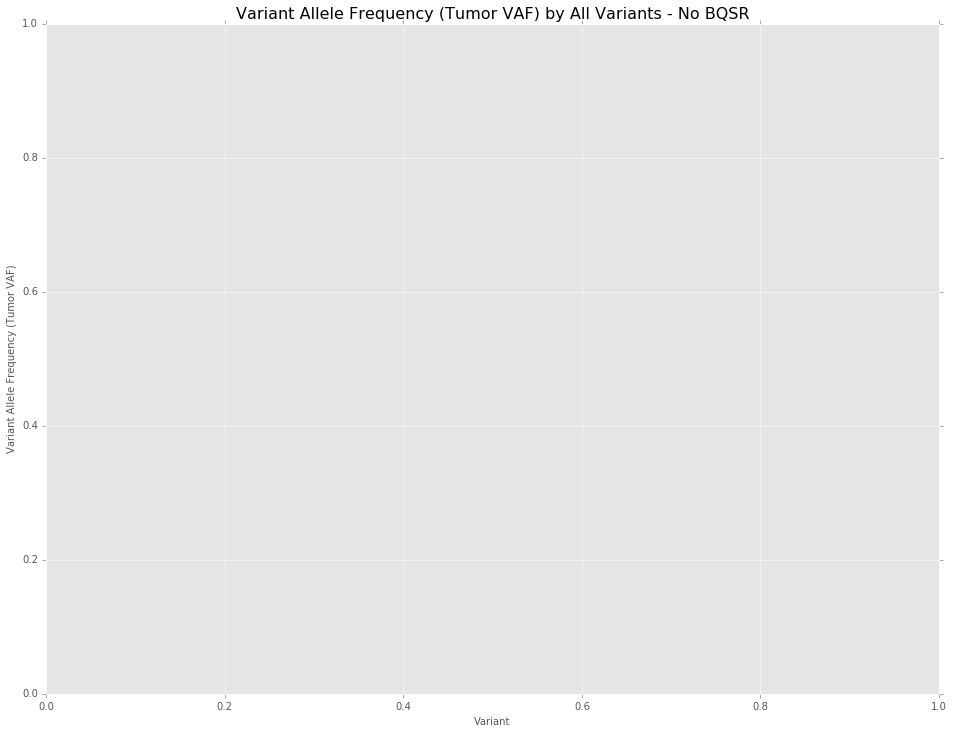

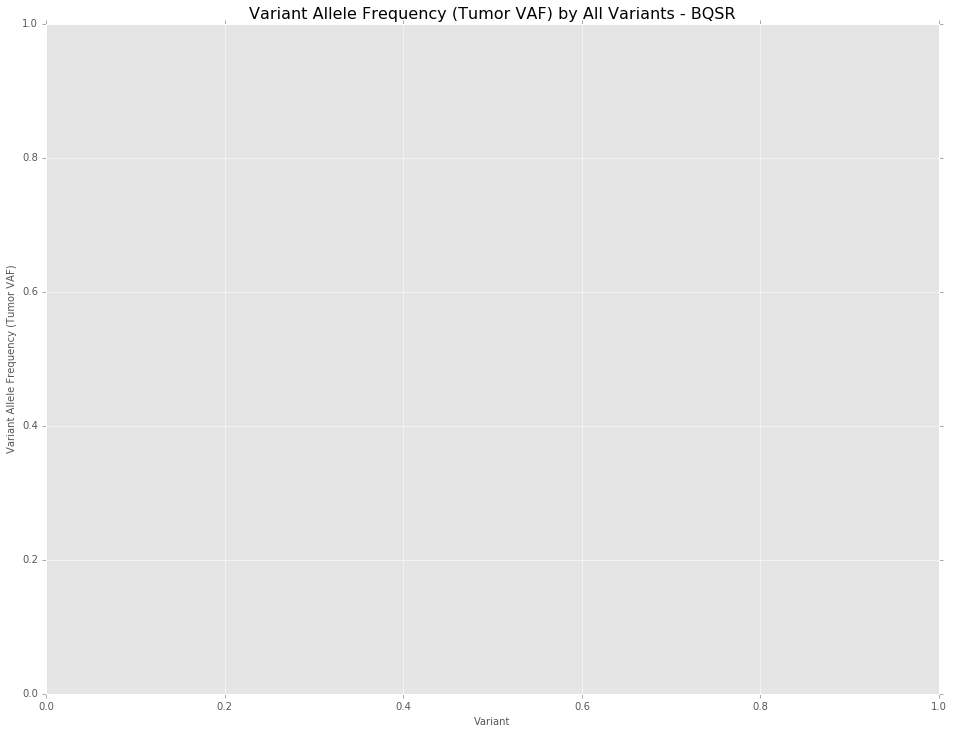

In [7]:
af1       = getFormatData(c1HashMap, key = "AF", sampleIdx = 0)[0]
af2       = getFormatData(c2HashMap, key = "AF", sampleIdx = 0)[0]

#
# Generate Plot
#

simpleInlinePlot(range(len(af1)), af1, title = "Variant Allele Frequency (Tumor VAF) by All Variants - No BQSR", xlabel = "Variant", ylabel = "Variant Allele Frequency (Tumor VAF)", plotType = "scatter", size = (16, 12), domain = [0,len(af1)], range = [0,1], opacity = 0.1)
simpleInlinePlot(range(len(af2)), af2, title = "Variant Allele Frequency (Tumor VAF) by All Variants - BQSR", xlabel = "Variant", ylabel = "Variant Allele Frequency (Tumor VAF)", plotType = "scatter", size = (16, 12), domain = [0,len(af2)], range = [0,1], opacity = 0.1)

Some clear breakpoint lines at VAF ~0.5, 0.33, 0.25. It also appears we can make out the chromosomes. Interesting bleed pattern down low...I feel like I'm looking at an agar gel. Is this a stream of consciousness? What's the meaning of life? Let's make some more plots.

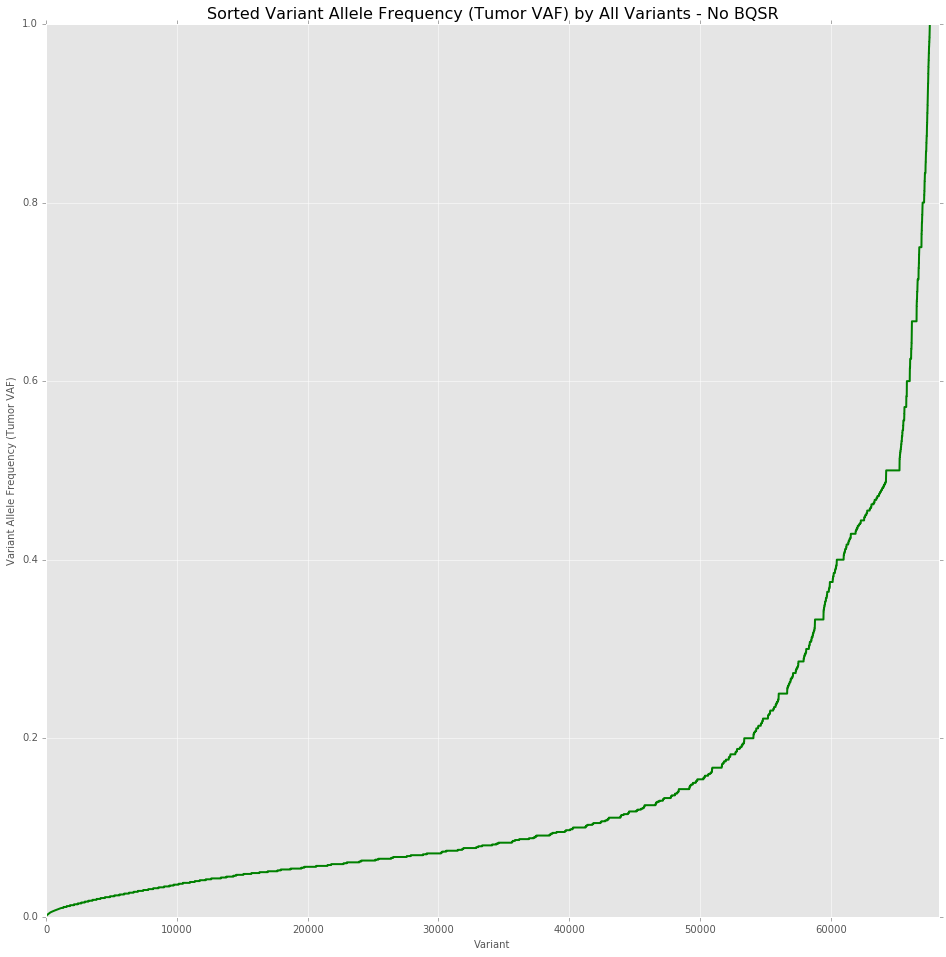

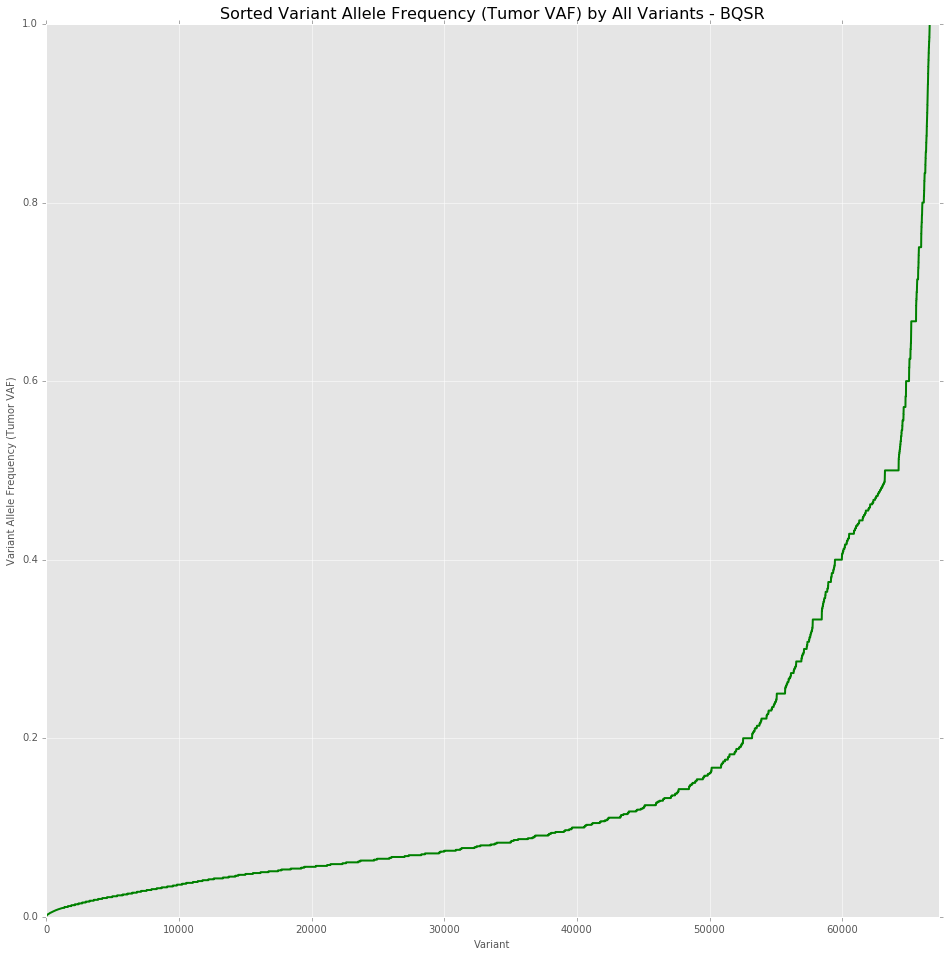

Summary Statistics: VAF - No BQSR

Measures of Central Tendency
	Mean          0.15192143563258792
	Median        0.081
	Mode          0.071
Measures of Spread
	stdev         0.18001910707639987
	variance      0.03240687891258432
Distribution
	Min           0.0007224
	Lower Quatile 0.051
	Median        0.081
	Upper Quatile 0.167
	Max           1.0

Summary Statistics: VAF - BQSR

Measures of Central Tendency
	Mean          0.1527559291401061
	Median        0.081
	Mode          0.071
Measures of Spread
	stdev         0.18136496289373338
	variance      0.03289324976544528
Distribution
	Min           0.0005217
	Lower Quatile 0.051
	Median        0.081
	Upper Quatile 0.167
	Max           1.0



In [8]:
af1Sorted = sorted(af1)
af2Sorted = sorted(af2)

simpleInlinePlot(range(len(af1)), af1Sorted, title = "Sorted Variant Allele Frequency (Tumor VAF) by All Variants - No BQSR", xlabel = "Variant", ylabel = "Variant Allele Frequency (Tumor VAF)", plotType = "plot", size = (16, 16), domain = [0,len(af1)], range = [0,1], opacity = 1)
simpleInlinePlot(range(len(af2)), af2Sorted, title = "Sorted Variant Allele Frequency (Tumor VAF) by All Variants - BQSR", xlabel = "Variant", ylabel = "Variant Allele Frequency (Tumor VAF)", plotType = "plot", size = (16, 16), domain = [0,len(af2)], range = [0,1], opacity = 1)

stats(af1, title = "Summary Statistics: VAF - No BQSR")
stats(af2, title = "Summary Statistics: VAF - BQSR")

Some things to note on the line plots:
* If variant allele frequency was randomly distributed, the line would be a roughly diagonal from the lower left to top right.
* Notice the plateau breakpoints - the most distinctive being at the ~0.5 VAF mark, likely indicating heterozygosity. We see similar breakpoints at around ~0.33, ~0.25, ~0.20, ~0.16. This begs the question: Are these indicative of ploidy as the frequencies may suggest?
* Finally, as expected, variants are clearly less common than their normal counterparts. We can see this from the low undulating slope followed by a sharp increase after the ~0.5 VAF breakpoint. 

### Detected Variants by Quality Score - All Variants

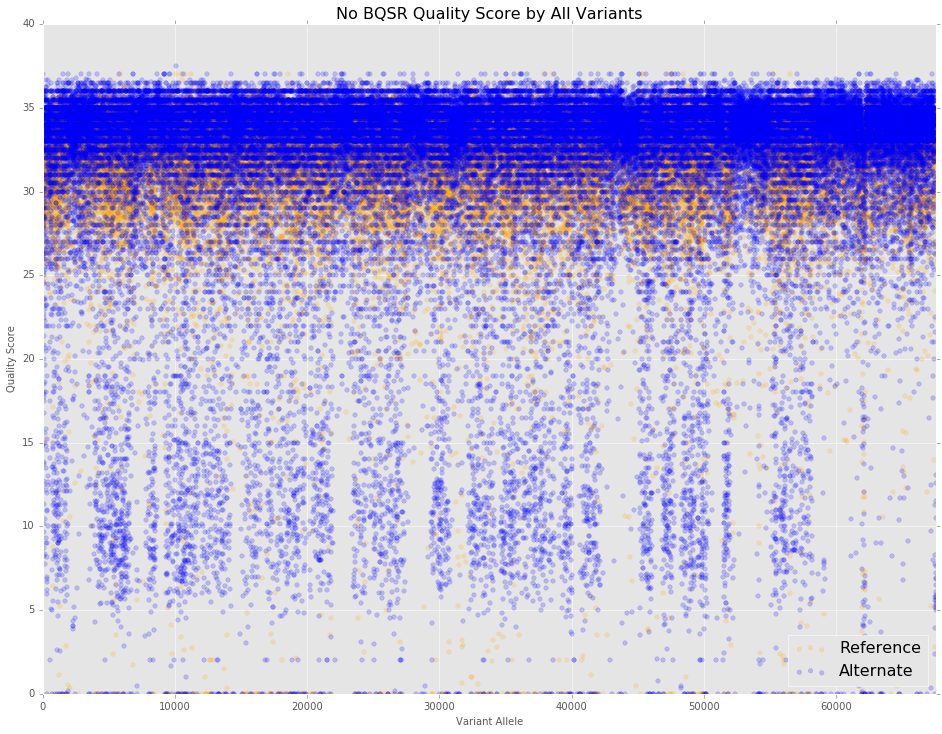

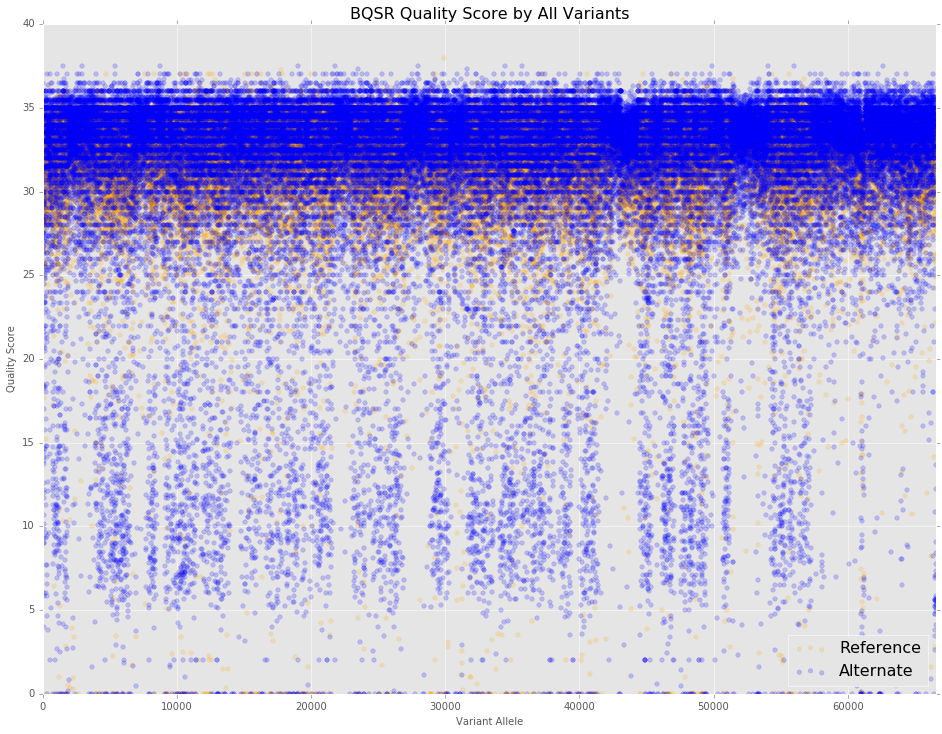

Summary Statistics: VAF - No BQSR

Measures of Central Tendency
	Mean          0.15192143563258792
	Median        0.081
	Mode          0.071
Measures of Spread
	stdev         0.18001910707639987
	variance      0.03240687891258432
Distribution
	Min           0.0007224
	Lower Quatile 0.051
	Median        0.081
	Upper Quatile 0.167
	Max           1.0

Summary Statistics: VAF - BQSR

Measures of Central Tendency
	Mean          0.1527559291401061
	Median        0.081
	Mode          0.071
Measures of Spread
	stdev         0.18136496289373338
	variance      0.03289324976544528
Distribution
	Min           0.0005217
	Lower Quatile 0.051
	Median        0.081
	Upper Quatile 0.167
	Max           1.0



In [9]:
c1Ref, c1Alt = computeQuals(c1HashMap)
c2Ref, c2Alt = computeQuals(c2HashMap)
    
plotQualityScores(c1Ref, c1Alt, title = "No BQSR Quality Score by All Variants")
plotQualityScores(c2Ref, c2Alt, title = "BQSR Quality Score by All Variants")

stats(af1, title = "Summary Statistics: VAF - No BQSR")
stats(af2, title = "Summary Statistics: VAF - BQSR")

These two plots look identical. Tumor quality scores appear generally slightly higher and more narrowly distributed than the reference.

### Detected Variants by Dinucleotide Context - All Variants

## Detection Analysis - Passing Variants

In [10]:
# Retrieve Passing Variants
c1Passing = passingVariants(c1HashMap)
c2Passing = passingVariants(c2HashMap)

### Detected Variants by Coverage - Passing Variants

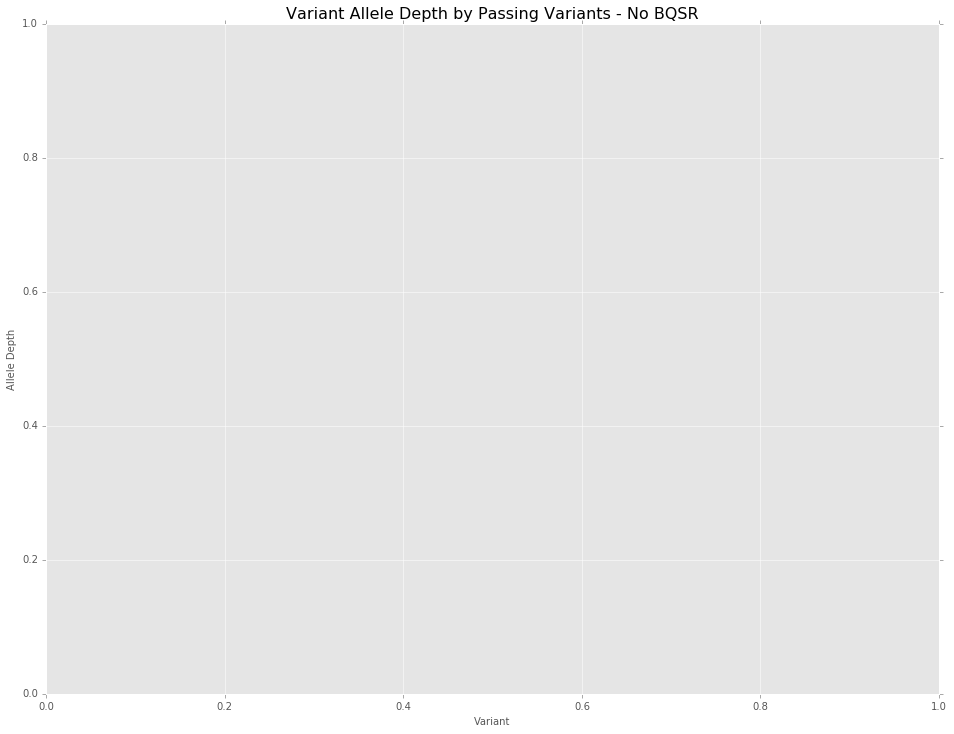

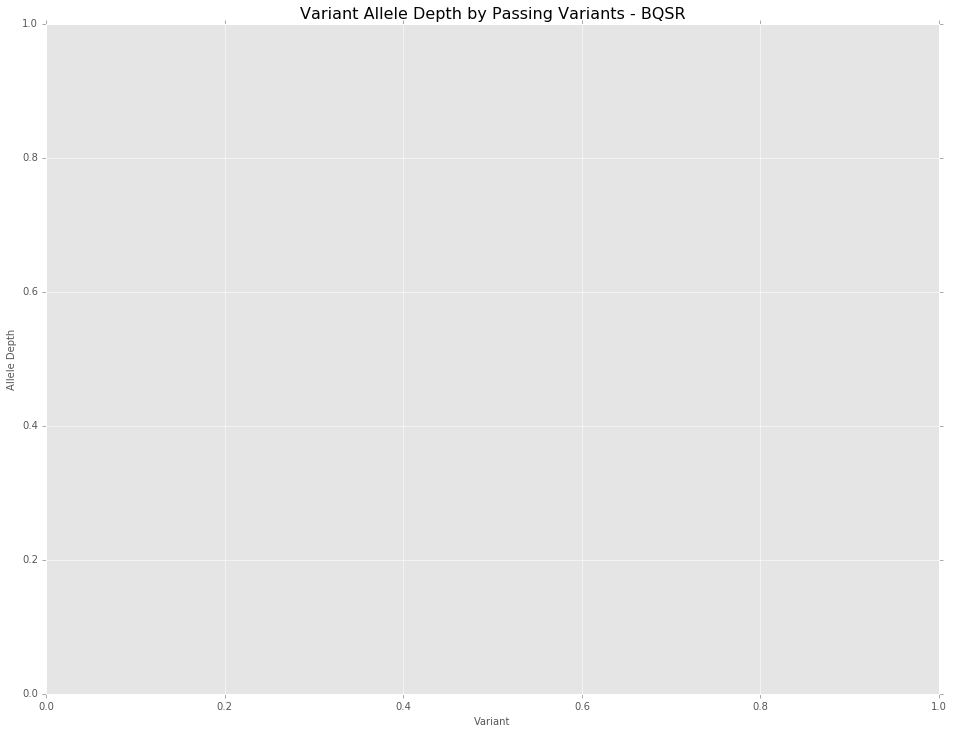

Summary Statistics: Coverage - No BQSR

Measures of Central Tendency
	Mean          16.382814225756572
	Median        13
	Mode          12
Measures of Spread
	stdev         16.285331303826112
	variance      265.21201567537867
Distribution
	Min           1
	Lower Quatile 10
	Median        13
	Upper Quatile 17
	Max           175

Summary Statistics: Coverage - BQSR

Measures of Central Tendency
	Mean          16.382814225756572
	Median        13
	Mode          12
Measures of Spread
	stdev         16.285331303826112
	variance      265.21201567537867
Distribution
	Min           1
	Lower Quatile 10
	Median        13
	Upper Quatile 17
	Max           175



In [11]:
af1       = getFormatData(c1Passing, key = "AD", sampleIdx = 0)[0]
af2       = getFormatData(c2Passing, key = "AD", sampleIdx = 0)[0]

# Extract Coverage - All - No BQSR
af1A = []
for ref, alt in af1:
    af1A.append(alt)

# Extract Coverage - All - BQSR
af2A = []
for ref, alt in af1:
    af2A.append(alt)
    
# Plot
simpleInlinePlot(range(len(af1A)), af1A, title = "Variant Allele Depth by Passing Variants - No BQSR", xlabel = "Variant", ylabel = "Allele Depth", plotType = "scatter", size = (16, 12), domain = [0,len(af1A)], opacity = 0.1)
simpleInlinePlot(range(len(af2A)), af2A, title = "Variant Allele Depth by Passing Variants - BQSR", xlabel = "Variant", ylabel = "Allele Depth", plotType = "scatter", size = (16, 12), domain = [0,len(af2A)], opacity = 0.1)

stats(af1A, title = "Summary Statistics: Coverage - No BQSR")
stats(af2A, title = "Summary Statistics: Coverage - BQSR")



### Detected Variants by Allele Frequency - Passing Variants

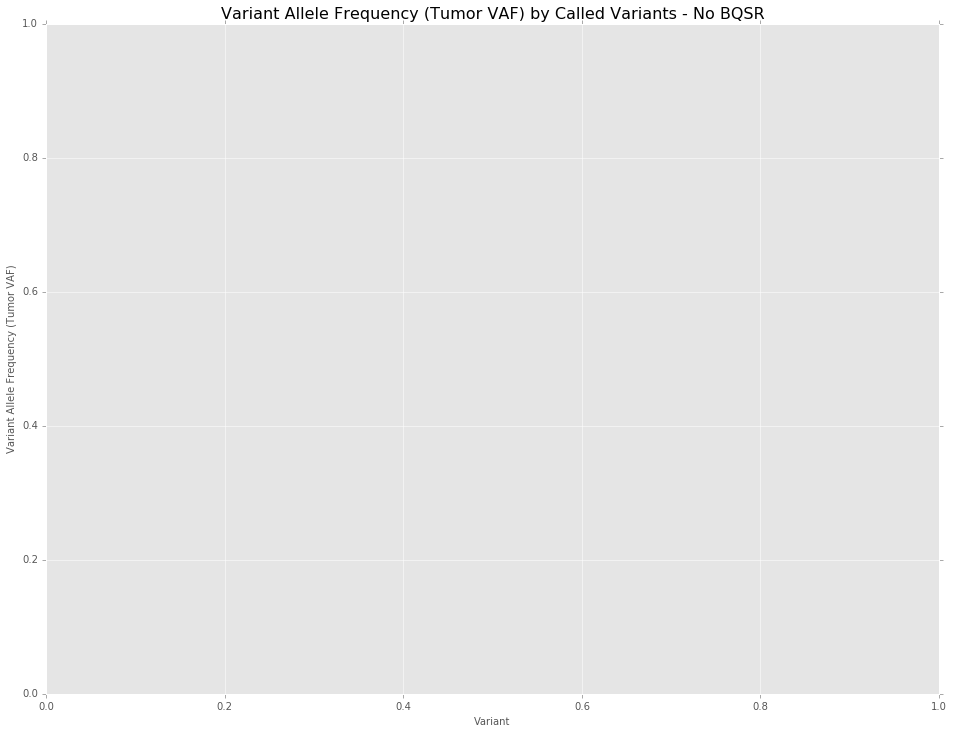

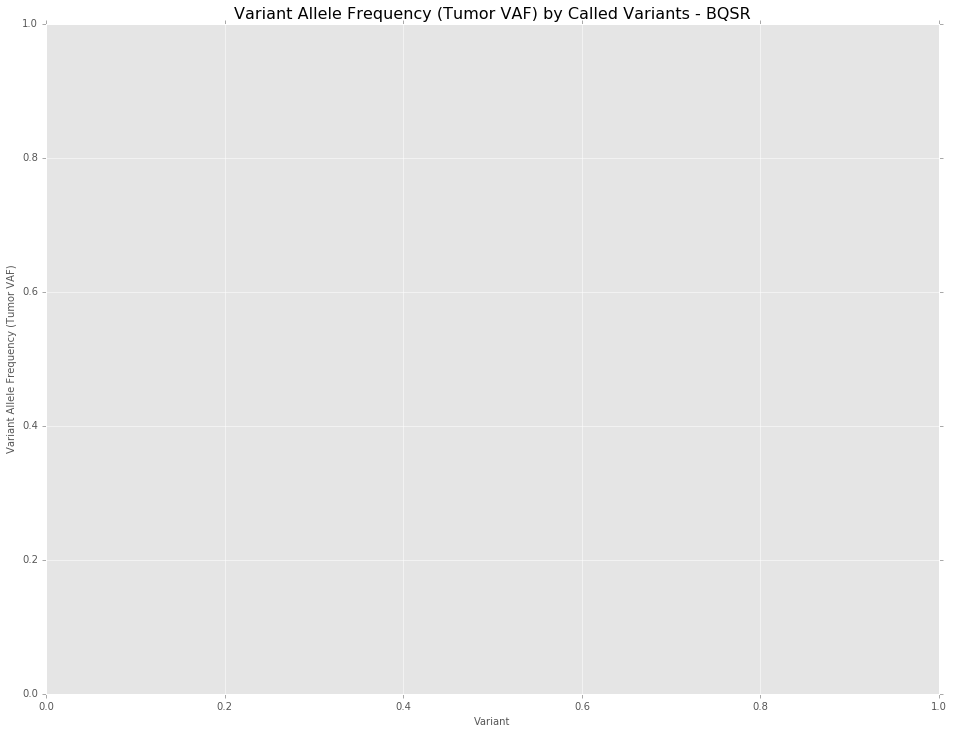

In [12]:
af1       = getFormatData(c1Passing, key = "AF", sampleIdx = 0)[0]
af2       = getFormatData(c2Passing, key = "AF", sampleIdx = 0)[0]

#
# Generate Plot
#

simpleInlinePlot(range(len(af1)), af1, title = "Variant Allele Frequency (Tumor VAF) by Called Variants - No BQSR", xlabel = "Variant", ylabel = "Variant Allele Frequency (Tumor VAF)", plotType = "scatter", size = (16, 12), domain = [0,len(af1)], range = [0,1], opacity = 0.1)
simpleInlinePlot(range(len(af2)), af2, title = "Variant Allele Frequency (Tumor VAF) by Called Variants - BQSR", xlabel = "Variant", ylabel = "Variant Allele Frequency (Tumor VAF)", plotType = "scatter", size = (16, 12), domain = [0,len(af2)], range = [0,1], opacity = 0.1)

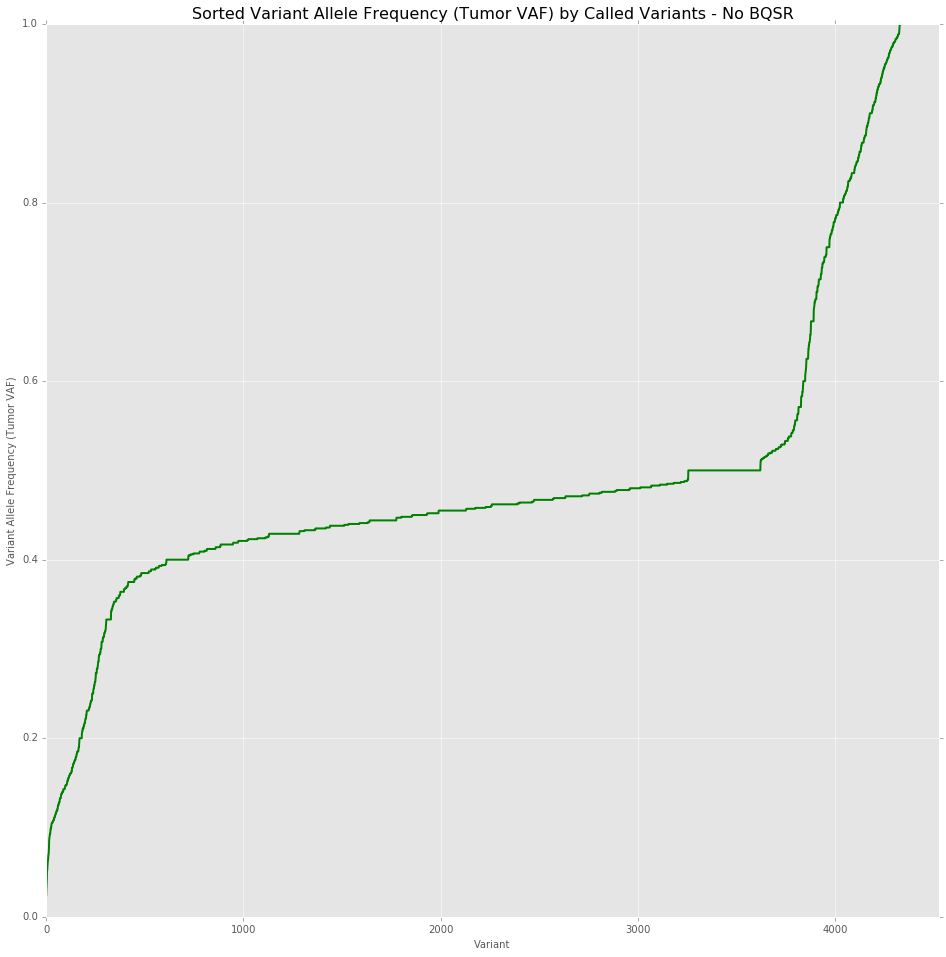

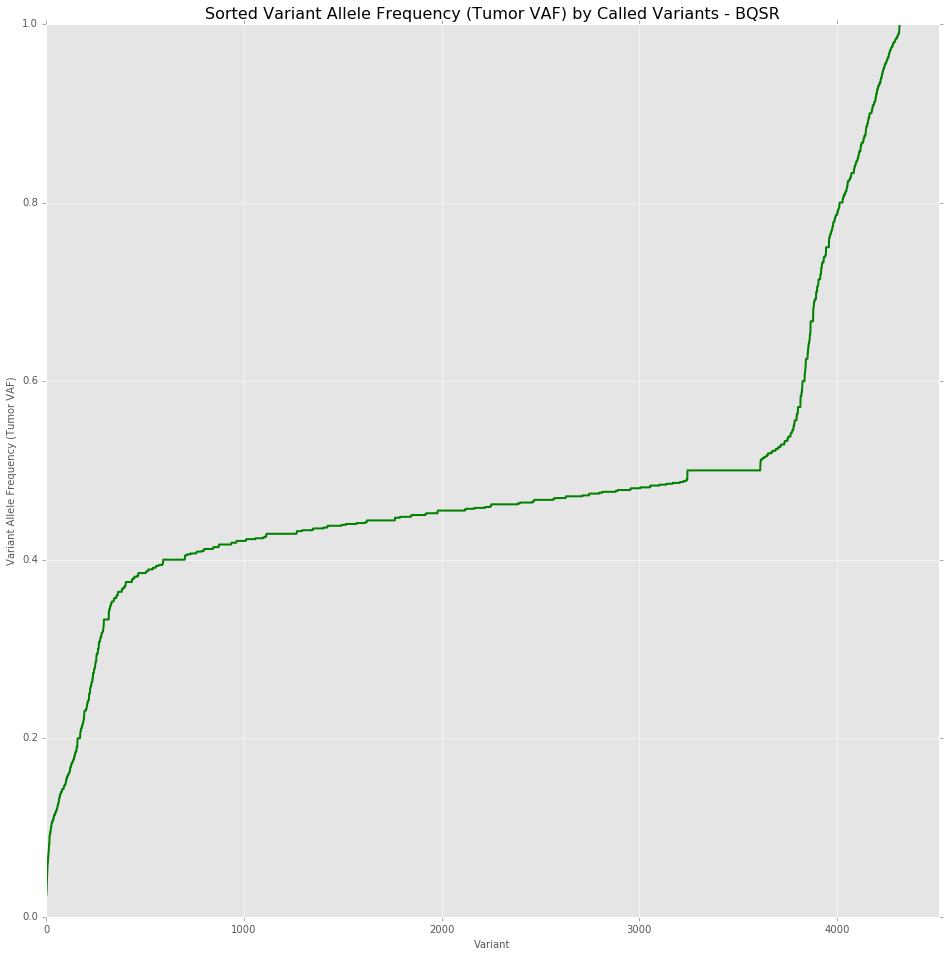

Summary Statistics: VAF - No BQSR

Measures of Central Tendency
	Mean          0.4995400927766733
	Median        0.462
	Mode          0.5
Measures of Spread
	stdev         0.183240291757724
	variance      0.033577004523455814
Distribution
	Min           0.024
	Lower Quatile 0.429
	Median        0.462
	Upper Quatile 0.5
	Max           1.0

Summary Statistics: VAF - BQSR

Measures of Central Tendency
	Mean          0.5006117386489479
	Median        0.462
	Mode          0.5
Measures of Spread
	stdev         0.18258848485695828
	variance      0.033338554802359685
Distribution
	Min           0.024
	Lower Quatile 0.429
	Median        0.462
	Upper Quatile 0.5
	Max           1.0



In [13]:
af1Sorted = sorted(af1)
af2Sorted = sorted(af2)

#
# Generate Plot
#

simpleInlinePlot(range(len(af1)), af1Sorted, title = "Sorted Variant Allele Frequency (Tumor VAF) by Called Variants - No BQSR", xlabel = "Variant", ylabel = "Variant Allele Frequency (Tumor VAF)", plotType = "plot", size = (16, 16), domain = [0,len(af1)], range = [0,1], opacity = 1)
simpleInlinePlot(range(len(af2)), af2Sorted, title = "Sorted Variant Allele Frequency (Tumor VAF) by Called Variants - BQSR", xlabel = "Variant", ylabel = "Variant Allele Frequency (Tumor VAF)", plotType = "plot", size = (16, 16), domain = [0,len(af2)], range = [0,1], opacity = 1)

stats(af1, title = "Summary Statistics: VAF - No BQSR")
stats(af2, title = "Summary Statistics: VAF - BQSR")

### Detected Variants by Quality Score - Passing Variants

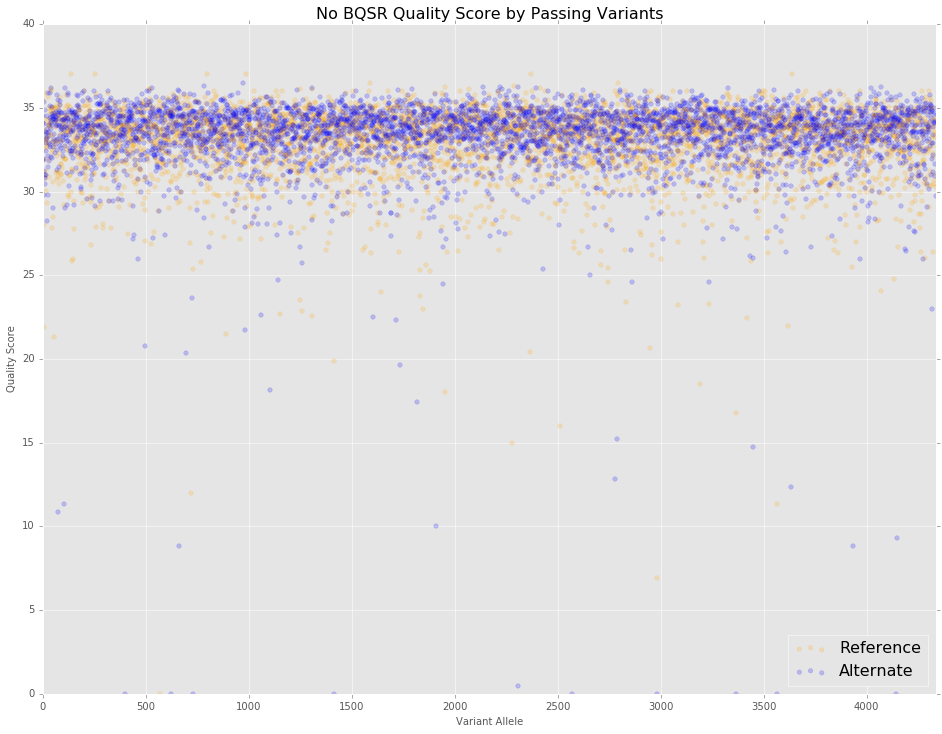

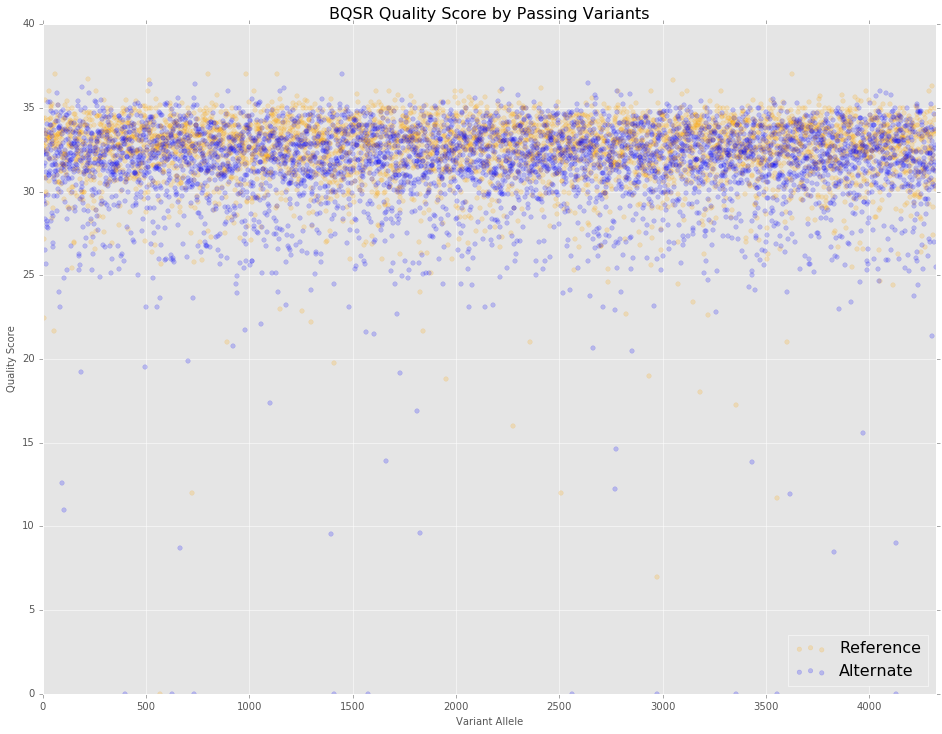

Summary Statistics: VAF - No BQSR

Measures of Central Tendency
	Mean          0.4995400927766733
	Median        0.462
	Mode          0.5
Measures of Spread
	stdev         0.183240291757724
	variance      0.033577004523455814
Distribution
	Min           0.024
	Lower Quatile 0.429
	Median        0.462
	Upper Quatile 0.5
	Max           1.0

Summary Statistics: VAF - BQSR

Measures of Central Tendency
	Mean          0.5006117386489479
	Median        0.462
	Mode          0.5
Measures of Spread
	stdev         0.18258848485695828
	variance      0.033338554802359685
Distribution
	Min           0.024
	Lower Quatile 0.429
	Median        0.462
	Upper Quatile 0.5
	Max           1.0



In [14]:
c1Ref, c1Alt = computeQuals(c1Passing)
c2Ref, c2Alt = computeQuals(c2Passing)
    
plotQualityScores(c1Ref, c1Alt, title = "No BQSR Quality Score by Passing Variants")
plotQualityScores(c2Ref, c2Alt, title = "BQSR Quality Score by Passing Variants")

stats(af1, title = "Summary Statistics: VAF - No BQSR")
stats(af2, title = "Summary Statistics: VAF - BQSR")

### Detected Variants by Dinucleotide Context - Passing Variants

# Curve Analysis

### ROC Curve (No BQSR Condition v. BQSR Condition)

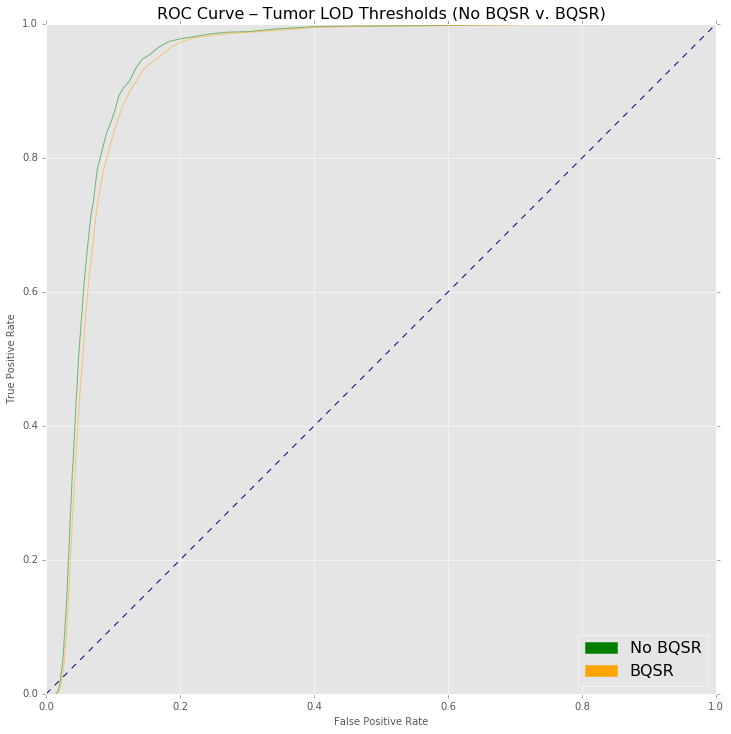

In [15]:
plotCurve([condition1Analysis, condition2Analysis], ["No BQSR", "BQSR"], xKey = "fpr", yKey = "tpr", xLabel = "False Positive Rate", yLabel = "True Positive Rate", title = "ROC Curve – Tumor LOD Thresholds (No BQSR v. BQSR)", diag = "bottom", method = "plot")

### Sensitivity Specificity Curve (No BQSR Condition v. BQSR Condition)

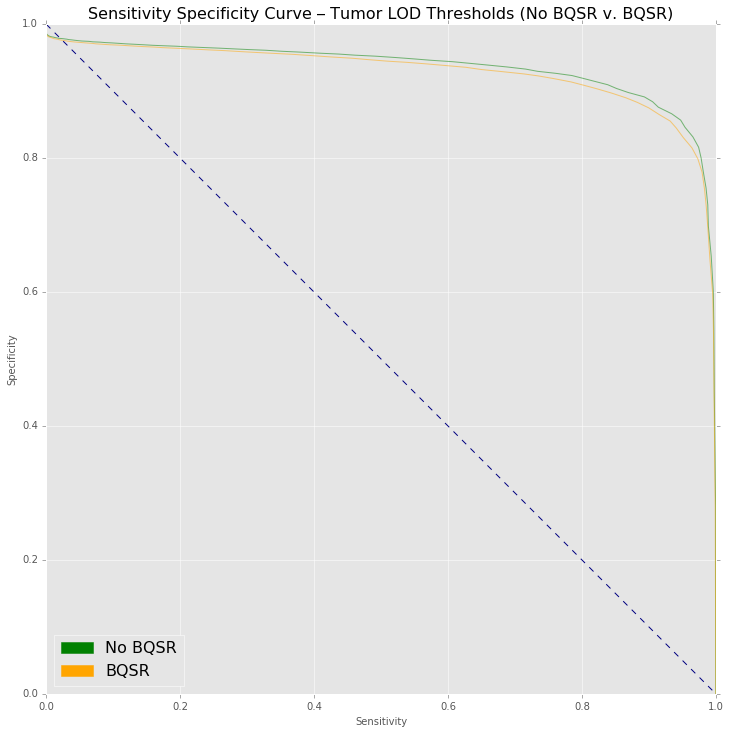

In [16]:
#
# Generate Sensitivity-Specificity Curve
#

plotCurve([condition1Analysis, condition2Analysis], ["No BQSR", "BQSR"], xKey = "sensitivity", yKey = "specificity", xLabel = "Sensitivity", yLabel = "Specificity", title = "Sensitivity Specificity Curve – Tumor LOD Thresholds (No BQSR v. BQSR)", diag = "top", method = "plot", legendLoc = "lower left")

### Second Look: What Threshold Results in The Max Combined Sensitivity-Specificity?

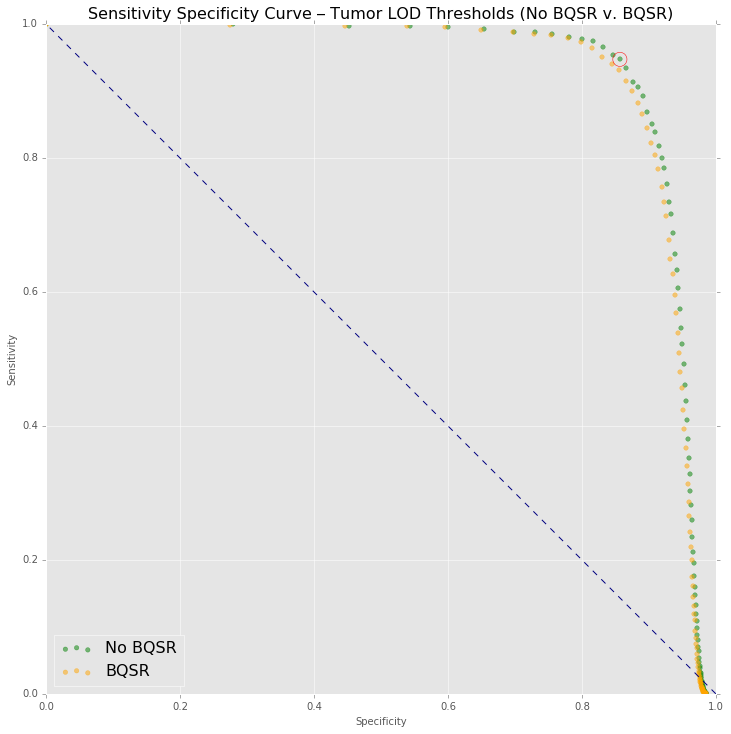

In [17]:
#
# Generate Sensitivity-Specificity Curve - With Maximum Combination
#

# Setup
fig         = Plot.figure(1, (12, 12), dpi = 1200)
axis        = fig.add_subplot(111)
axis.set_ylabel('Sensitivity', fontsize = 10)
axis.set_xlabel('Specificity', fontsize = 10)
# Scatter
c1 = scatterXY(condition1Analysis, "specificity", "sensitivity", "green")
c2 = scatterXY(condition2Analysis, "specificity", "sensitivity", "orange")
# c3 = scatterXY(comparisonAnalysis, "specificity", "sensitivity", "red")
# Annotate Maximized Threshold
m  = plotMaximized(condition1Analysis, "specificity", "sensitivity")
# Plot
Plot.plot([1, 0], [0, 1], color='navy', lw=1, linestyle='--')
Plot.ylim([0, 1])
Plot.xlim([0, 1])
Plot.title("Sensitivity Specificity Curve – Tumor LOD Thresholds (No BQSR v. BQSR)", fontsize = 16)
Plot.legend((c1, c2), ('No BQSR', 'BQSR'), loc = 'lower left', fontsize = 16)
# Plot.legend((c1, c2, c3), ('No BQSR', 'BQSR', 'Comparison'), loc = 'lower left', fontsize = 16)
Plot.show()
    

## Optimal Threshold Analysis

### No BQSR Condition Statistics

In [18]:
printBest(condition1Analysis) # Accuracy
printBest(condition1Analysis, "f1score")
printBest(condition1Analysis, "ppv")

Best Threshold by 'accuracy'

Tumor LOD Threshold: 99

	True Positive:     3
	True Negative:     63807
	False Positive:    970
	False Negative:    3503

	TPR:               0.09%
	TNR:               98.50%
	FPR:               1.50%
	FNR:               99.91%

	Sensitivity:       0.09%
	Specificity:       98.50%

	Precision:         0.31%
	Recall:            0.09%

	Accuracy:          93.45%
	F1-Score:          0.13%

	FDR:               99.69%
	FOR:               5.20%

	NPV:               94.80%
	PPV:               0.31%

	Diagnostic OR:     5.63

Best Threshold by 'f1score'

Tumor LOD Threshold: 28

	True Positive:     2753
	True Negative:     59810
	False Positive:    4967
	False Negative:    753

	TPR:               78.52%
	TNR:               92.33%
	FPR:               7.67%
	FNR:               21.48%

	Sensitivity:       78.52%
	Specificity:       92.33%

	Precision:         35.66%
	Recall:            78.52%

	Accuracy:          91.62%
	F1-Score:          49.05%

	FDR:            

### BQSR Condition Statistics

In [19]:
printBest(condition2Analysis) # Accuracy
printBest(condition2Analysis, "f1score")
printBest(condition1Analysis, "ppv")

Best Threshold by 'accuracy'

Tumor LOD Threshold: 99

	True Positive:     2
	True Negative:     62822
	False Positive:    970
	False Negative:    3505

	TPR:               0.06%
	TNR:               98.48%
	FPR:               1.52%
	FNR:               99.94%

	Sensitivity:       0.06%
	Specificity:       98.48%

	Precision:         0.21%
	Recall:            0.06%

	Accuracy:          93.35%
	F1-Score:          0.09%

	FDR:               99.79%
	FOR:               5.28%

	NPV:               94.72%
	PPV:               0.21%

	Diagnostic OR:     3.70

Best Threshold by 'f1score'

Tumor LOD Threshold: 27

	True Positive:     2655
	True Negative:     58621
	False Positive:    5171
	False Negative:    852

	TPR:               75.71%
	TNR:               91.89%
	FPR:               8.11%
	FNR:               24.29%

	Sensitivity:       75.71%
	Specificity:       91.89%

	Precision:         33.93%
	Recall:            75.71%

	Accuracy:          91.05%
	F1-Score:          46.85%

	FDR:            

# Ranged Distributions - Passing Variants

### Ranged Allele Depth Distributions - Passing

#### Let's Remove Any Outliers...

In [20]:
# Get Metrics
c1AdVals = sorted([sum(tup) for tup in getFormatData(c1Passing, key = "AD")[0]])
c2AdVals = sorted([sum(tup) for tup in getFormatData(c2Passing, key = "AD")[0]])

print("\nBelow are the last 10 positions in the No BQSR condition allele depth array. Notice the outlier at the end.\n")
print(c1AdVals[(len(c1AdVals) - 10):len(c1AdVals)])
print("\nBelow are the last 10 positions in the BQSR condition allele depth array. Notice the same outlier at the end, with an additional supporting read.\n")
print(c2AdVals[(len(c2AdVals) - 10):len(c2AdVals)])

print("For the purpose of this analysis, let's drop the outlier from each condition.\n")
c1AdVals.pop(-1)
c2AdVals.pop(-1)

print(c1AdVals[(len(c1AdVals) - 10):len(c1AdVals)])
print(c2AdVals[(len(c2AdVals) - 10):len(c2AdVals)])



Below are the last 10 positions in the No BQSR condition allele depth array. Notice the outlier at the end.

[153, 157, 158, 160, 161, 170, 173, 175, 175, 284]

Below are the last 10 positions in the BQSR condition allele depth array. Notice the same outlier at the end, with an additional supporting read.

[150, 153, 157, 158, 160, 161, 170, 173, 175, 175]
For the purpose of this analysis, let's drop the outlier from each condition.

[149, 153, 157, 158, 160, 161, 170, 173, 175, 175]
[149, 150, 153, 157, 158, 160, 161, 170, 173, 175]


#### Allele Depth Distributions - No BQSR & BQSR - Passing

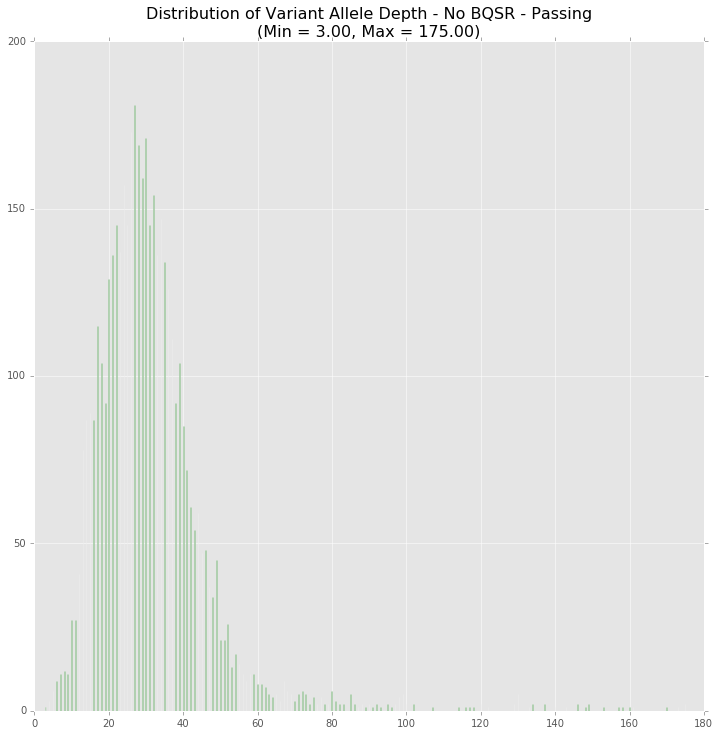

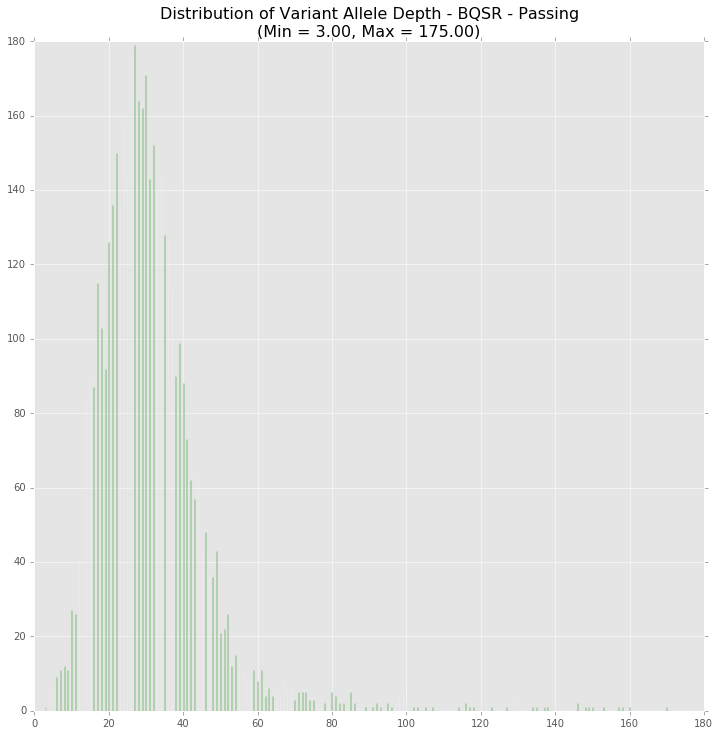

In [21]:
# Plot Complete Distribution - No BQSR
c1AdMin = min(c1AdVals)
c1AdMax = max(c1AdVals)
title = "Distribution of Variant Allele Depth - No BQSR - Passing\n(Min = %.2f, Max = %.2f)" % (c1AdMin, c1AdMax)
simpleHist(c1AdVals, title = title, bins = 1000)

# Plot Complete Distribution - BQSR
c2AdMin = min(c1AdVals)
c2AdMax = max(c1AdVals)
title = "Distribution of Variant Allele Depth - BQSR - Passing\n(Min = %.2f, Max = %.2f)" % (c2AdMin, c2AdMax)
simpleHist(c2AdVals, title = title, bins = 1000)

#### Allele Depth Distribution Median Subsets (10) - No BQSR

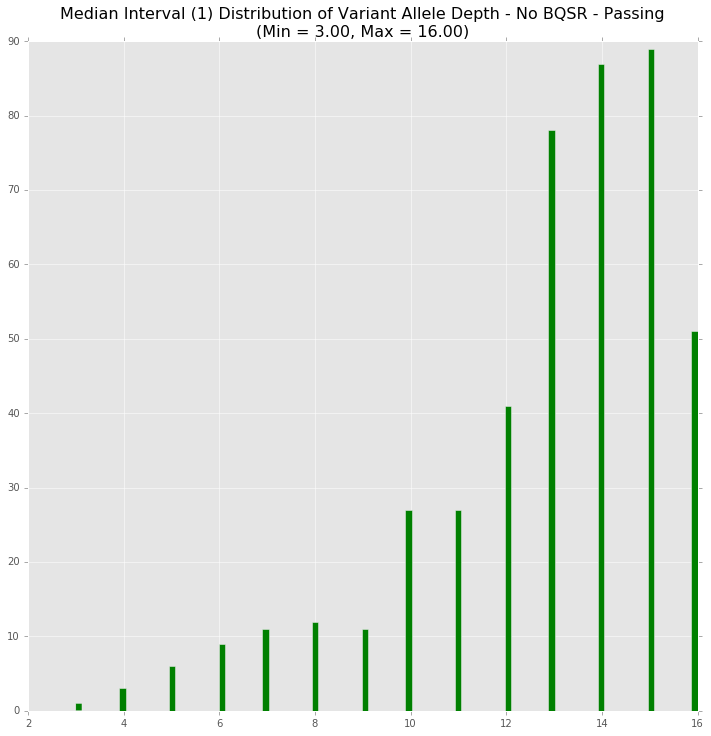

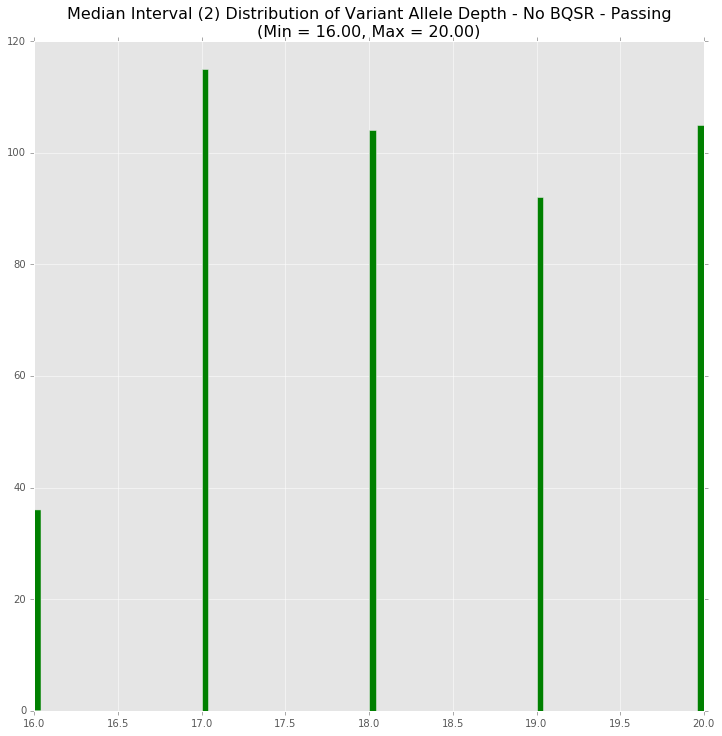

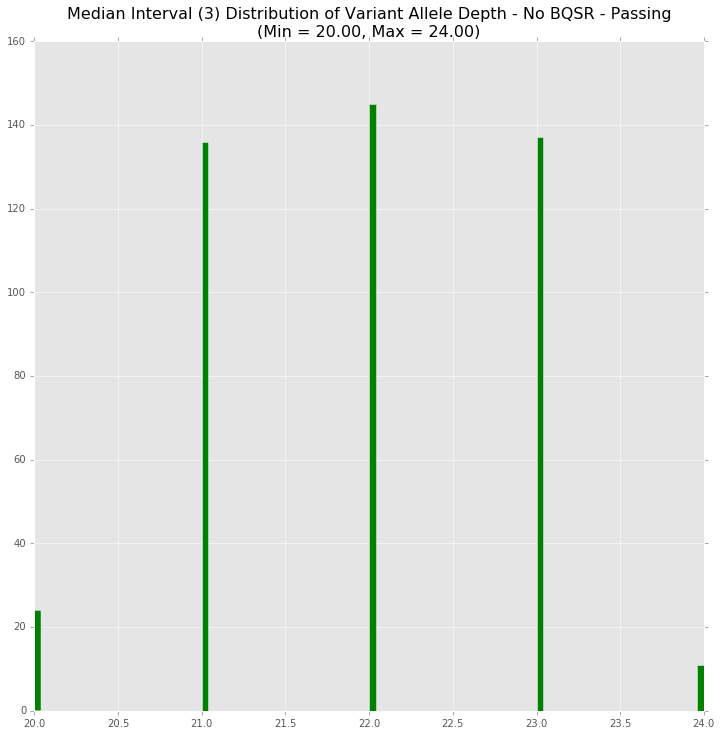

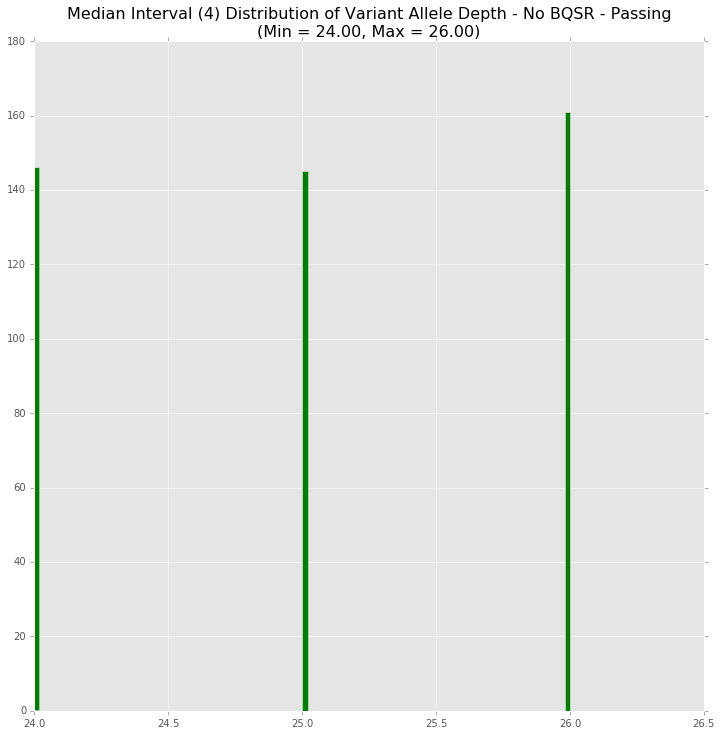

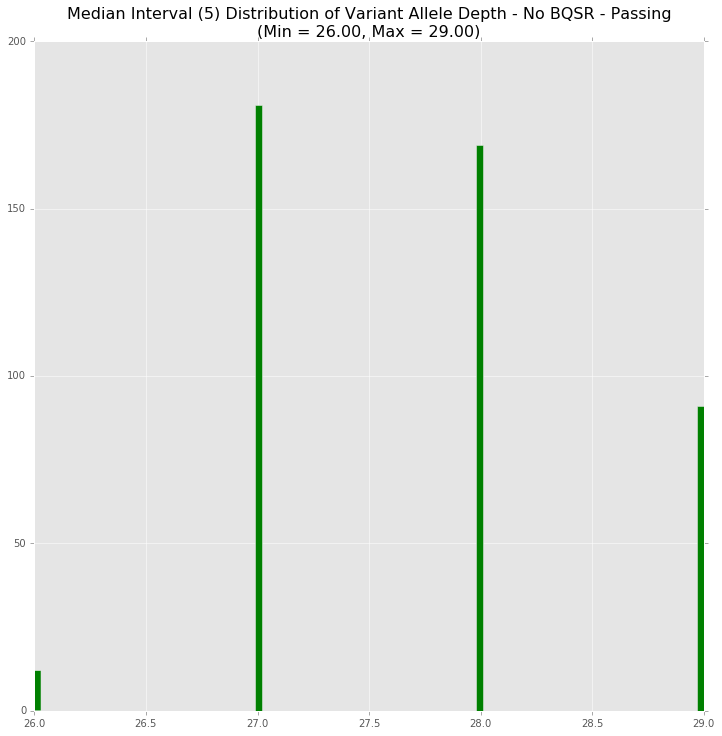

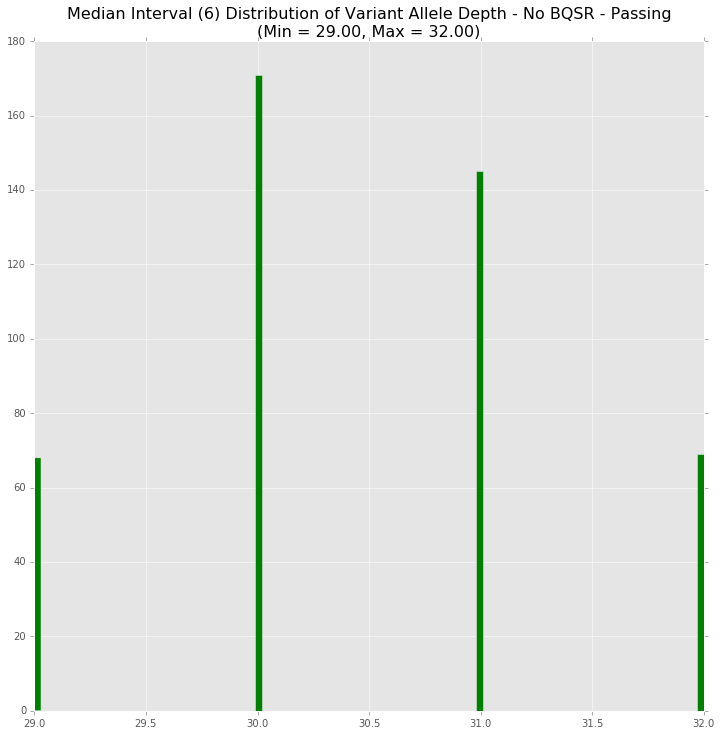

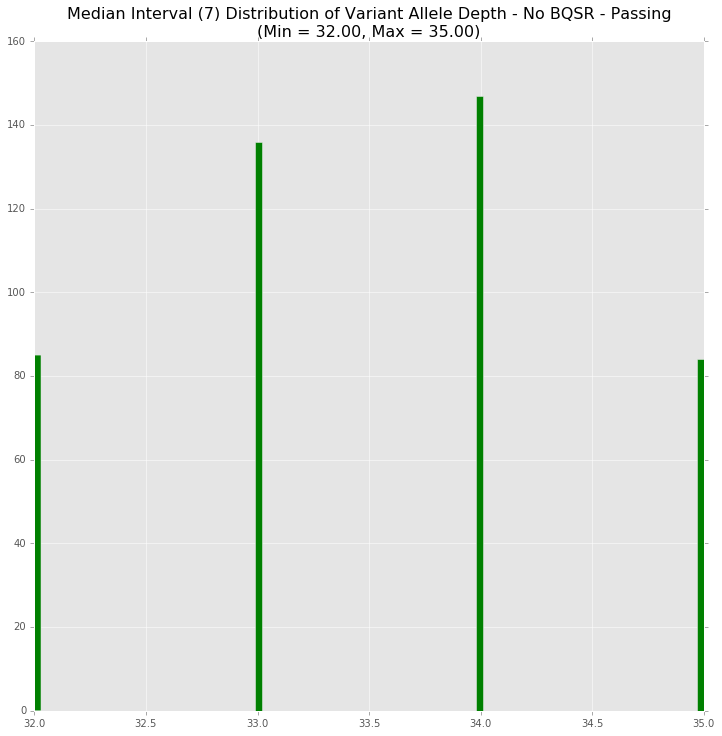

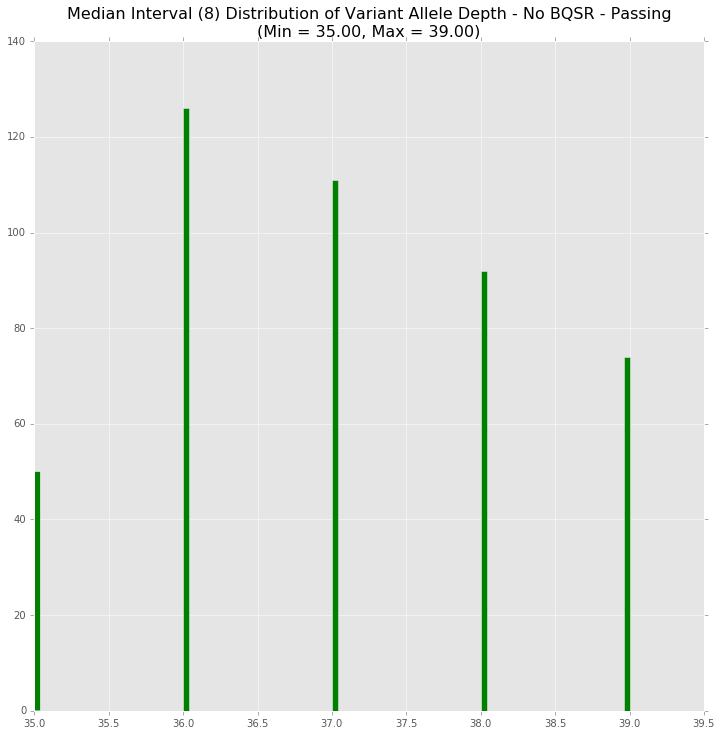

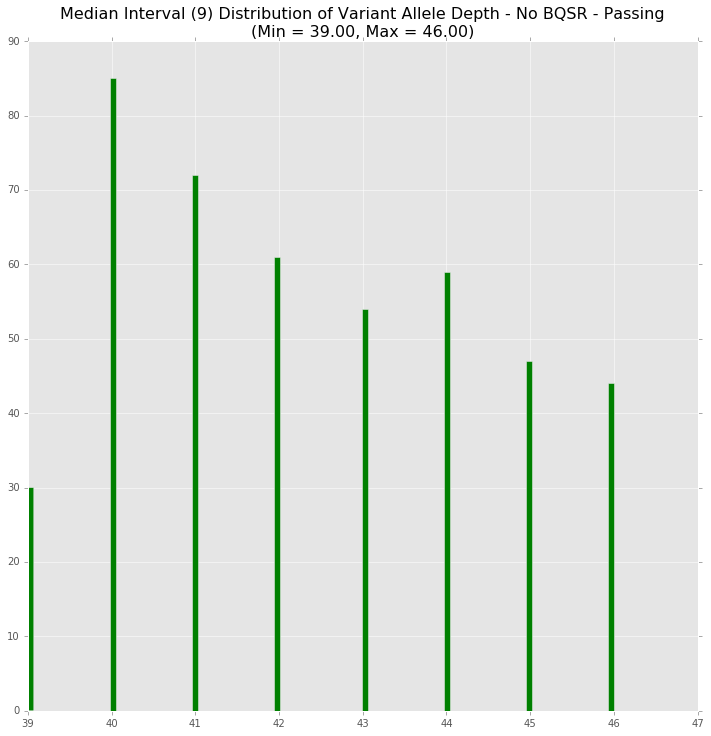

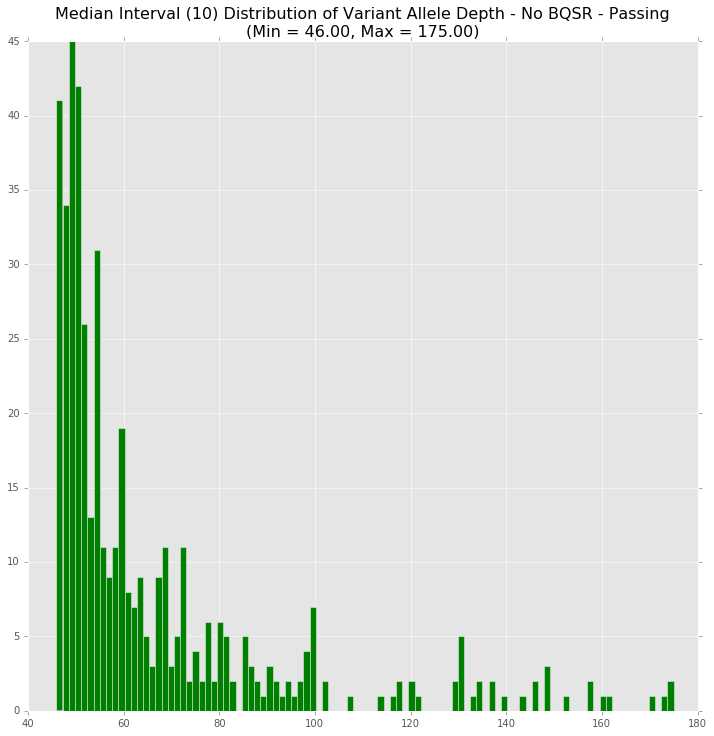

In [22]:
# Plot Median Subsets - No BQSR
i = 1
c1AdSplits, c1AdRanges = generateSplits(c1AdVals, 10, median = True)
for split, valRanges in zip(c1AdSplits, c1AdRanges):
    title = "Median Interval (" + str(i) + ") Distribution of Variant Allele Depth - No BQSR - Passing\n(Min = %.2f, Max = %.2f)" % valRanges
    simpleHist(split, title = title, bins = 100)
    i += 1

#### Allele Depth Distribution Median Subsets (10) - BQSR

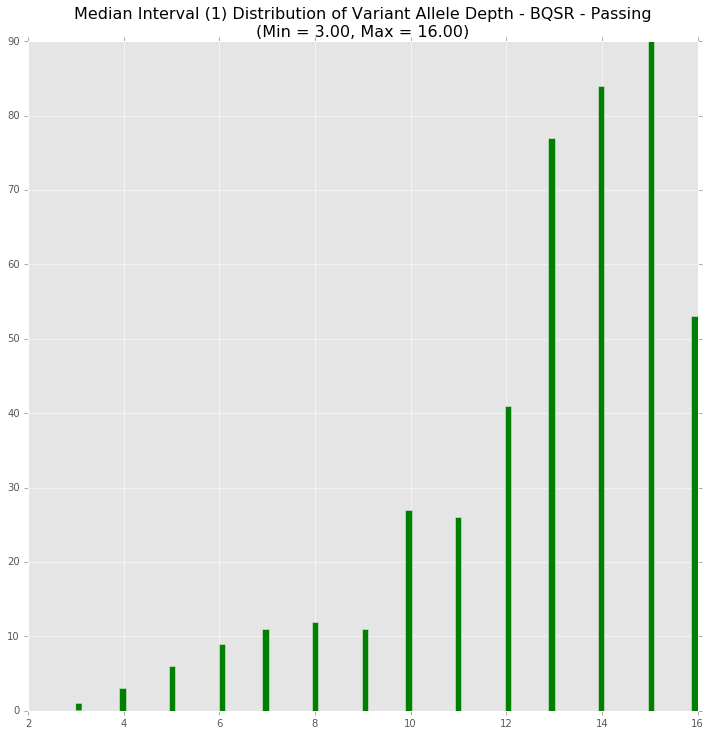

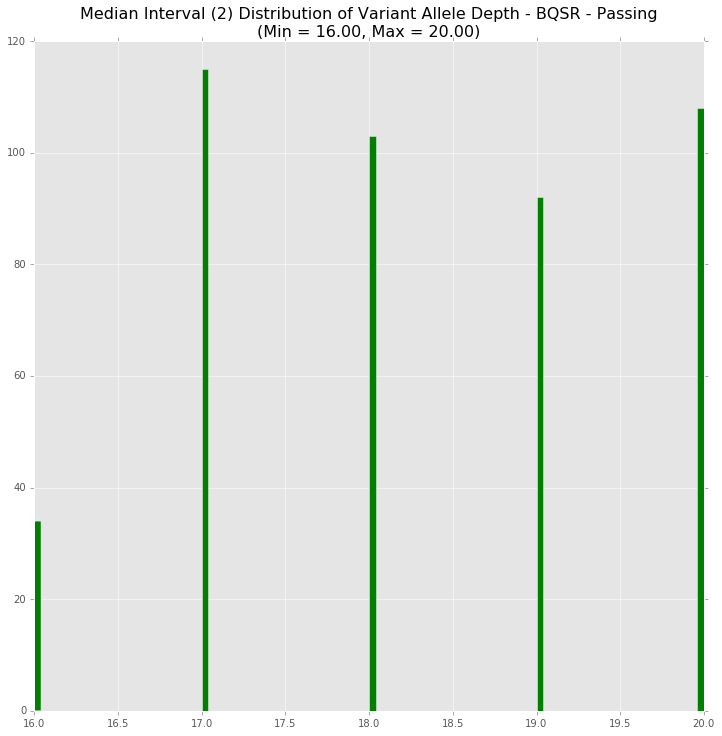

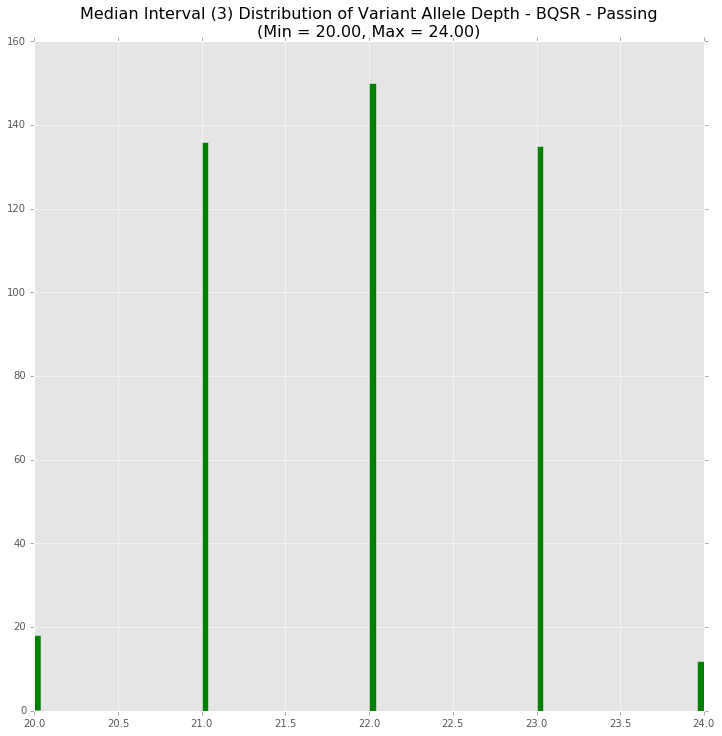

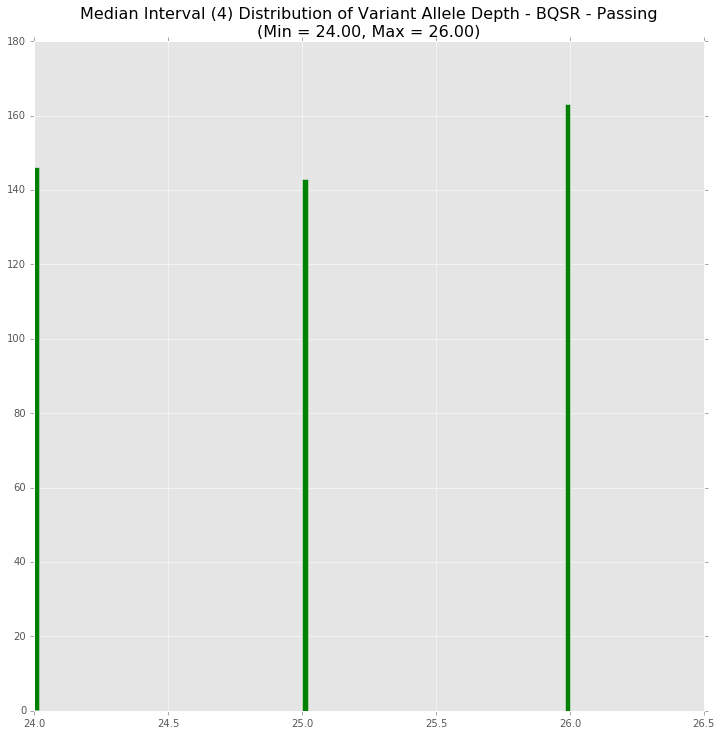

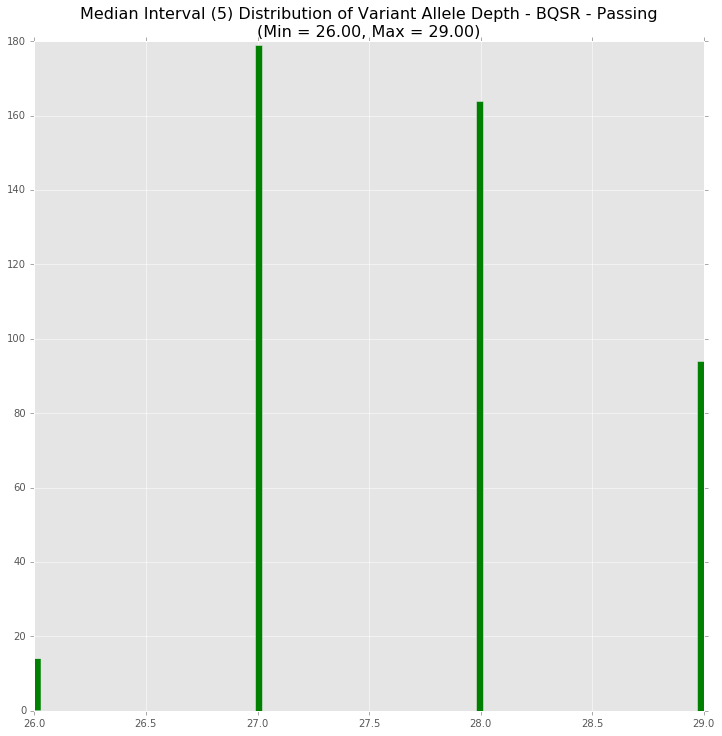

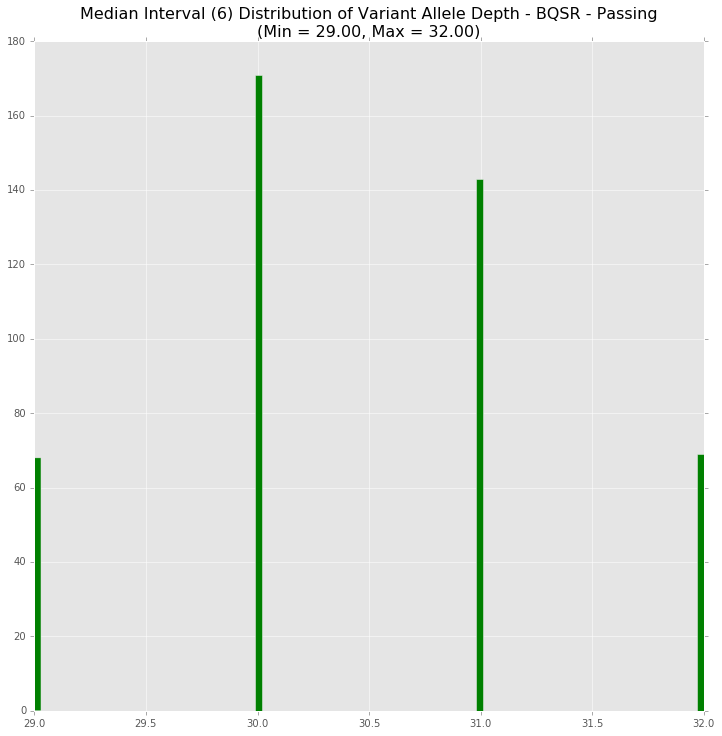

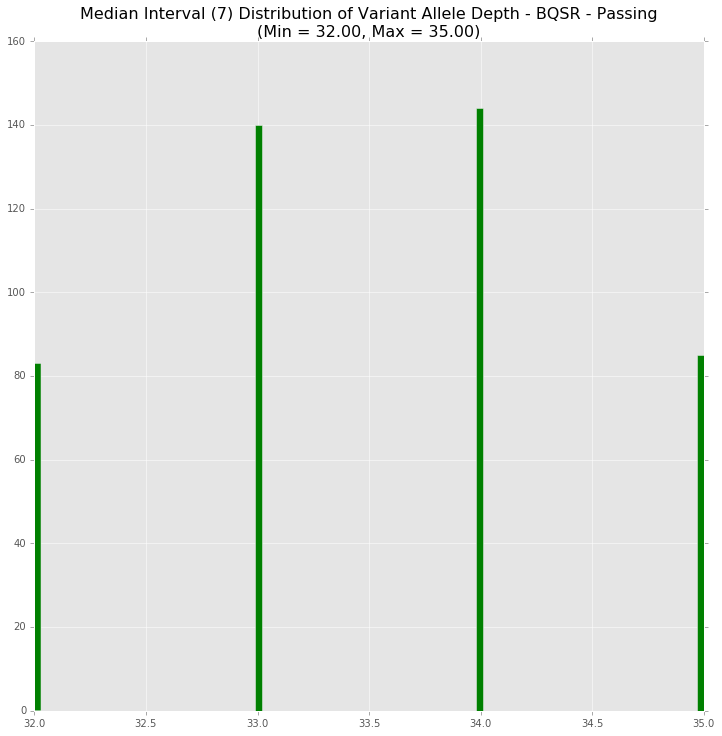

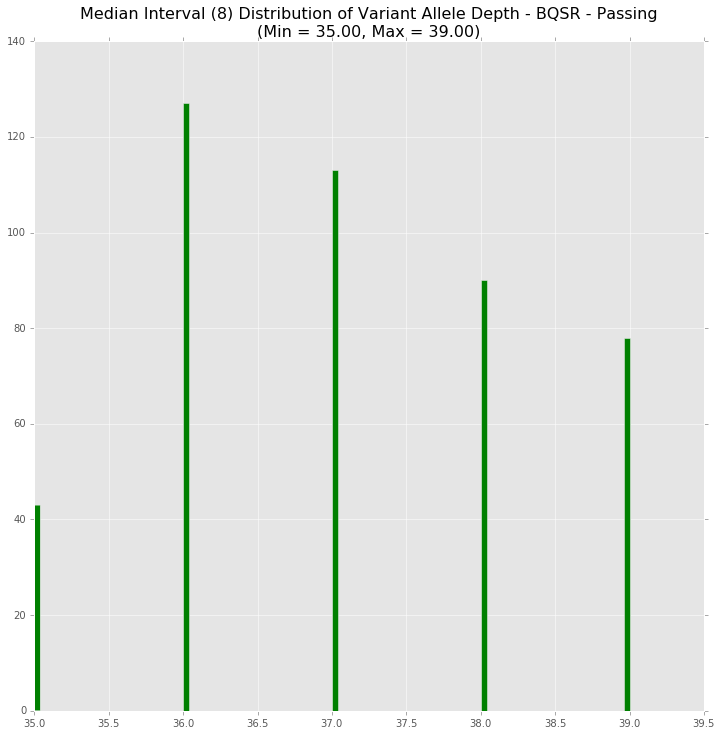

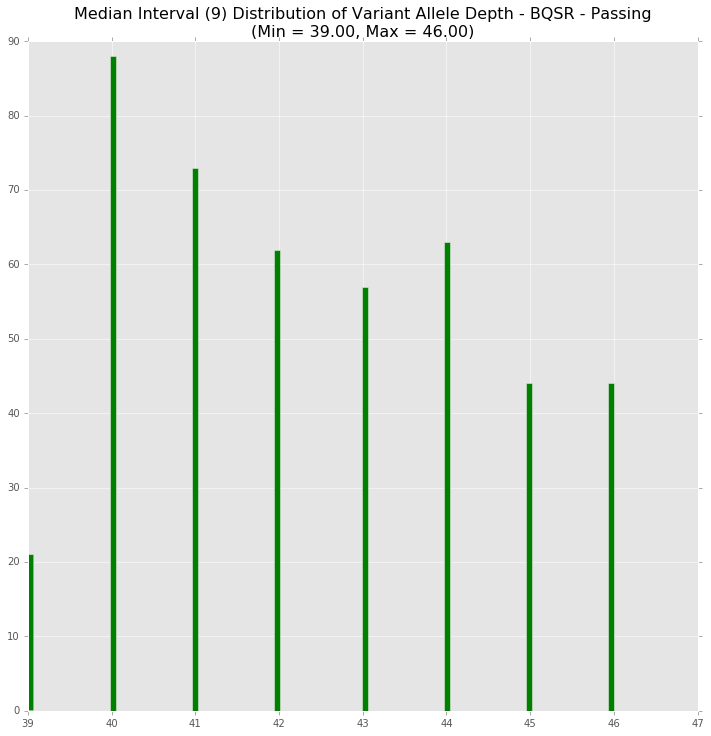

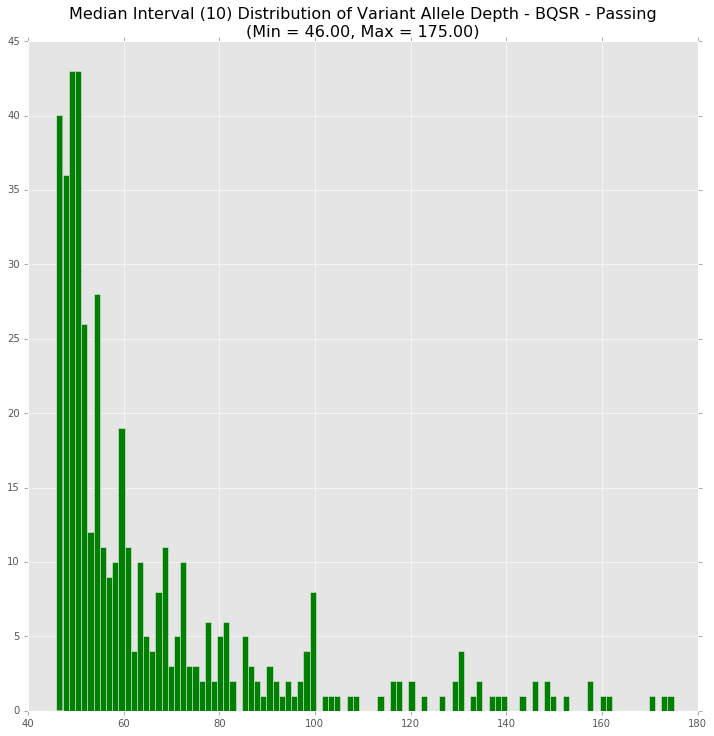

In [23]:
# Plot Median Subsets - BQSR
i = 1
c2AdSplits, c2AdRanges = generateSplits(c2AdVals, 10, median = True)
for split, valRanges in zip(c2AdSplits, c2AdRanges):
    title = "Median Interval (" + str(i) + ") Distribution of Variant Allele Depth - BQSR - Passing\n(Min = %.2f, Max = %.2f)" % valRanges
    simpleHist(split, title = title, bins = 100)
    i += 1

#### Allele Depth Distribution Value Subsets (10) - No BQSR

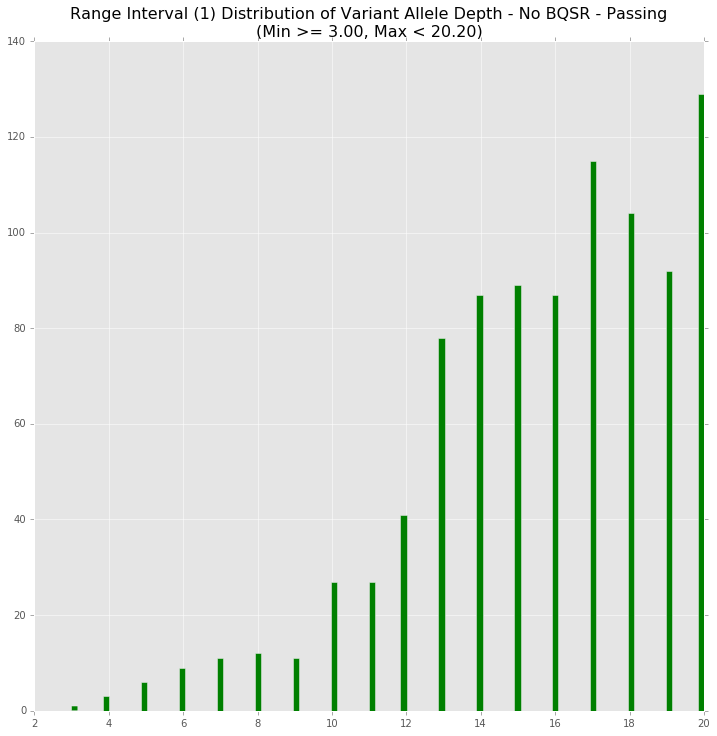

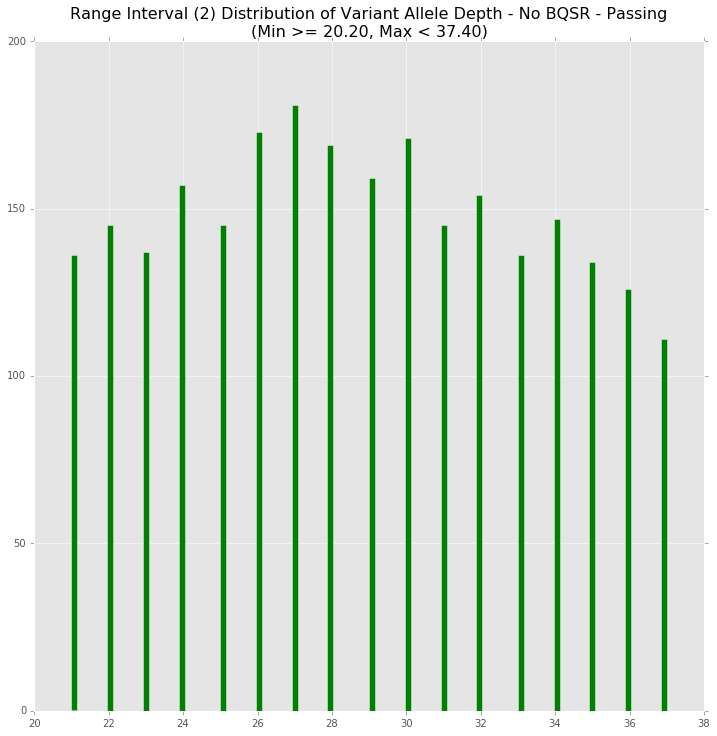

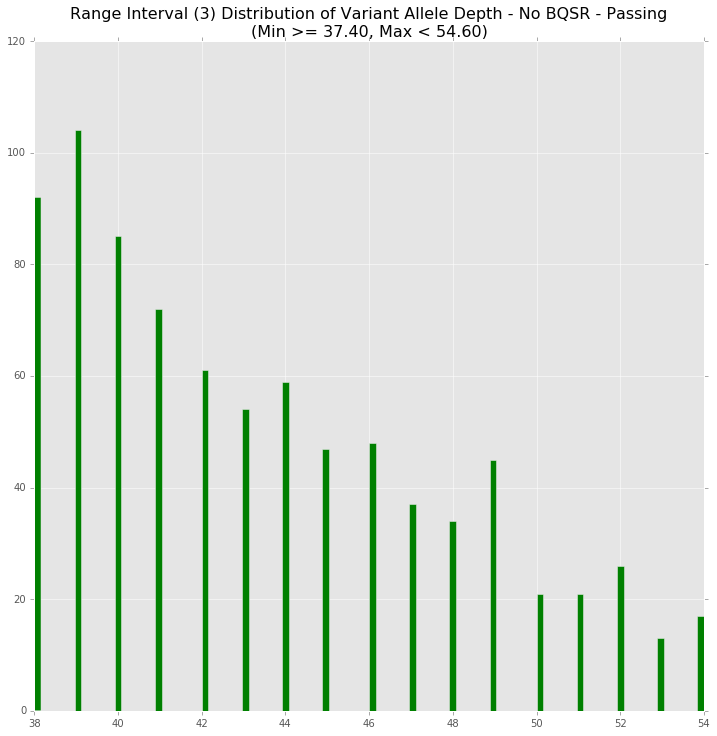

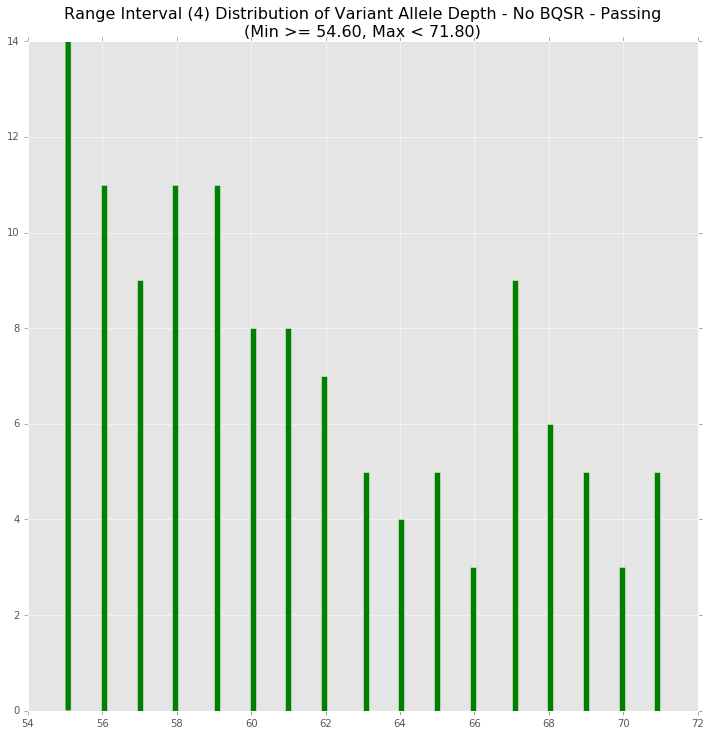

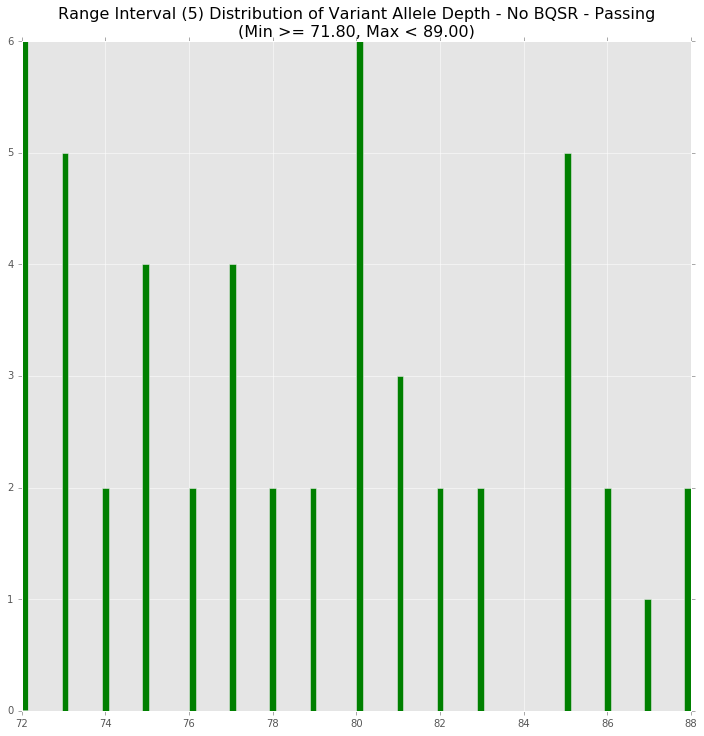

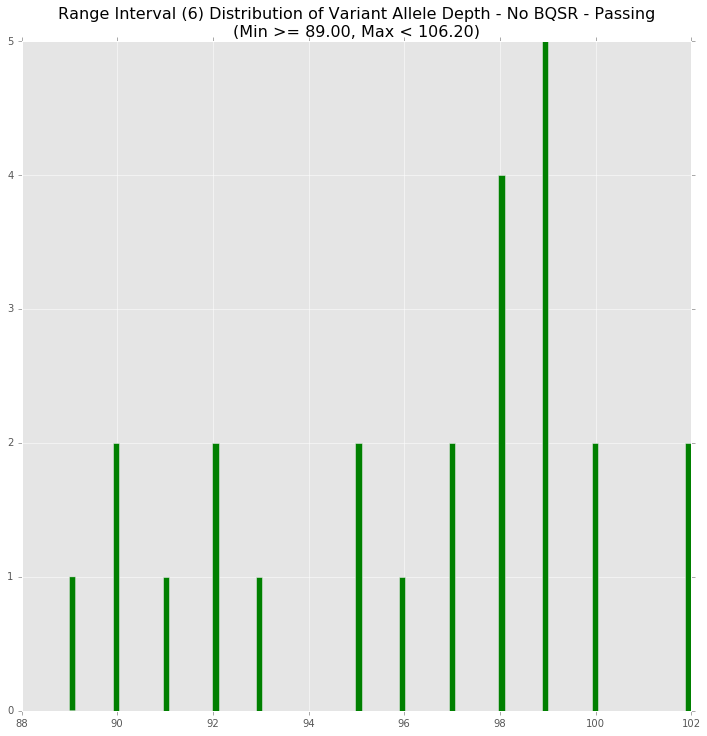

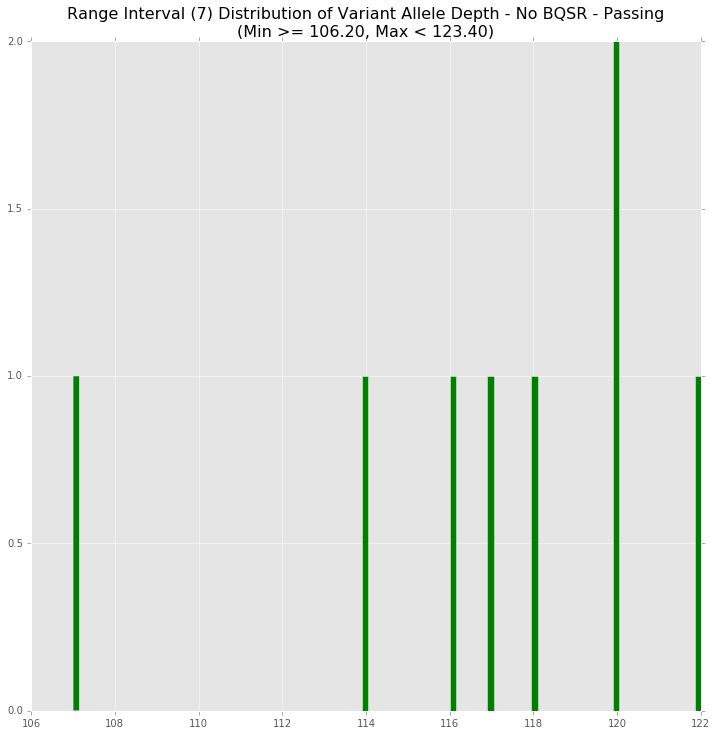

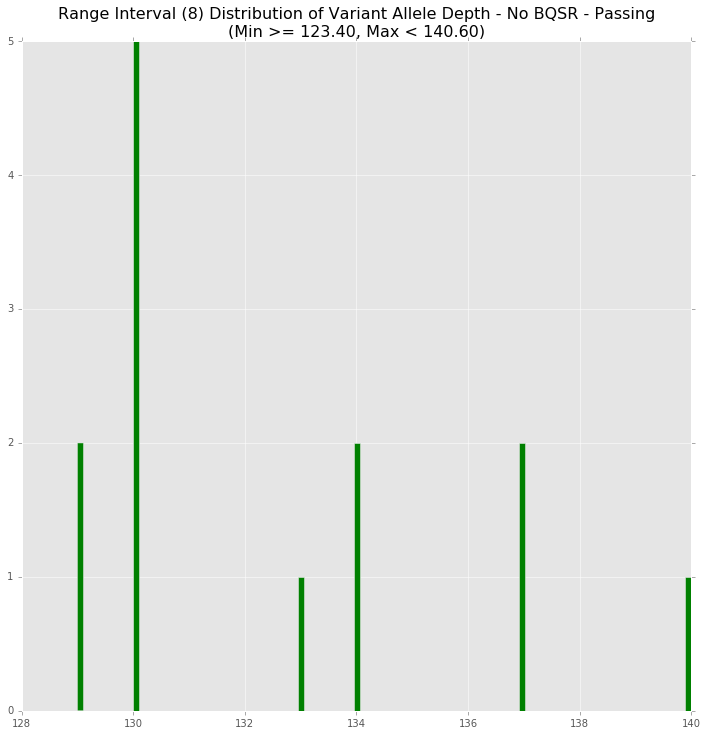

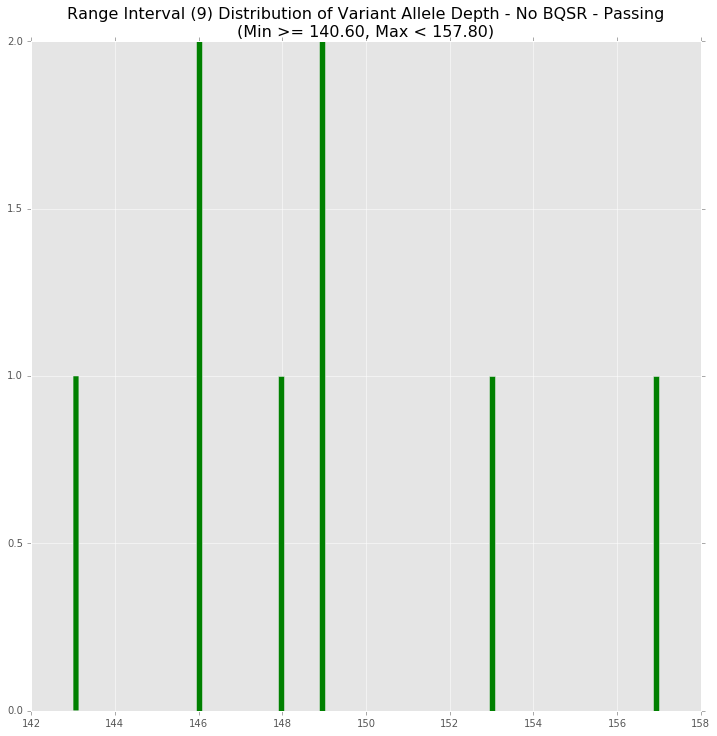

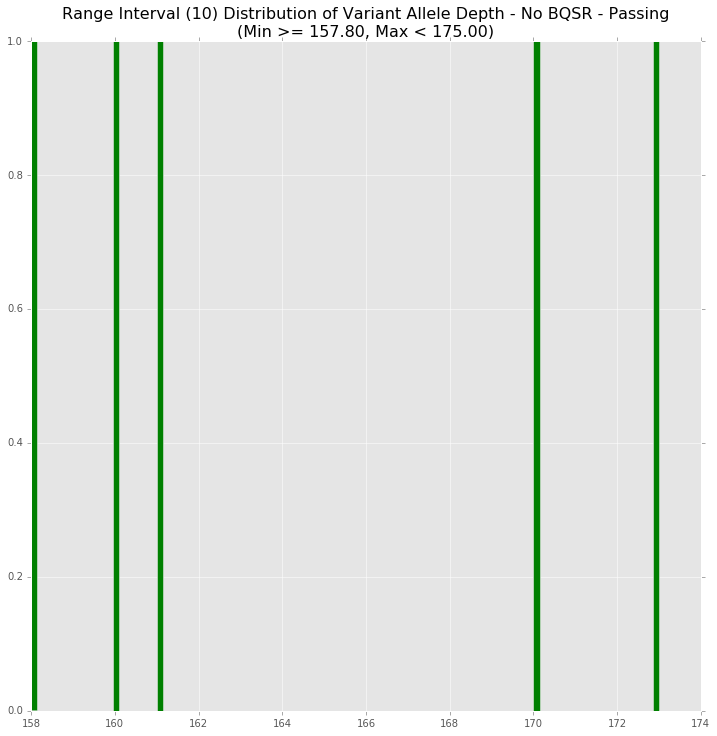

In [24]:
# Plot Value Subsets - No BQSR
i = 1
c1AdSplits, c1AdRanges = generateSplits(c1AdVals, 10)
for split, valRanges in zip(c1AdSplits, c1AdRanges):
    title = "Range Interval (" + str(i) + ") Distribution of Variant Allele Depth - No BQSR - Passing\n(Min >= %.2f, Max < %.2f)" % valRanges
    simpleHist(split, title = title, bins = 100)
    i += 1

#### Allele Depth Distribution Value Subsets (10) - BQSR

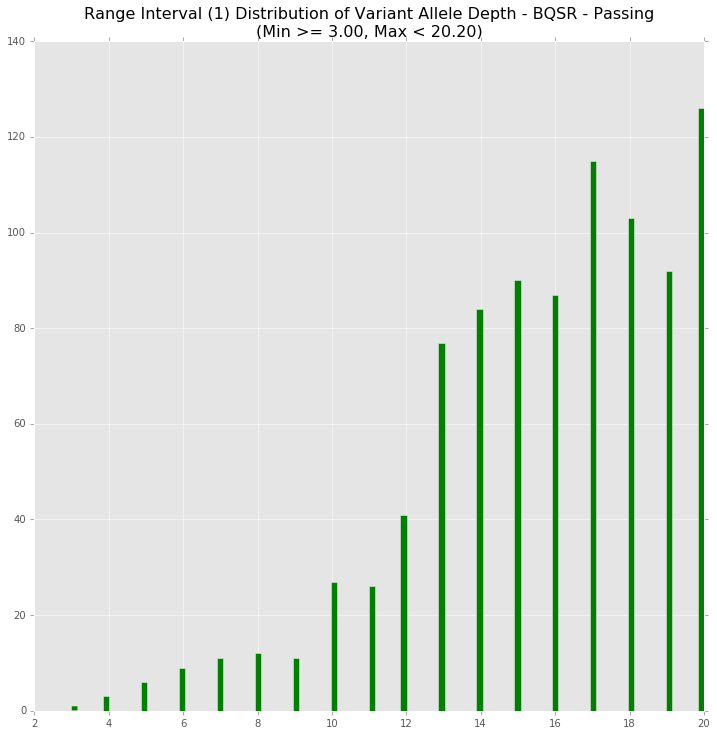

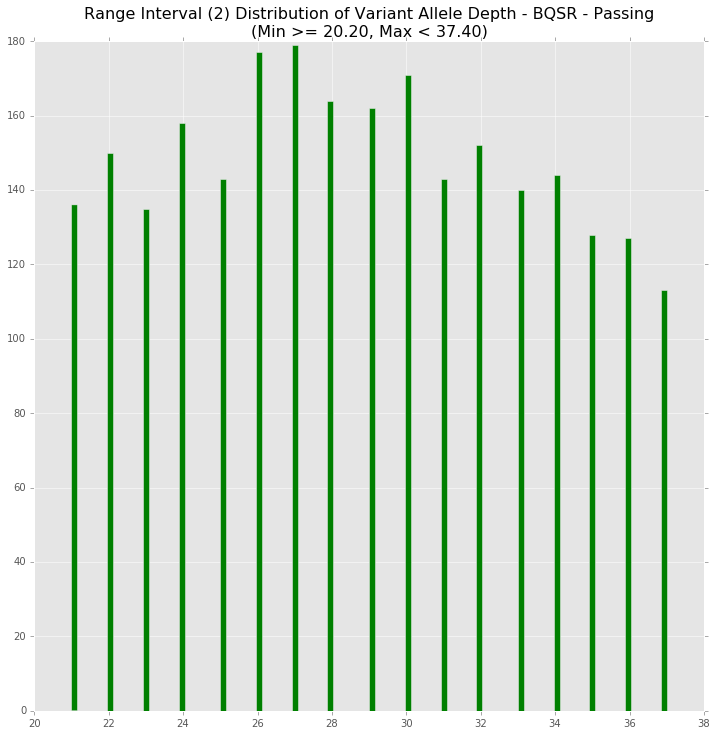

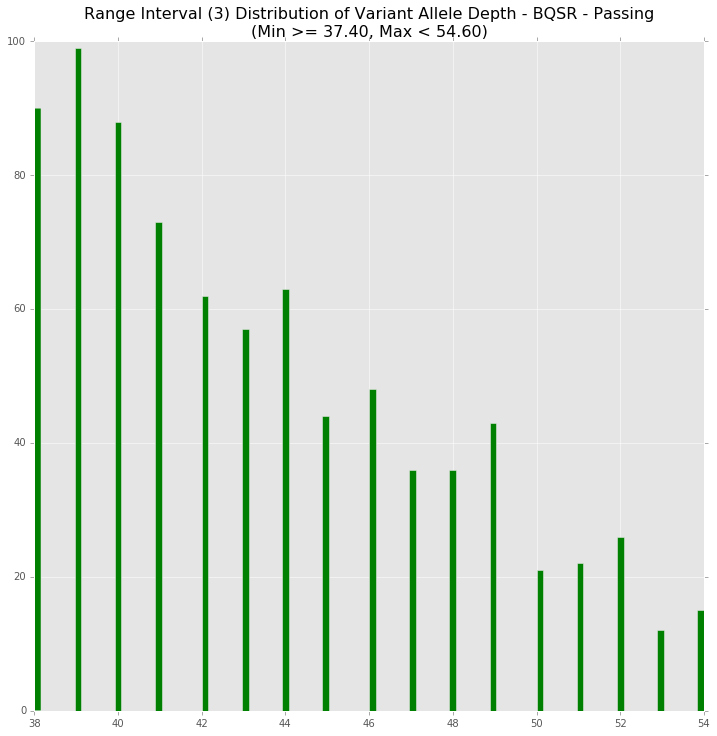

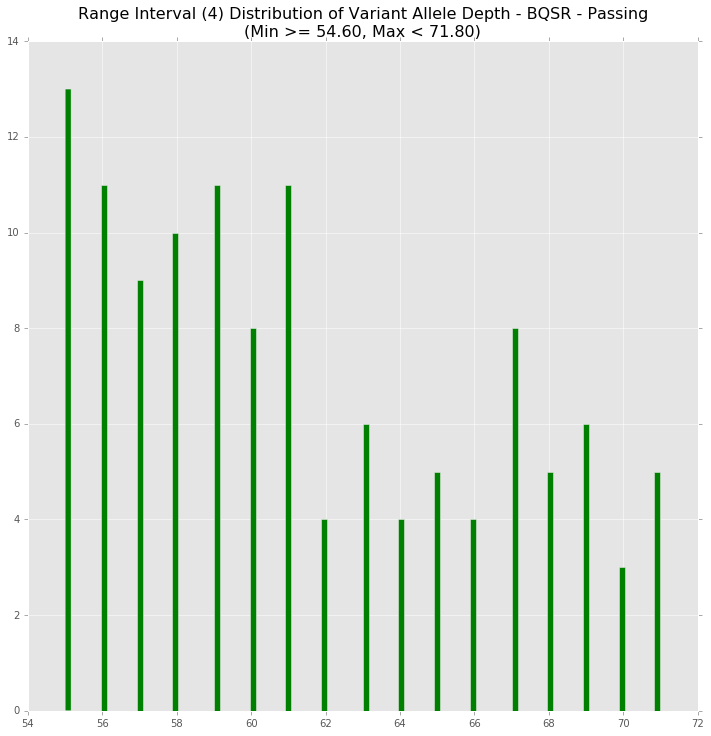

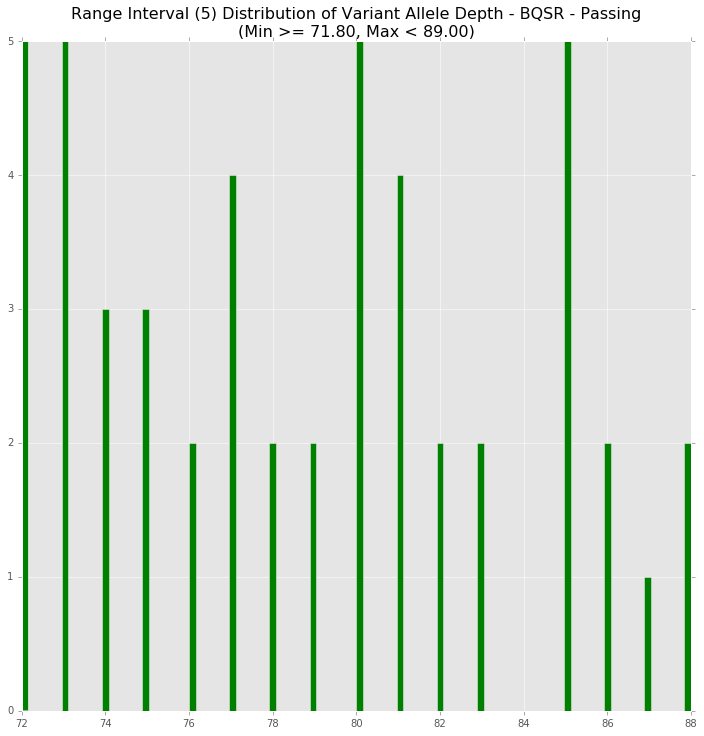

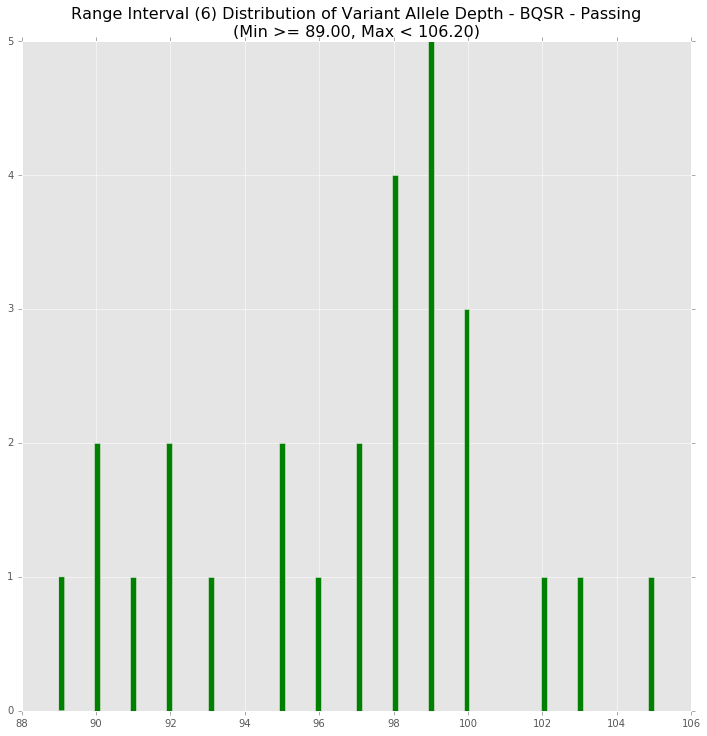

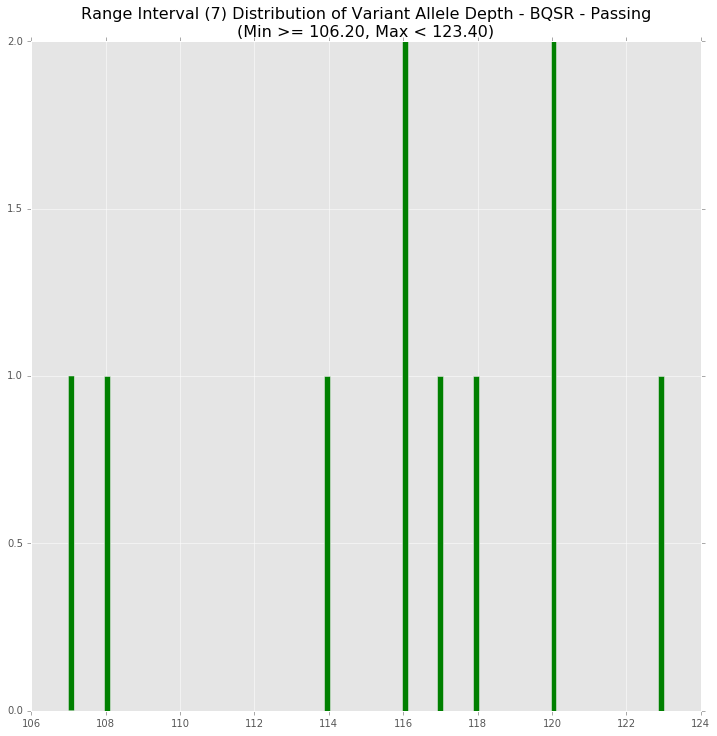

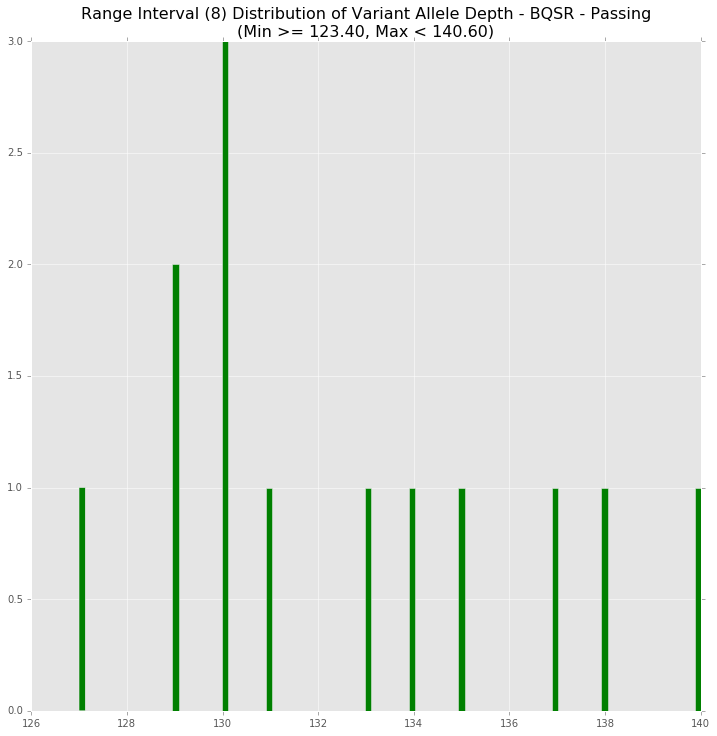

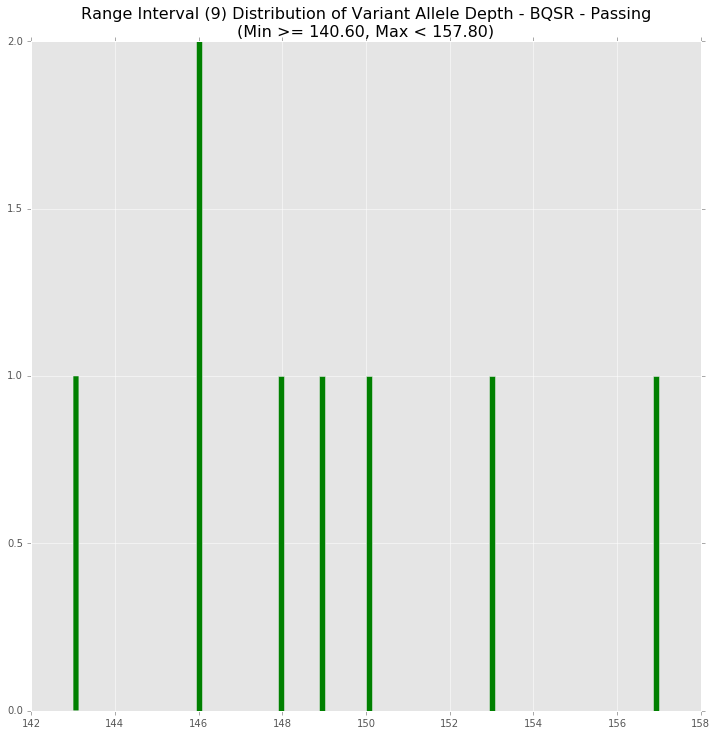

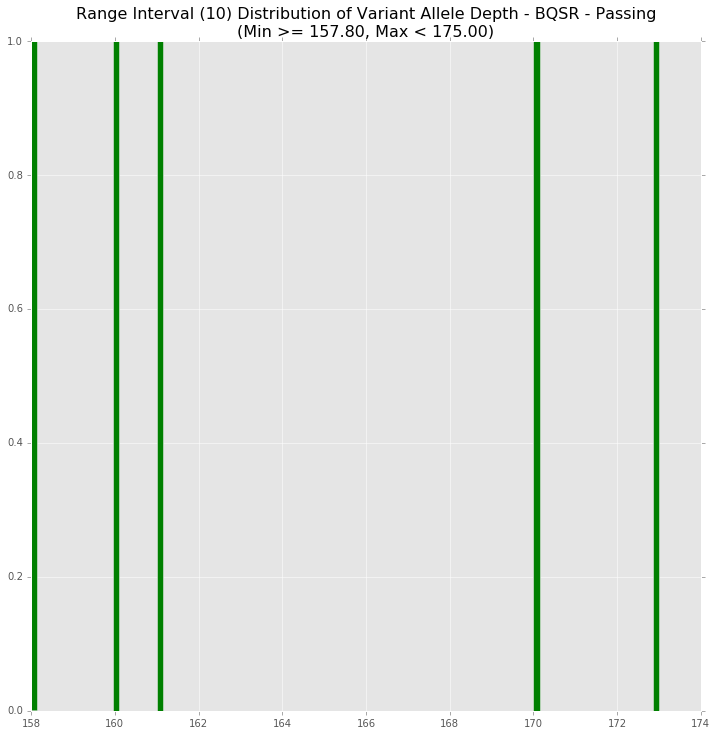

In [25]:
# Plot Value Subsets - BQSR
i = 1
c2AdSplits, c2AdRanges = generateSplits(c2AdVals, 10)
for split, valRanges in zip(c2AdSplits, c2AdRanges):
    title = "Range Interval (" + str(i) + ") Distribution of Variant Allele Depth - BQSR - Passing\n(Min >= %.2f, Max < %.2f)" % valRanges
    simpleHist(split, title = title, bins = 100)
    i += 1

### Ranged Allele Frequency Distributions - Passing

In [26]:
# Get Metrics
c1AfVals = sorted(getFormatData(c1Passing, key="AF")[0])
c2AfVals = sorted(getFormatData(c2Passing, key="AF")[0])

print("\nBelow are the last 10 positions in the No BQSR condition allele frequency array. No apparent outliers.\n")
print(c1AfVals[(len(c1AfVals) - 10):len(c1AfVals)])
print("\nBelow are the last 10 positions in the BQSR condition allele frequency array. No apparent outliers.\n")
print(c2AfVals[(len(c2AfVals) - 10):len(c2AfVals)])


Below are the last 10 positions in the No BQSR condition allele frequency array. No apparent outliers.

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]

Below are the last 10 positions in the BQSR condition allele frequency array. No apparent outliers.

[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]


#### Allele Frequency Distributions - No BQSR & BQSR - Passing

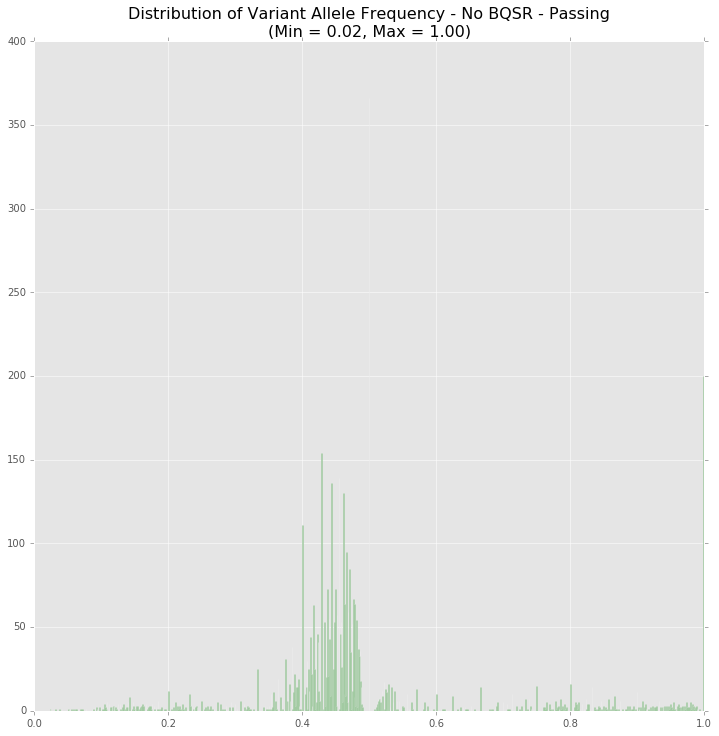

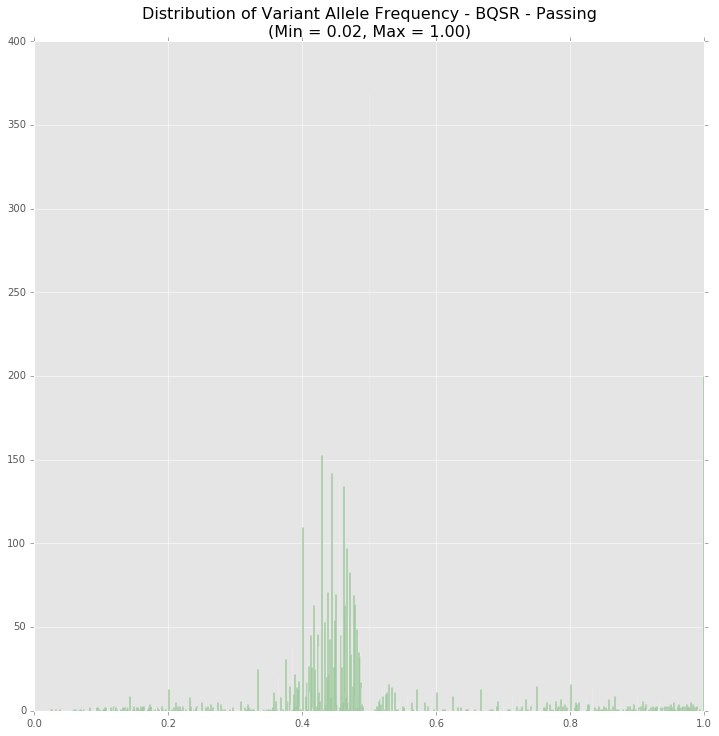

In [27]:
# Plot Complete Distribution - No BQSR
c1AfMin = min(c1AfVals)
c1AfMax = max(c1AfVals)
title = "Distribution of Variant Allele Frequency - No BQSR - Passing\n(Min = %.2f, Max = %.2f)" % (c1AfMin, c1AfMax)
simpleHist(c1AfVals, title = title, bins = 1000)

# Plot Complete Distribution - BQSR
c2AfMin = min(c1AfVals)
c2AfMax = max(c1AfVals)
title = "Distribution of Variant Allele Frequency - BQSR - Passing\n(Min = %.2f, Max = %.2f)" % (c2AfMin, c2AfMax)
simpleHist(c2AfVals, title = title, bins = 1000)

#### Allele Frequency Distribution Median Subsets (10) - BQSR

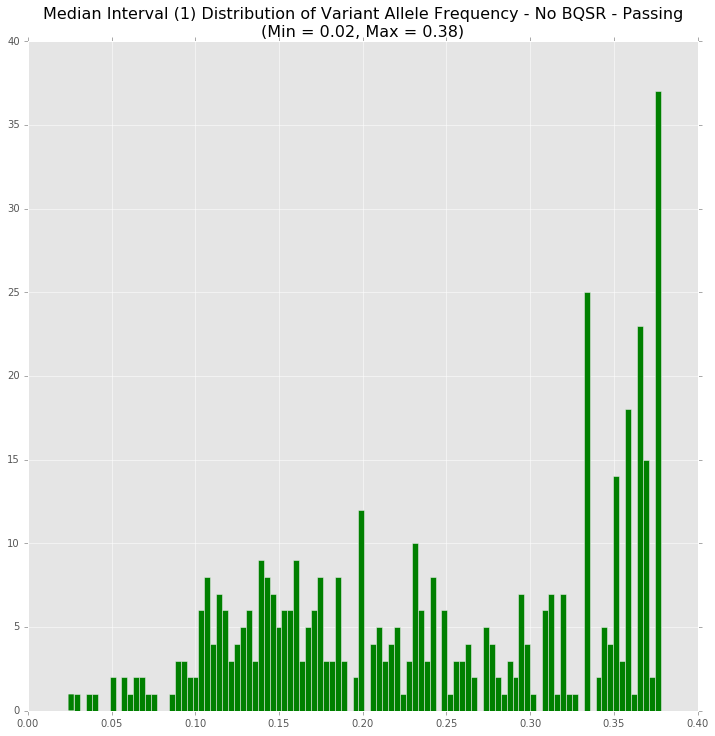

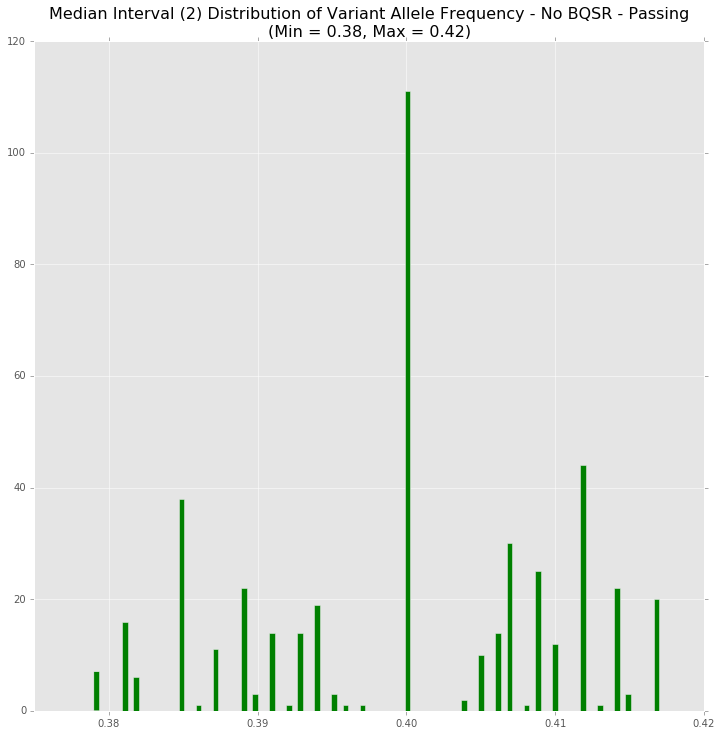

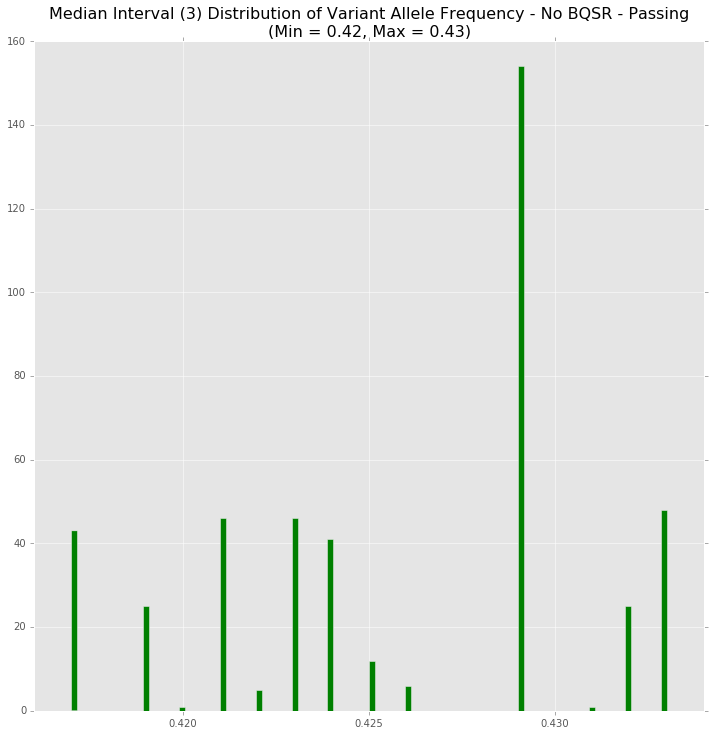

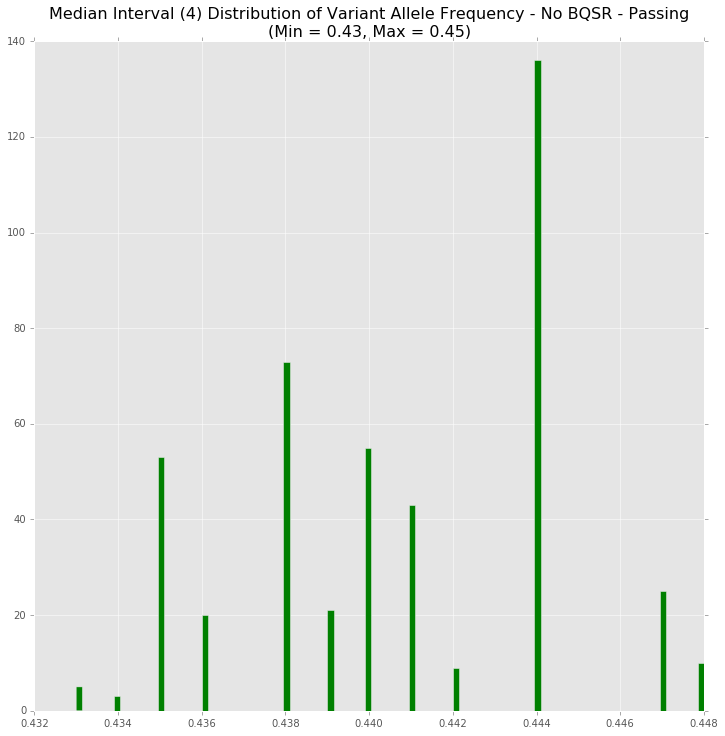

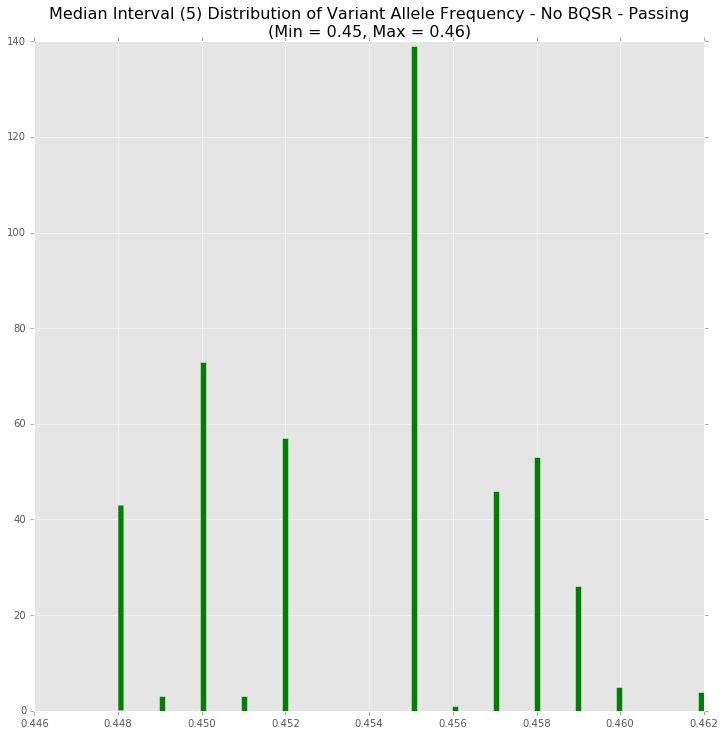

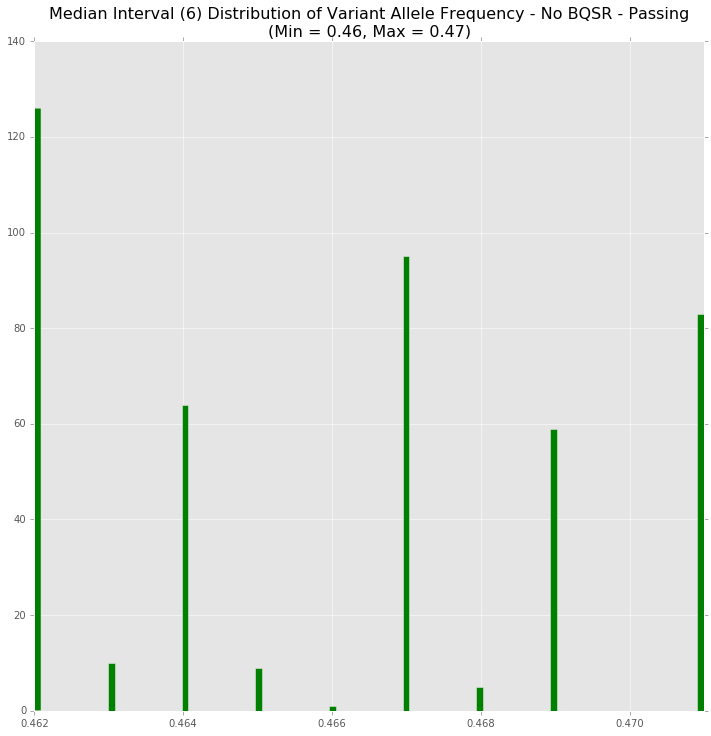

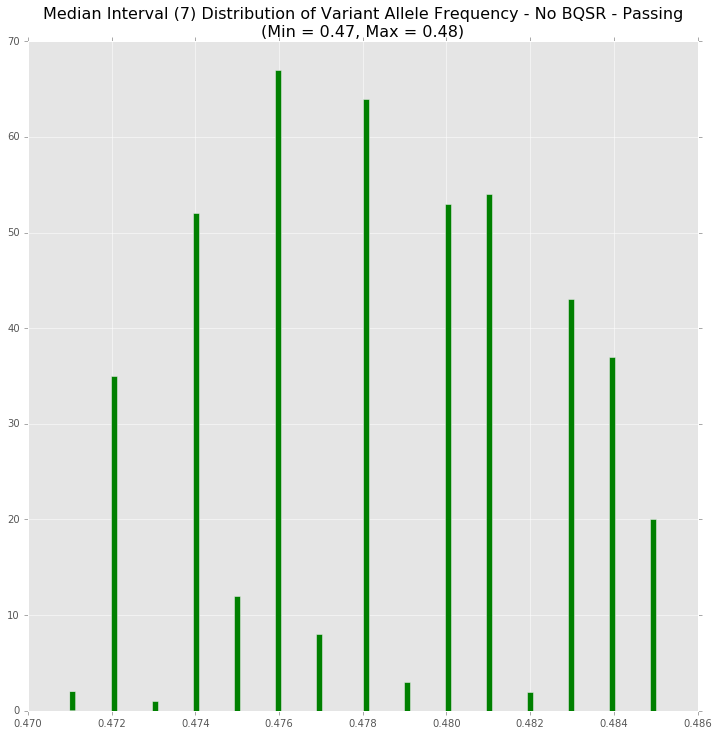

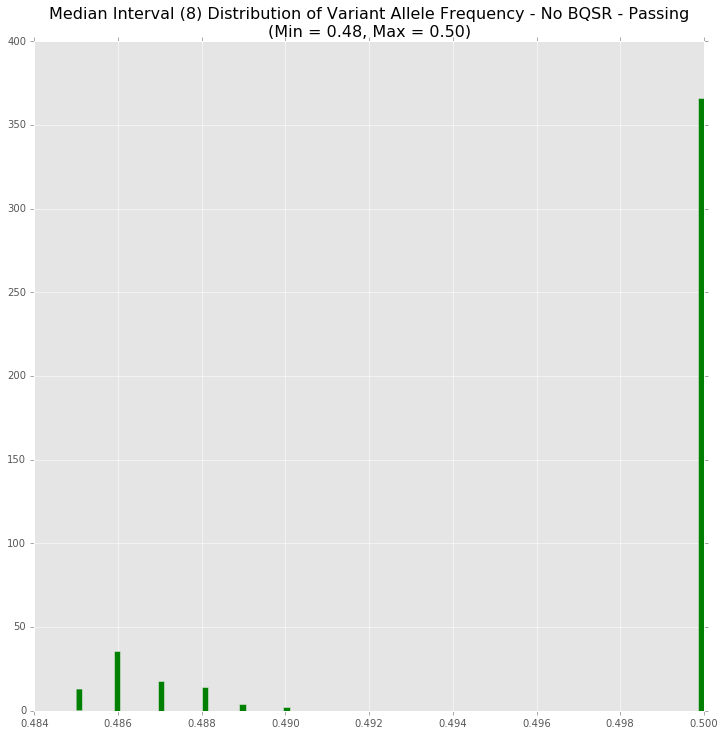

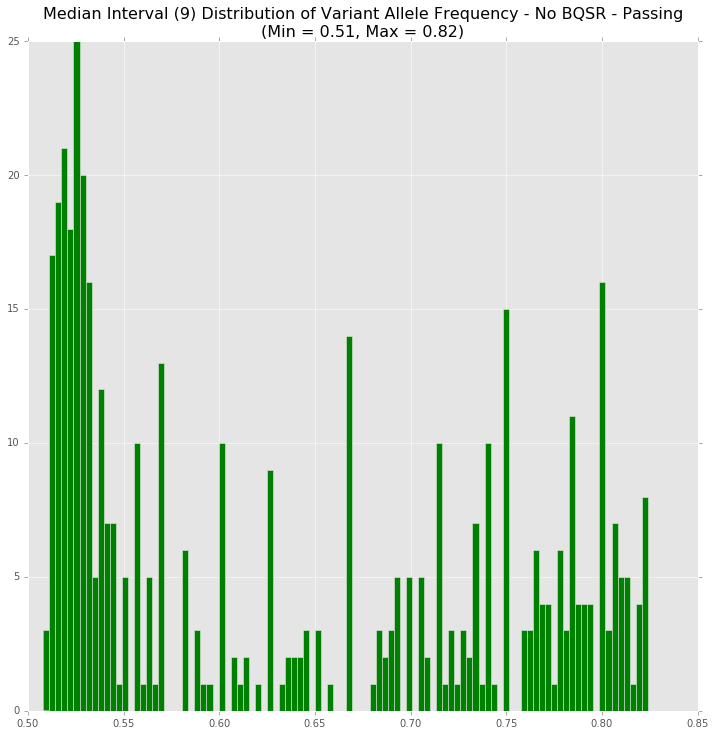

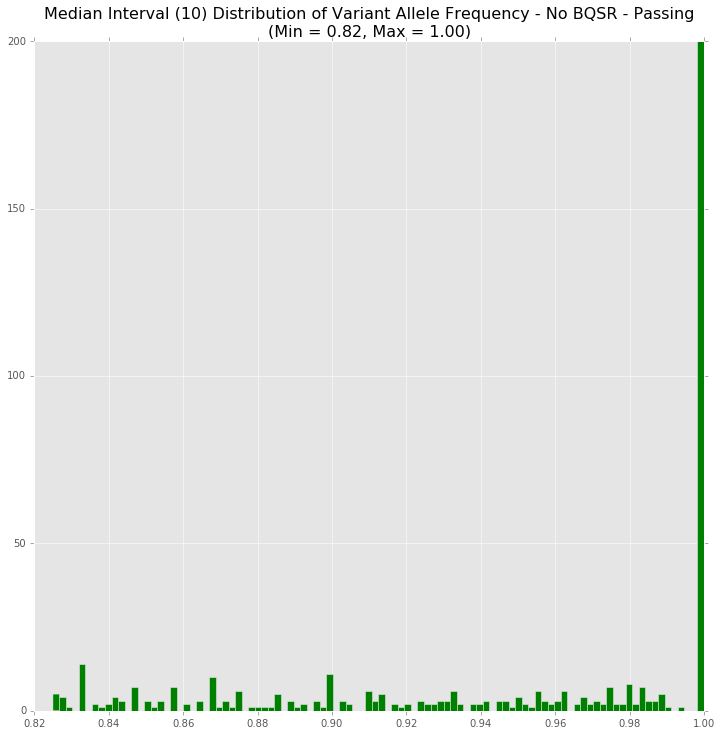

In [28]:
# Plot Each Median Subset - No BQSR
i = 1
c1AfSplits, c1AfRanges = generateSplits(c1AfVals, 10, median = True)
for split, valRanges in zip(c1AfSplits, c1AfRanges):
    title = "Median Interval (" + str(i) + ") Distribution of Variant Allele Frequency - No BQSR - Passing\n(Min = %.2f, Max = %.2f)" % valRanges
    simpleHist(split, title = title, bins = 100)
    i += 1

#### Allele Frequency Distribution Median Subsets (10) - BQSR

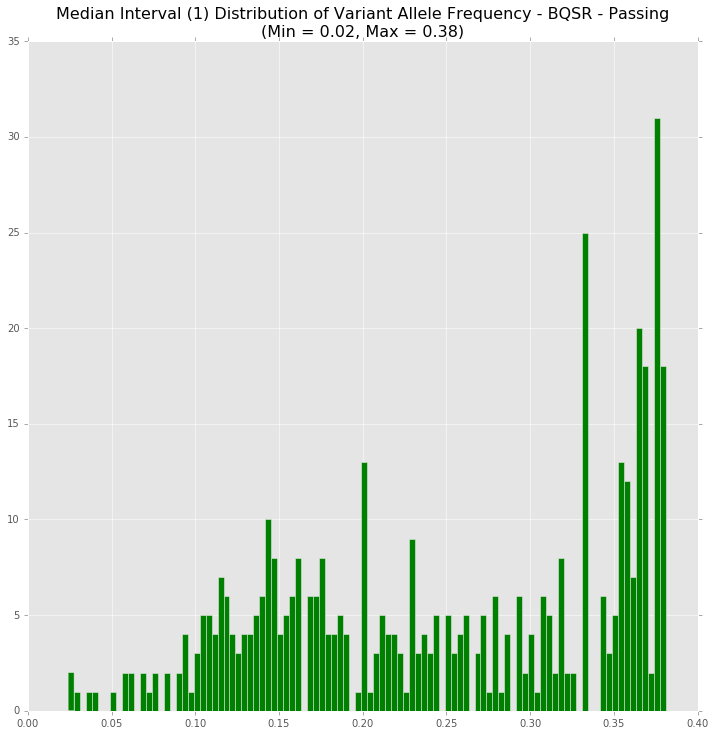

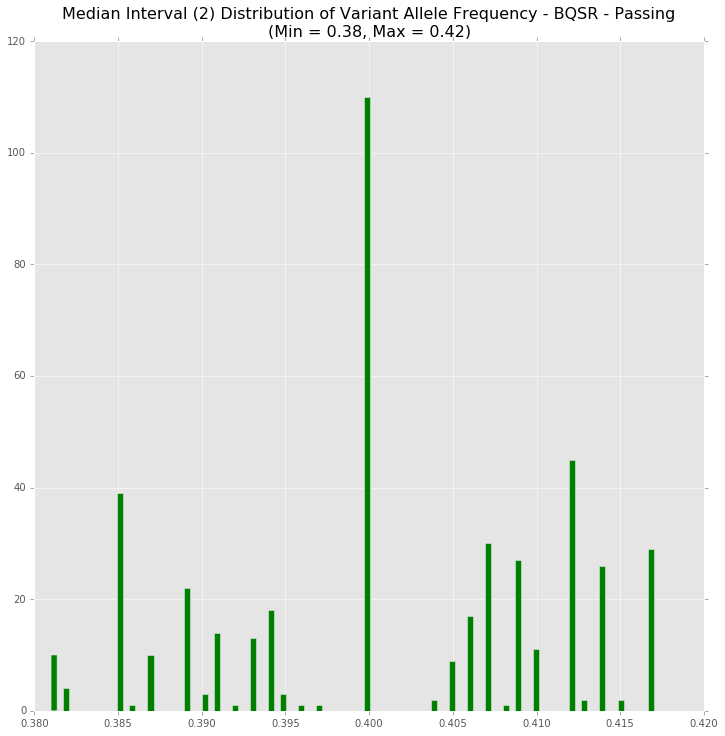

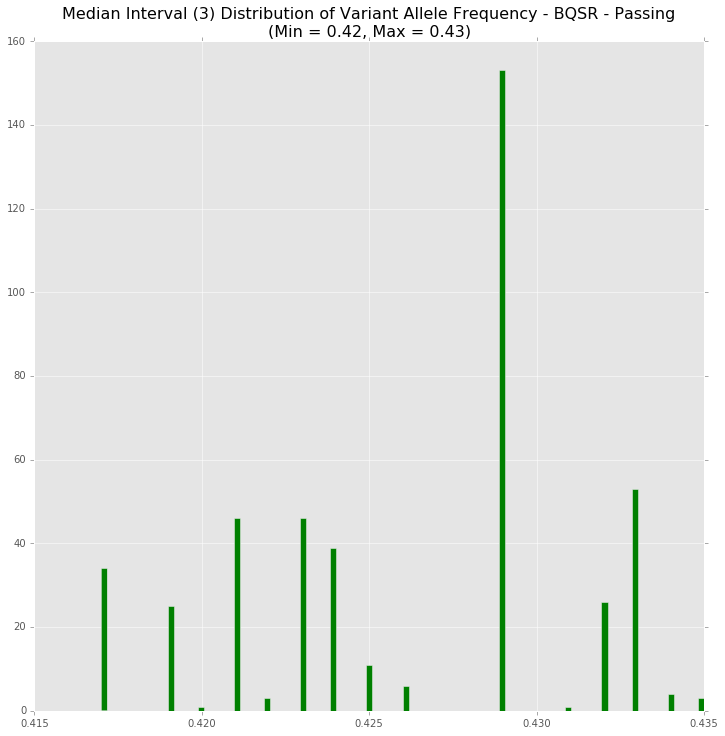

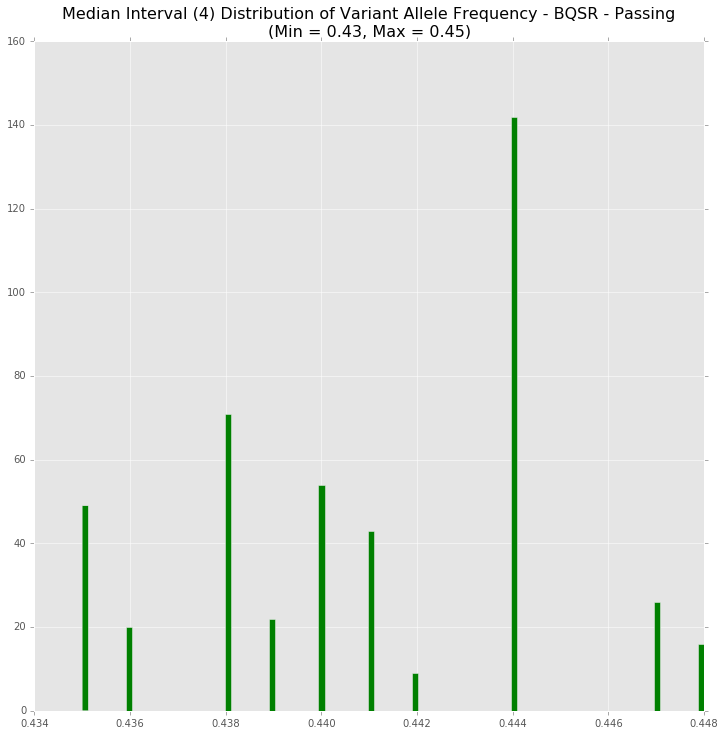

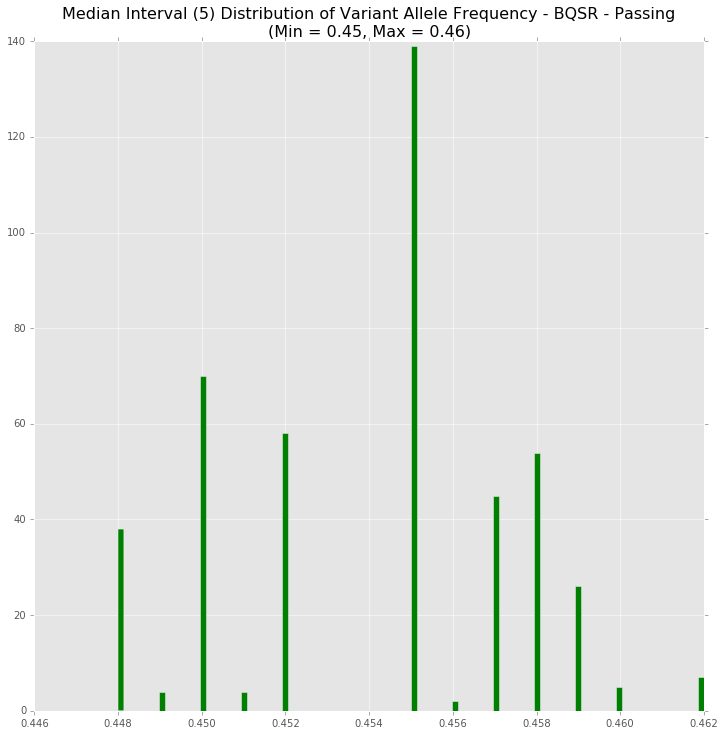

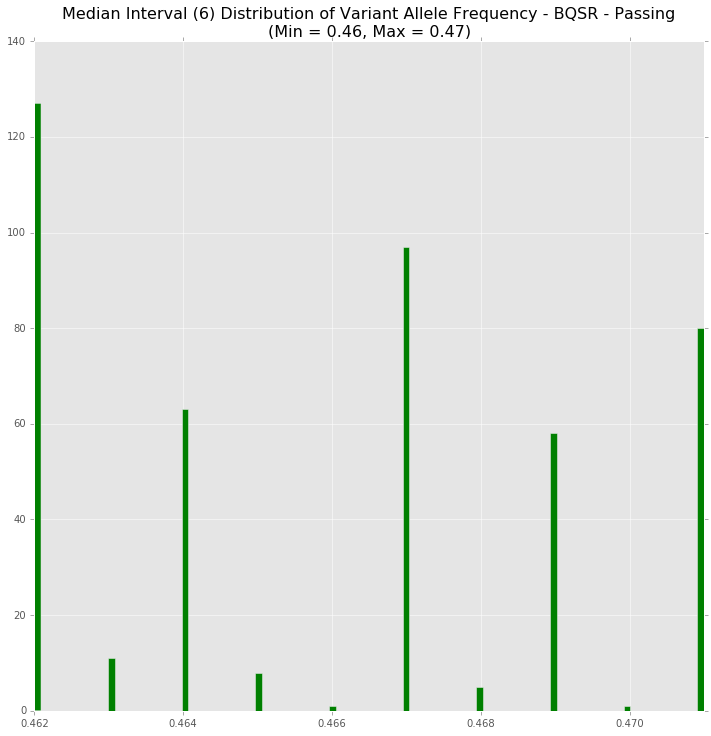

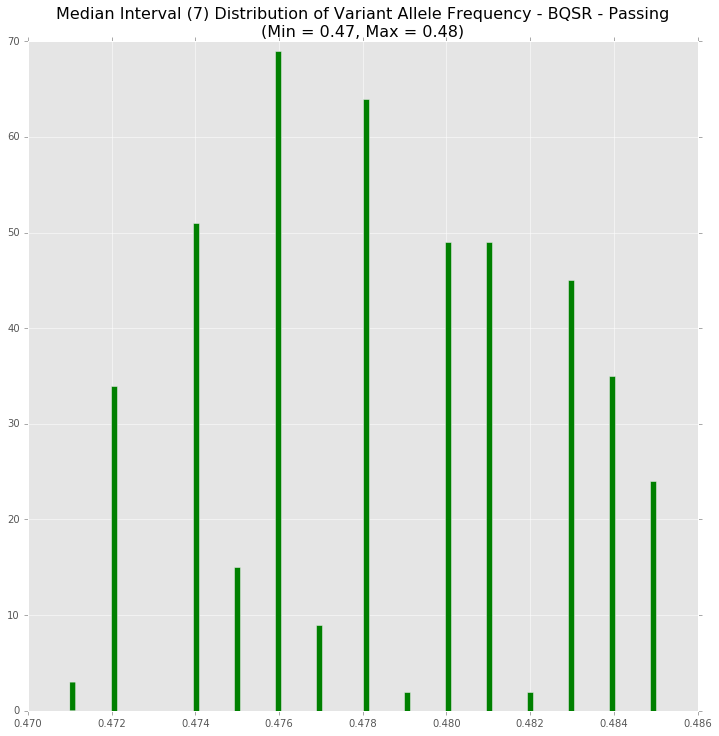

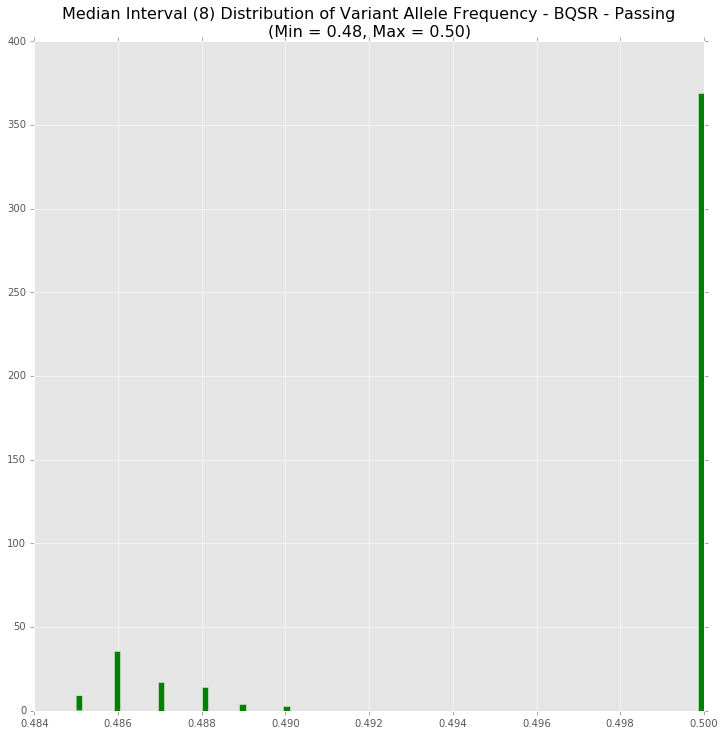

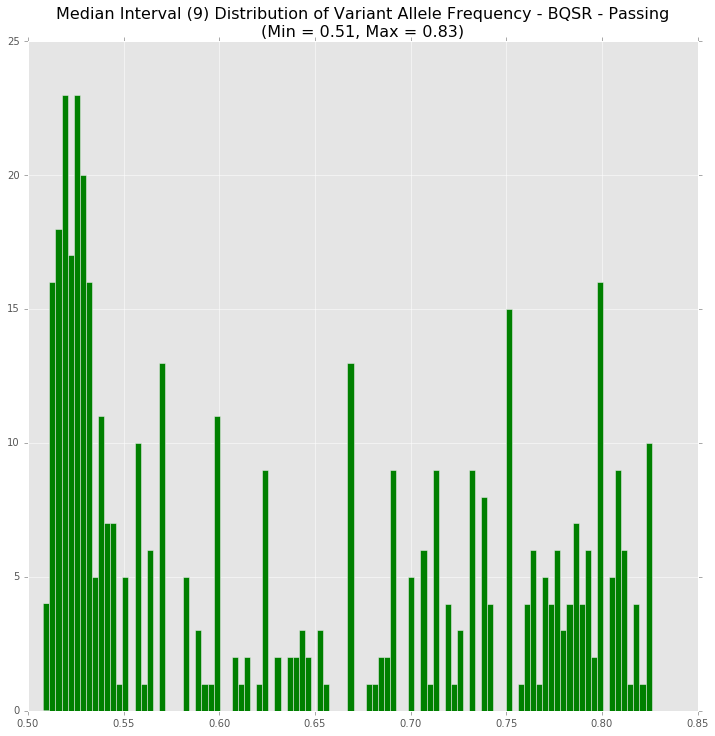

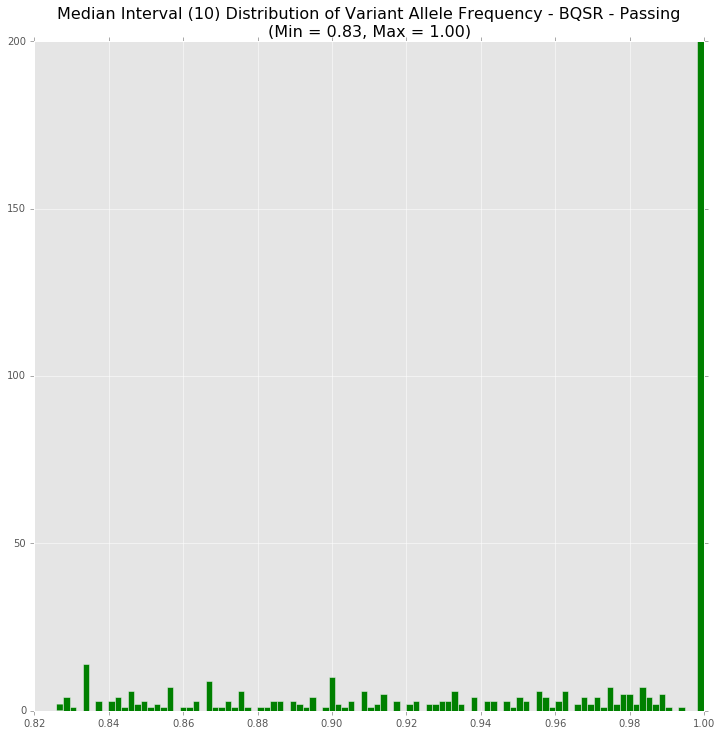

In [29]:
# Plot Each Median Subset - BQSR
i = 1
c2AfSplits, c2AfRanges = generateSplits(c2AfVals, 10, median = True)
for split, valRanges in zip(c2AfSplits, c2AfRanges):
    title = "Median Interval (" + str(i) + ") Distribution of Variant Allele Frequency - BQSR - Passing\n(Min = %.2f, Max = %.2f)" % valRanges
    simpleHist(split, title = title, bins = 100)
    i += 1

#### Allele Depth Distribution Value Subsets (10) - No BQSR

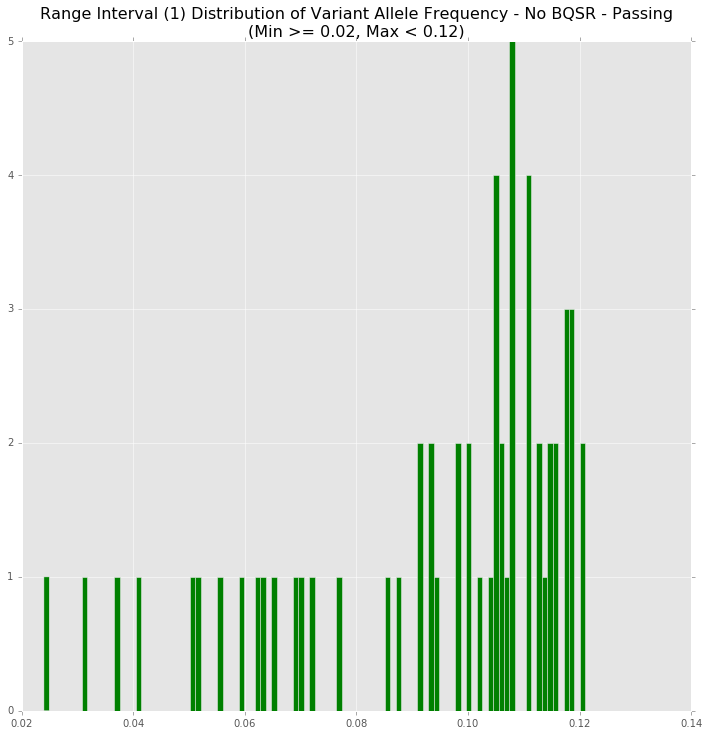

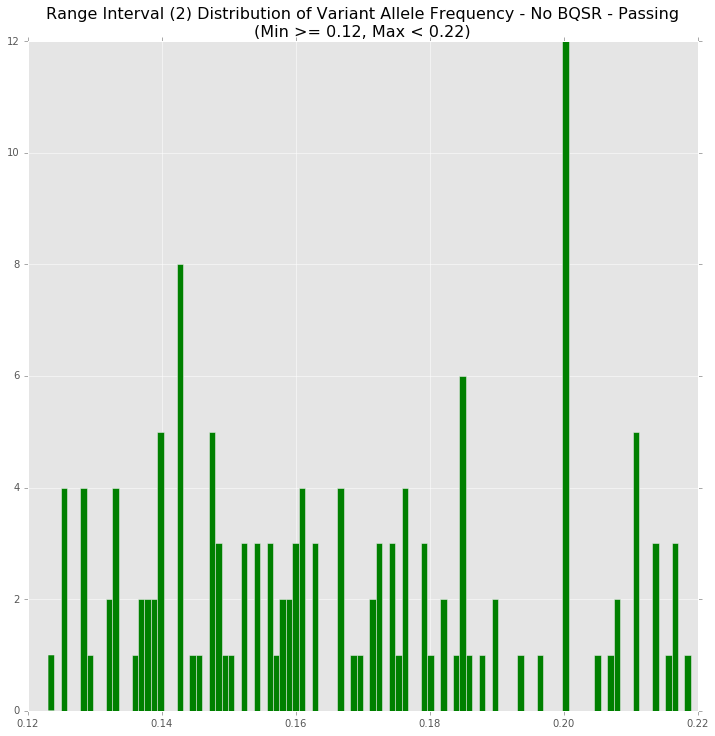

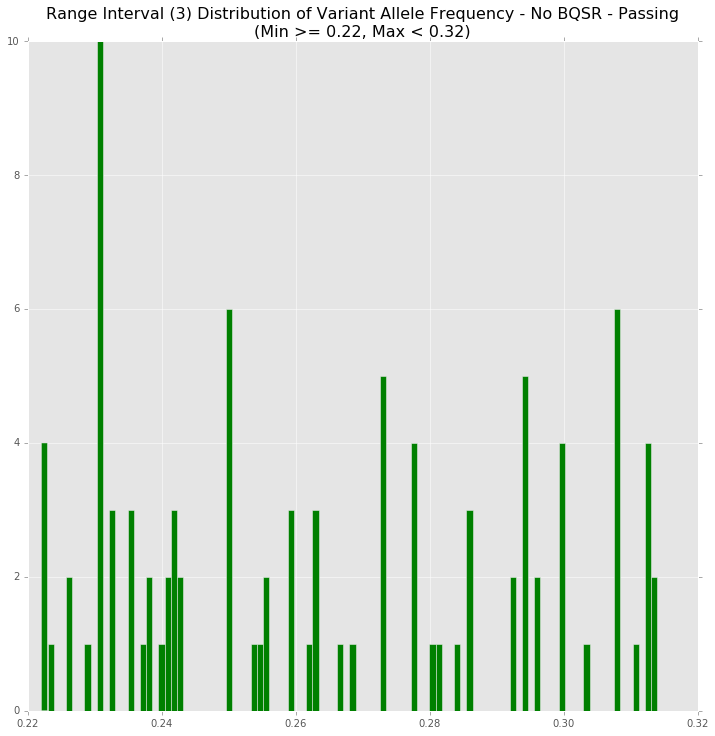

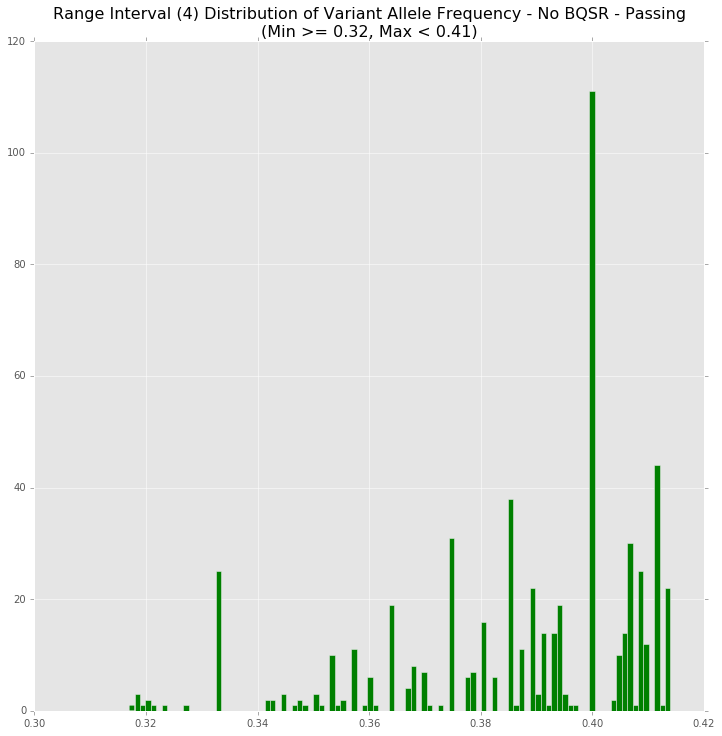

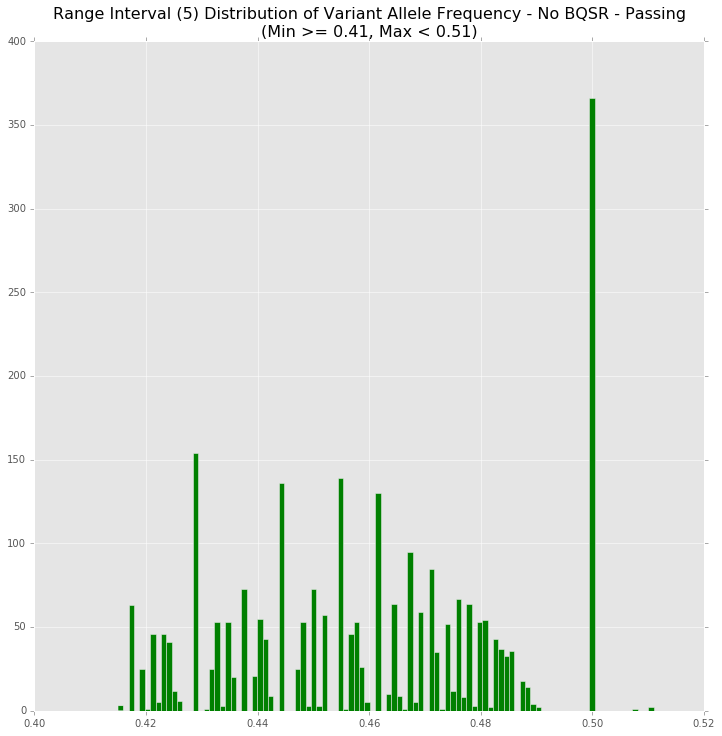

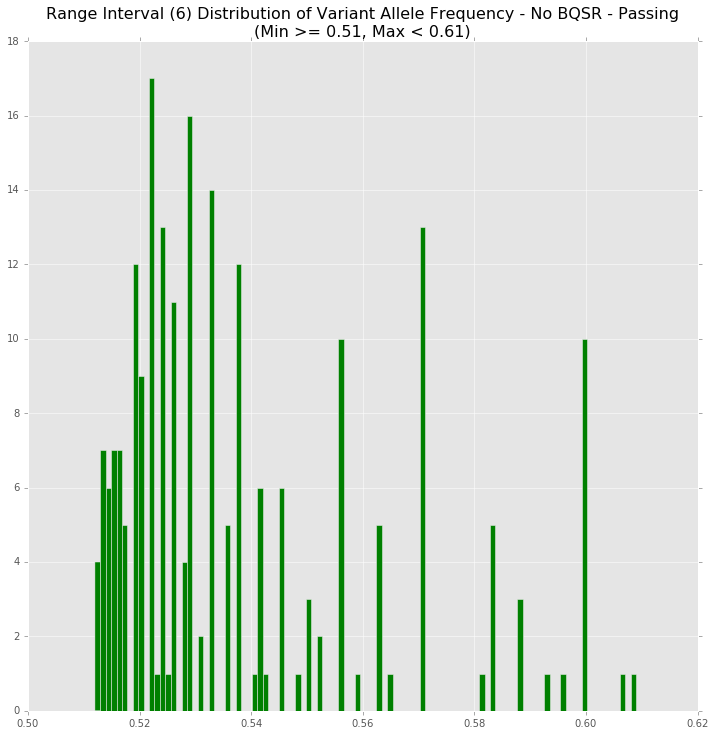

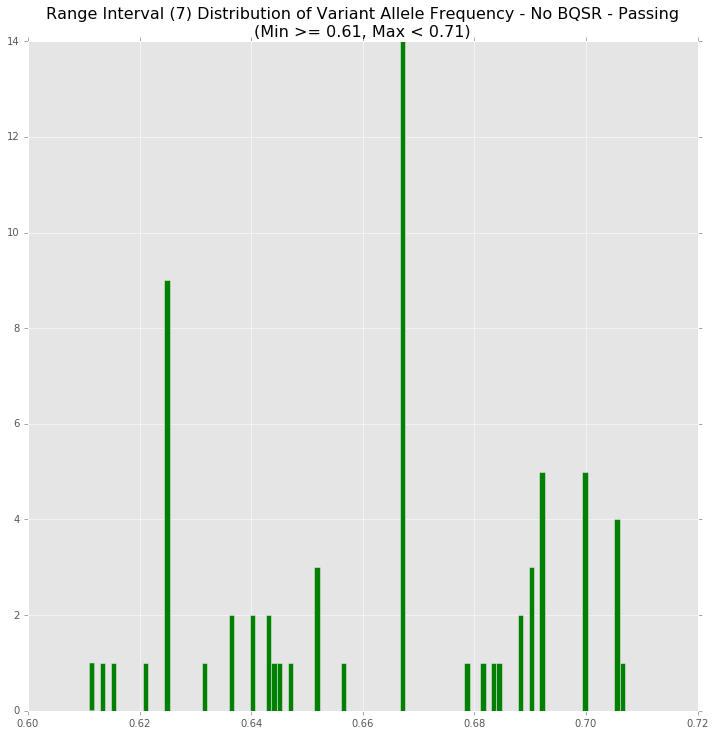

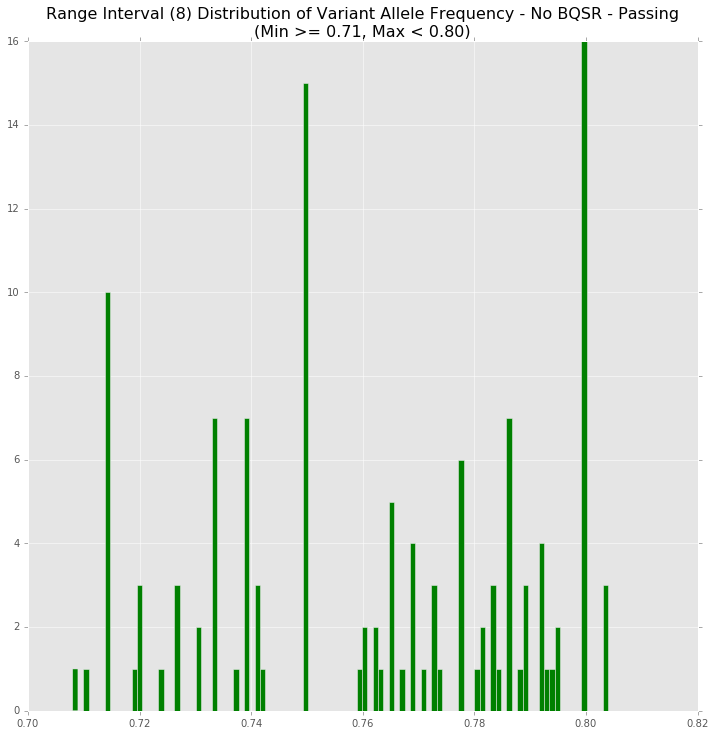

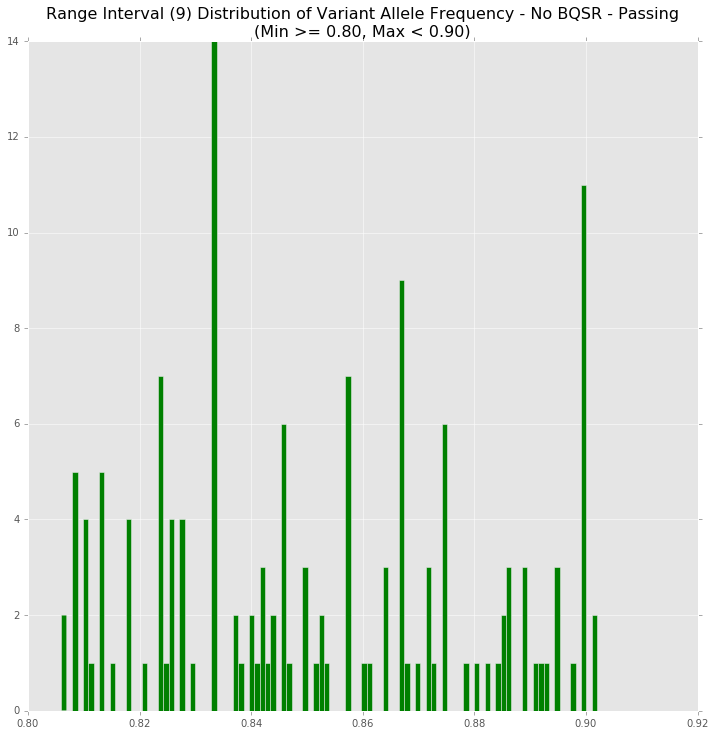

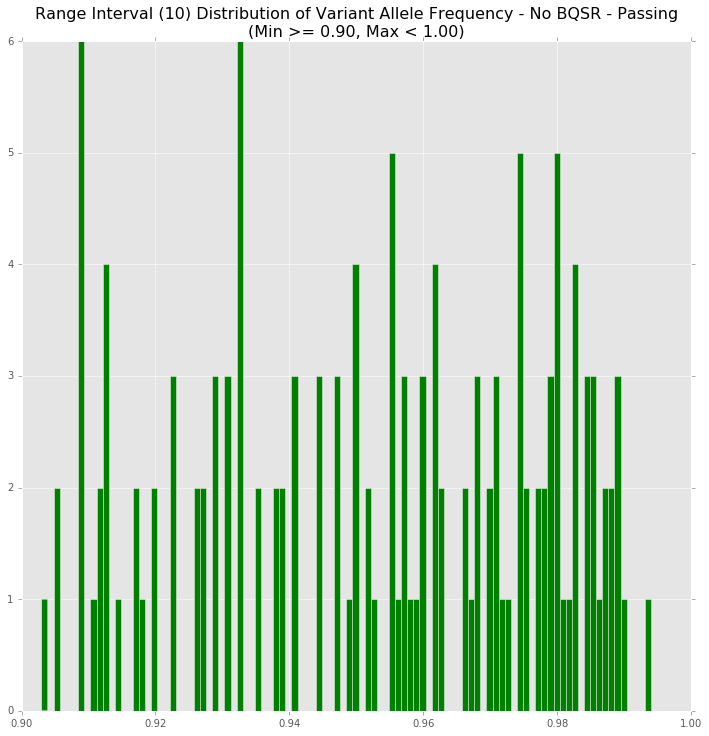

In [30]:
# Plot Each Value Subset - No BQSR
i = 1
c1AfSplits, c1AfRanges = generateSplits(c1AfVals, 10)
for split, valRanges in zip(c1AfSplits, c1AfRanges):
    title = "Range Interval (" + str(i) + ") Distribution of Variant Allele Frequency - No BQSR - Passing\n(Min >= %.2f, Max < %.2f)" % valRanges
    simpleHist(split, title = title, bins = 100)
    i += 1

#### Allele Depth Distribution Value Subsets (10) - BQSR

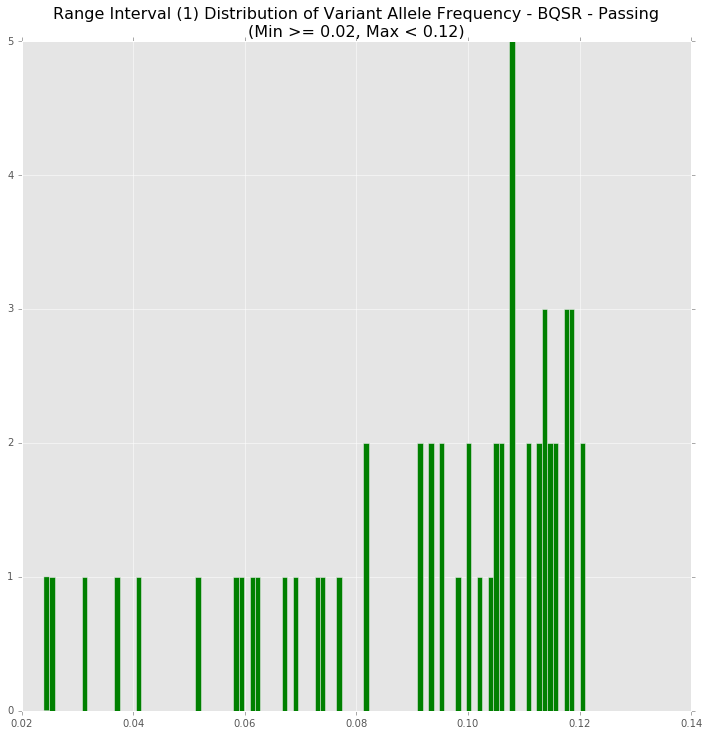

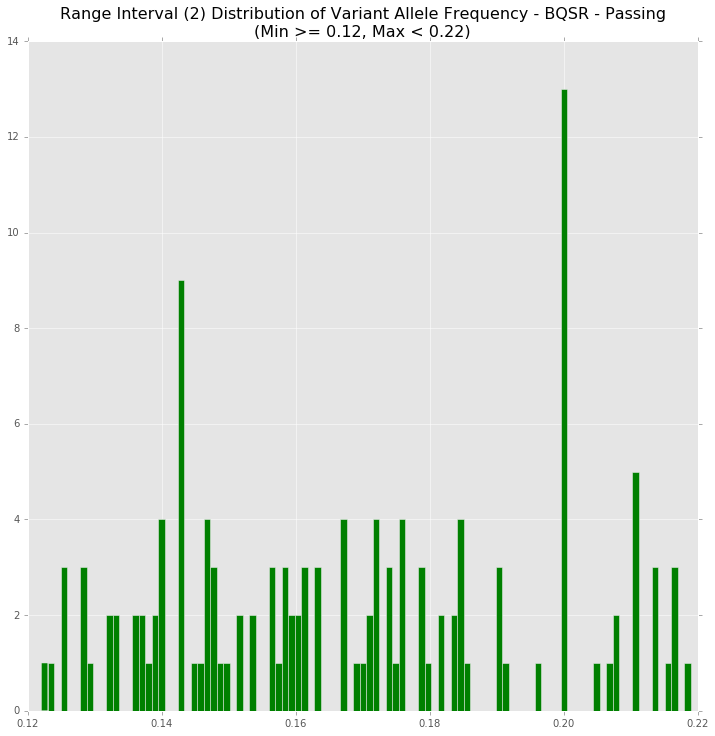

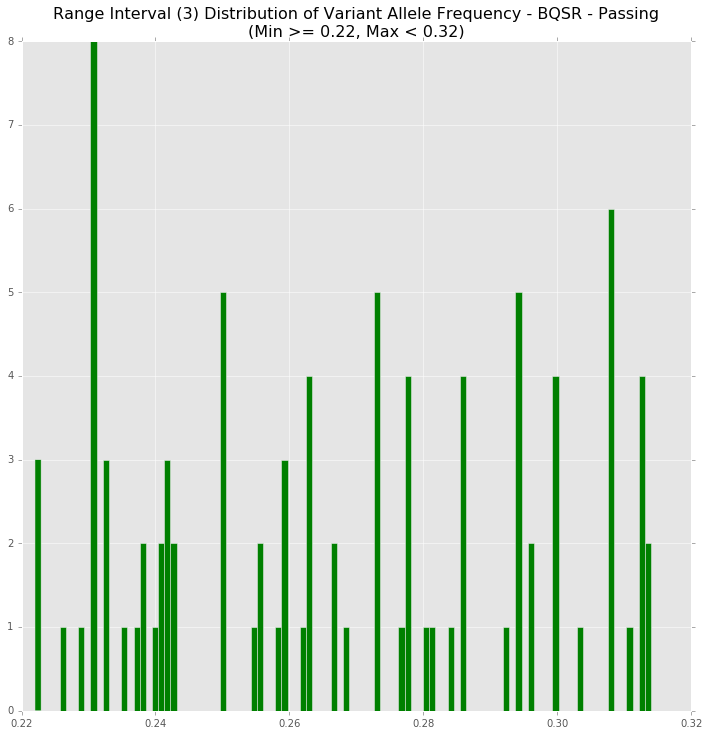

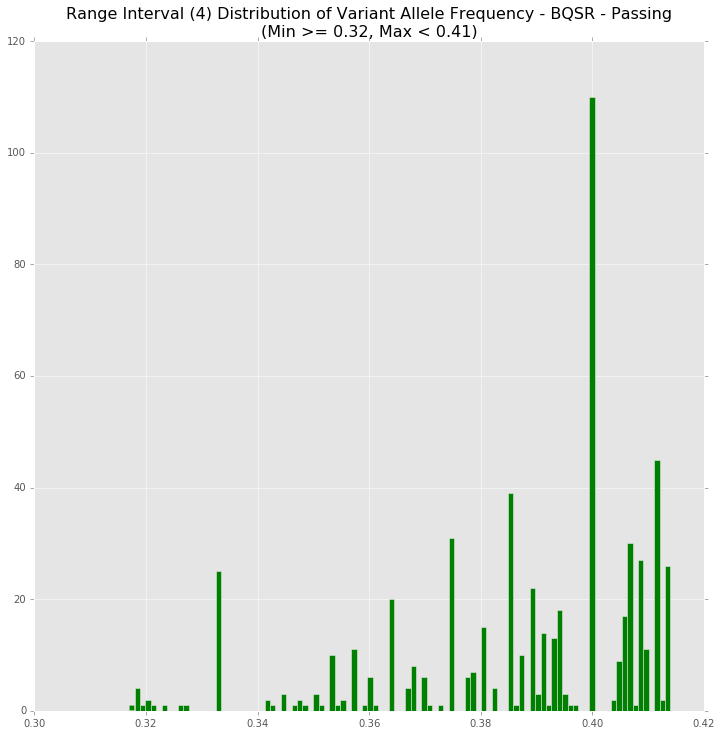

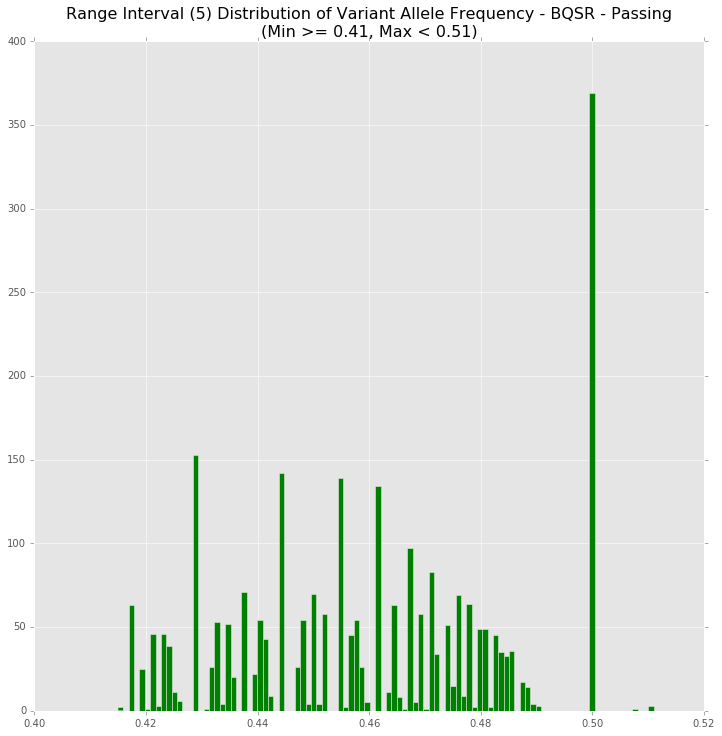

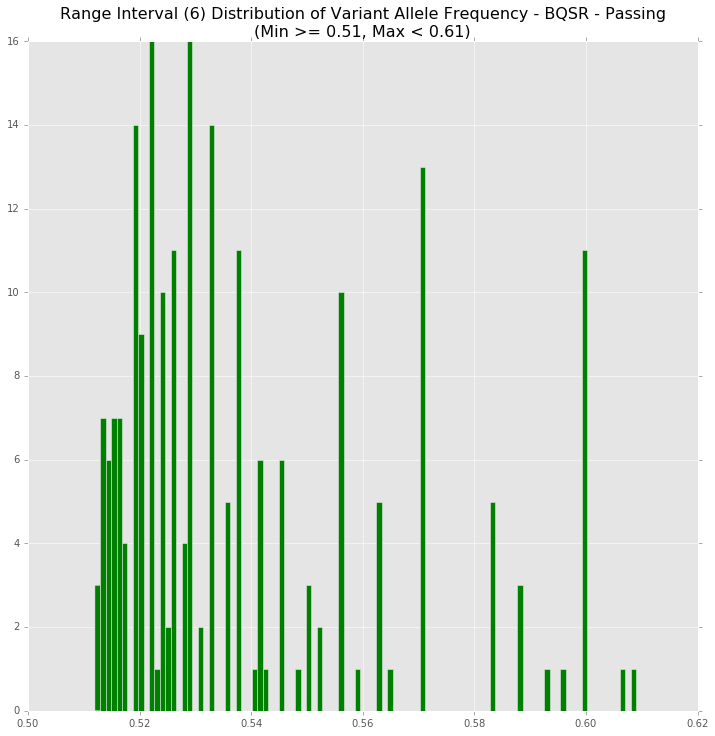

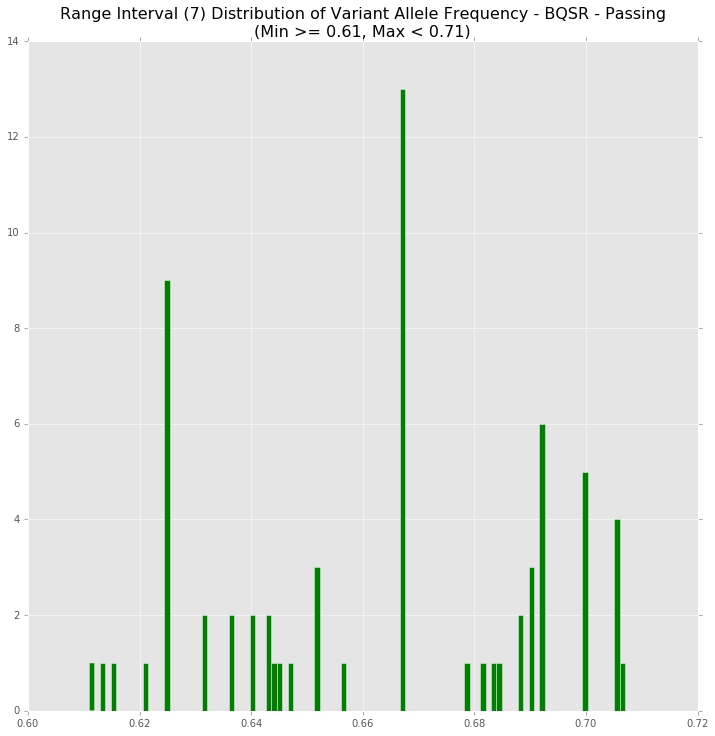

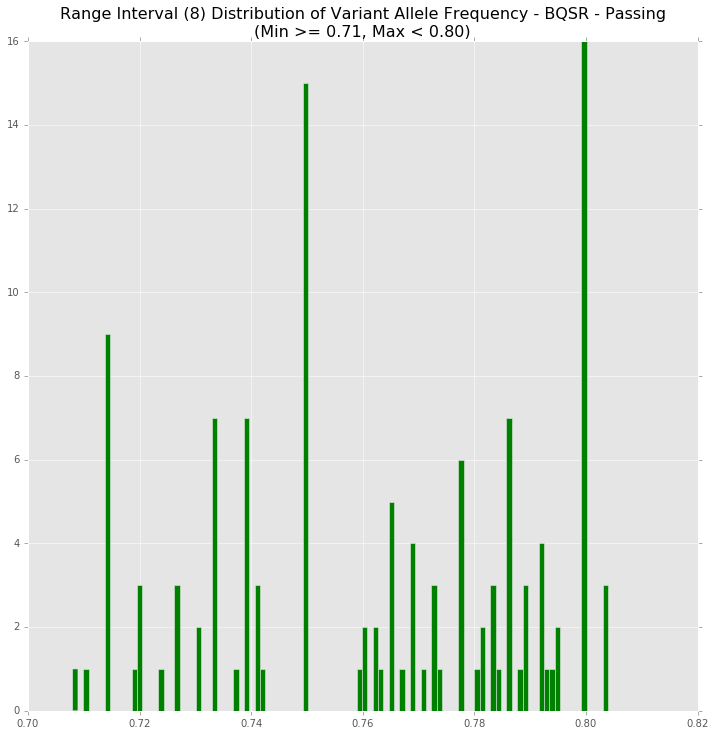

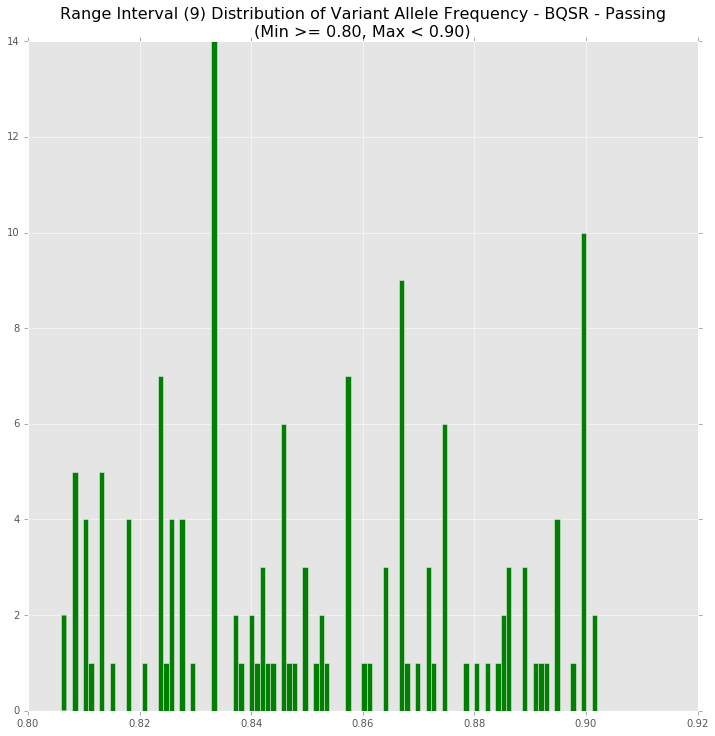

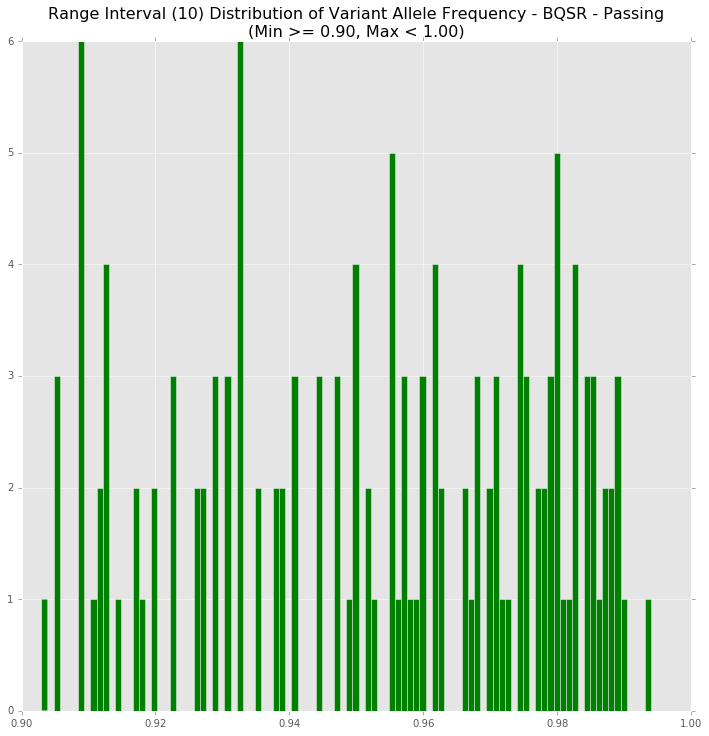

In [31]:
# Plot Each Value Subset - BQSR
i = 1
c2AfSplits, c2AfRanges = generateSplits(c2AfVals, 10)
for split, valRanges in zip(c2AfSplits, c2AfRanges):
    title = "Range Interval (" + str(i) + ") Distribution of Variant Allele Frequency - BQSR - Passing\n(Min >= %.2f, Max < %.2f)" % valRanges
    simpleHist(split, title = title, bins = 100)
    i += 1

### Ranged Allele Quality Score Sum Distributions - Passing

In [32]:
# Get Metrics
c1QssVals = sorted([sum(tup) for tup in getFormatData(c1Passing, key = "QSS", sampleIdx = 1)[0]])
c2QssVals = sorted([sum(tup) for tup in getFormatData(c2Passing, key = "QSS", sampleIdx = 1)[0]])

print("\nBelow are the last 10 positions in the No BQSR condition allele depth array. No obvious outliers but definitely a long tail.\n")
print(c1QssVals[(len(c1QssVals) - 20):len(c1QssVals)])
print("\nBelow are the last 10 positions in the BQSR condition allele depth array. One outlier and, again a long tail.\n")
print(c2QssVals[(len(c2QssVals) - 20):len(c2QssVals)])

print("I'll leave these as is. Doing otherwise will introduce a bias.")


Below are the last 10 positions in the No BQSR condition allele depth array. No obvious outliers but definitely a long tail.

[2315, 2319, 2351, 2395, 2418, 2500, 2557, 2882, 3024, 3026, 3049, 3278, 3310, 3521, 3812, 3902, 4157, 4875, 4956, 9303]

Below are the last 10 positions in the BQSR condition allele depth array. One outlier and, again a long tail.

[2266, 2359, 2425, 2509, 2521, 2870, 2874, 2912, 2925, 2950, 2997, 3083, 3118, 3218, 3352, 3367, 3788, 3846, 4146, 4955]
I'll leave these as is. Doing otherwise will introduce a bias.


#### Allele Quality Score Sum Distributions - No BQSR & BQSR - Passing

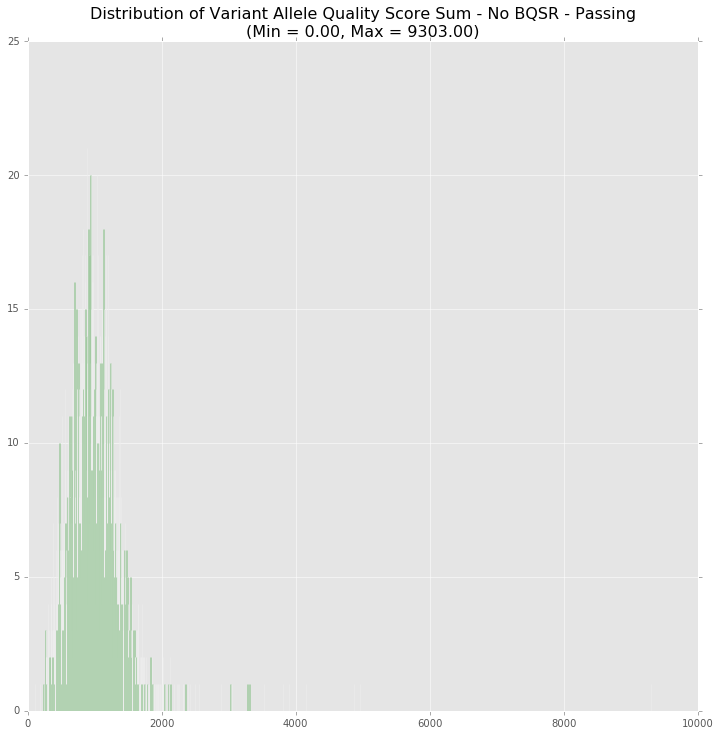

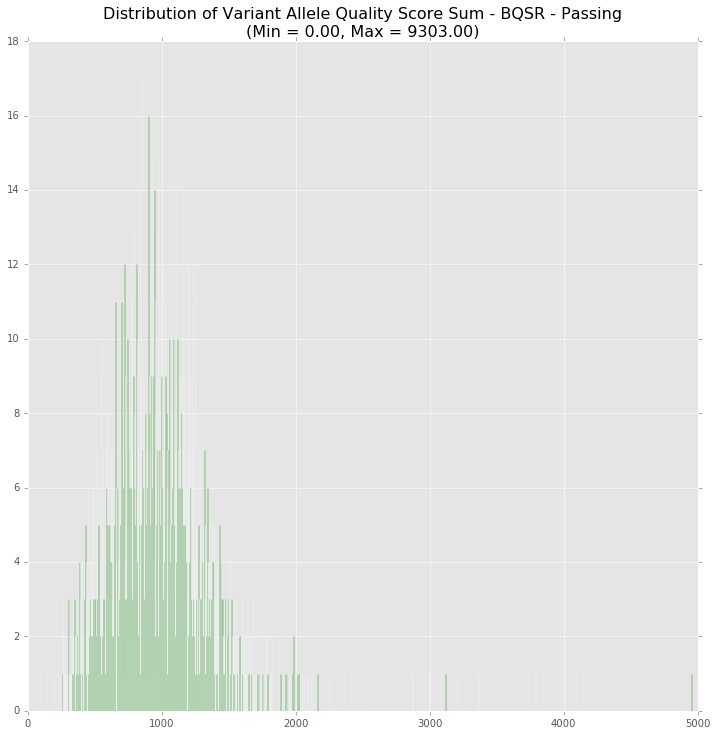

In [33]:
# Plot Complete Distribution - No BQSR
c1QssMin = min(c1QssVals)
c1QssMax = max(c1QssVals)
title = "Distribution of Variant Allele Quality Score Sum - No BQSR - Passing\n(Min = %.2f, Max = %.2f)" % (c1QssMin, c1QssMax)
simpleHist(c1QssVals, title = title, bins = len(c1QssVals))

# Plot Complete Distribution - BQSR
c2QssMin = min(c1QssVals)
c2QssMax = max(c1QssVals)
title = "Distribution of Variant Allele Quality Score Sum - BQSR - Passing\n(Min = %.2f, Max = %.2f)" % (c2QssMin, c2QssMax)
simpleHist(c2QssVals, title = title, bins = len(c2QssVals))

#### Allele Quality Score Sum Distribution Median Subsets (10) - No BQSR

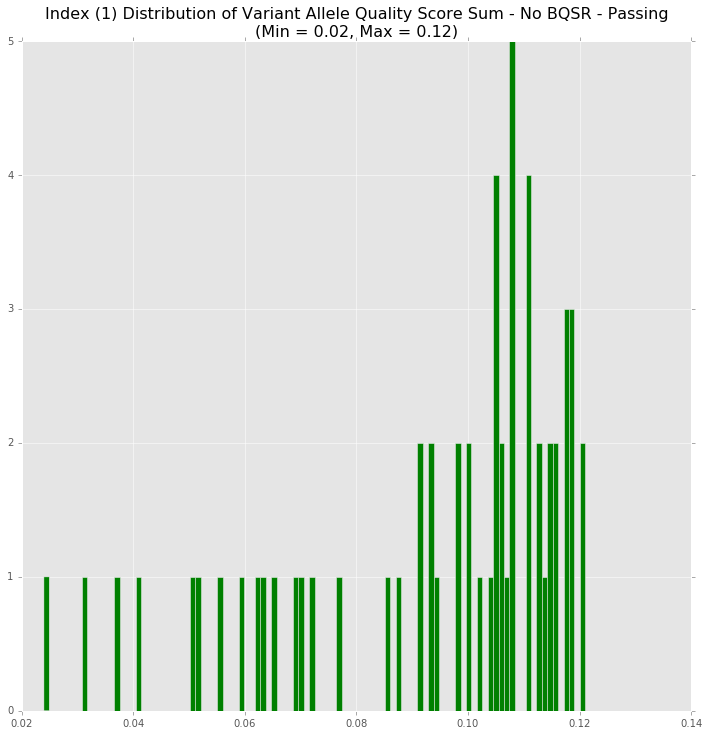

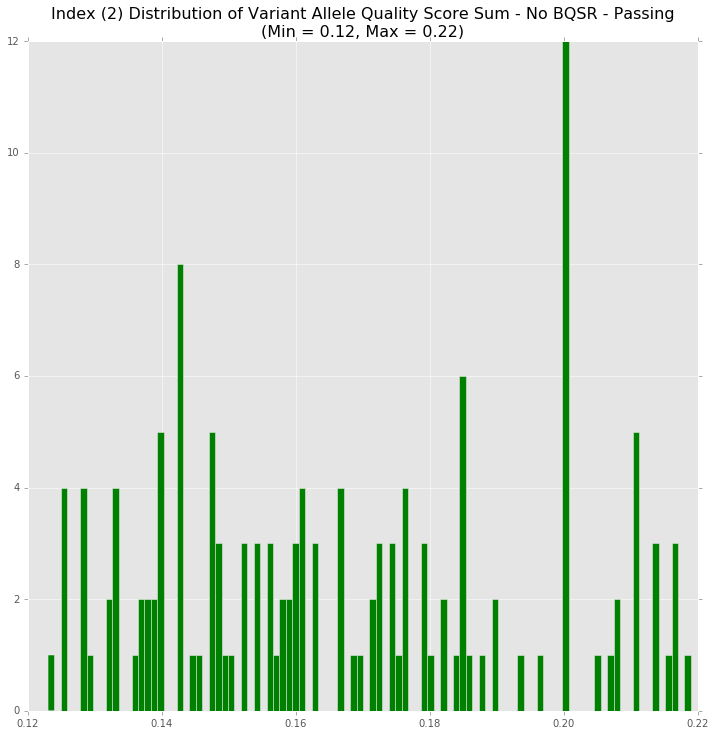

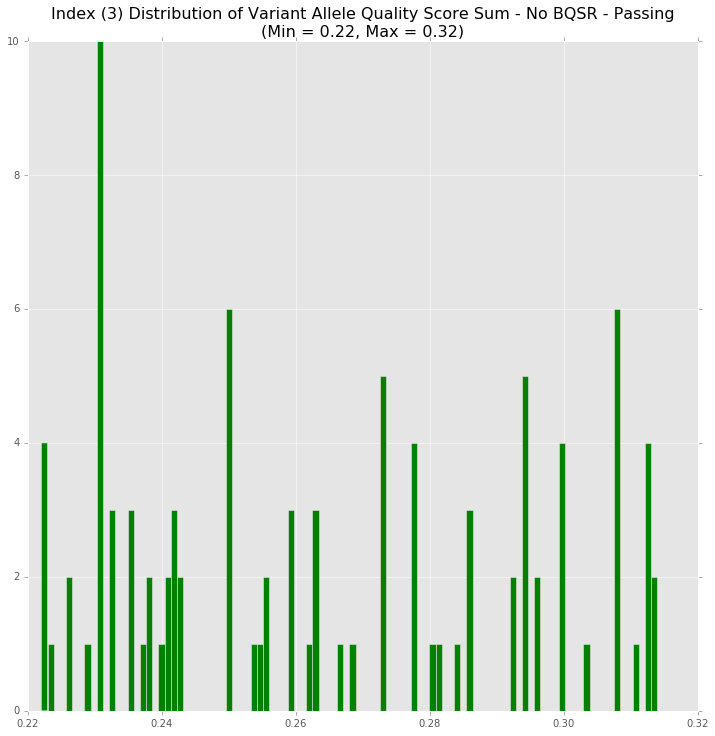

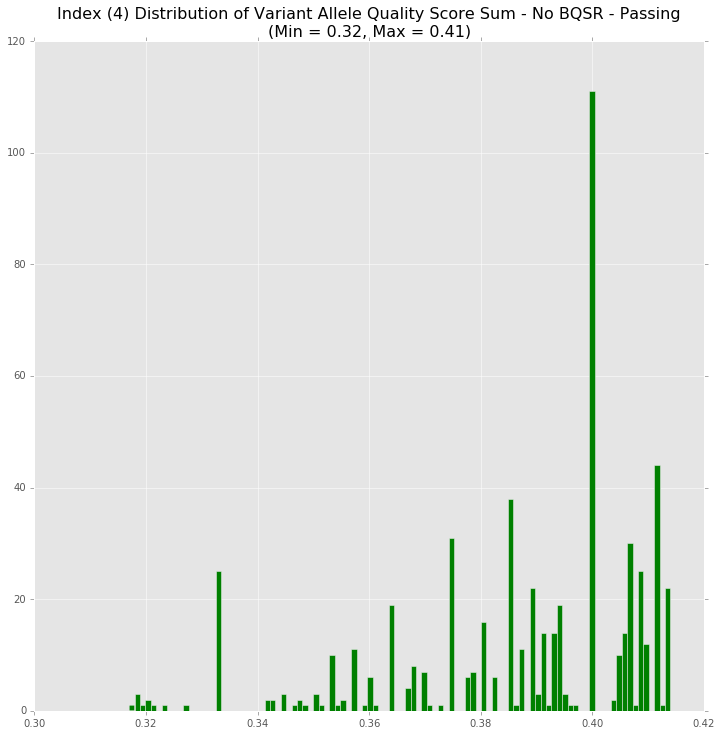

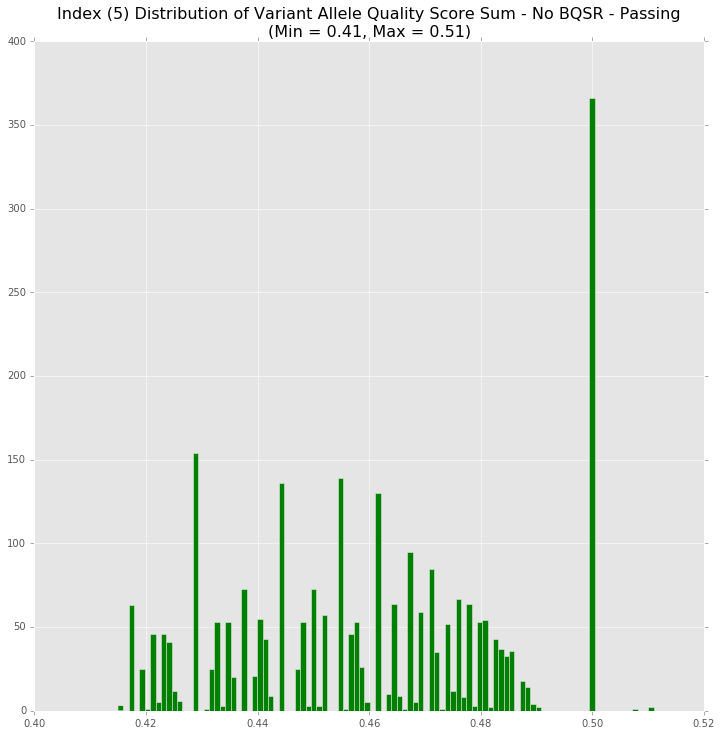

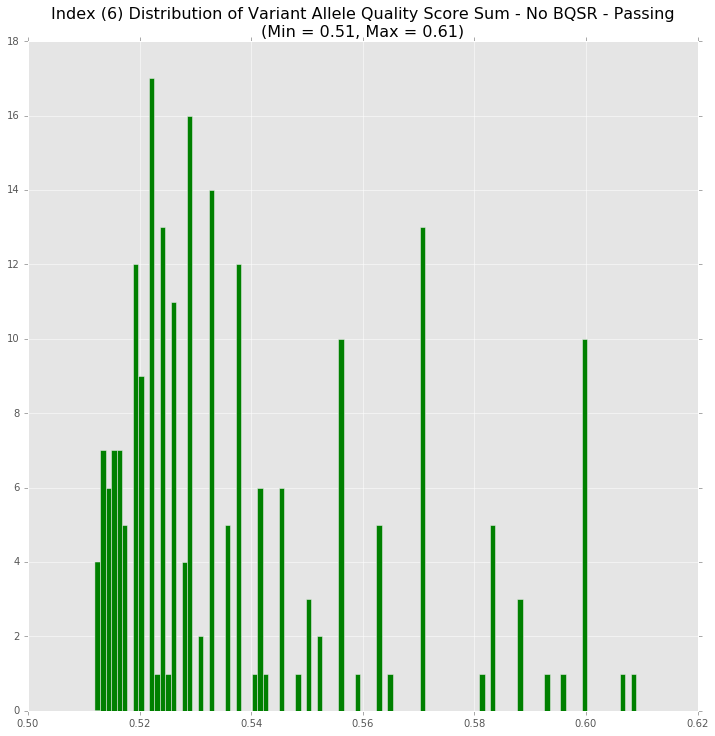

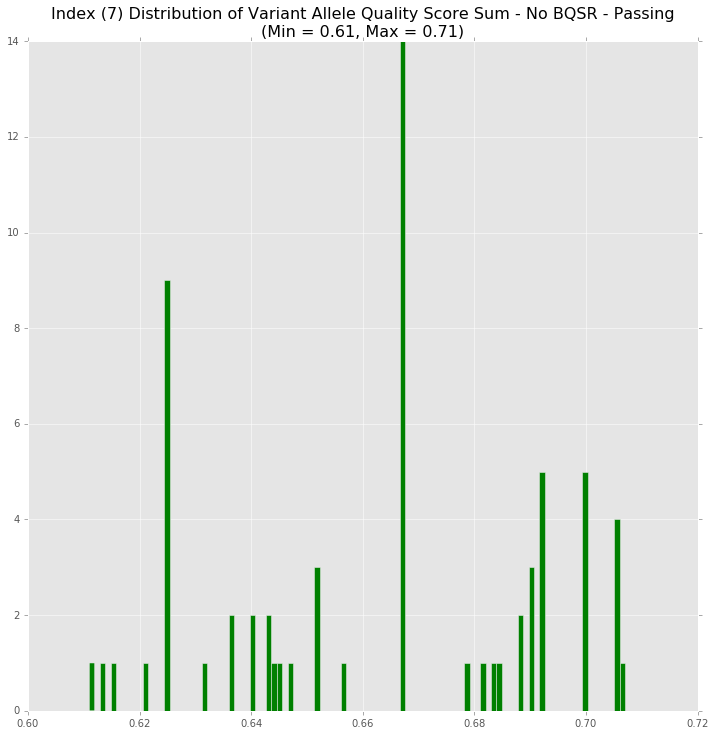

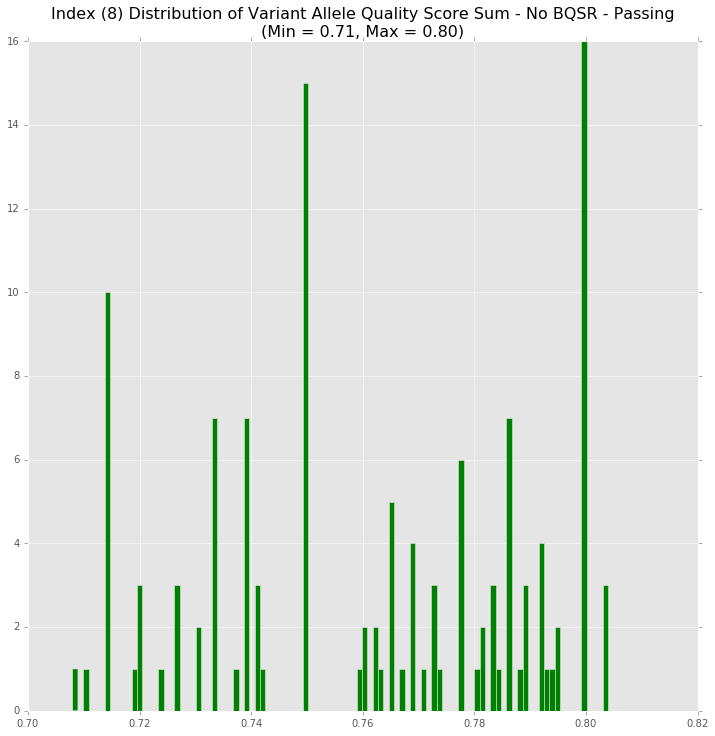

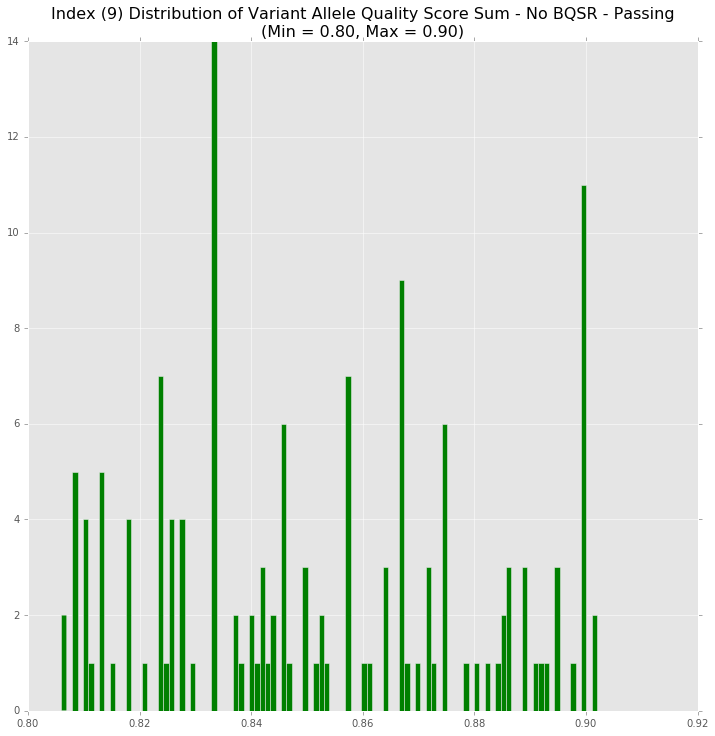

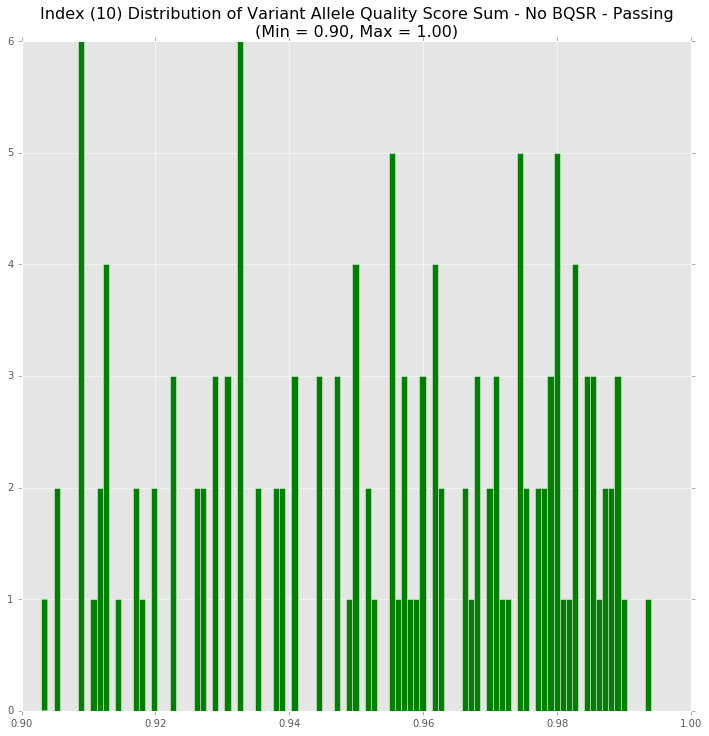

In [34]:
# Plot Each Median Subset - No BQSR
i = 1
c1QssSplits, c1QssRanges = generateSplits(c1AfVals, 10, median = True)
for split, valRanges in zip(c1AfSplits, c1AfRanges):
    title = "Index (" + str(i) + ") Distribution of Variant Allele Quality Score Sum - No BQSR - Passing\n(Min = %.2f, Max = %.2f)" % valRanges
    simpleHist(split, title = title, bins = 100)
    i += 1

#### Allele Quality Score Sum Distribution Median Subsets (10) - BQSR

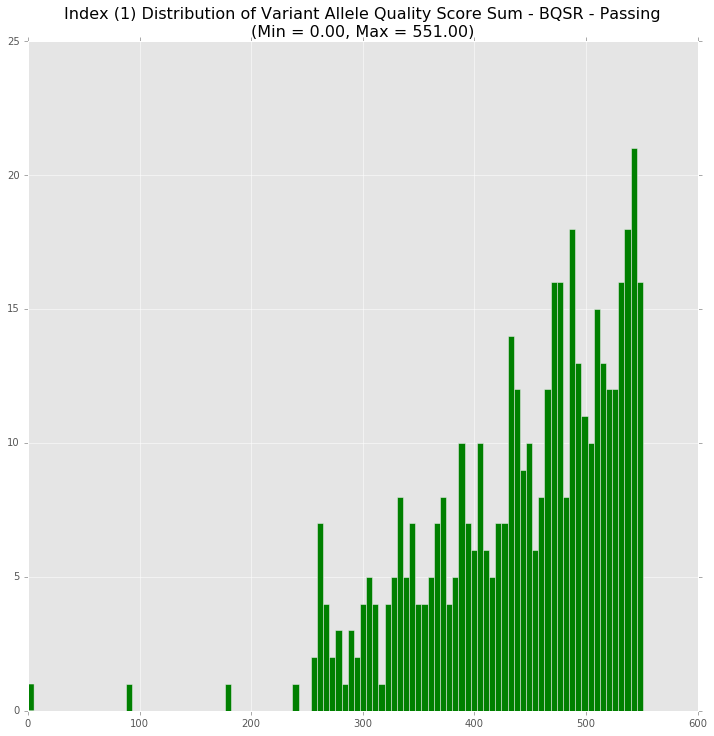

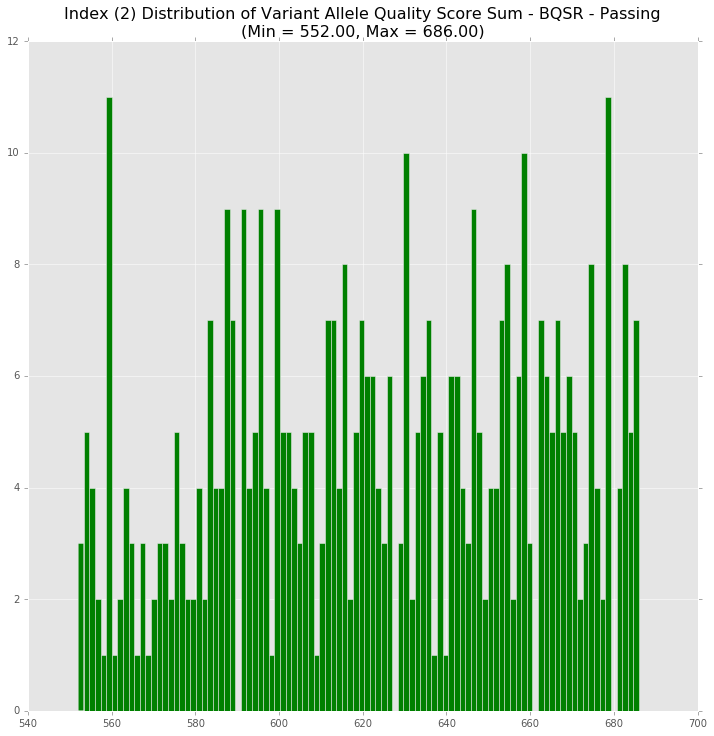

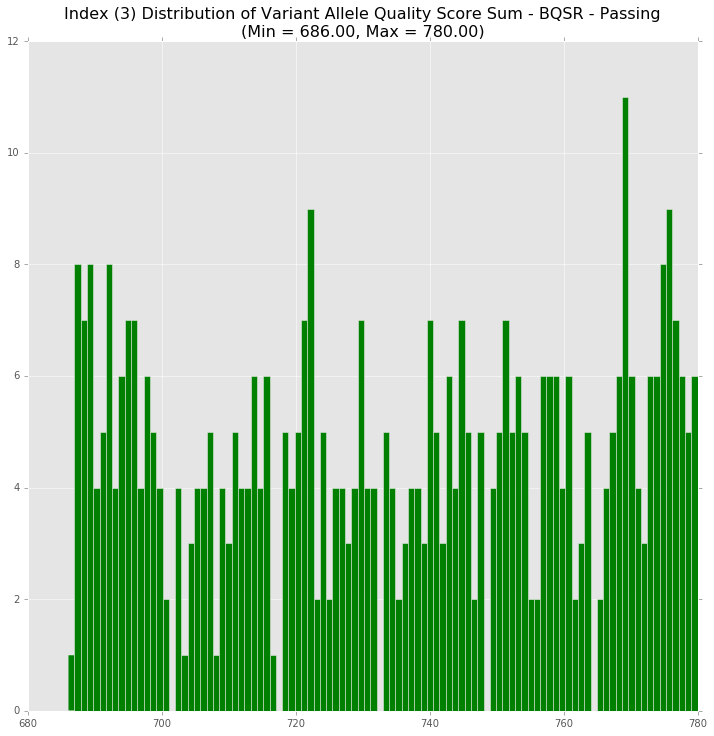

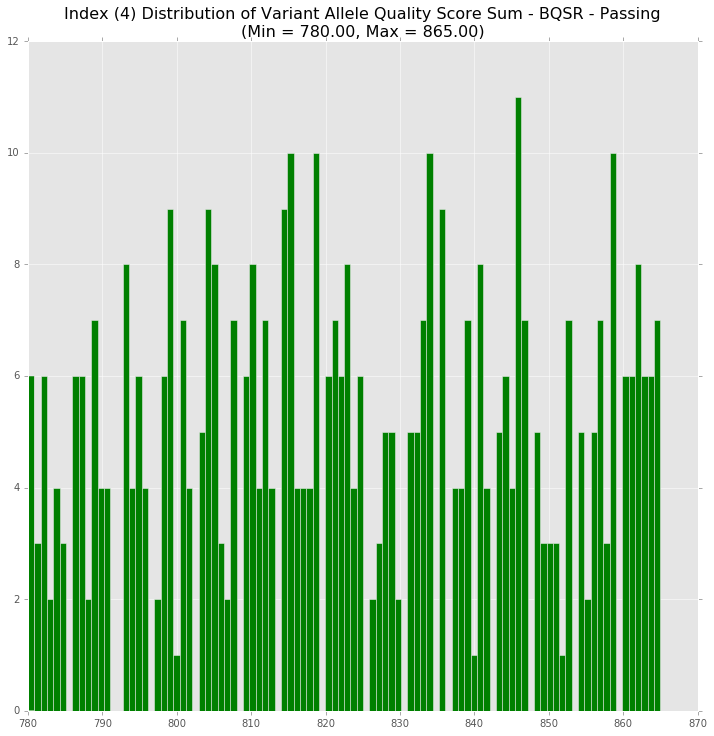

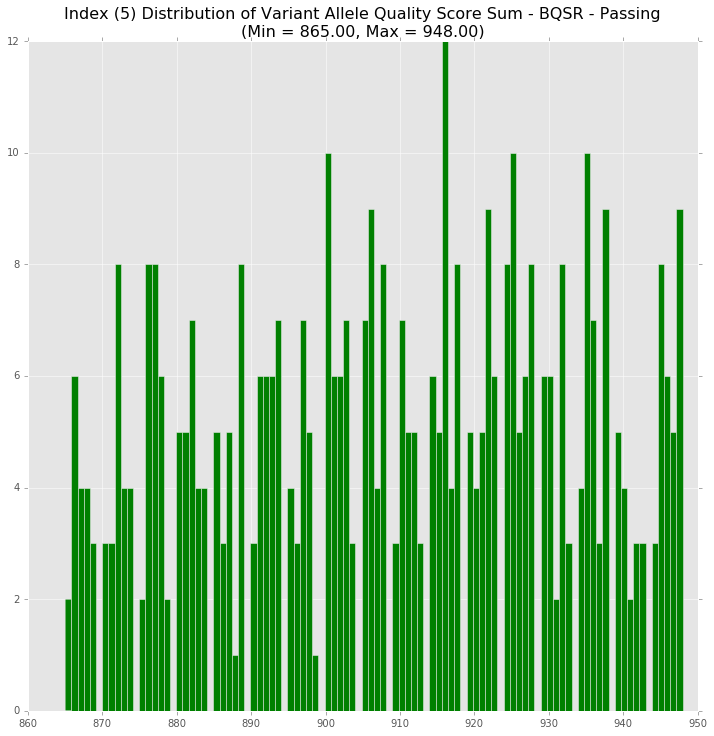

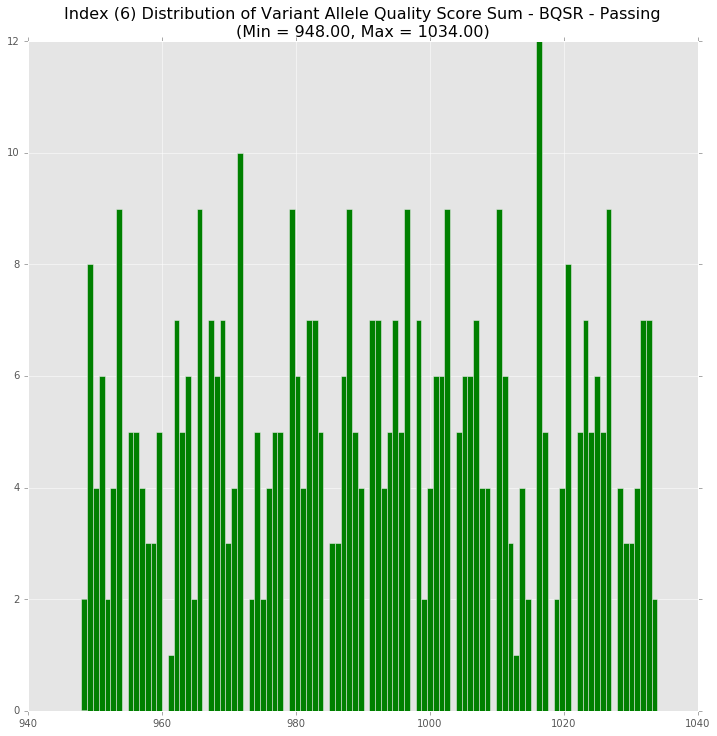

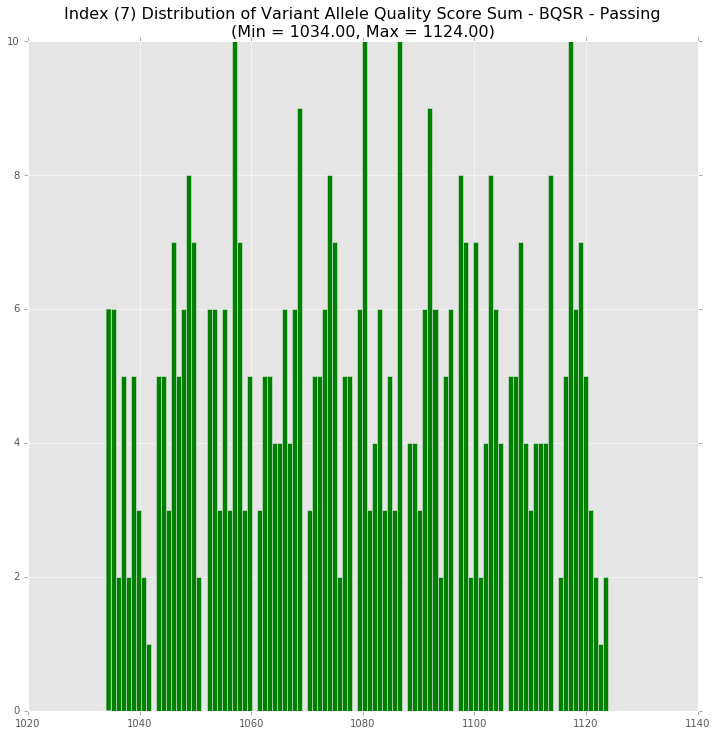

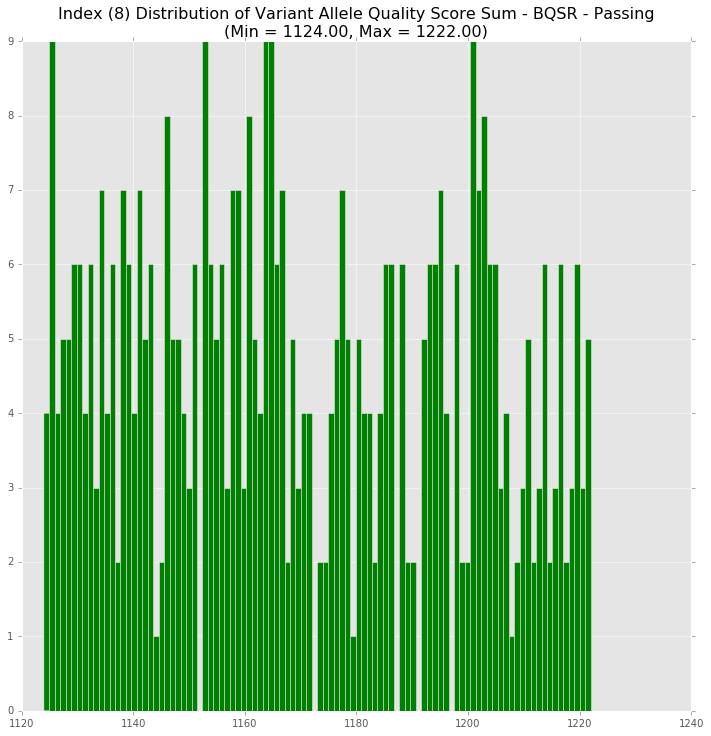

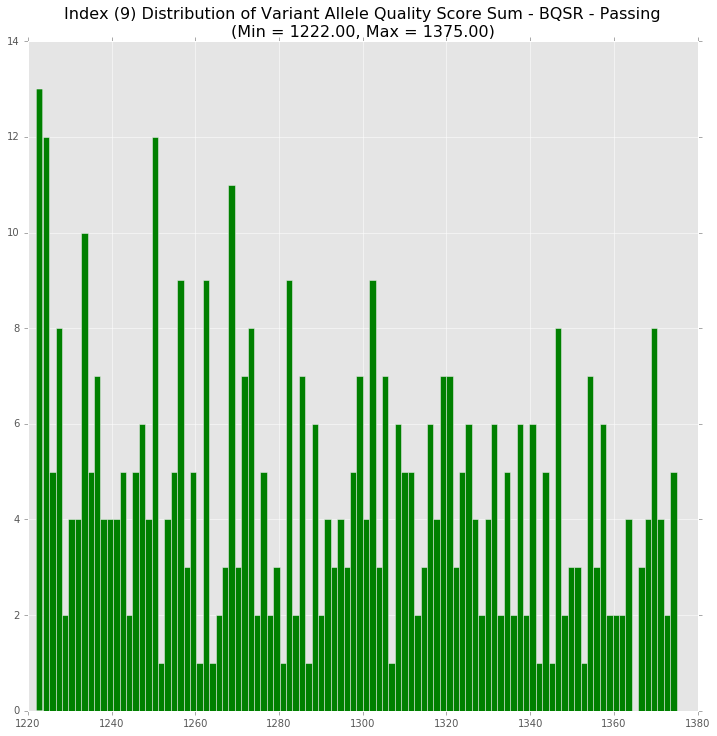

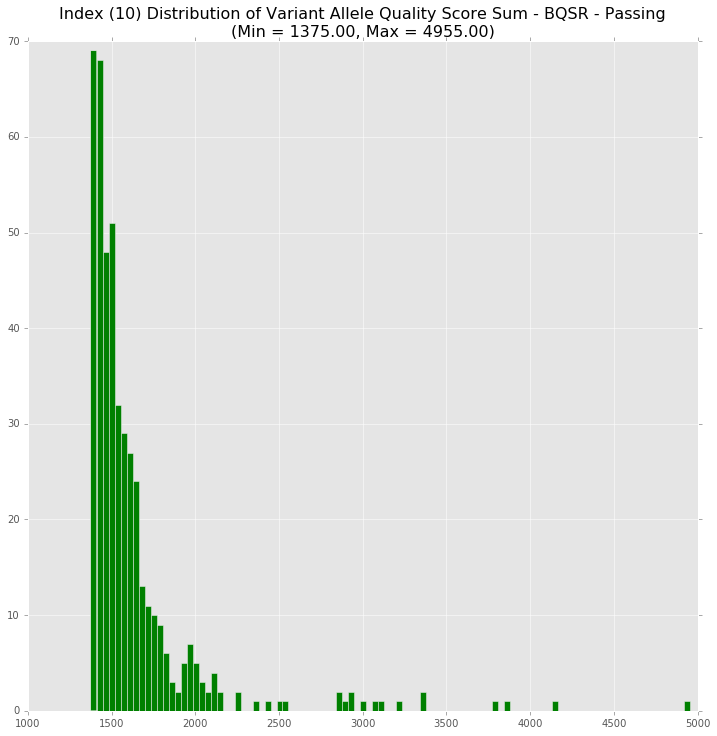

In [35]:
# Plot Each Median Subset - BQSR
i = 1
c2QssSplits, c2QssRanges = generateSplits(c2QssVals, 10, median = True)
for split, valRanges in zip(c2QssSplits, c2QssRanges):
    title = "Index (" + str(i) + ") Distribution of Variant Allele Quality Score Sum - BQSR - Passing\n(Min = %.2f, Max = %.2f)" % valRanges
    simpleHist(split, title = title, bins = 100)
    i += 1

#### Allele Quality Score Sum Distribution Value Subsets (10) - No BQSR

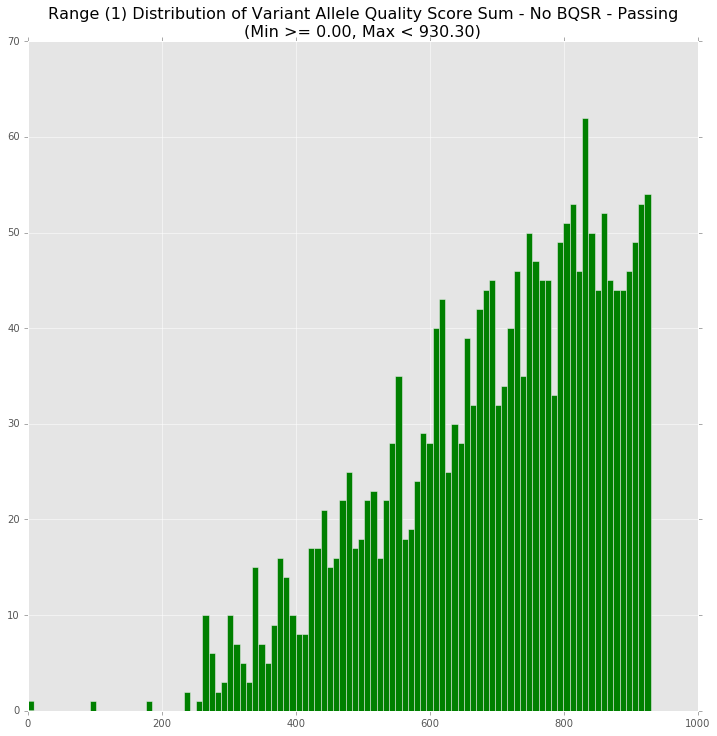

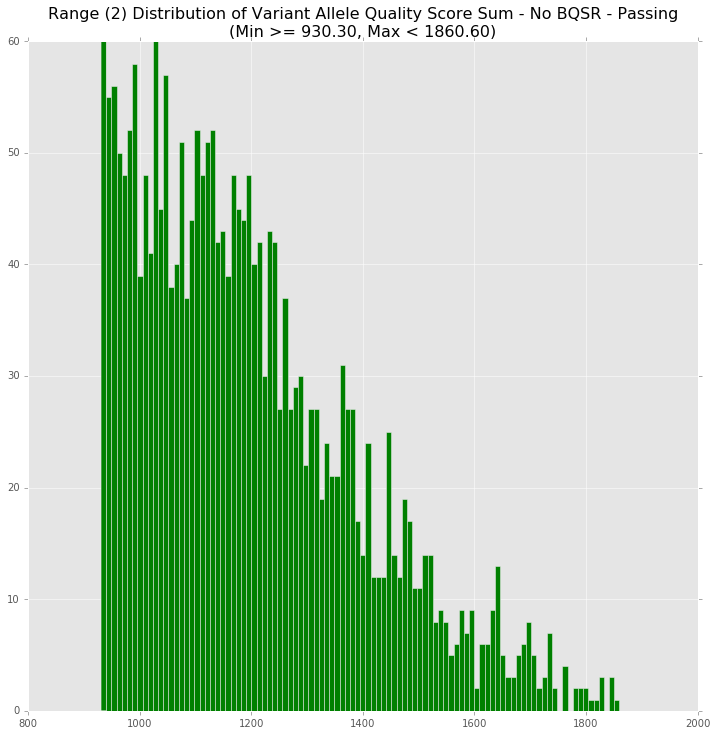

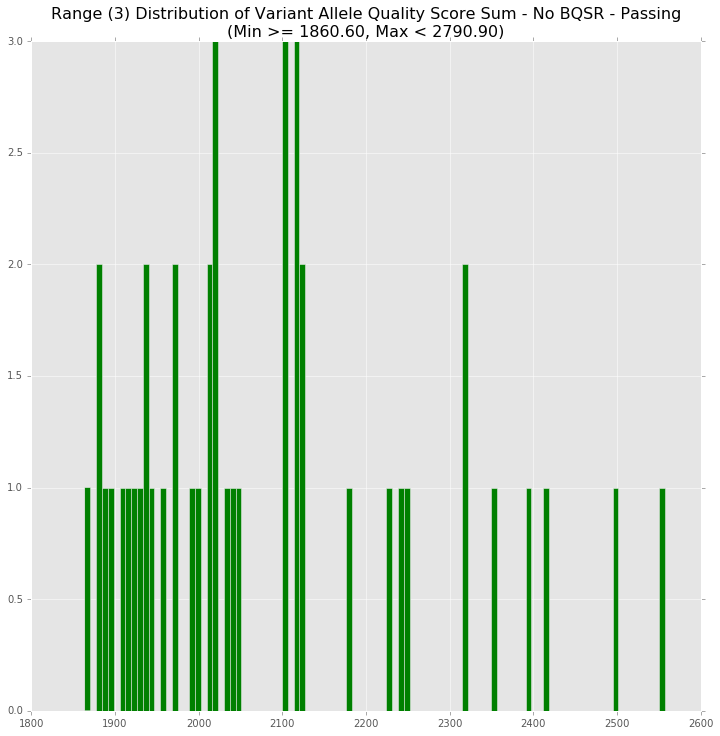

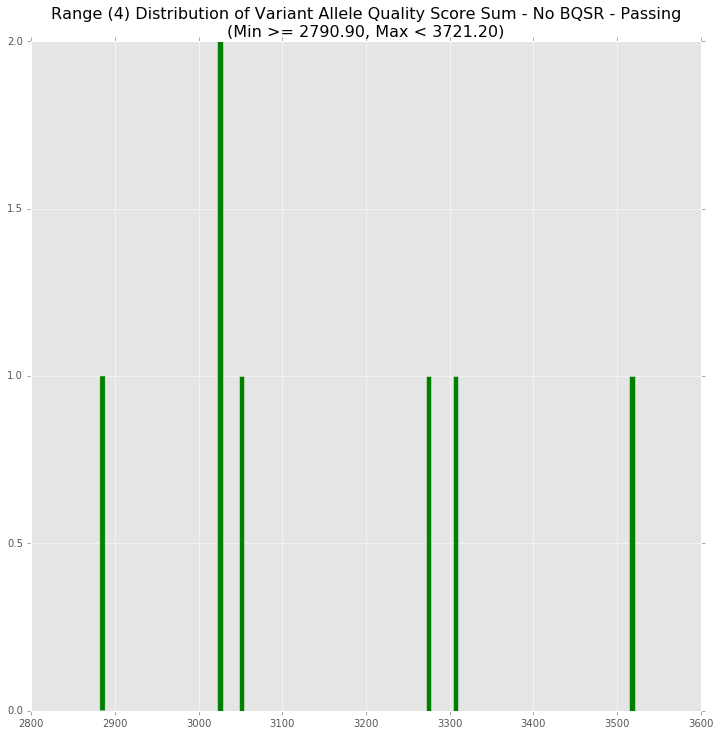

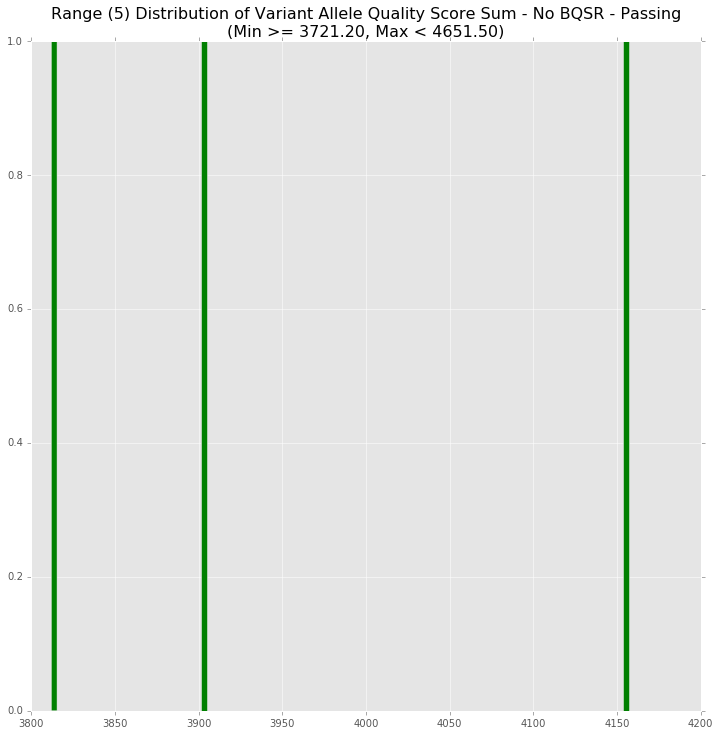

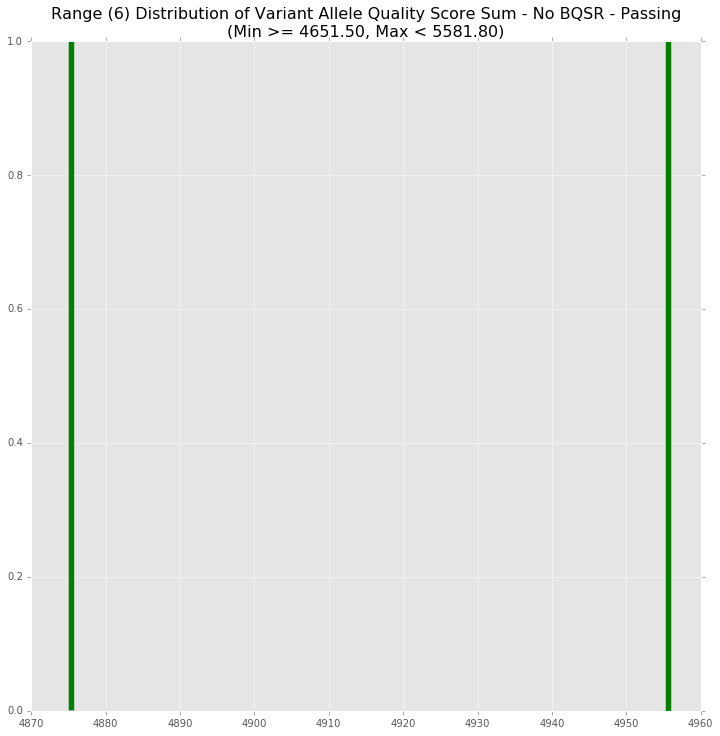

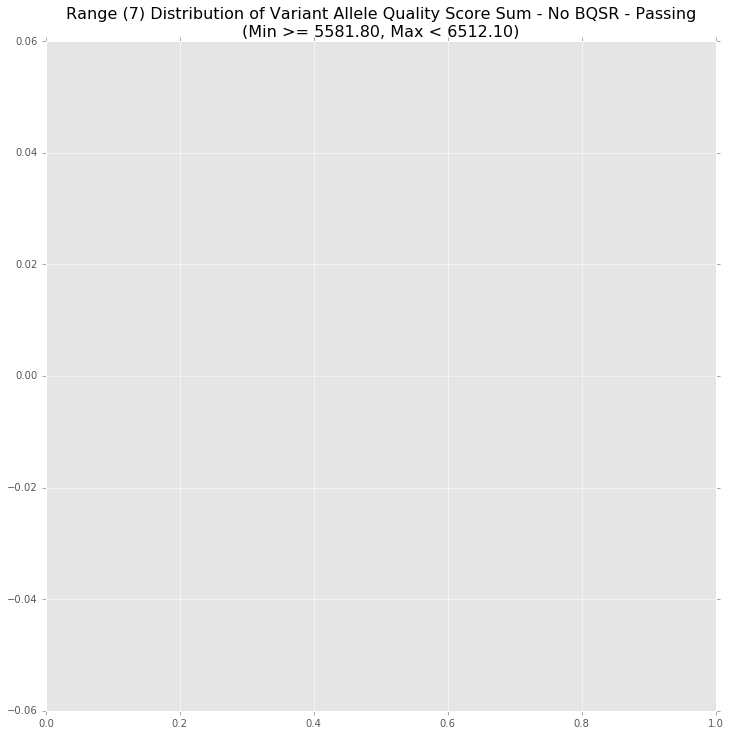

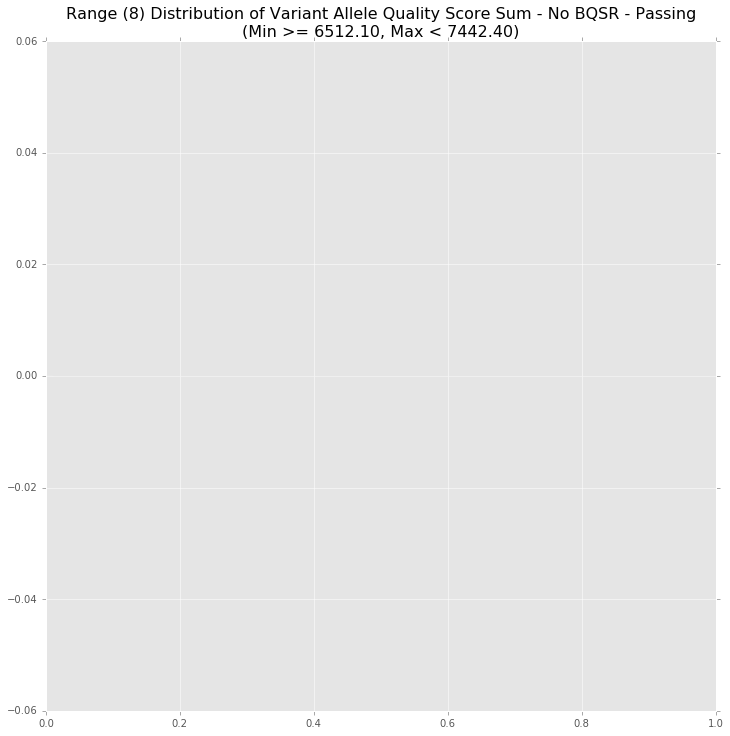

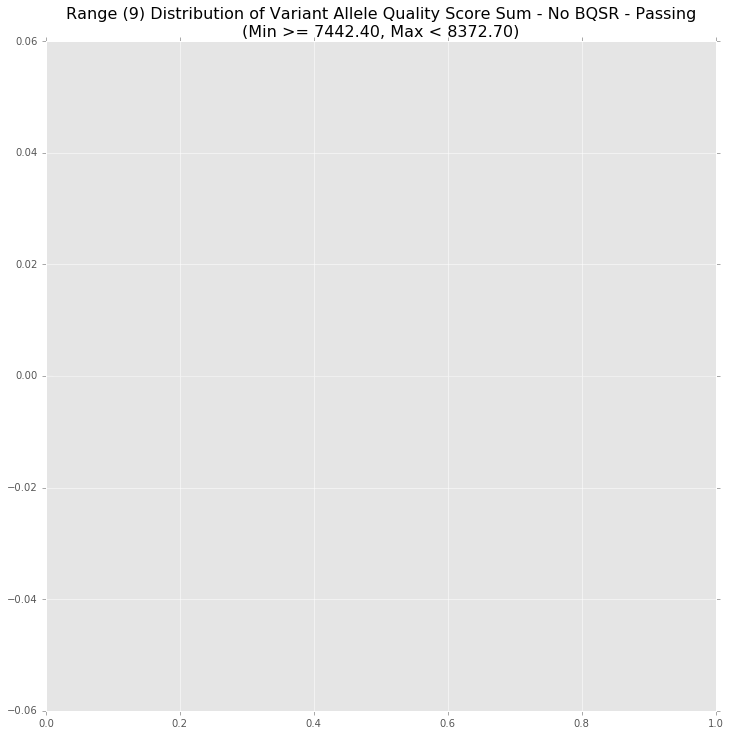

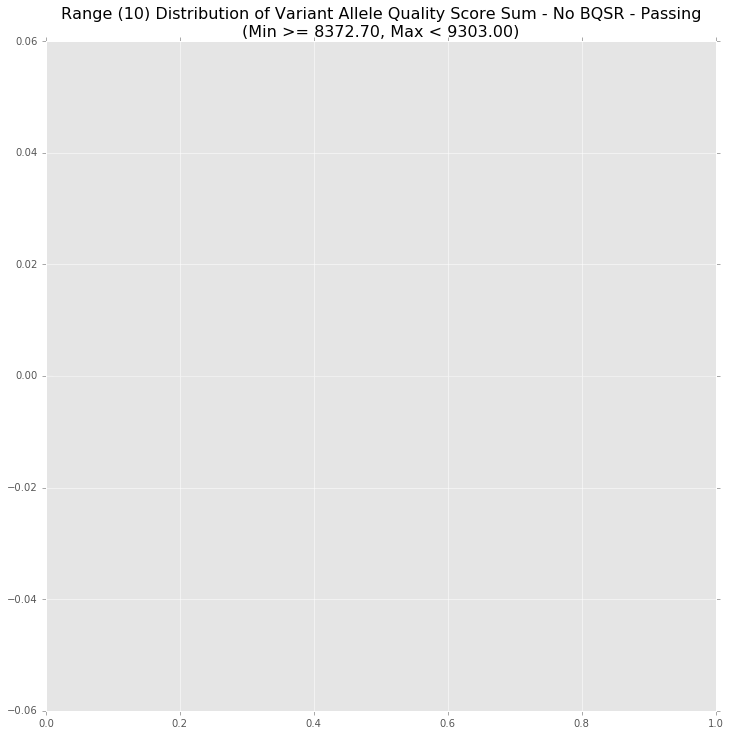

In [36]:
# Plot Each Value Subset - No BQSR
i = 1
c1QssSplits, c1QssRanges = generateSplits(c1QssVals, 10)
for split, valRanges in zip(c1QssSplits, c1QssRanges):
    title = "Range (" + str(i) + ") Distribution of Variant Allele Quality Score Sum - No BQSR - Passing\n(Min >= %.2f, Max < %.2f)" % valRanges
    simpleHist(split, title = title, bins = 100)
    i += 1

#### Allele Quality Score Sum Distribution Value Subsets (10) - BQSR

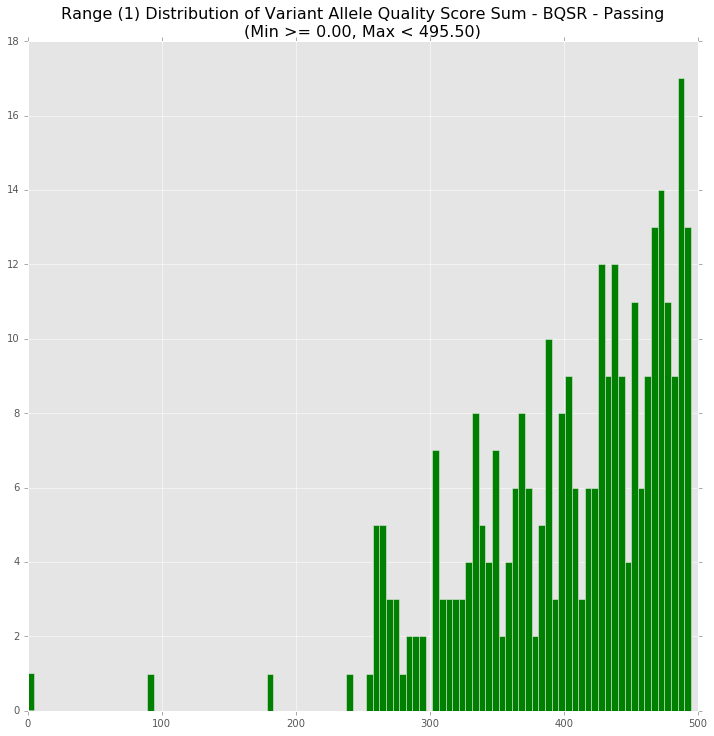

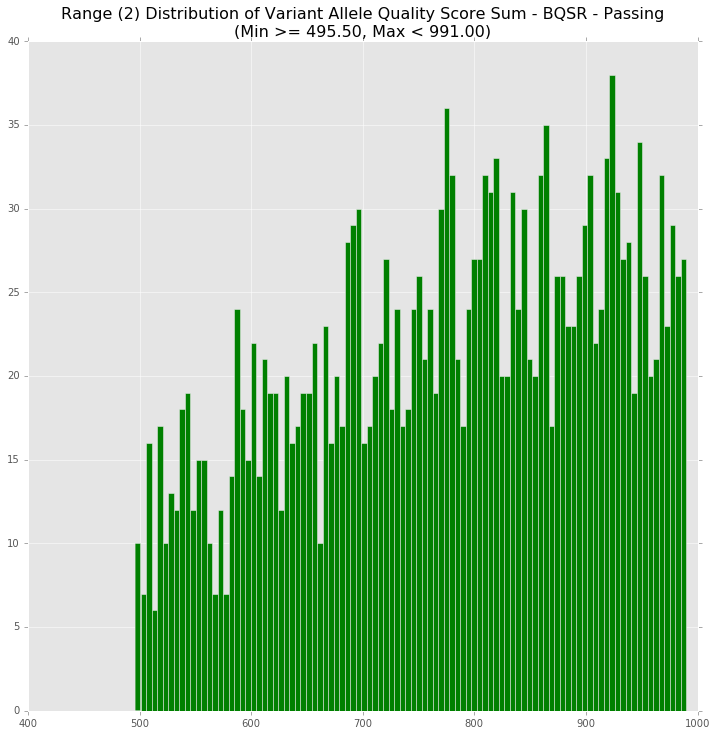

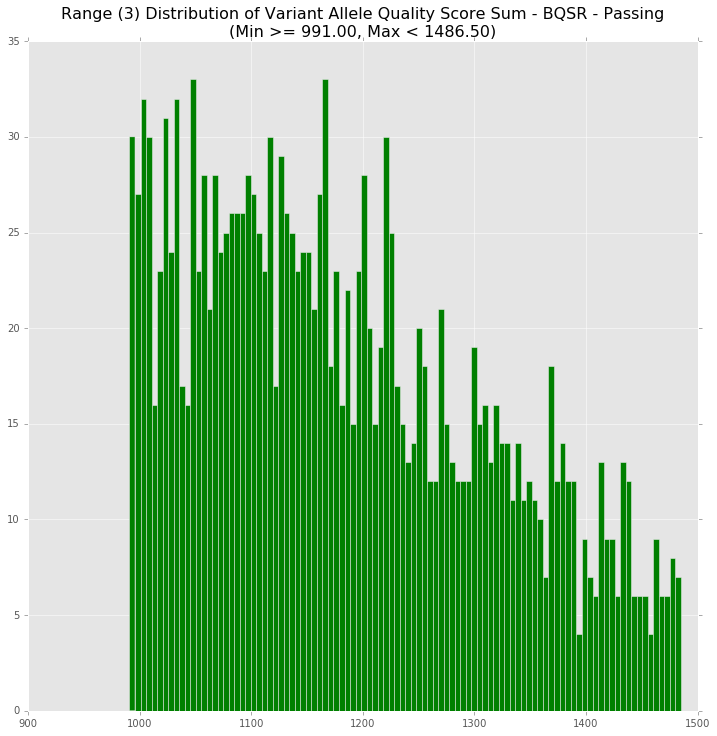

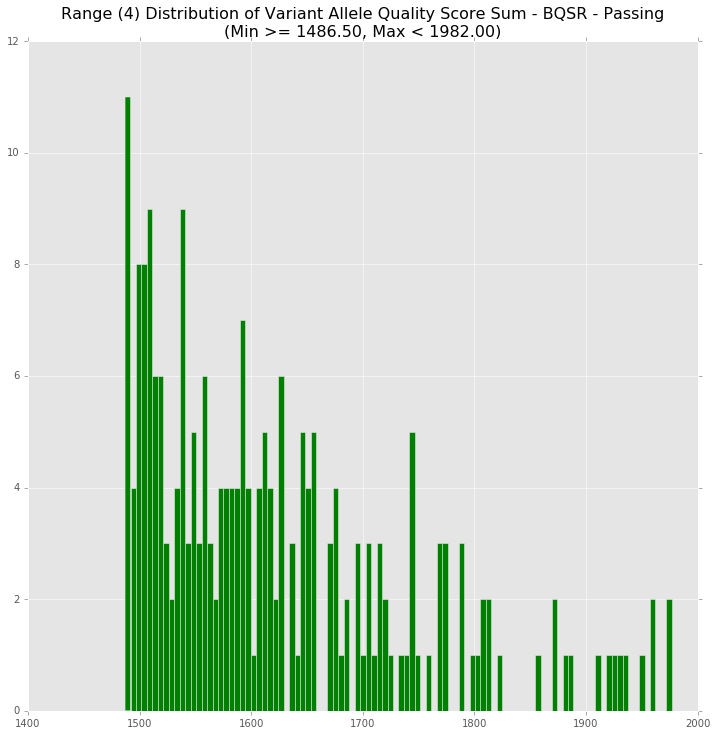

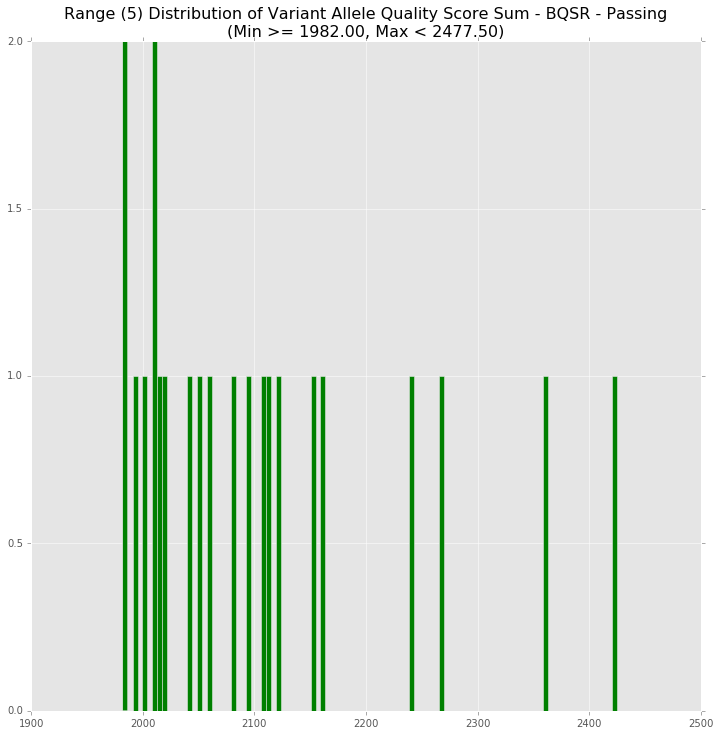

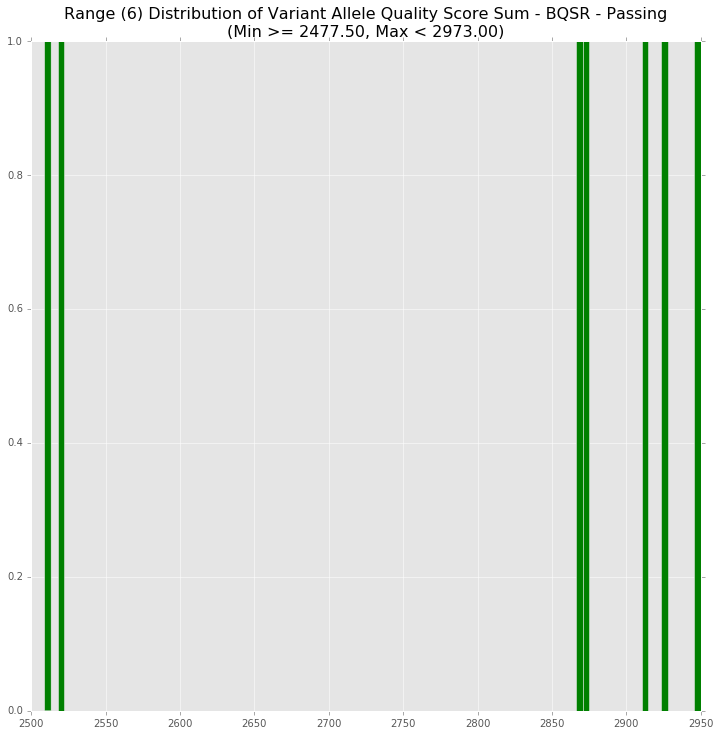

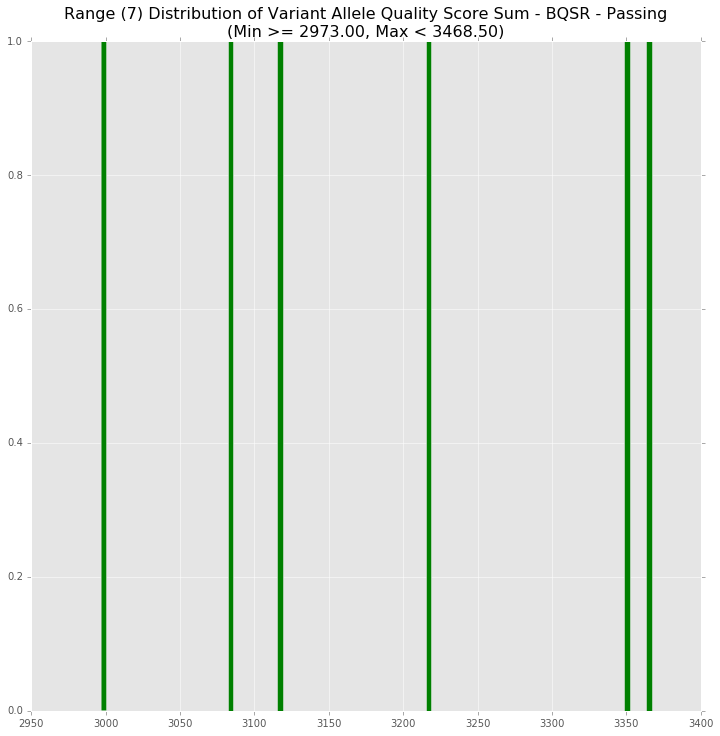

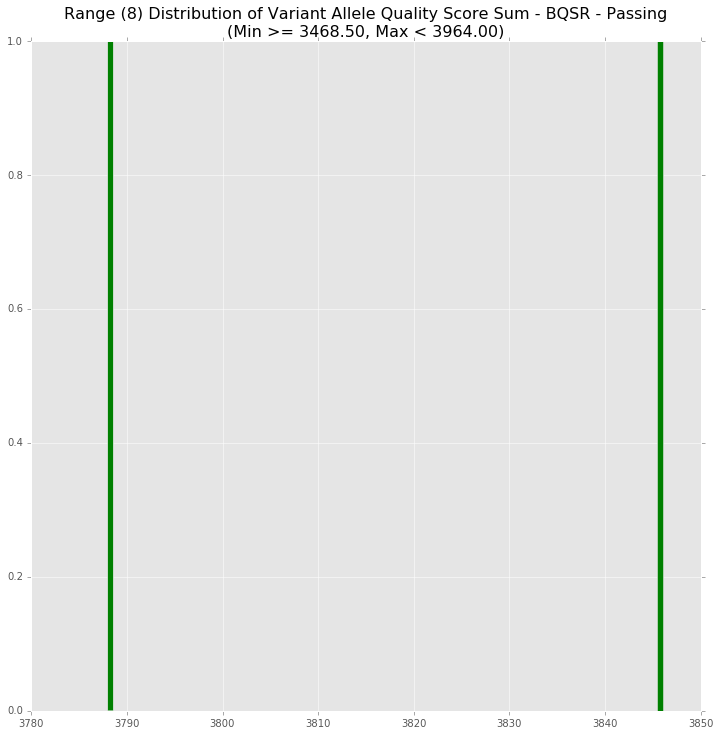

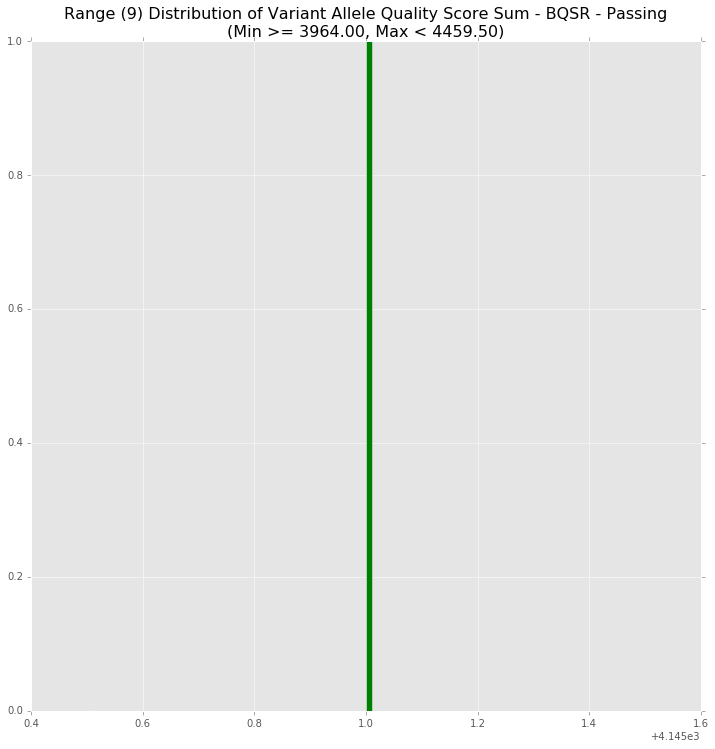

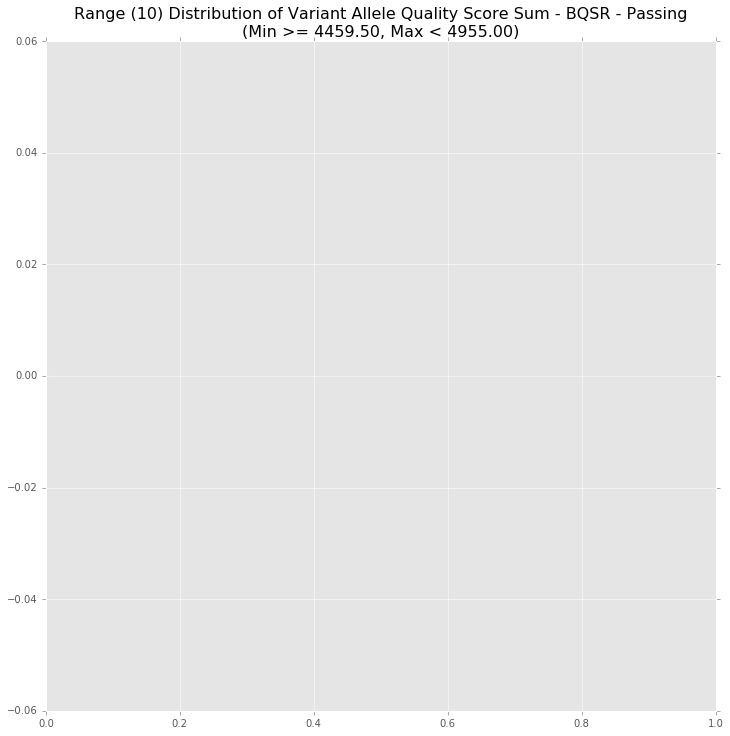

In [37]:
# Plot Each Value Subset - BQSR
i = 1
c2QssSplits, c2QssRanges = generateSplits(c2QssVals, 10)
for split, valRanges in zip(c2QssSplits, c2QssRanges):
    title = "Range (" + str(i) + ") Distribution of Variant Allele Quality Score Sum - BQSR - Passing\n(Min >= %.2f, Max < %.2f)" % valRanges
    simpleHist(split, title = title, bins = 100)
    i += 1

# Breakapart Curve Analysis - All Variants

In [38]:
# 
# Get Metrics to Split on - All
# 

# Get Metrics
c1AdVals = sorted([sum(tup) for tup in getFormatData(c1HashMap, key = "AD")[0]])
c1AfVals = sorted(getFormatData(c1HashMap, key="AF")[0])
c1QssVals = sorted([sum(tup) for tup in getFormatData(c1HashMap, key = "QSS", sampleIdx = 1)[0]])

c2AdVals = sorted([sum(tup) for tup in getFormatData(c2HashMap, key = "AD")[0]])
c2AfVals = sorted(getFormatData(c2HashMap, key="AF")[0])
c2QssVals = sorted([sum(tup) for tup in getFormatData(c2HashMap, key = "QSS", sampleIdx = 1)[0]])

#
# Compute Splits
#

# Generate Splits - No BQSR - By Index
c1AdMedianSplits, c1AdMedianRanges = generateSplits(c1AdVals, n=10, median = True)
c1AfMedianSplits, c1AfMedianRanges = generateSplits(c1AfVals, n=10, median = True)
c1QssMedianSplits, c1QssMedianRanges = generateSplits(c1QssVals, n=10, median = True)

# Generate Splits - BQSR - By Index
c2AdMedianSplits, c2AdMedianRanges = generateSplits(c2AdVals, n=10, median = True)
c2AfMedianSplits, c2AfMedianRanges = generateSplits(c2AfVals, n=10, median = True)
c2QssMedianSplits, c2QssMedianRanges = generateSplits(c2QssVals, n=10, median = True)

# 
# Compute Range Tuples
# 

# Generate Tuples - No BQSR
c1AdMedianTups = getRanges(c1AdMedianSplits)
c1AfMedianTups = getRanges(c1AfMedianSplits)
c1QssMedianTups = getRanges(c1QssMedianSplits)

# Generate TuplesBQSR
c2AdMedianTups = getRanges(c2AdMedianSplits)
c2AfMedianTups = getRanges(c2AfMedianSplits)
c2QssMedianTups = getRanges(c2QssMedianSplits)

Below Are Sensitivity Specificity Curves 
* by All Variants, 
* by Sorted Index or Value, 
* by Allele Depth, Allele Frequency, or Quality Score Sum

All Compared across the BQSR No-BQSR Conditions

## Detected Variants by Coverage - All

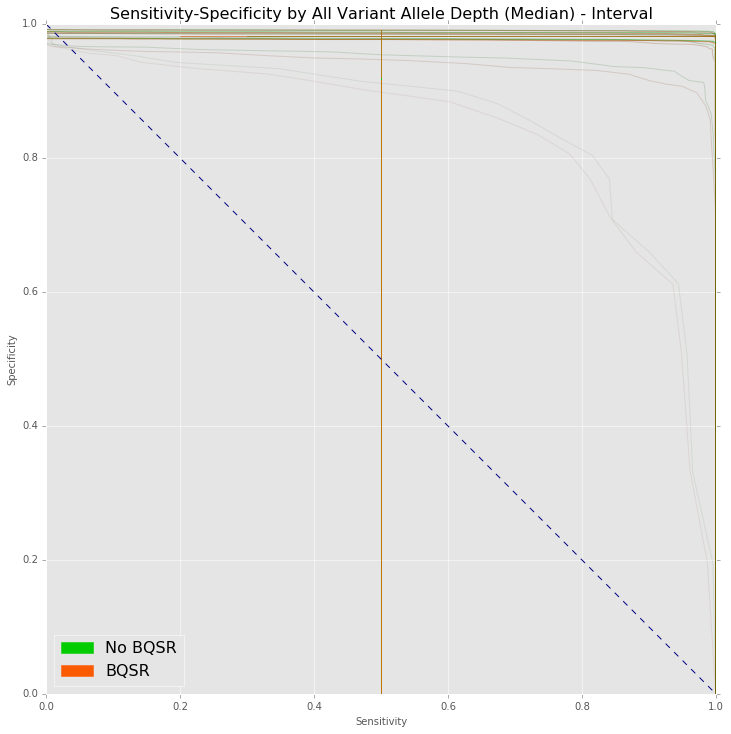

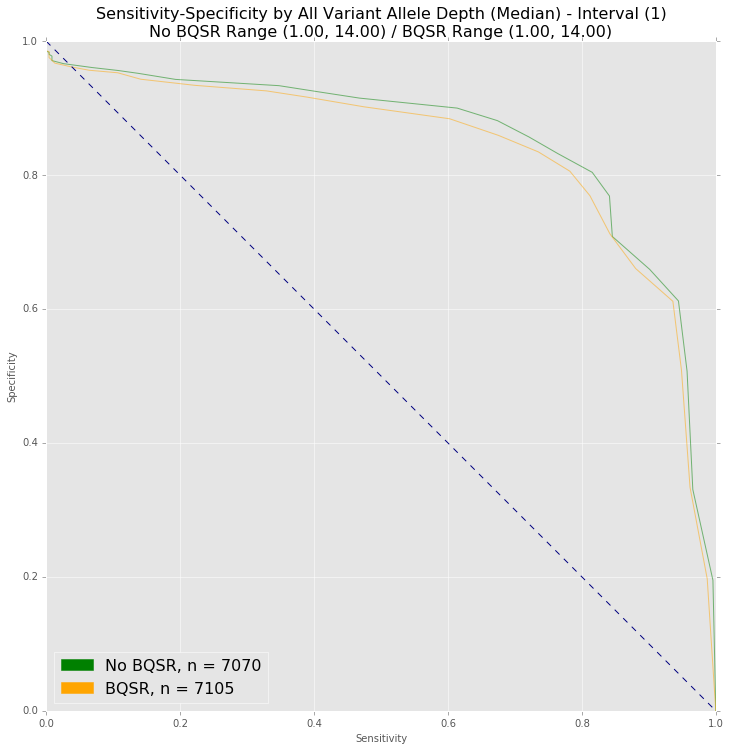

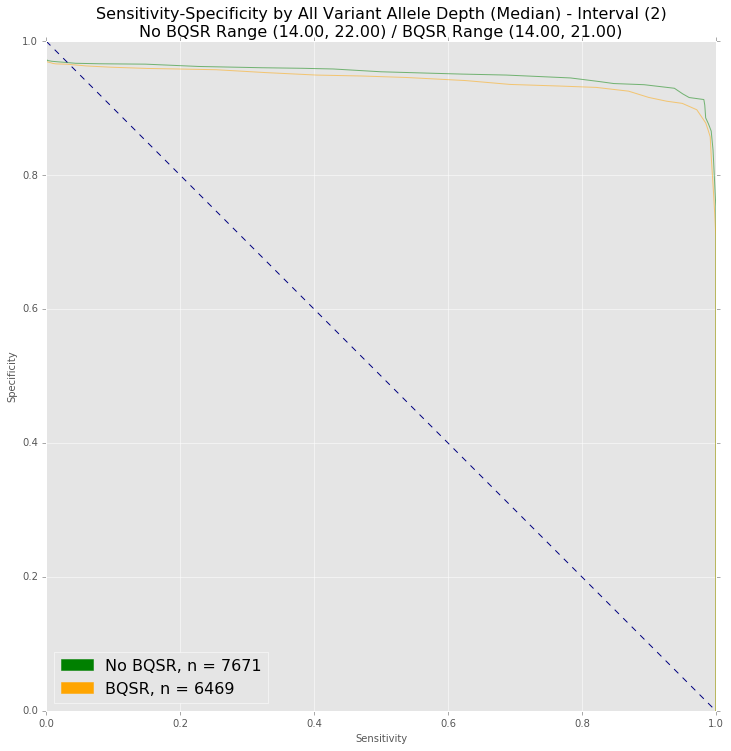

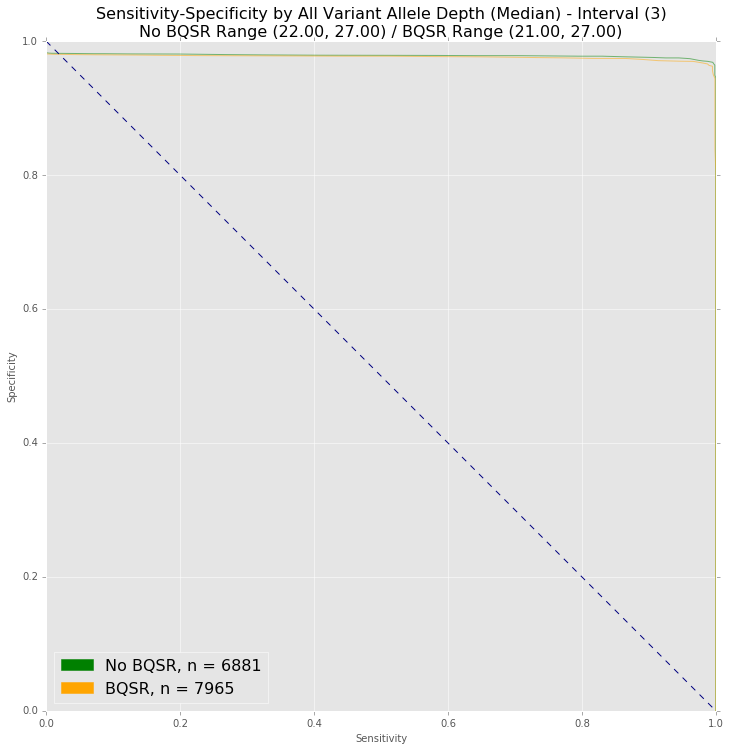

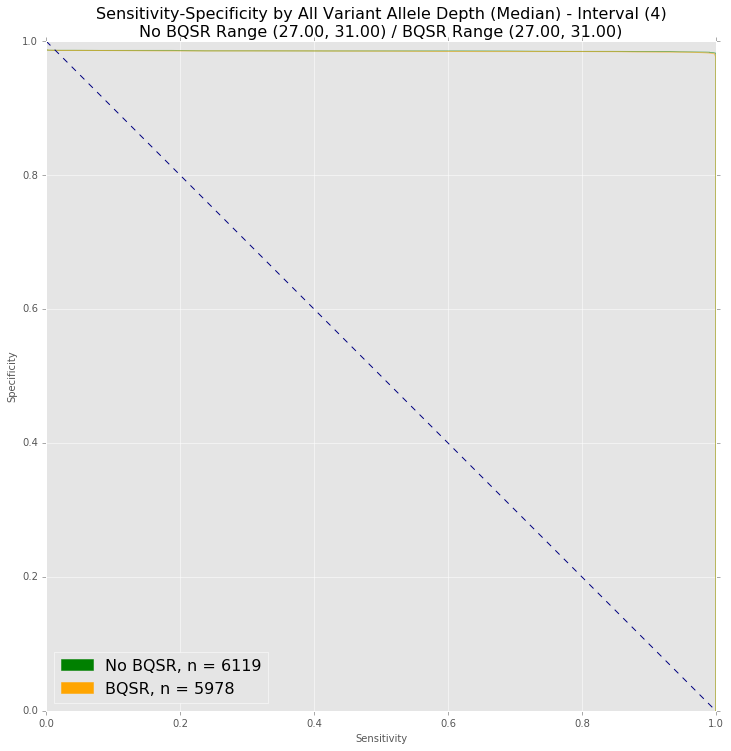

...

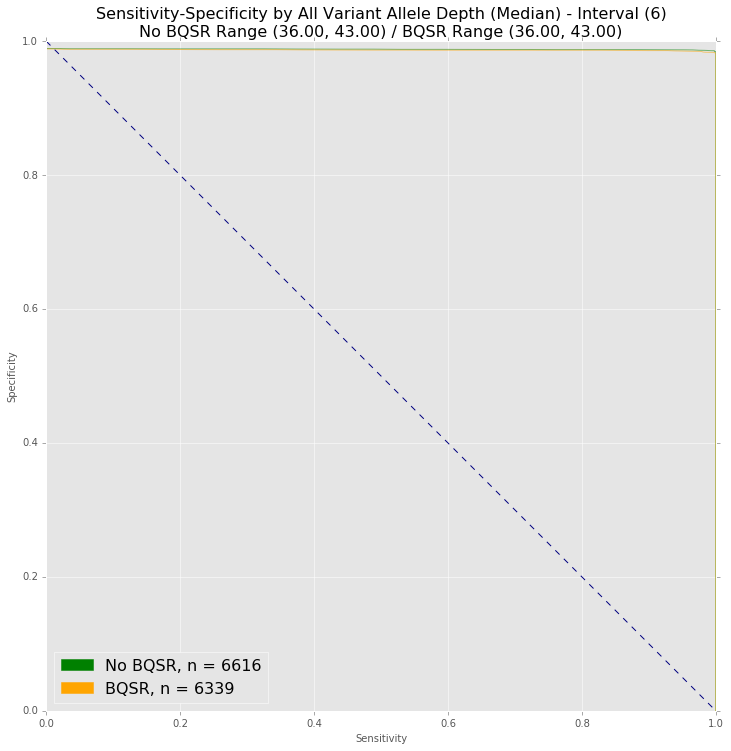

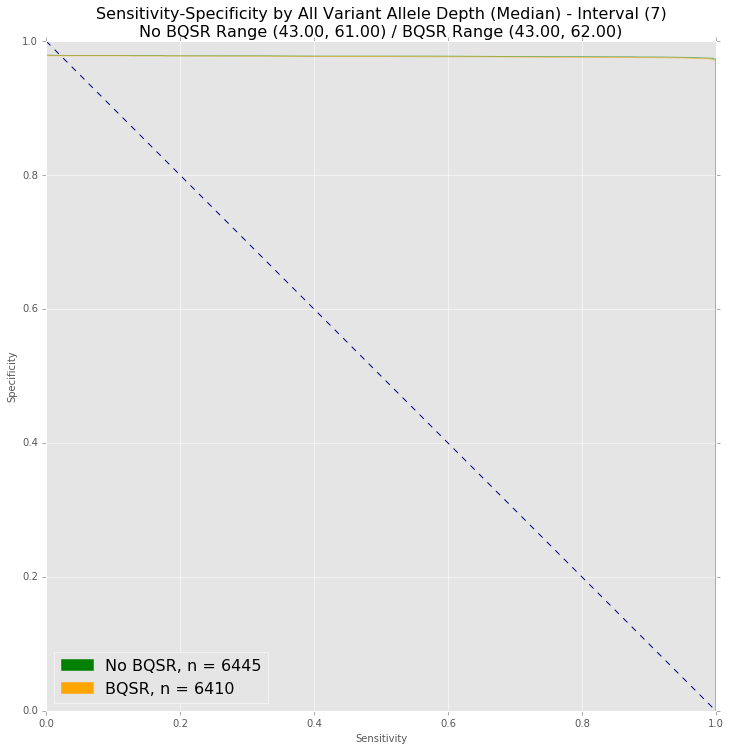

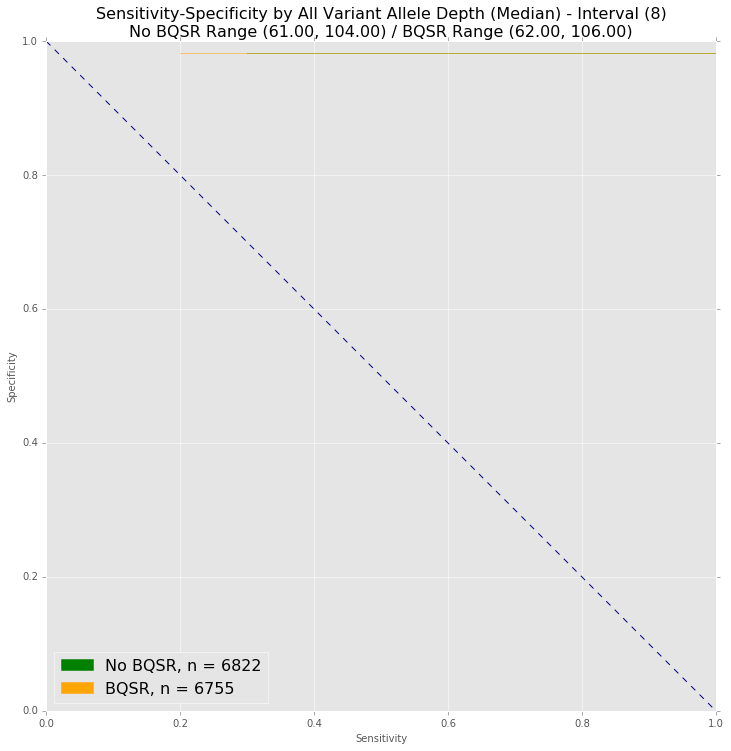

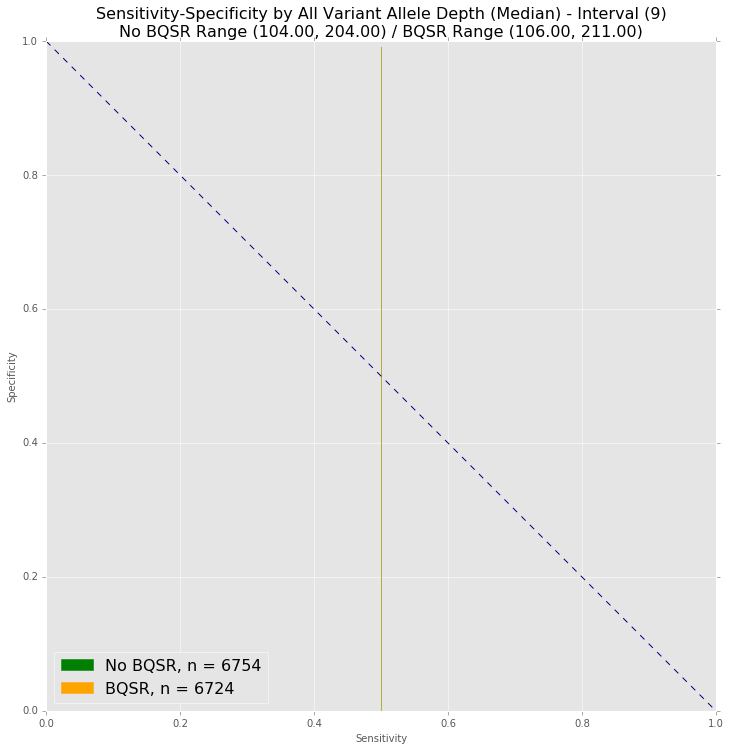

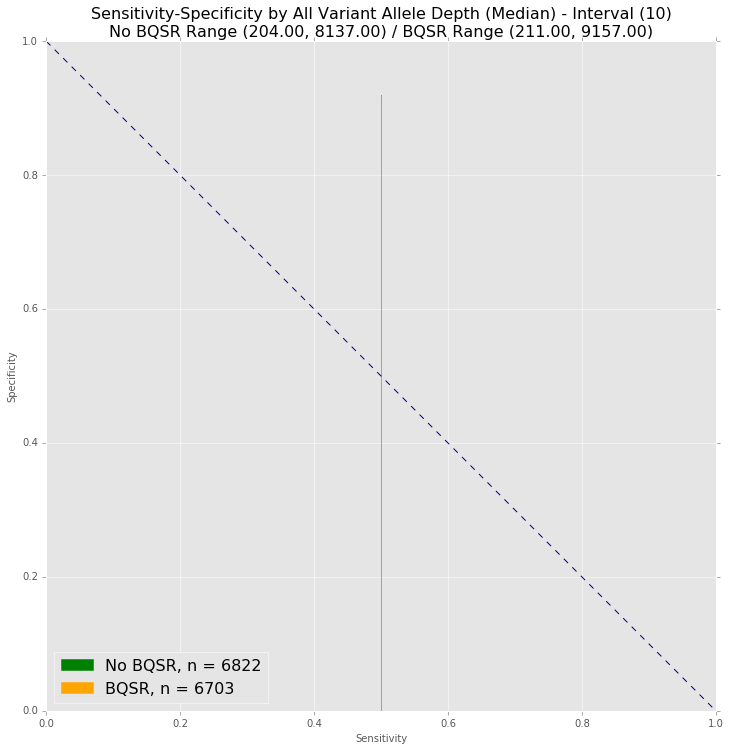

In [39]:
#
# Generate Sens-Spec Curves by Median Subsets
#

# As One Plot
multiCurve(c1AdMedianTups, c2AdMedianTups, trSet, c1HashMap, c2HashMap, subsetKey = "AD", c1Label = "No BQSR", c2Label = "BQSR", title = "Sensitivity-Specificity by All Variant Allele Depth (Median) - Interval")

# Individual Plots
plotCurves(c1AdMedianTups, c2AdMedianTups, trSet, c1HashMap, c2HashMap, subsetKey = "AD", c1Label = "No BQSR", c2Label = "BQSR", titleStr = "Sensitivity-Specificity by All Variant Allele Depth (Median) - Interval")

## Detected Variants by Variant Allele Frequency - All

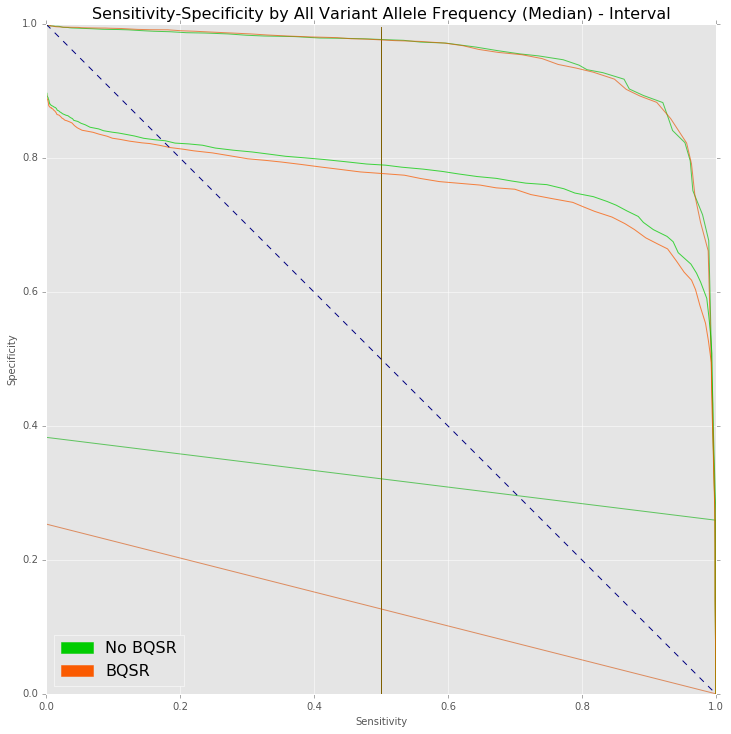

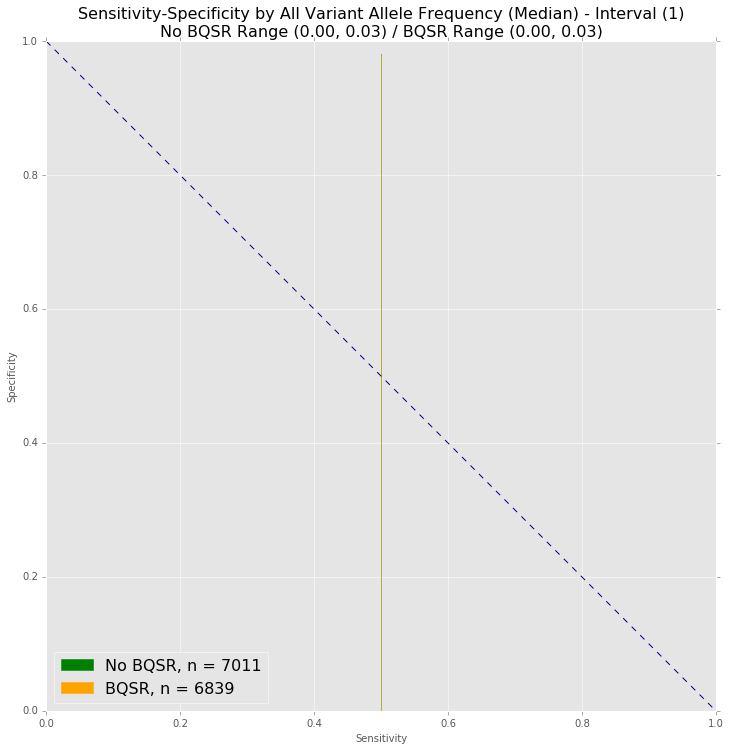

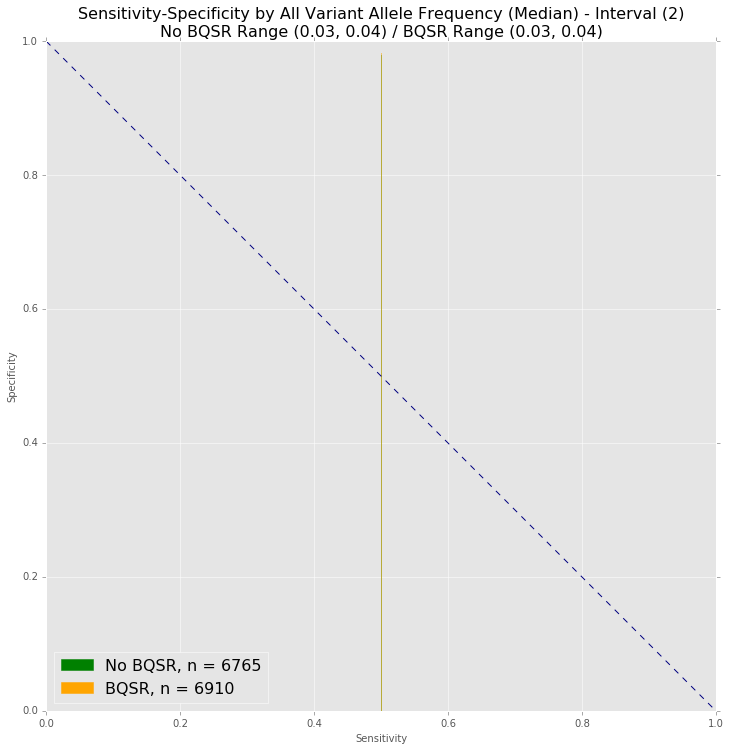

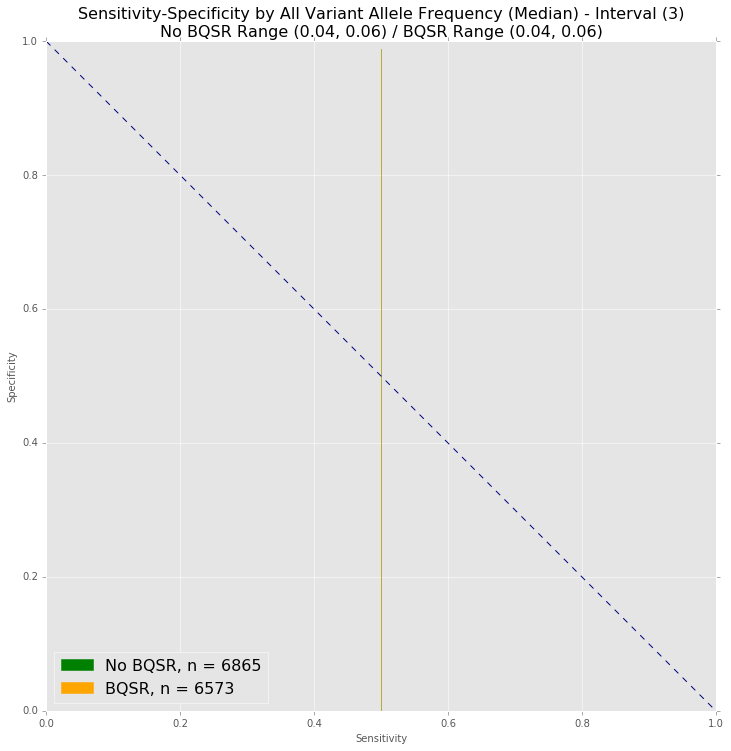

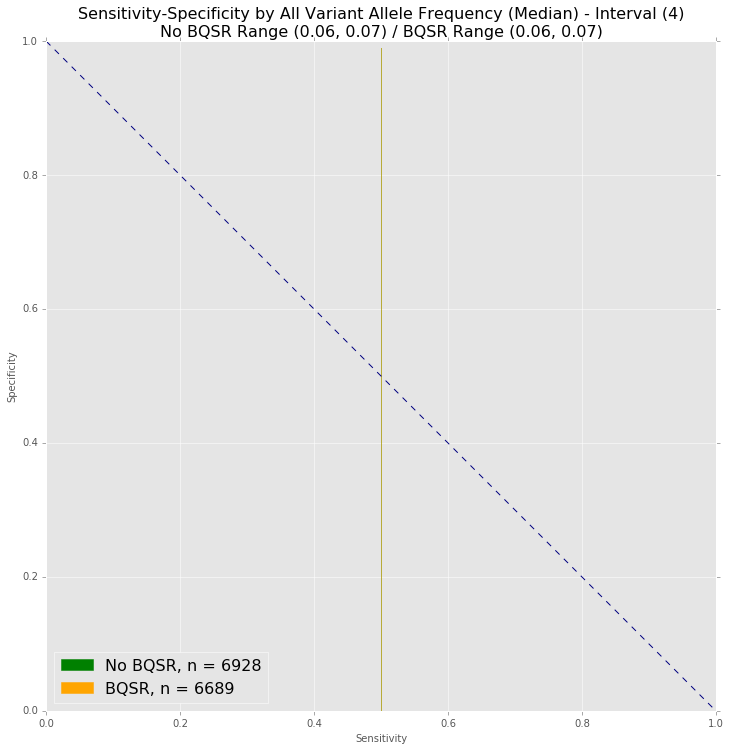

...

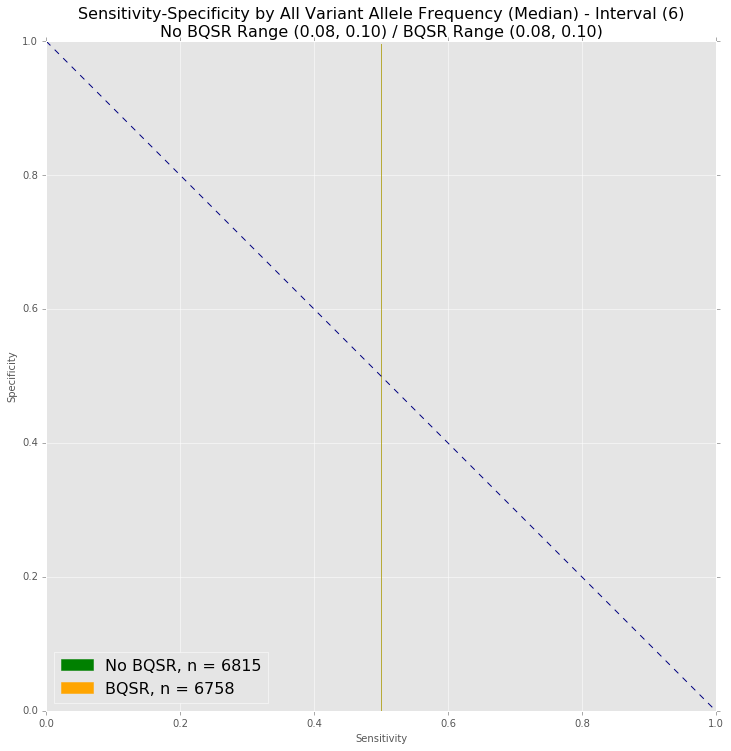

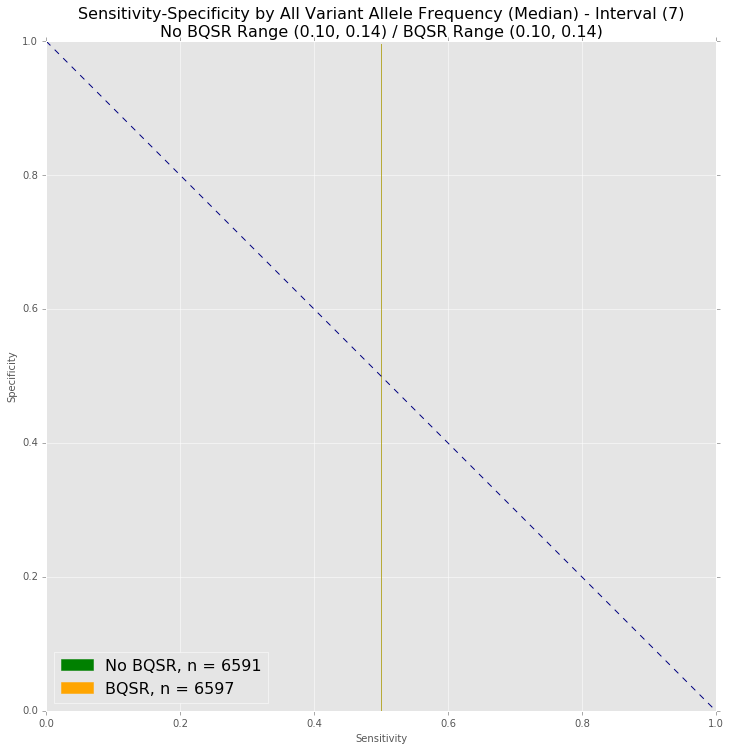

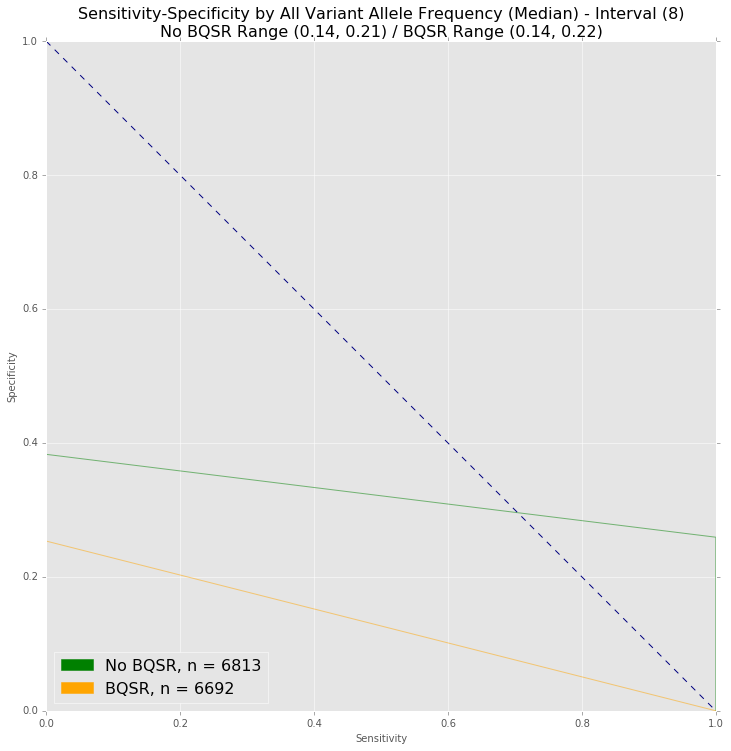

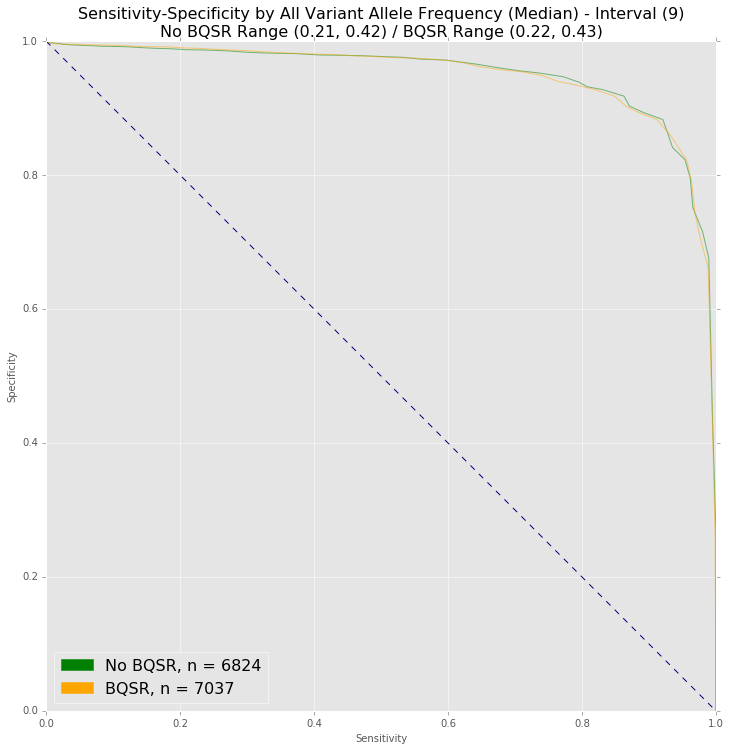

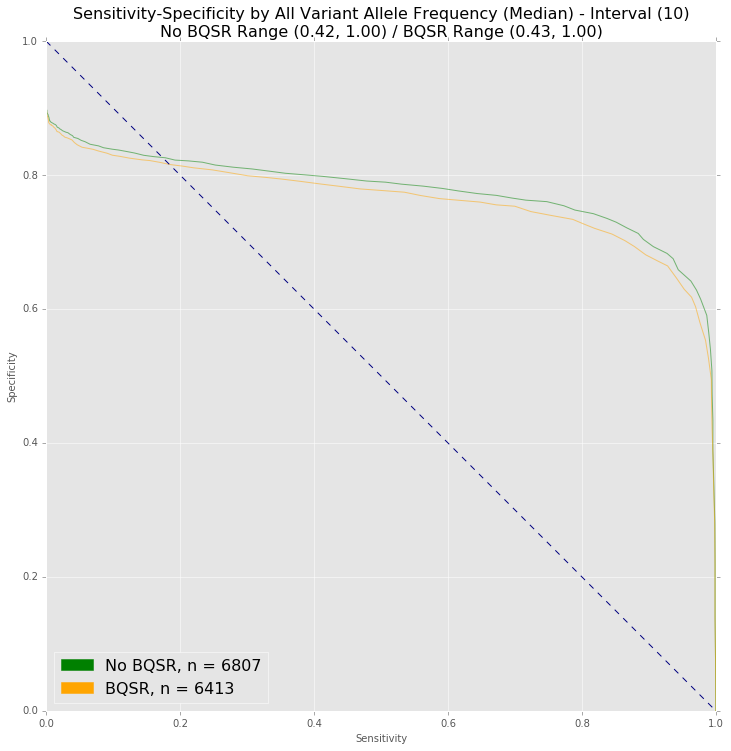

In [40]:
#
# Generate Sens-Spec Curves by Median Subsets
#

# As One Plot
multiCurve(c1AfMedianTups, c2AfMedianTups, trSet, c1HashMap, c2HashMap, subsetKey = "AF", c1Label = "No BQSR", c2Label = "BQSR", title = "Sensitivity-Specificity by All Variant Allele Frequency (Median) - Interval")

# Individual Plots
plotCurves(c1AfMedianTups, c2AfMedianTups, trSet, c1HashMap, c2HashMap, subsetKey = "AF", c1Label = "No BQSR", c2Label = "BQSR", titleStr = "Sensitivity-Specificity by All Variant Allele Frequency (Median) - Interval")

## Detected Variants by Quality Score Sum - All

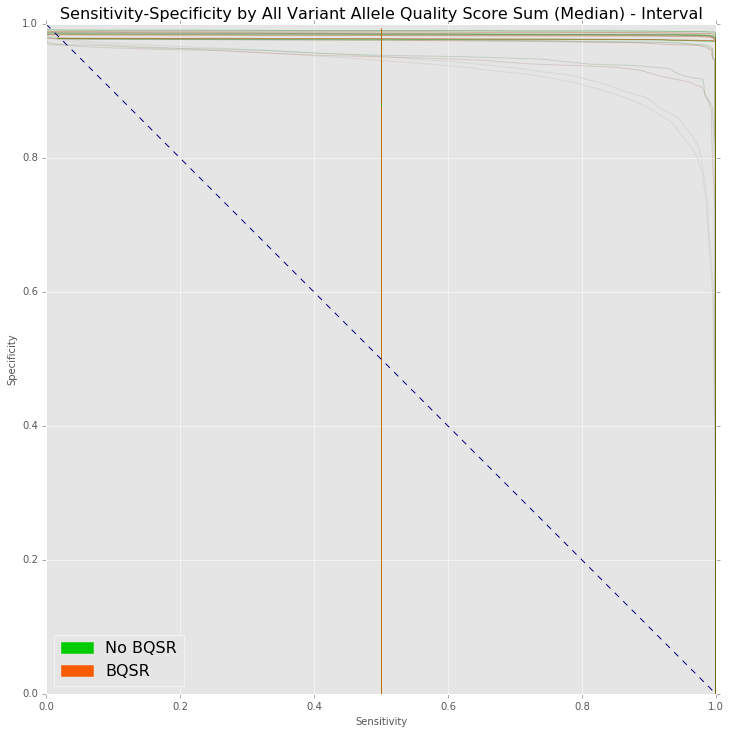

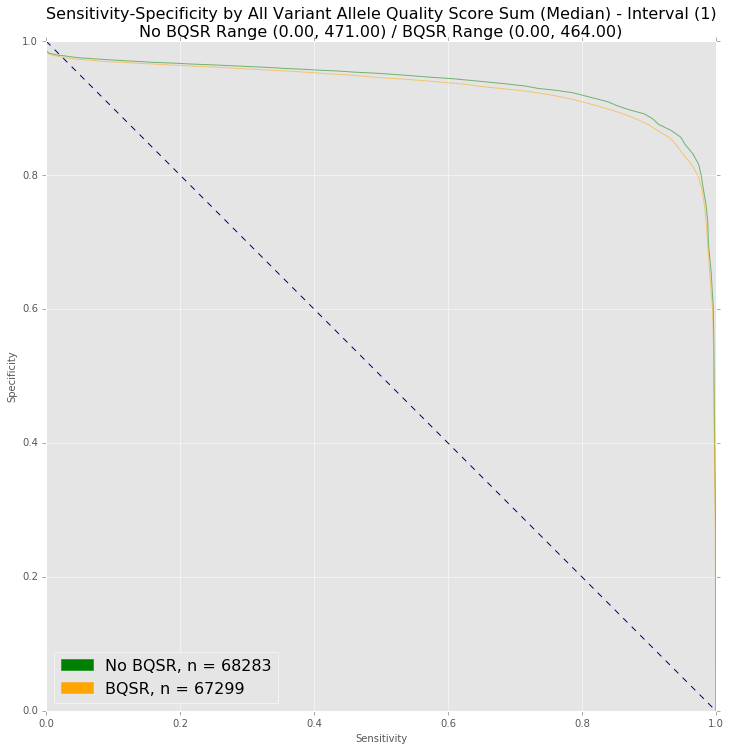

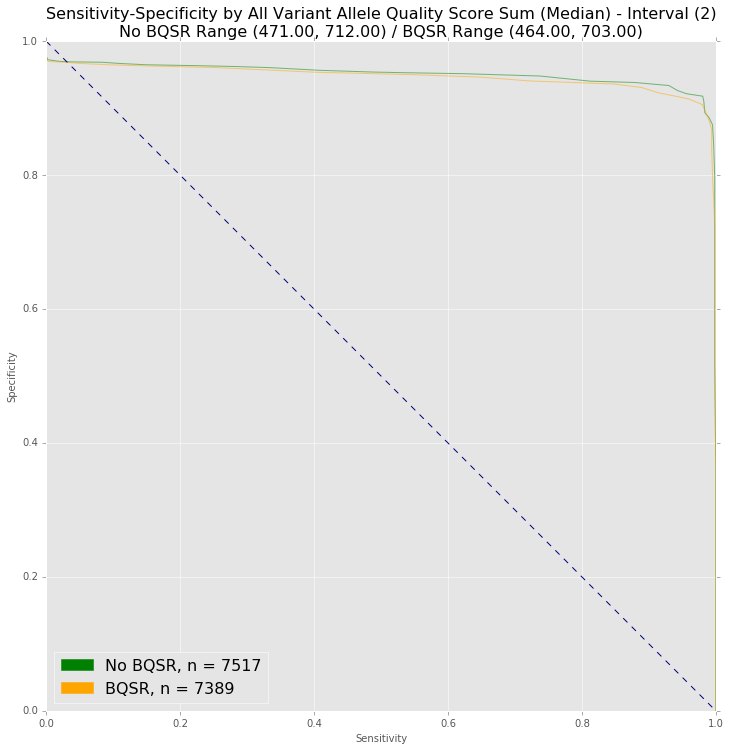

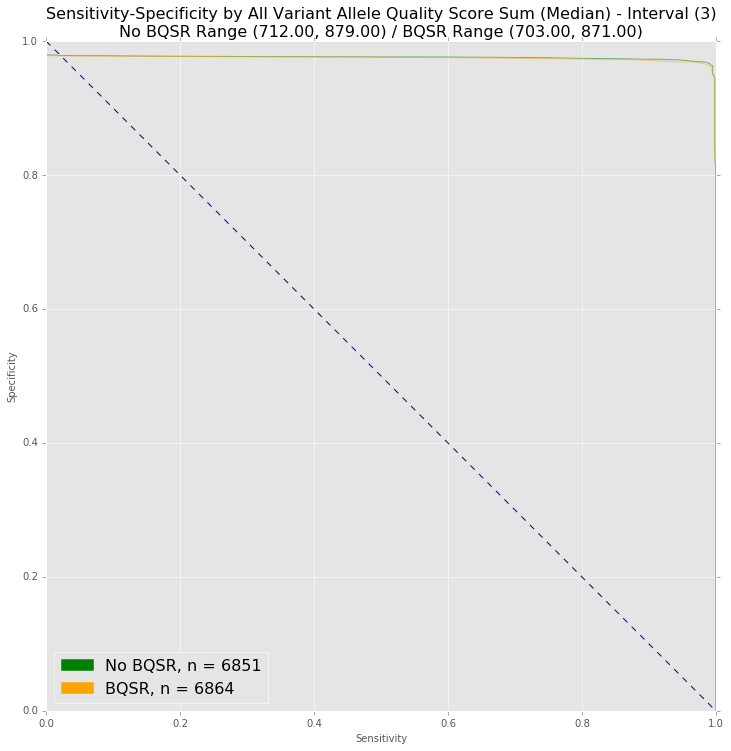

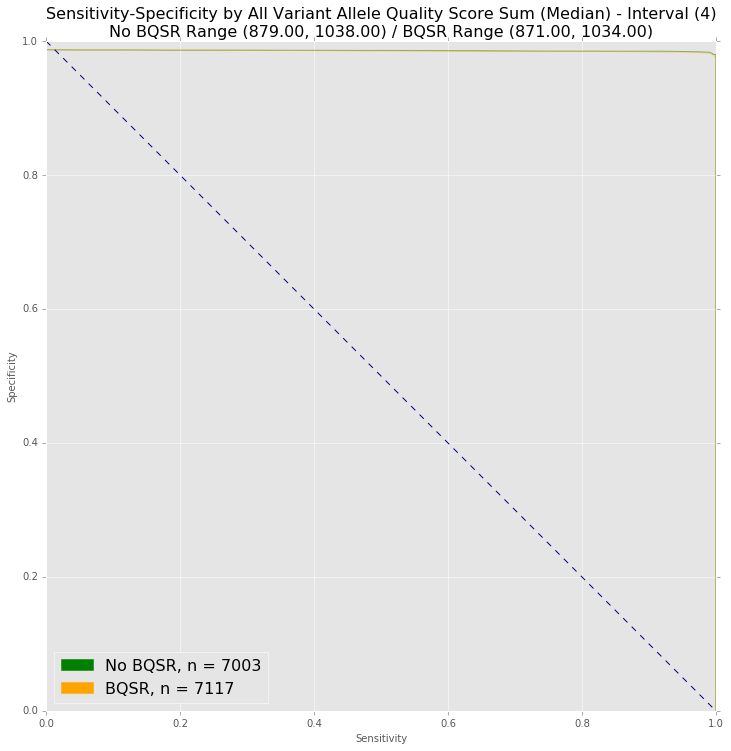

...

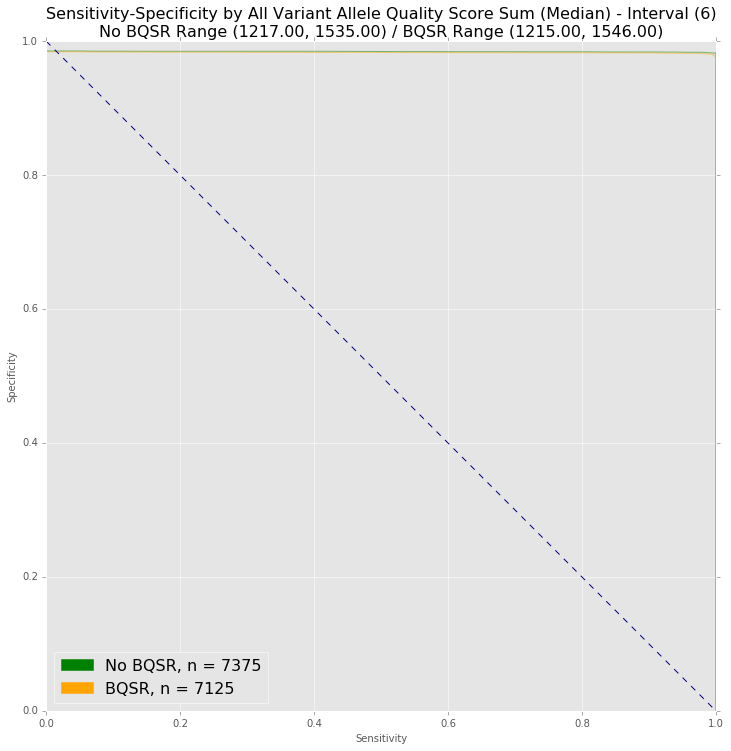

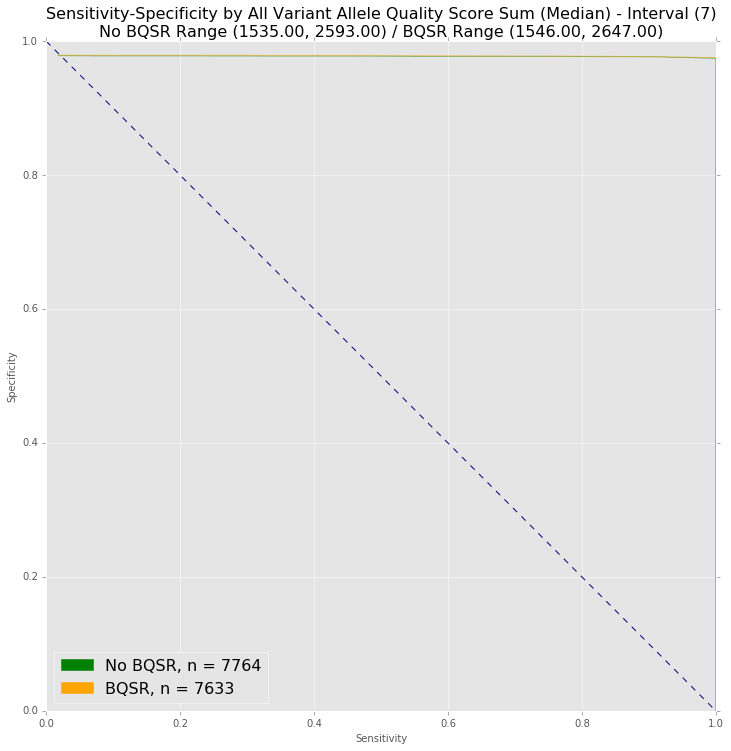

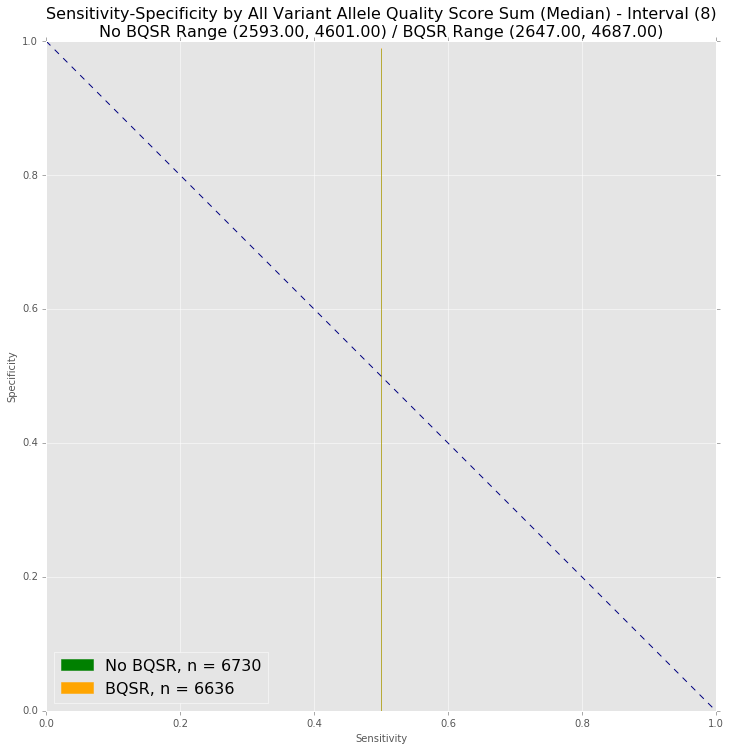

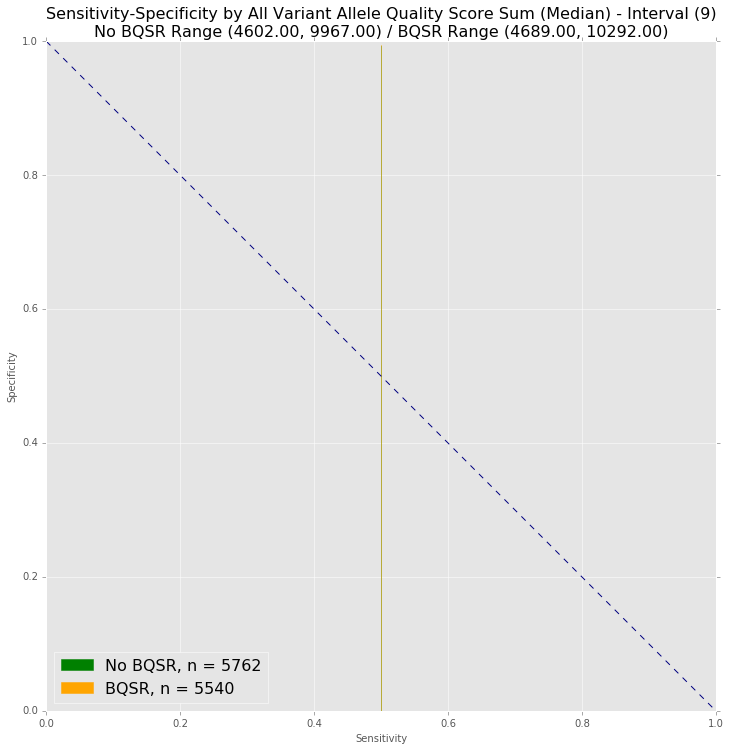

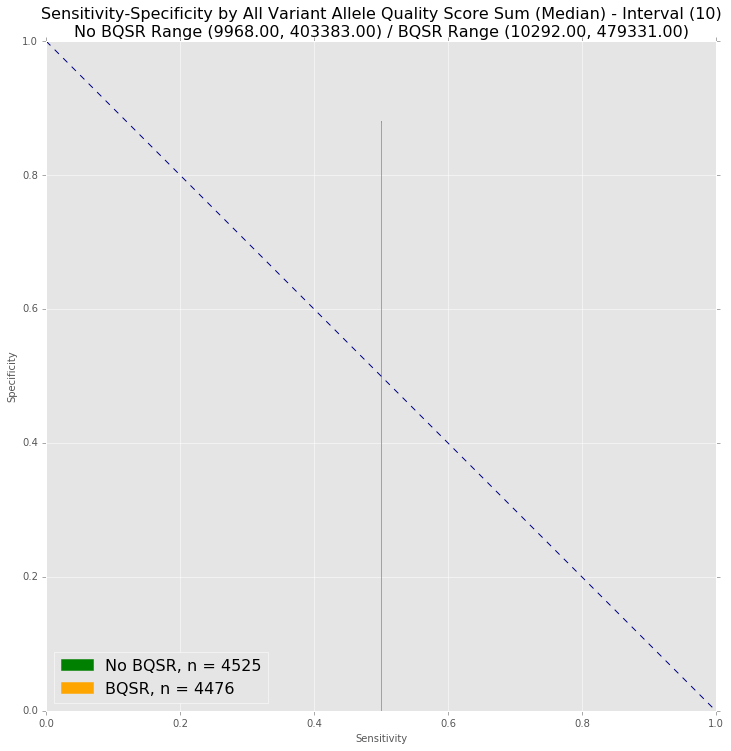

In [41]:
#
# Generate Sens-Spec Curves by Median Subsets
#

# As One Plot
multiCurve(c1QssMedianTups, c2QssMedianTups, trSet, c1HashMap, c2HashMap, subsetKey = "QSS", c1Label = "No BQSR", c2Label = "BQSR", title = "Sensitivity-Specificity by All Variant Allele Quality Score Sum (Median) - Interval")

# Individual Plots
plotCurves(c1QssMedianTups, c2QssMedianTups, trSet, c1HashMap, c2HashMap, subsetKey = "QSS", c1Label = "No BQSR", c2Label = "BQSR", titleStr = "Sensitivity-Specificity by All Variant Allele Quality Score Sum (Median) - Interval")


## Detected Variants by Dinucleotide Context - All

# Breakapart Curve Analysis - Passing Variants

In [42]:
# 
# Get Metrics to Split on - Passing
# 

# Get Metrics
c1AdVals = sorted([sum(tup) for tup in getFormatData(c1Passing, key = "AD")[0]])
c1AfVals = sorted(getFormatData(c1Passing, key="AF")[0])
c1QssVals = sorted([sum(tup) for tup in getFormatData(c1Passing, key = "QSS", sampleIdx = 1)[0]])

c2AdVals = sorted([sum(tup) for tup in getFormatData(c2Passing, key = "AD")[0]])
c2AfVals = sorted(getFormatData(c2Passing, key="AF")[0])
c2QssVals = sorted([sum(tup) for tup in getFormatData(c2Passing, key = "QSS", sampleIdx = 1)[0]])

#
# Compute Splits
#

# Generate Splits - No BQSR - By Index
c1AdMedianSplits, c1AdMedianRanges = generateSplits(c1AdVals, n=10, median = True)
c1AfMedianSplits, c1AfMedianRanges = generateSplits(c1AfVals, n=10, median = True)
c1QssMedianSplits, c1QssMedianRanges = generateSplits(c1QssVals, n=10, median = True)

# Generate Splits - BQSR - By Index
c2AdMedianSplits, c2AdMedianRanges = generateSplits(c2AdVals, n=10, median = True)
c2AfMedianSplits, c2AfMedianRanges = generateSplits(c2AfVals, n=10, median = True)
c2QssMedianSplits, c2QssMedianRanges = generateSplits(c2QssVals, n=10, median = True)

# 
# Compute Range Tuples
# 

# Generate Tuples - No BQSR
c1AdMedianTups = getRanges(c1AdMedianSplits)
c1AfMedianTups = getRanges(c1AfMedianSplits)
c1QssMedianTups = getRanges(c1QssMedianSplits)

# Generate TuplesBQSR
c2AdMedianTups = getRanges(c2AdMedianSplits)
c2AfMedianTups = getRanges(c2AfMedianSplits)
c2QssMedianTups = getRanges(c2QssMedianSplits)

Below Are Sensitivity Specificity Curves 
* by Passing Variants, 
* by Sorted Index or Value, 
* by Allele Depth, Allele Frequency, or Quality Score Sum

All Compared across the BQSR No-BQSR Conditions

## Detected Variants by Coverage - Passing

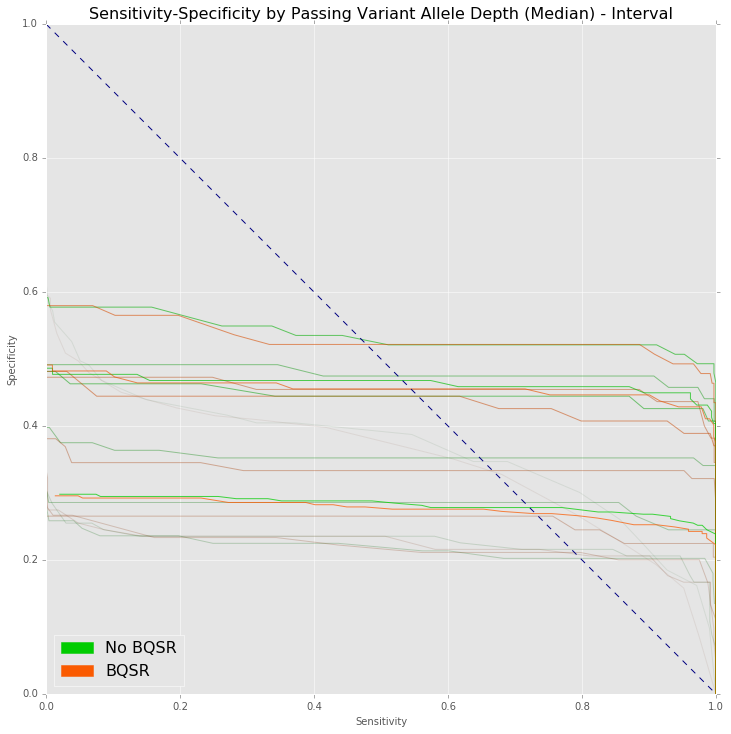

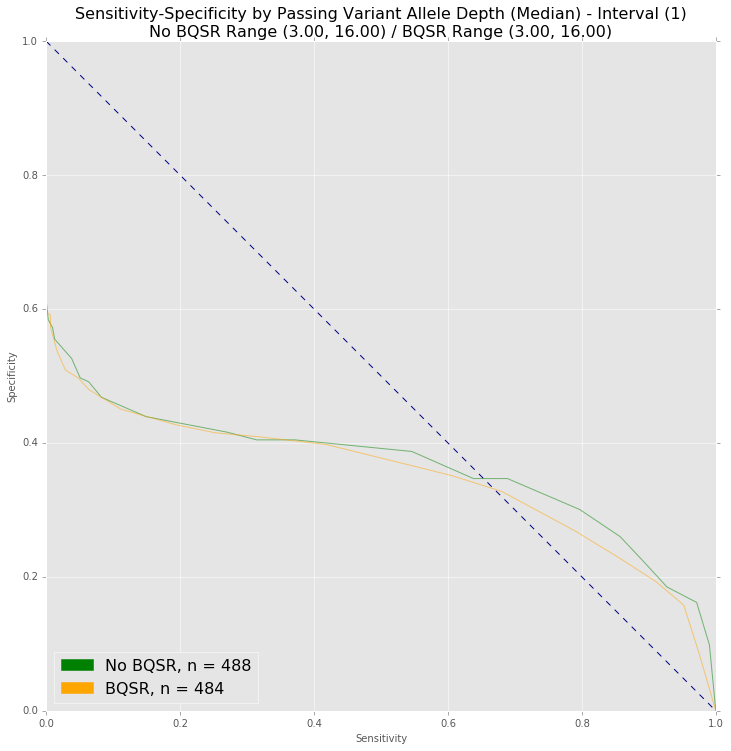

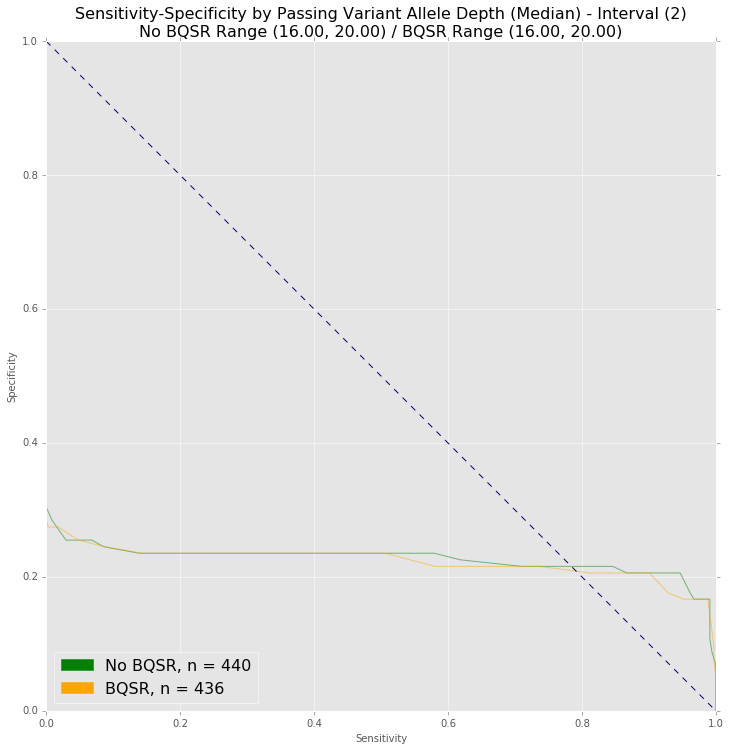

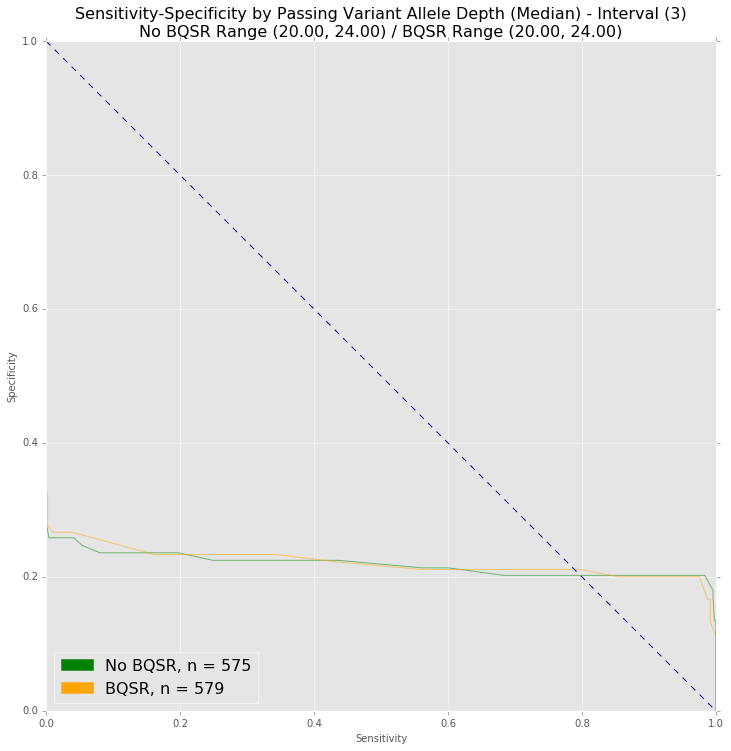

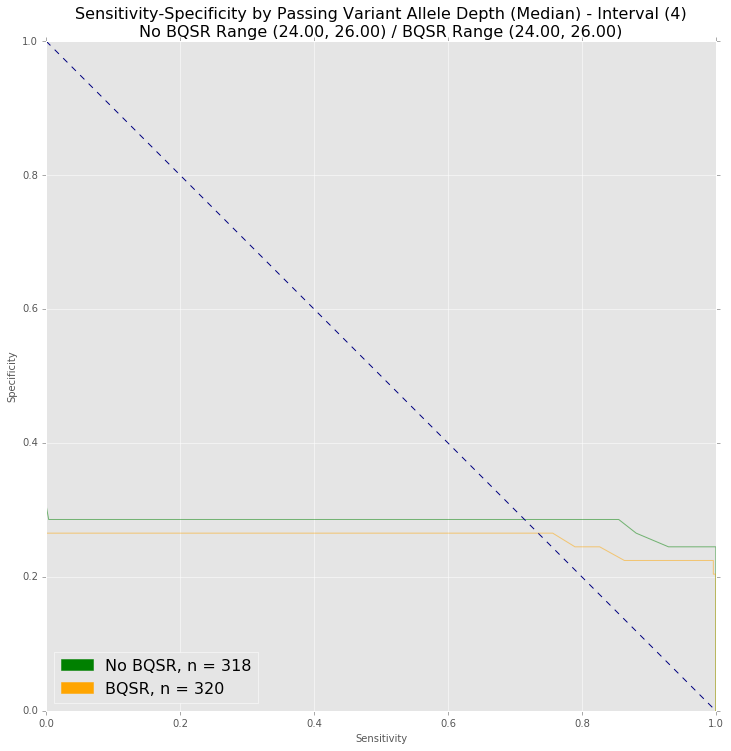

...

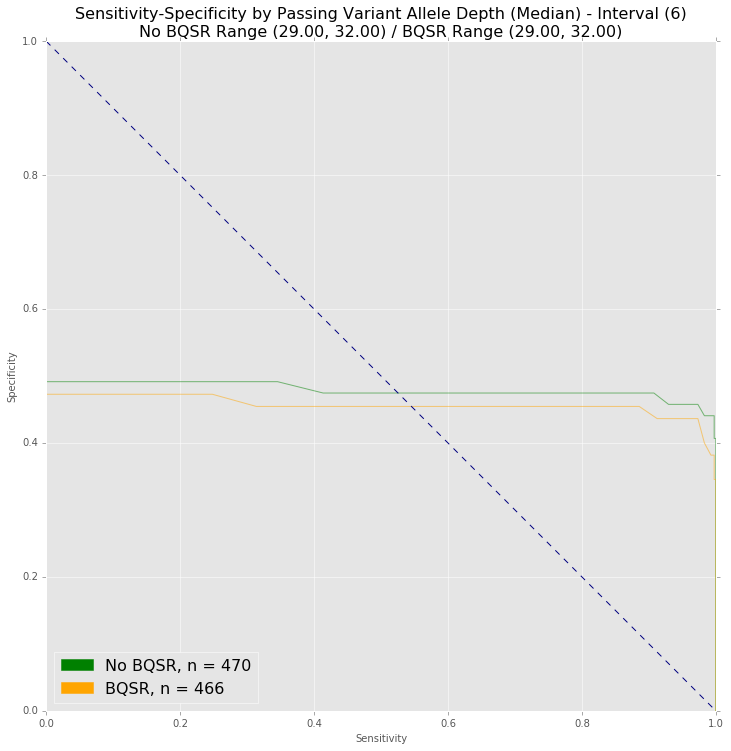

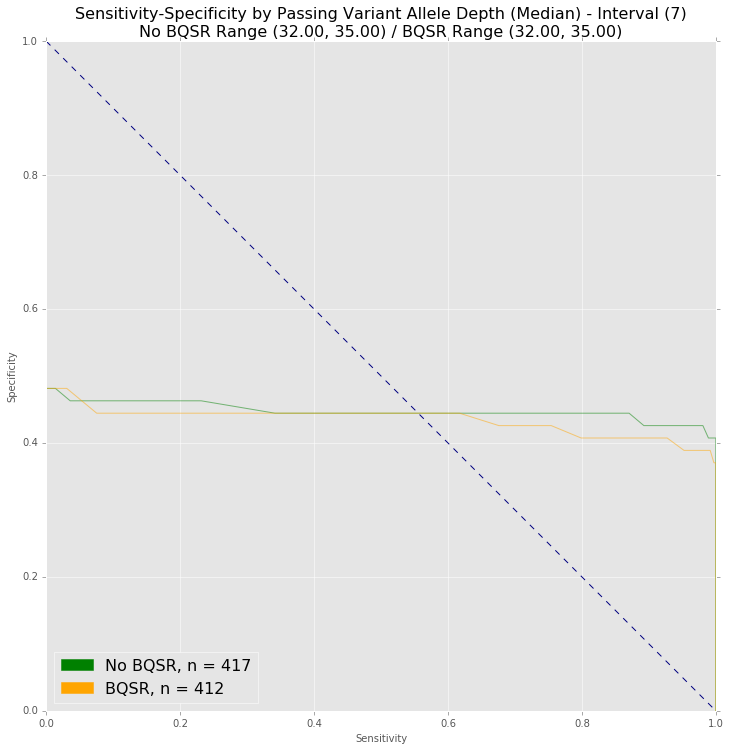

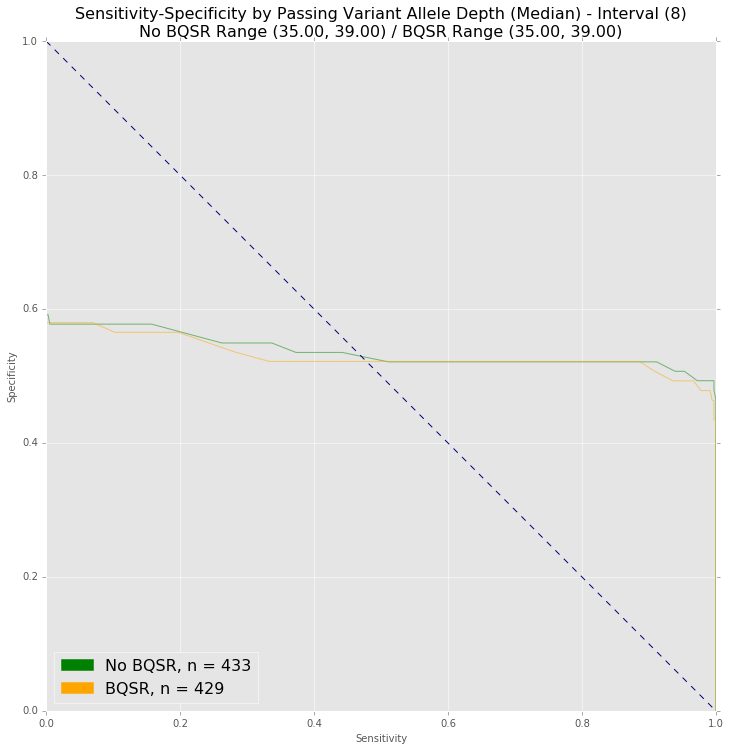

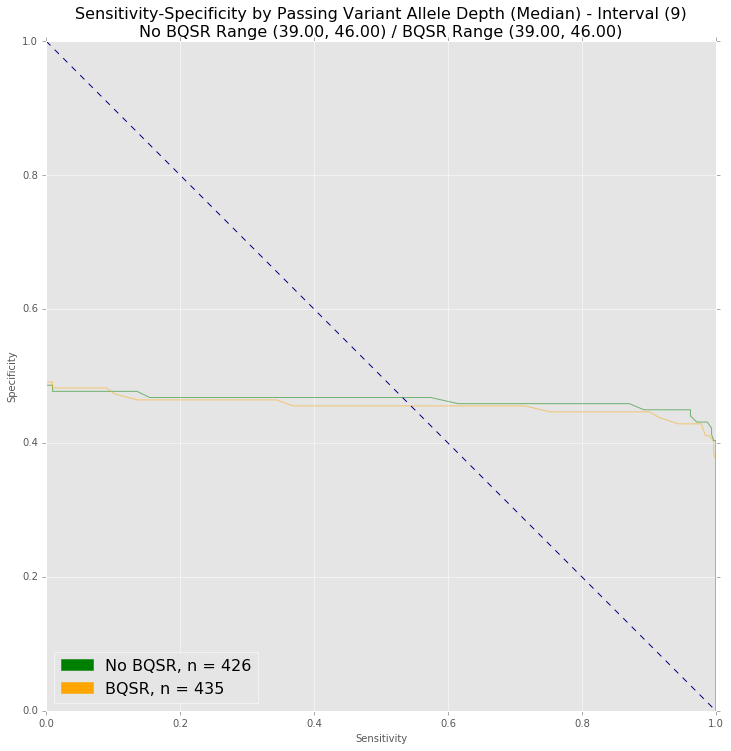

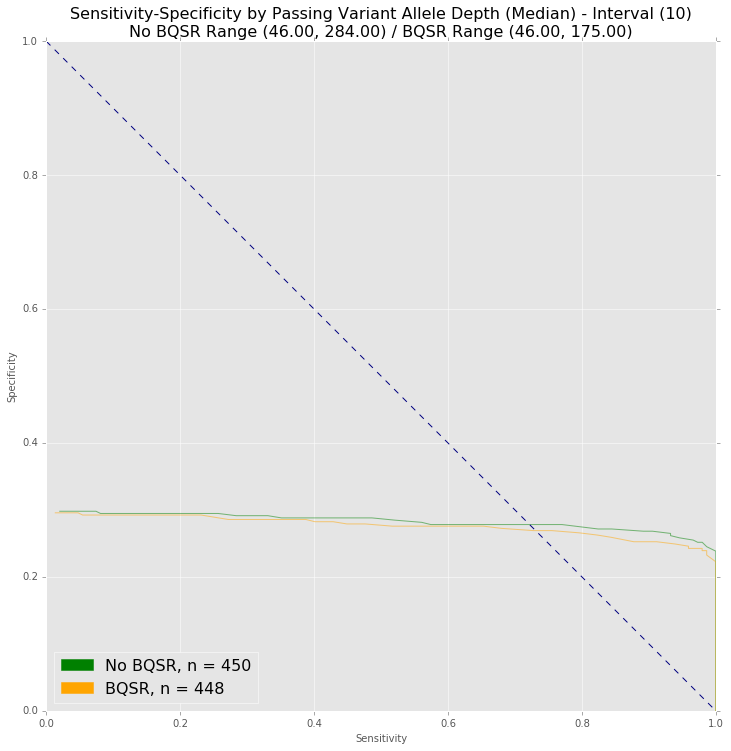

In [43]:
#
# Generate Sens-Spec Curves by Median Subsets
#

# As One Plot
multiCurve(c1AdMedianTups, c2AdMedianTups, trSet, c1Passing, c2Passing, subsetKey = "AD", c1Label = "No BQSR", c2Label = "BQSR", title = "Sensitivity-Specificity by Passing Variant Allele Depth (Median) - Interval")

# Individual Plots
plotCurves(c1AdMedianTups, c2AdMedianTups, trSet, c1Passing, c2Passing, subsetKey = "AD", c1Label = "No BQSR", c2Label = "BQSR", titleStr = "Sensitivity-Specificity by Passing Variant Allele Depth (Median) - Interval")


## Detected Variants by Variant Allele Frequency - Passing

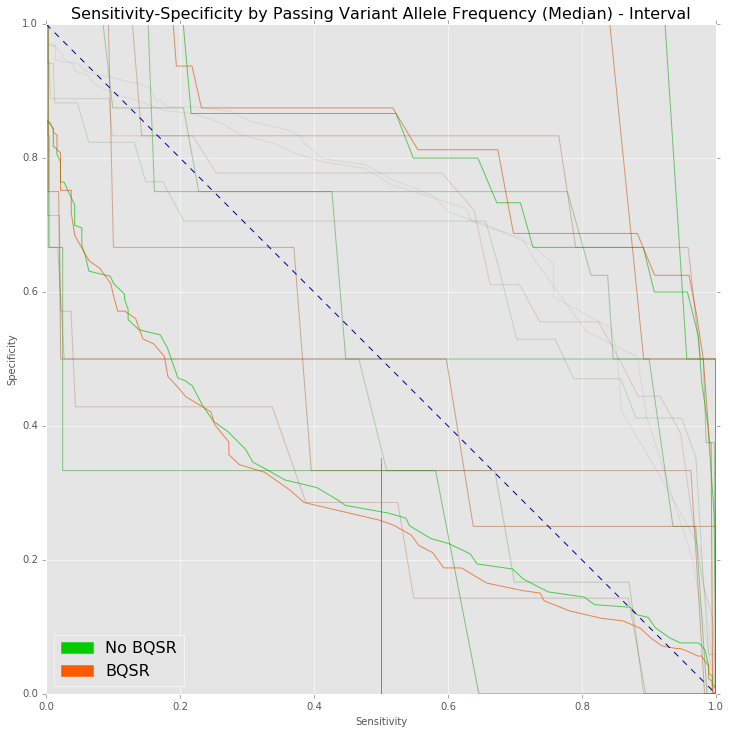

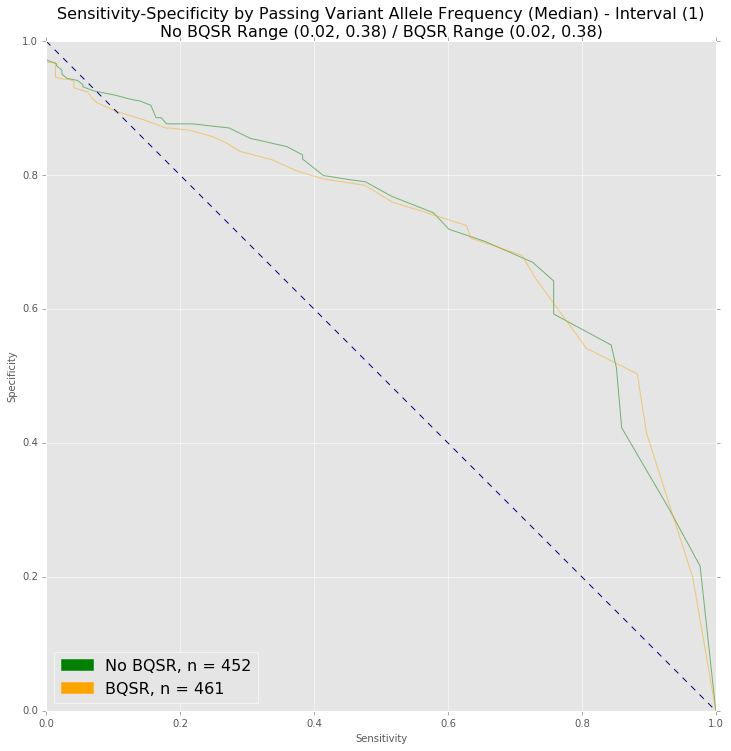

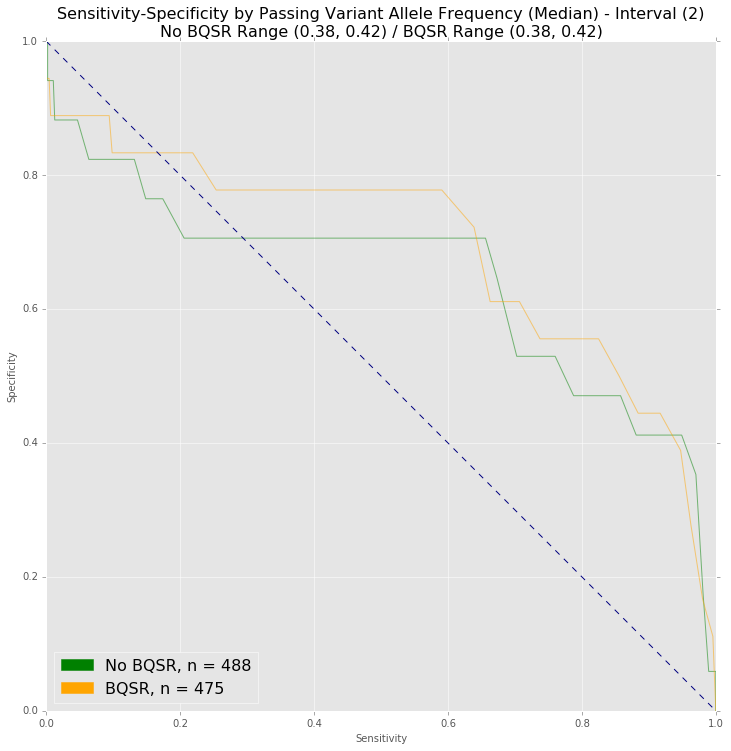

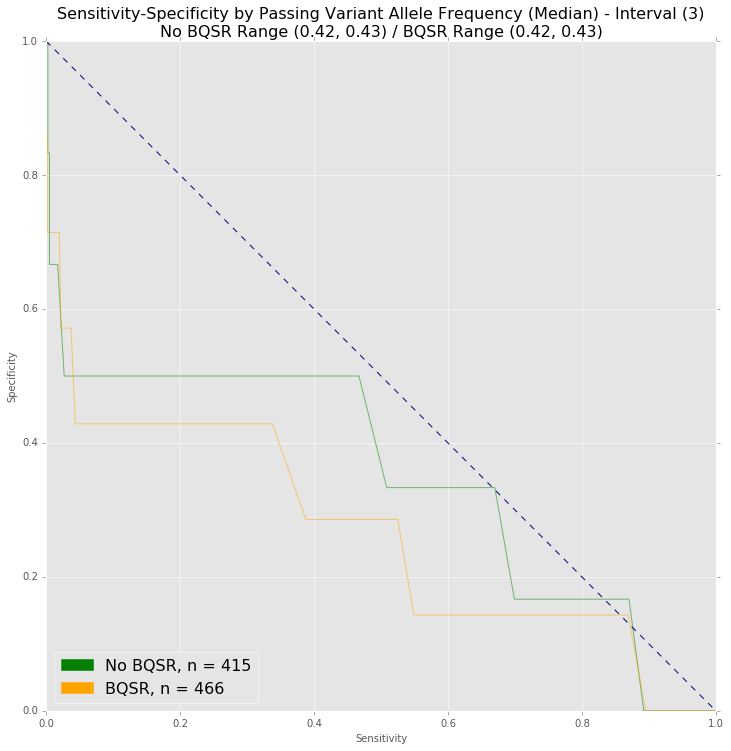

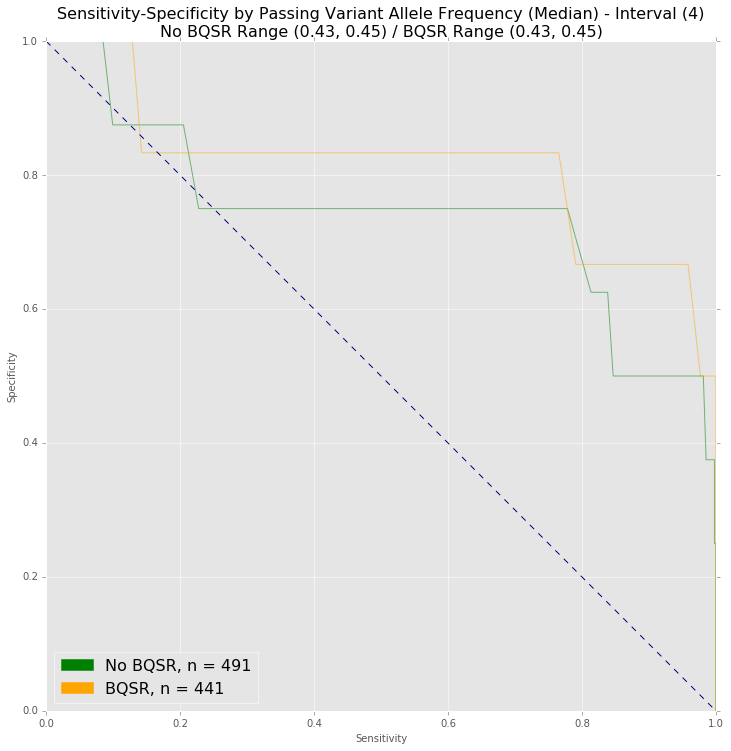

...

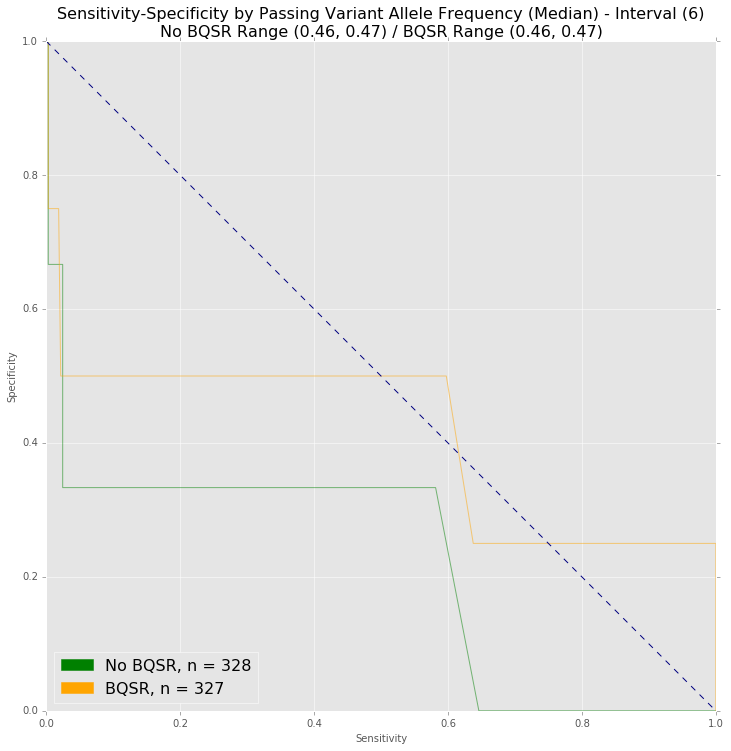

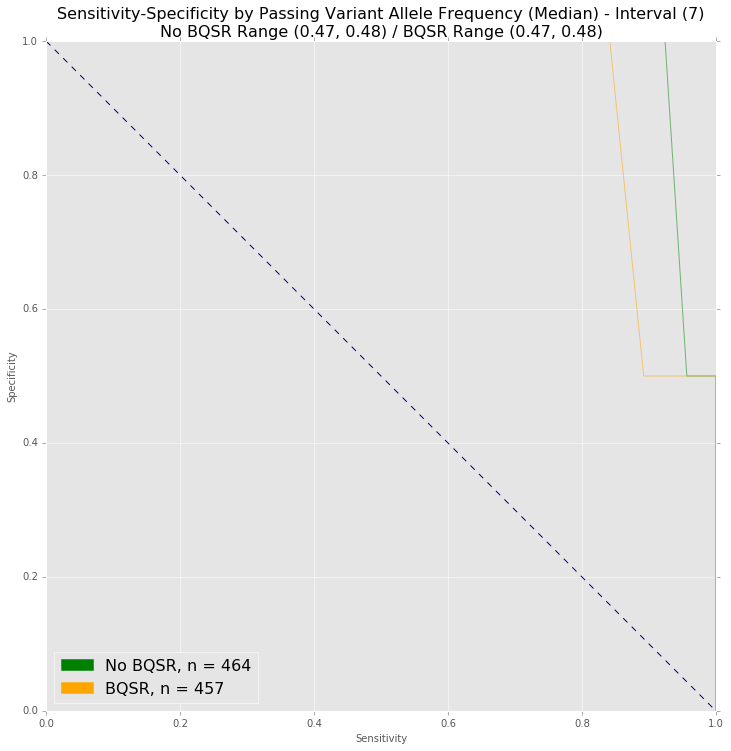

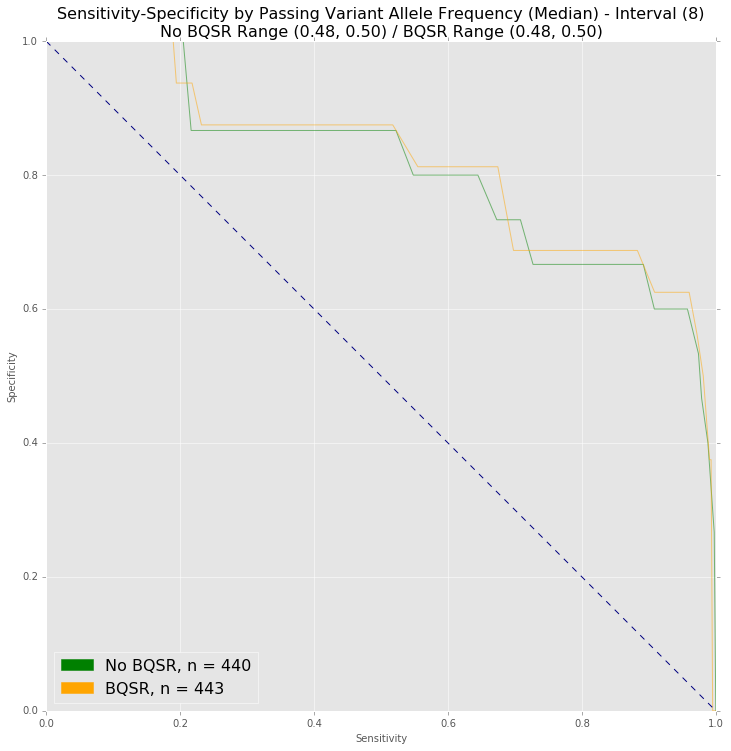

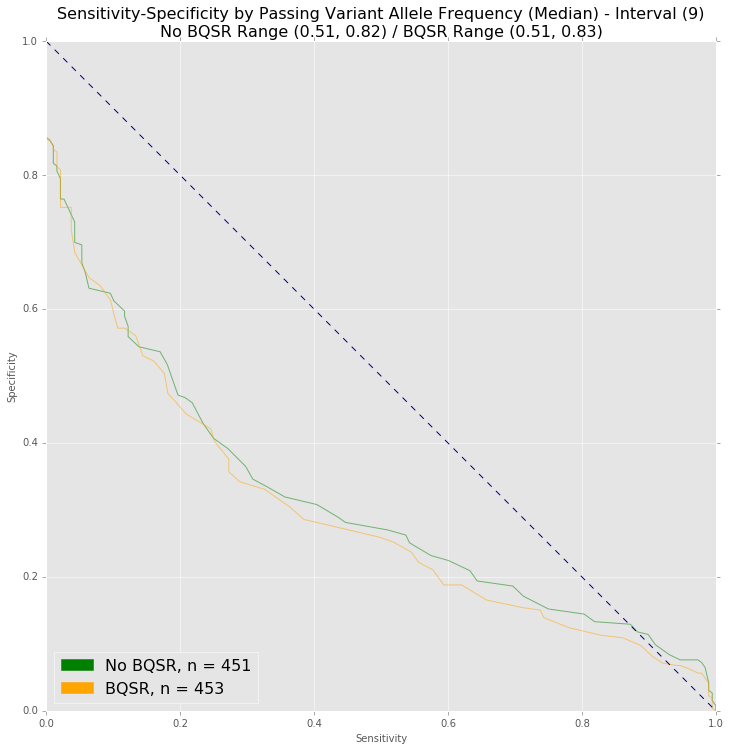

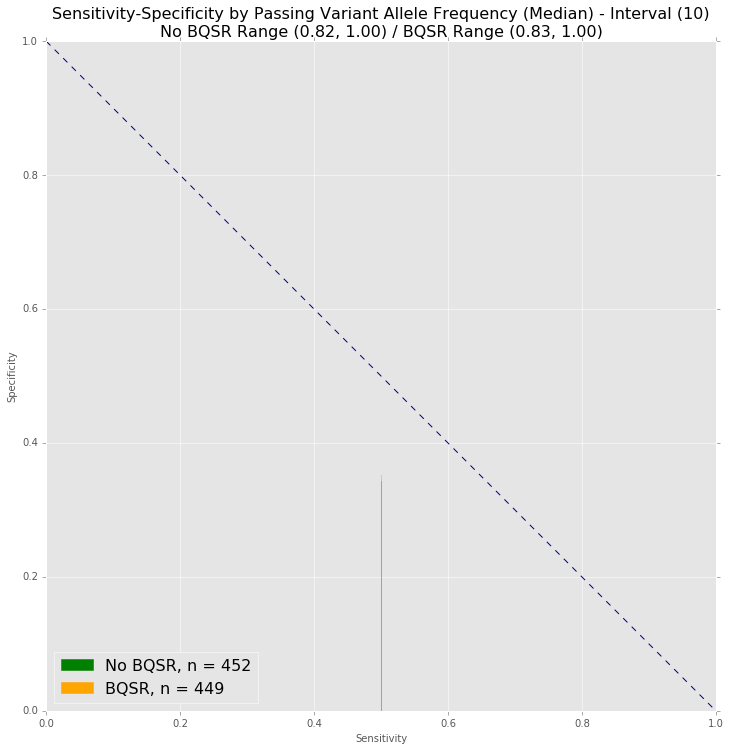

In [44]:
#
# Generate Sens-Spec Curves by Median Subsets
#

# As One Plot
multiCurve(c1AfMedianTups, c2AfMedianTups, trSet, c1Passing, c2Passing, subsetKey = "AF", c1Label = "No BQSR", c2Label = "BQSR", title = "Sensitivity-Specificity by Passing Variant Allele Frequency (Median) - Interval")

# Individual Plots
plotCurves(c1AfMedianTups, c2AfMedianTups, trSet, c1Passing, c2Passing, subsetKey = "AF", c1Label = "No BQSR", c2Label = "BQSR", titleStr = "Sensitivity-Specificity by Passing Variant Allele Frequency (Median) - Interval")

## Detected Variants by Quality Score Sum - Passing

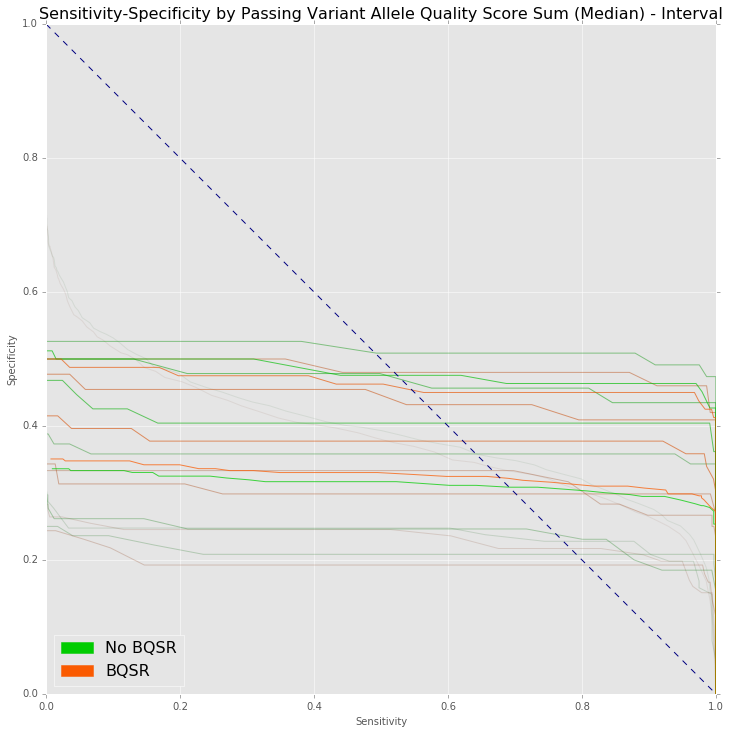

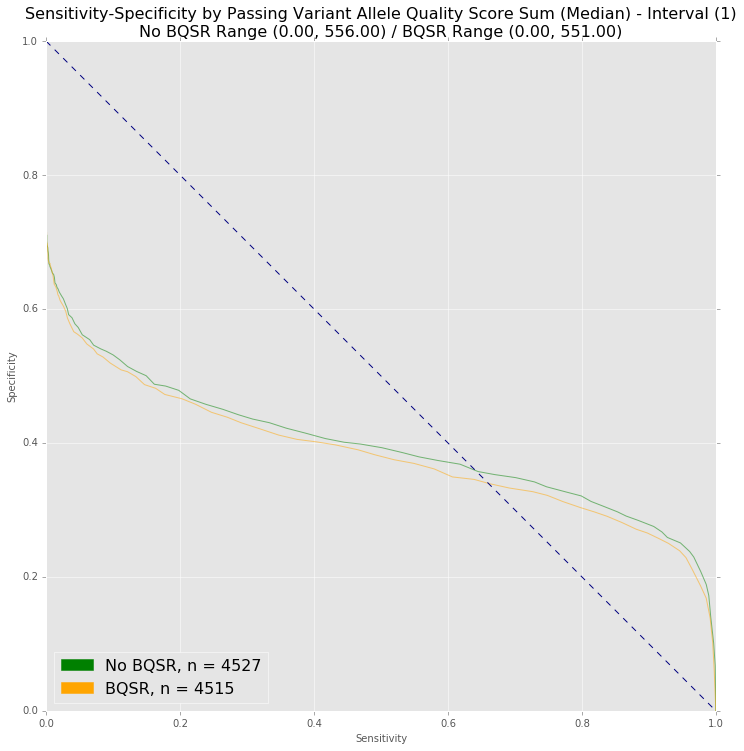

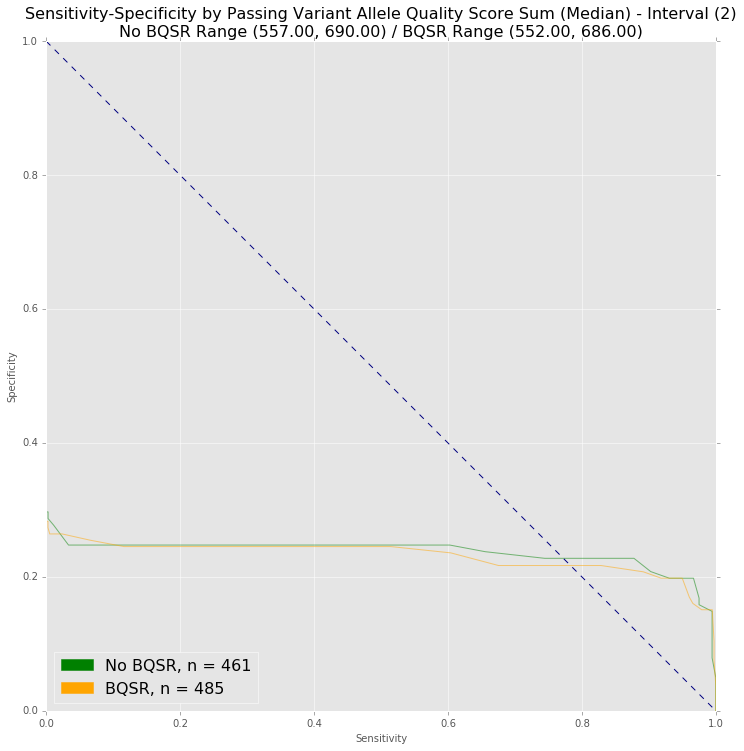

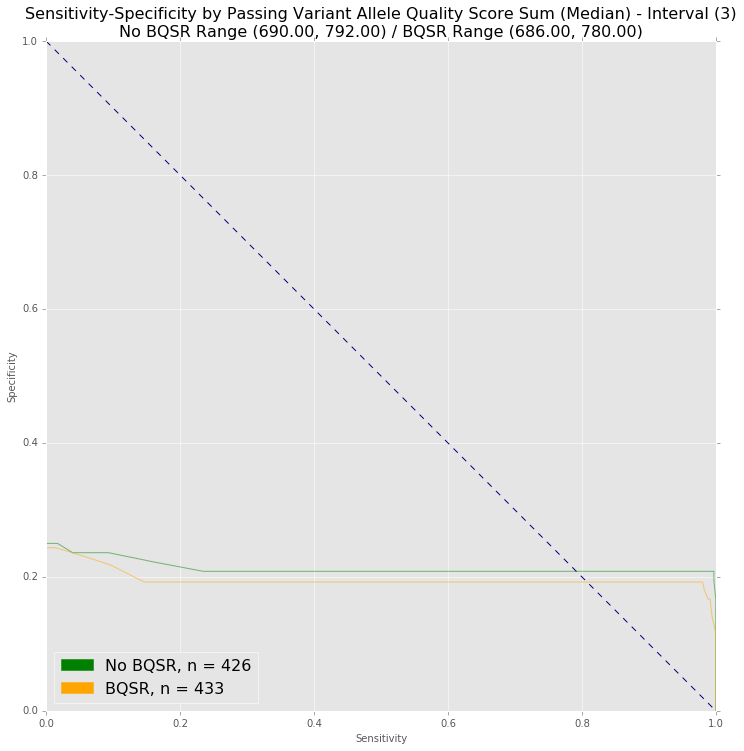

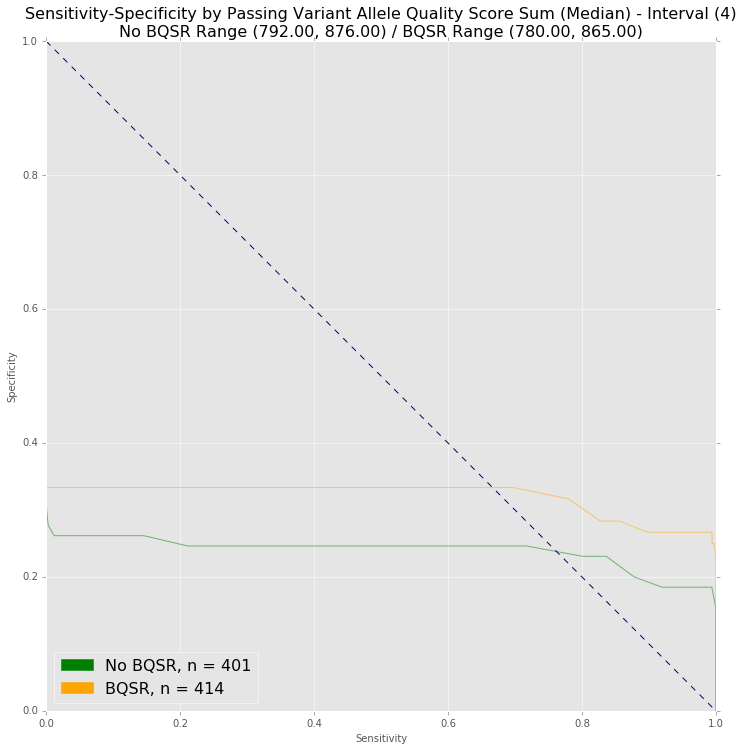

...

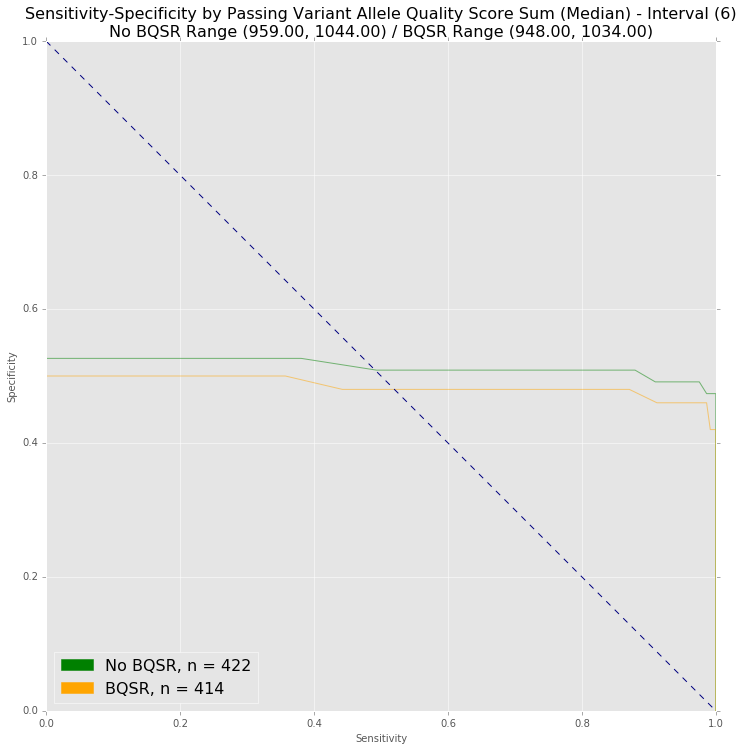

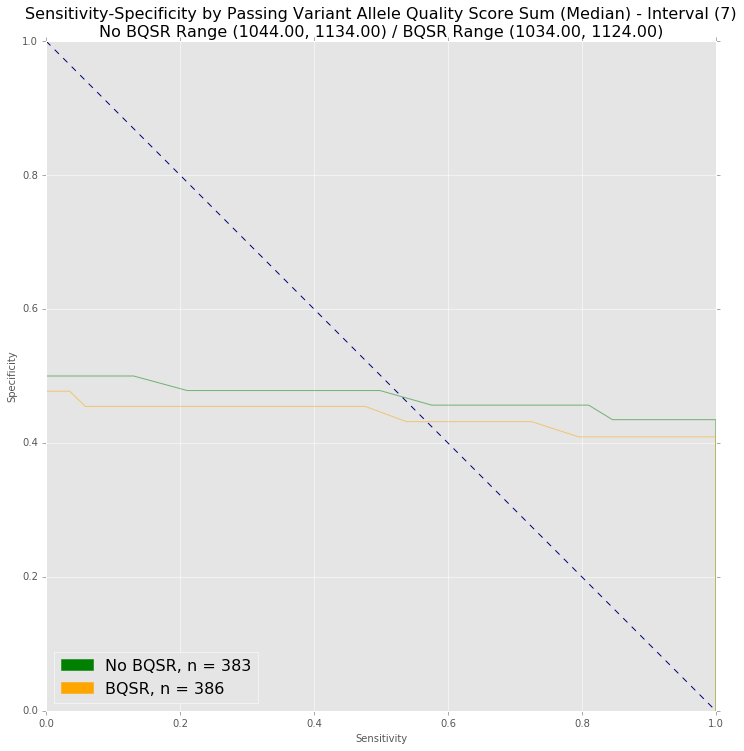

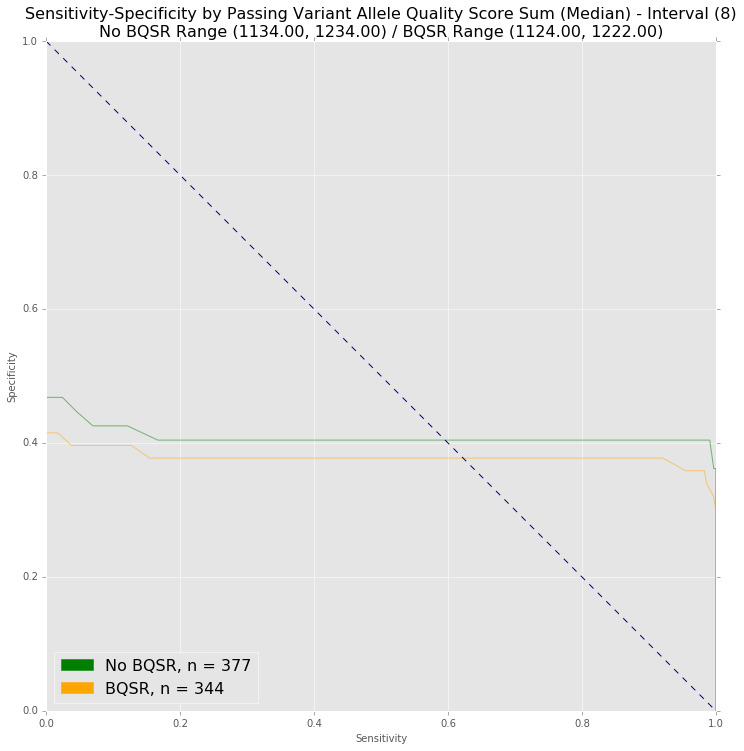

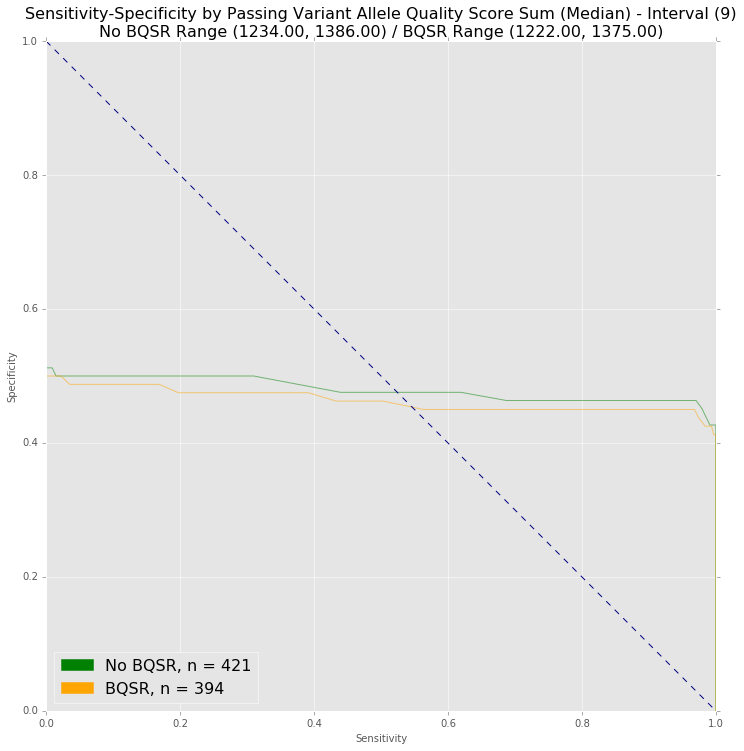

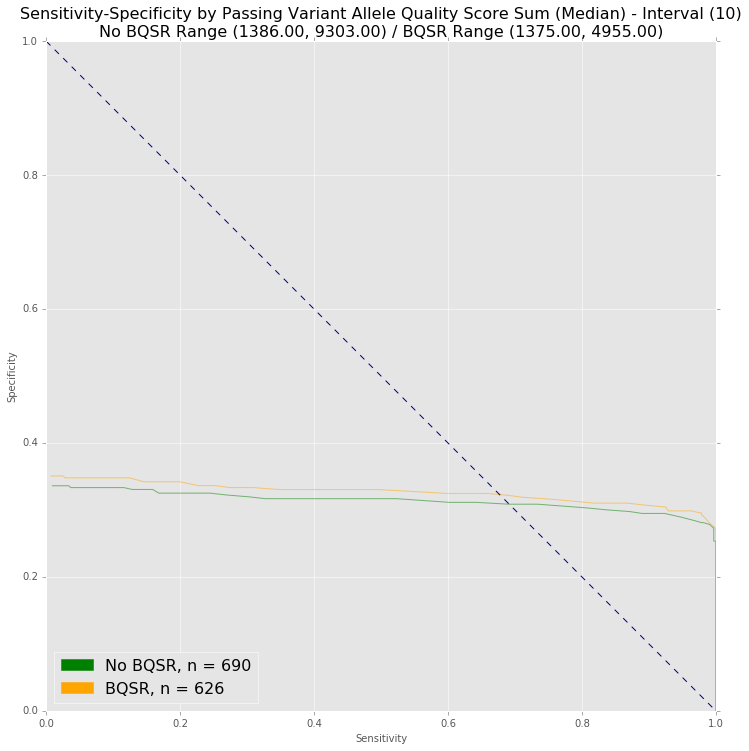

In [45]:
#
# Generate Sens-Spec Curves by Median Subsets
#

# As One Plot
multiCurve(c1QssMedianTups, c2QssMedianTups, trSet, c1Passing, c2Passing, subsetKey = "QSS", c1Label = "No BQSR", c2Label = "BQSR", title = "Sensitivity-Specificity by Passing Variant Allele Quality Score Sum (Median) - Interval")

# Individual Plots
plotCurves(c1QssMedianTups, c2QssMedianTups, trSet, c1Passing, c2Passing, subsetKey = "QSS", c1Label = "No BQSR", c2Label = "BQSR", titleStr = "Sensitivity-Specificity by Passing Variant Allele Quality Score Sum (Median) - Interval")

## Detected Variants by Dinucleotide Context - Passing

# BQSR / No BQSR Low VAF Performance Comparison - All Variants

In [46]:
# Get Metrics
c1AfVals = sorted(getFormatData(c1HashMap, key="AF")[0])
c2AfVals = sorted(getFormatData(c2HashMap, key="AF")[0])

#
# Low VAF
#

c1AfLowSplit = [x for x in c1AfVals if x > 0.0 and x <= 0.05]
c2AfLowSplit = [x for x in c2AfVals if x > 0.0 and x <= 0.05]
c1AfMedSplit = [x for x in c1AfVals if x > 0.05 and x <= 0.1]
c2AfMedSplit = [x for x in c2AfVals if x > 0.05 and x <= 0.1]
c1AfHighSplit = [x for x in c1AfVals if x > 0.1 and x <= 0.15]
c2AfHighSplit = [x for x in c2AfVals if x > 0.1 and x <= 0.15]

# Low Range Tuples
c1AfLowTups = (min(c1AfLowSplit), max(c1AfLowSplit))
c2AfLowTups = (min(c2AfLowSplit), max(c2AfLowSplit))
c1AfMedTups = (min(c1AfMedSplit), max(c1AfMedSplit))
c2AfMedTups = (min(c2AfMedSplit), max(c2AfMedSplit))
c1AfHighTups = (min(c1AfHighSplit), max(c1AfHighSplit))
c2AfHighTups = (min(c2AfHighSplit), max(c2AfHighSplit))

# Note: We could just hand the range tuples - but this bounds the tuple values by the actual data values present

## 0.0 - 0.05 VAF - All

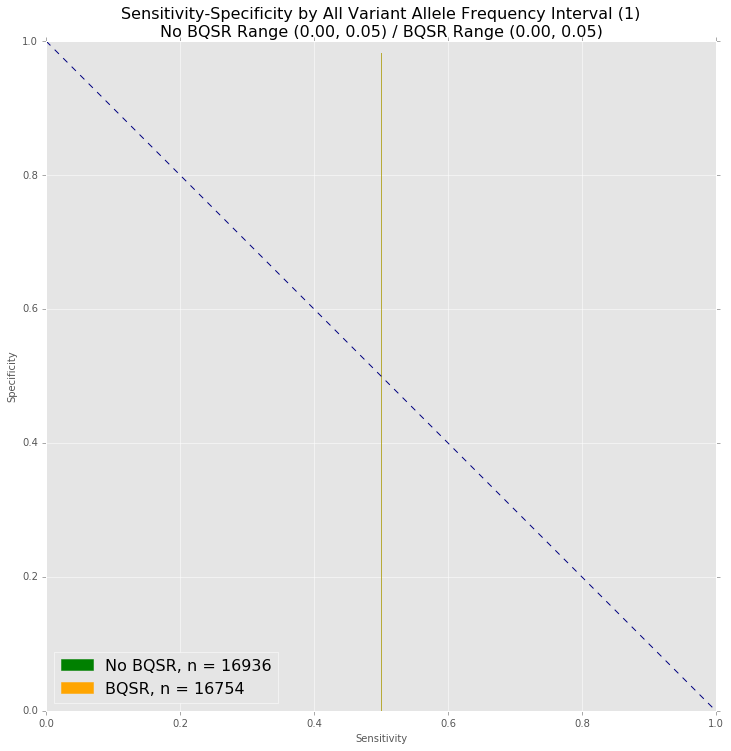

In [47]:
# Individual Plots
plotCurves([c1AfLowTups], [c2AfLowTups], trSet, c1HashMap, c2HashMap, subsetKey = "AF", c1Label = "No BQSR", c2Label = "BQSR", titleStr = "Sensitivity-Specificity by All Variant Allele Frequency Interval")

## 0.05 - 0.1 VAF - All

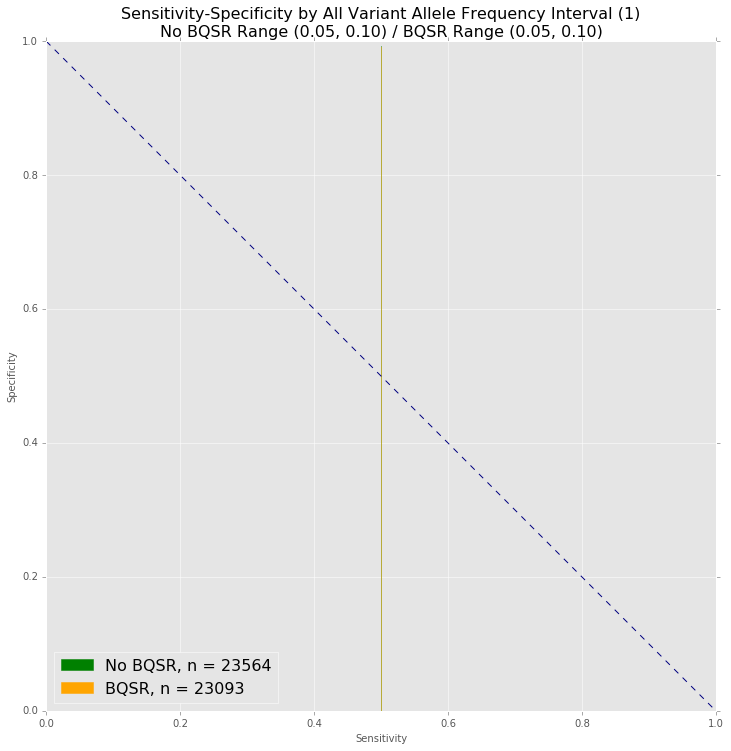

In [48]:
# Individual Plots
plotCurves([c1AfMedTups], [c2AfMedTups], trSet, c1HashMap, c2HashMap, subsetKey = "AF", c1Label = "No BQSR", c2Label = "BQSR", titleStr = "Sensitivity-Specificity by All Variant Allele Frequency Interval")

## 0.1 - 0.15 VAF - All

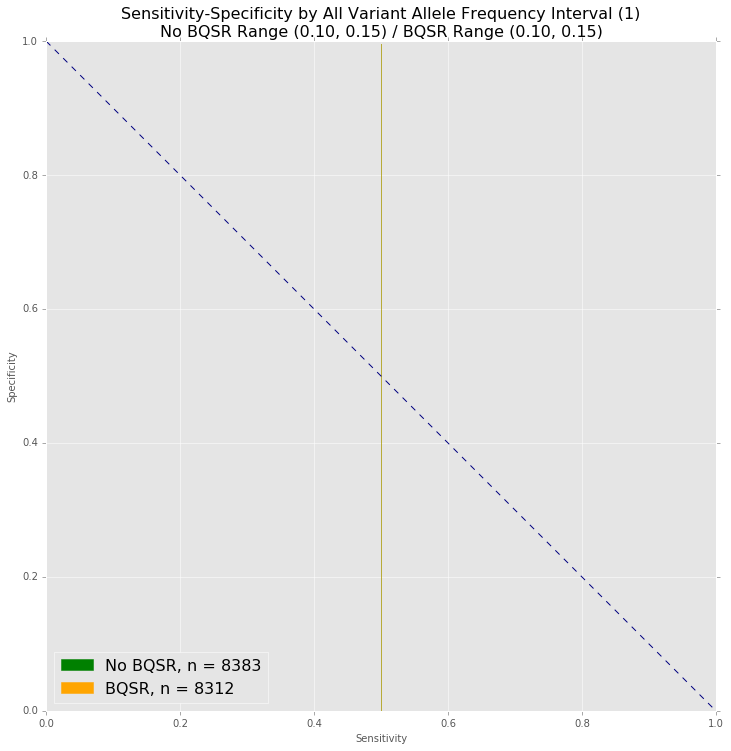

In [49]:
# Individual Plots
plotCurves([c1AfHighTups], [c2AfHighTups], trSet, c1HashMap, c2HashMap, subsetKey = "AF", c1Label = "No BQSR", c2Label = "BQSR", titleStr = "Sensitivity-Specificity by All Variant Allele Frequency Interval")

# BQSR / No BQSR Low VAF Performance Comparison - Passing Variants

In [50]:
# Get Metrics
c1AfVals, excl = getFormatData(c1Passing, key="AF")
c2AfVals, excl = getFormatData(c2Passing, key="AF")

c1AfVals = sorted(c1AfVals)
c2AfVals = sorted(c2AfVals)

#
# Low VAF
# 

c1AfLowSplit = [x for x in c1AfVals if x > 0.0 and x <= 0.05]
c2AfLowSplit = [x for x in c2AfVals if x > 0.0 and x <= 0.05]
c1AfMedSplit = [x for x in c1AfVals if x > 0.05 and x <= 0.1]
c2AfMedSplit = [x for x in c2AfVals if x > 0.05 and x <= 0.1]
c1AfHighSplit = [x for x in c1AfVals if x > 0.1 and x <= 0.15]
c2AfHighSplit = [x for x in c2AfVals if x > 0.1 and x <= 0.15]

# Low Range Tuples
c1AfLowTups = (min(c1AfLowSplit), max(c1AfLowSplit))
c2AfLowTups = (min(c2AfLowSplit), max(c2AfLowSplit))
c1AfMedTups = (min(c1AfMedSplit), max(c1AfMedSplit))
c2AfMedTups = (min(c2AfMedSplit), max(c2AfMedSplit))
c1AfHighTups = (min(c1AfHighSplit), max(c1AfHighSplit))
c2AfHighTups = (min(c2AfHighSplit), max(c2AfHighSplit))

## 0.0 - 0.05 VAF - Passing

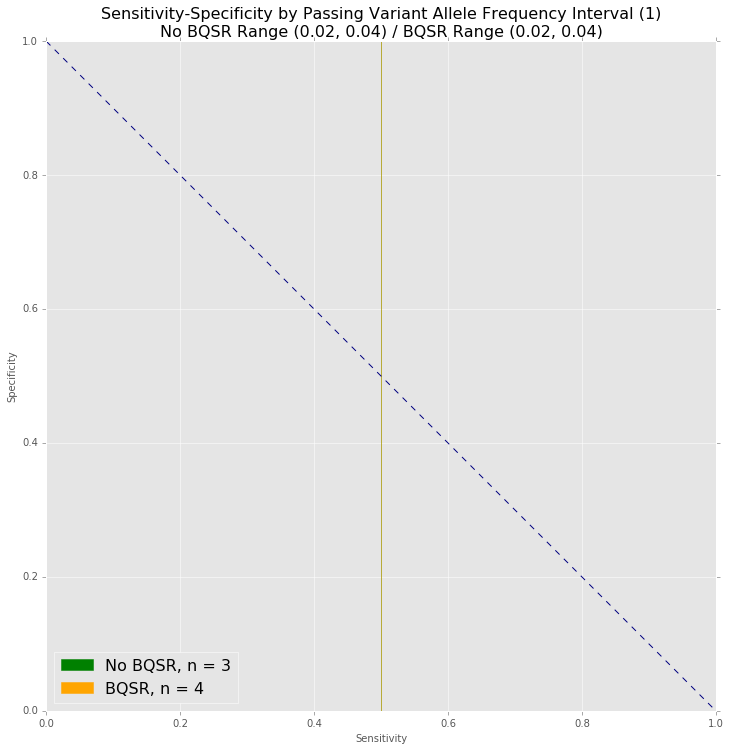

In [51]:
# Individual Plots
plotCurves([c1AfLowTups], [c2AfLowTups], trSet, c1Passing, c2Passing, subsetKey = "AF", c1Label = "No BQSR", c2Label = "BQSR", titleStr = "Sensitivity-Specificity by Passing Variant Allele Frequency Interval")

## 0.05 - 0.1 VAF - Passing

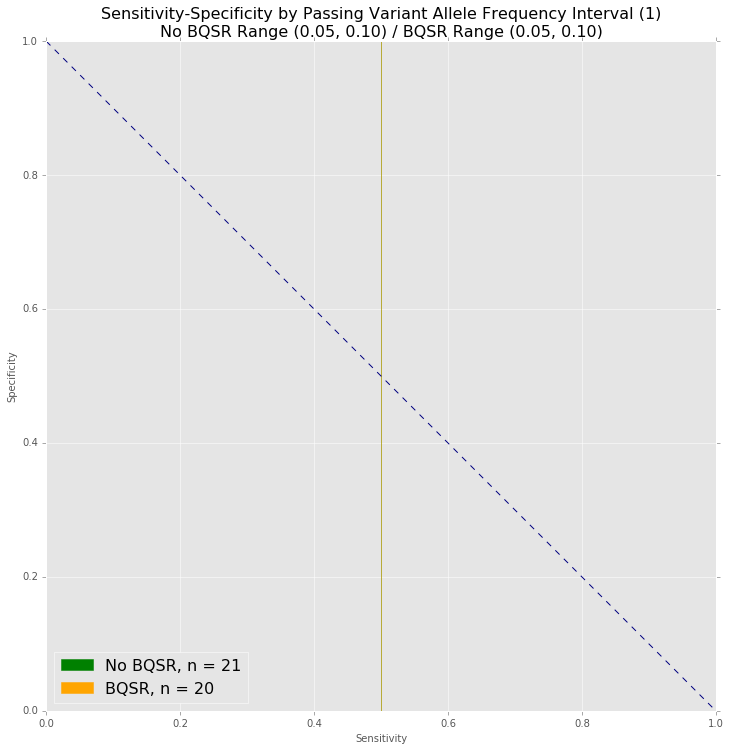

In [52]:
# Individual Plots
plotCurves([c1AfMedTups], [c2AfMedTups], trSet, c1Passing, c2Passing, subsetKey = "AF", c1Label = "No BQSR", c2Label = "BQSR", titleStr = "Sensitivity-Specificity by Passing Variant Allele Frequency Interval")

## 0.1 - 0.15 VAF - Passing

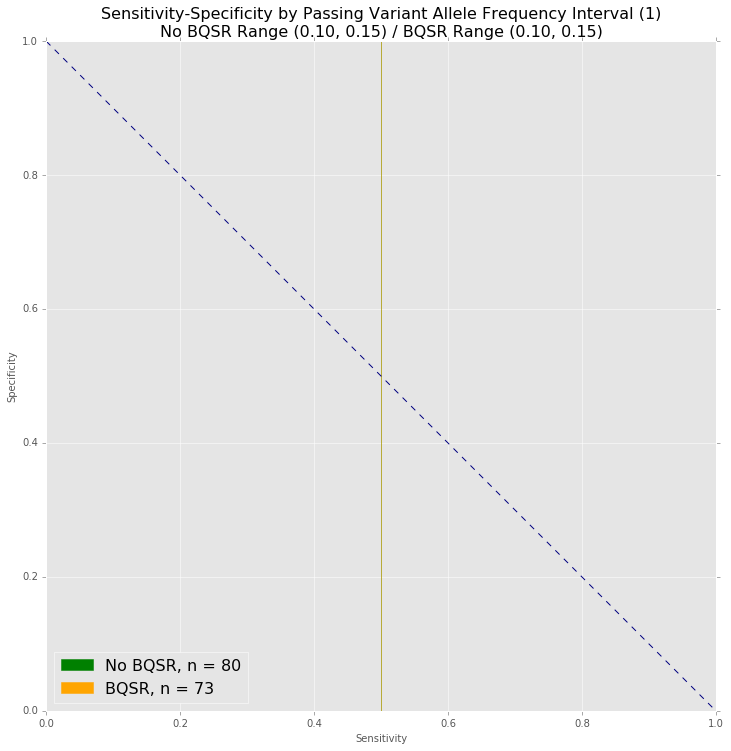

In [53]:
# Individual Plots
plotCurves([c1AfHighTups], [c2AfHighTups], trSet, c1Passing, c2Passing, subsetKey = "AF", c1Label = "No BQSR", c2Label = "BQSR", titleStr = "Sensitivity-Specificity by Passing Variant Allele Frequency Interval")

# Which Mutect2 Filters Are Creating False Negatives?

In [54]:
from collections import defaultdict

#
# Truth Set
#

# Subset HashMaps by VAF Range
trSub, excluded = subsetHashMapByInfoThreshold(trHashMap, 0.15, operation = "<=", key = "VAF")
# Truth Set 0.10 - 0.15
trSubGt10, trExcludedLt10 = subsetHashMapByInfoThreshold(trSub, 0.10, operation = "<=", key = "VAF")
# Truth Set 0.00 - 0.05; 0.05 - 0.10
trSubGt00, trSubGt05 = subsetHashMapByInfoThreshold(trExcludedLt10, 0.05, operation = "<=", key = "VAF")

#
# No BQSR - All
#

c1Sub, excluded = subsetHashMapByFormatThreshold(c1HashMap, 0.15, operation = "<=", key = "AF")
# All - No BQSR Set 0.10 - 0.15
c1SubGt10, c1ExcludedLt10 = subsetHashMapByFormatThreshold(c1Sub, 0.10, operation = "<=", key = "AF")
# All - No BQSR Set 0.00 - 0.05; 0.05 - 0.10
c1SubGt00, c1SubGt05 = subsetHashMapByFormatThreshold(c1ExcludedLt10, 0.05, operation = "<=", key = "AF")

#
# No BQSR - Passing
#

c1PassSub, excluded = subsetHashMapByFormatThreshold(c1Passing, 0.15, operation = "<=", key = "AF")
# Passing - No BQSR Set 0.10 - 0.15
c1PassSubGt10, c1PassExcludedLt10 = subsetHashMapByFormatThreshold(c1PassSub, 0.10, operation = "<=", key = "AF")
# Passing - No BQSR Set 0.00 - 0.05; 0.05 - 0.10
c1PassSubGt00, c1PassSubGt05 = subsetHashMapByFormatThreshold(c1PassExcludedLt10, 0.05, operation = "<=", key = "AF")

#
# BQSR - All
#

c2Sub, excluded = subsetHashMapByFormatThreshold(c2HashMap, 0.15, operation = "<=", key = "AF")
# All - BQSR Set 0.10 - 0.15
c2SubGt10, c2ExcludedLt10 = subsetHashMapByFormatThreshold(c2Sub, 0.10, operation = "<=", key = "AF")
# All - BQSR Set 0.00 - 0.05; 0.05 - 0.10
c2SubGt00, c2SubGt05 = subsetHashMapByFormatThreshold(c2ExcludedLt10, 0.05, operation = "<=", key = "AF")

#
# BQSR - Passing
#

c2PassSub, excluded = subsetHashMapByFormatThreshold(c2Passing, 0.15, operation = "<=", key = "AF")
# Passing - BQSR Set 0.10 - 0.15
c2PassSubGt10, c2PassExcludedLt10 = subsetHashMapByFormatThreshold(c2PassSub, 0.10, operation = "<=", key = "AF")
# Passing - BQSR Set 0.00 - 0.05; 0.05 - 0.10
c2PassSubGt00, c2PassSubGt05 = subsetHashMapByFormatThreshold(c2PassExcludedLt10, 0.05, operation = "<=", key = "AF")


## Plot Filter Frequencies for False Negatives - VAF [0.10 - 0.15]

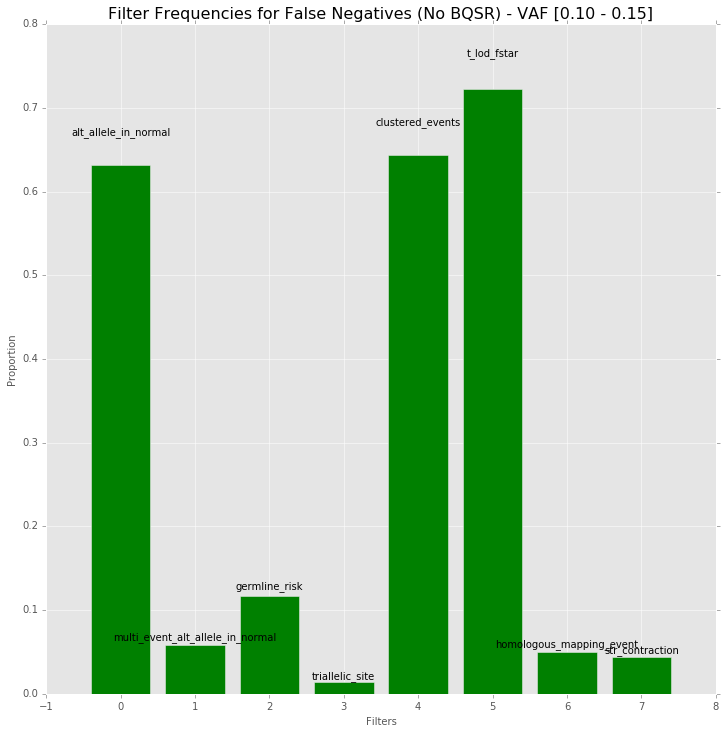

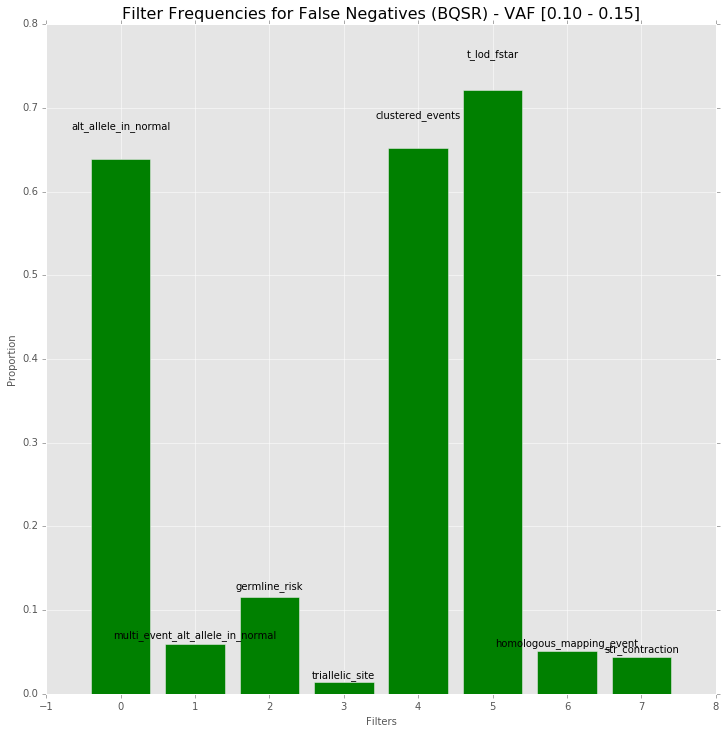

In [55]:
# Plot Filter Frequencies – False Negatives - No BQSR Set 0.10 - 0.15

# Get True Keys For False Negatives
diff = set(c1SubGt10.keys()) - set(c1PassSubGt10.keys())
c1SubGt10Fn = subsetHashMapByKeys(c1SubGt10, diff)
if len(c1SubGt10Fn) > 0:
    # Generate Filter Frequencies Plot
    plotFilterFrequencies(c1SubGt10Fn, title = "Filter Frequencies for False Negatives (No BQSR) - VAF [0.10 - 0.15]", xlabel = "Filters", ylabel = "Proportion")

# Plot Filter Frequencies – False Negatives - BQSR Set 0.10 - 0.15

# Get True Keys For False Negatives
diff = set(c2SubGt10.keys()) - set(c2PassSubGt10.keys())
c2SubGt10Fn = subsetHashMapByKeys(c2SubGt10, diff)
if len(c2SubGt10Fn) > 0:
    # Generate Filter Frequencies Plot
    plotFilterFrequencies(c2SubGt10Fn, title = "Filter Frequencies for False Negatives (BQSR) - VAF [0.10 - 0.15]", xlabel = "Filters", ylabel = "Proportion")

## Plot Filter Frequencies for False Negatives - VAF [0.05 - 0.10]

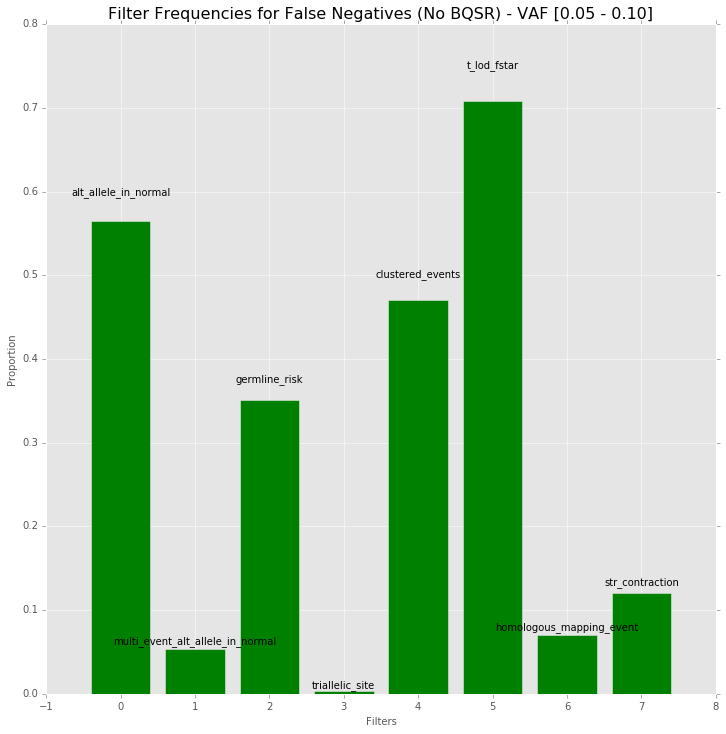

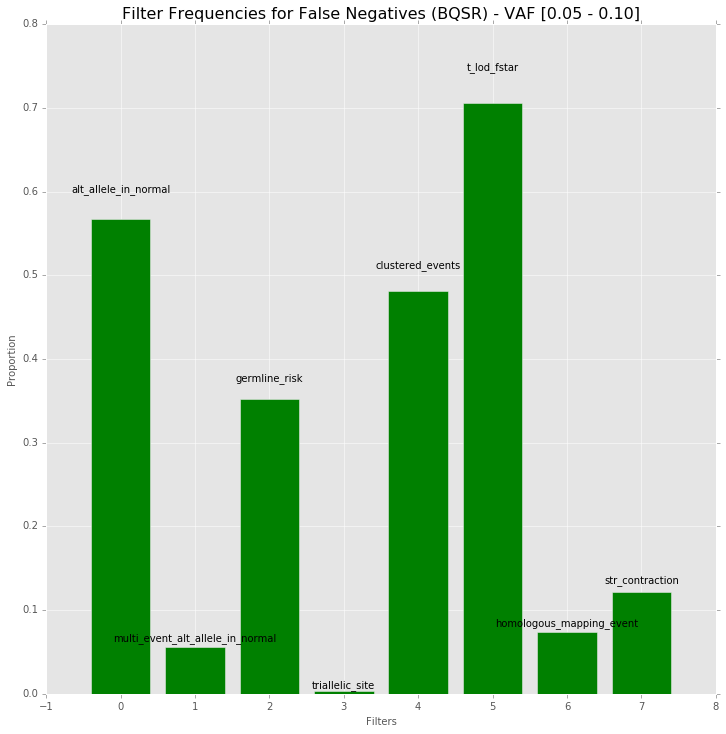

In [56]:
# Plot Filter Frequencies – False Negatives - No BQSR Set 0.05 - 0.10

# Get True Keys For False Negatives
diff = set(c1SubGt05.keys()) - set(c1PassSubGt05.keys())
c1SubGt05Fn = subsetHashMapByKeys(c1SubGt05, diff)
if len(c1SubGt05Fn) > 0:
    # Generate Filter Frequencies Plot
    plotFilterFrequencies(c1SubGt05Fn, title = "Filter Frequencies for False Negatives (No BQSR) - VAF [0.05 - 0.10]", xlabel = "Filters", ylabel = "Proportion")

# Plot Filter Frequencies – False Negatives - BQSR Set 0.05 - 0.10

# Get True Keys For False Negatives
diff = set(c2SubGt05.keys()) - set(c2PassSubGt05.keys())
c2SubGt05Fn = subsetHashMapByKeys(c2SubGt05, diff)
if len(c2SubGt05Fn) > 0:
    # Generate Filter Frequencies Plot
    plotFilterFrequencies(c2SubGt05Fn, title = "Filter Frequencies for False Negatives (BQSR) - VAF [0.05 - 0.10]", xlabel = "Filters", ylabel = "Proportion")

## Plot Filter Frequencies for False Negatives - VAF [< 0.01 - 0.05]

In [57]:
# Plot Filter Frequencies – False Negatives - No BQSR Set < 0.01 - 0.05

# Get True Keys For False Negatives
diff = set(c1SubGt00.keys()) - set(c1PassSubGt00.keys())
c1SubGt00Fn = subsetHashMapByKeys(c1SubGt00, diff)
if len(c1SubGt00Fn) > 0:
    # Generate Filter Frequencies Plot
    plotFilterFrequencies(c1SubGt00Fn)

# Plot Filter Frequencies – False Negatives - BQSR Set < 0.01 - 0.05

# Get True Keys For False Negatives
diff = set(c2SubGt00.keys()) - set(c2PassSubGt00.keys())
c2SubGt00Fn = subsetHashMapByKeys(c2SubGt00, diff)
if len(c2SubGt00Fn) > 0:
    # Generate Filter Frequencies Plot
    plotFilterFrequencies(c2SubGt00Fn)

# Mutect2 Performance at Low VAF
## Called / Not Called by MuTect2 by VAF Range [> 0.00 - 0.05]; [0.05 - 0.10]; [0.10 - 0.15]

In [58]:
#
# Map Analysis
#

trCombinations = [trSubGt10, trSubGt05, trSubGt00]
combinations = [
    [
        {"label": "No BQSR - All - [0.10 - 0.15] VAF", "data": c1SubGt10}, 
        {"label": "No BQSR - All - [0.05 - 0.10] VAF", "data": c1SubGt05},
        {"label": "No BQSR - All - [> 0.00 - 0.05] VAF", "data": c1SubGt00}
    ],
    [
        {"label": "BQSR - All - [0.10 - 0.15] VAF", "data": c2SubGt10}, 
        {"label": "BQSR - All - [0.05 - 0.10] VAF", "data": c2SubGt05}, 
        {"label": "BQSR - All - [> 0.00 - 0.05] VAF", "data": c2SubGt00}
    ],
    [
        {"label": "No BQSR - Passing - [0.10 - 0.15] VAF", "data": c1PassSubGt10}, 
        {"label": "No BQSR - Passing - [0.05 - 0.10] VAF", "data": c1PassSubGt05}, 
        {"label": "No BQSR - Passing - [> 0.00 - 0.05] VAF", "data": c1PassSubGt00}
    ],
    [
        {"label": "BQSR - Passing - [0.10 - 0.15] VAF", "data": c2PassSubGt10}, 
        {"label": "BQSR - Passing - [0.05 - 0.10] VAF", "data": c2PassSubGt05}, 
        {"label": "BQSR - Passing - [> 0.00 - 0.05] VAF", "data": c2PassSubGt00}
    ]
]

# Generate Analyses
analysisSets = []
for combination in combinations:
    for truth, condition in zip(trCombinations, combination):
        a = generateAnalysis(condition["data"], truth)
        analysisSets.append({"label": condition["label"], "analysis": a})

# Print Analyses
i = 0
for analysisSet in analysisSets:
    print("Mutect2 Performance: %s" % analysisSet["label"])
    print("\tCalled by MuTect2 (TPR): %.4f%%" % analysisSet["analysis"]["tpr"])
    print("\tMissed by MuTect2 (FNR): %.4f%%" % analysisSet["analysis"]["fnr"])
    print("\tTNR:                     %.4f%%" % analysisSet["analysis"]["tnr"])
    print("\tFPR:                     %.4f%%" % analysisSet["analysis"]["fpr"])
    print("\tSensitivity:             %.4f%%" % analysisSet["analysis"]["sensitivity"])
    print("\tSpecificity:             %.4f%%" % analysisSet["analysis"]["specificity"])
    print("\tAccuracy:                %.4f%%" % analysisSet["analysis"]["accuracy"])
    print("n = %d" % analysisSet["analysis"]["n"])
    brk()
    i += 1
    if (i % 3 == 0):
        print("==================================================")

Mutect2 Performance: No BQSR - All - [0.10 - 0.15] VAF
	Called by MuTect2 (TPR): 0.5000%
	Missed by MuTect2 (FNR): 0.5000%
	TNR:                     0.9882%
	FPR:                     0.0118%
	Sensitivity:             0.5000%
	Specificity:             0.9882%
	Accuracy:                0.9882%
n = 41248

--------------------------------------------------

Mutect2 Performance: No BQSR - All - [0.05 - 0.10] VAF
	Called by MuTect2 (TPR): 0.5000%
	Missed by MuTect2 (FNR): 0.5000%
	TNR:                     0.9957%
	FPR:                     0.0043%
	Sensitivity:             0.5000%
	Specificity:             0.9957%
	Accuracy:                0.9957%
n = 8422

--------------------------------------------------

Mutect2 Performance: No BQSR - All - [> 0.00 - 0.05] VAF
	Called by MuTect2 (TPR): 0.5000%
	Missed by MuTect2 (FNR): 0.5000%
	TNR:                     0.5000%
	FPR:                     0.5000%
	Sensitivity:             0.5000%
	Specificity:             0.5000%
	Accuracy:                0.

# No BQSR Performance by Metric Group by Threshold

In [59]:
import functools

# Metric Analysis Combinations
accuracy               = ["accuracy", "f1score"]
sensitivitySpecificity = ["sensitivity", "specificity"]
precisionRecall        = ["precision", "recall"]
rates                  = ["tpr", "tnr", "fpr", "fnr"]
fdrFor                 = ["fdr", "for"]
predictiveValues       = ["ppv", "npv"]
diagnostic             = ["diagnosticOR"]


### No BQSR Performance by TPR, TNR, FPR, FNR by Threshold

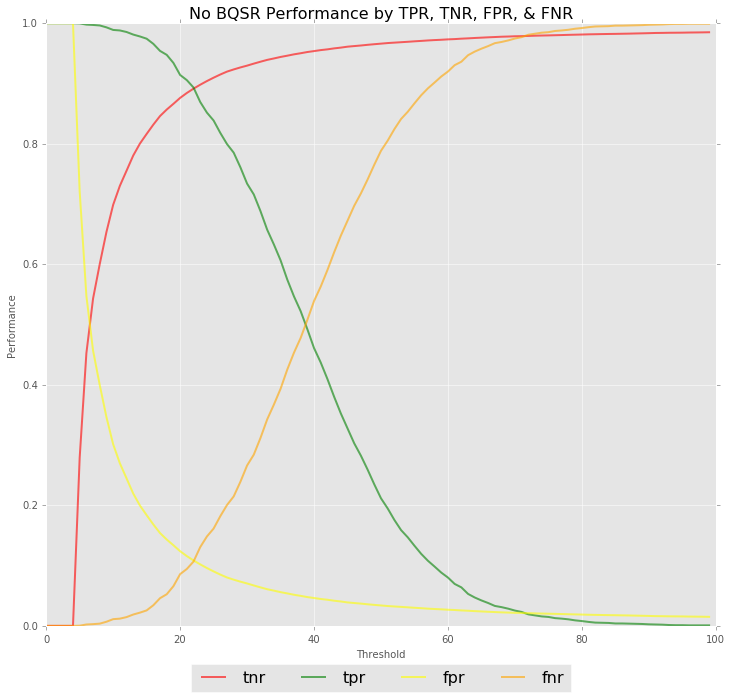

In [60]:
plotMetrics(condition1Analysis, rates, title = "No BQSR Performance by TPR, TNR, FPR, & FNR")

### No BQSR Performance by Sensitivity & Specificity by Threshold

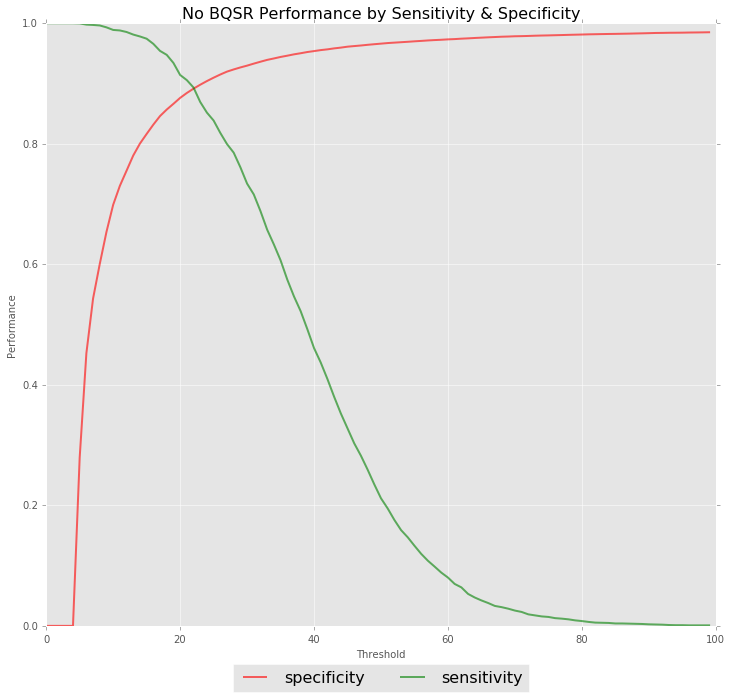

In [61]:
plotMetrics(condition1Analysis, sensitivitySpecificity, title = "No BQSR Performance by Sensitivity & Specificity")

### No BQSR Performance by Precision & Recall by Threshold

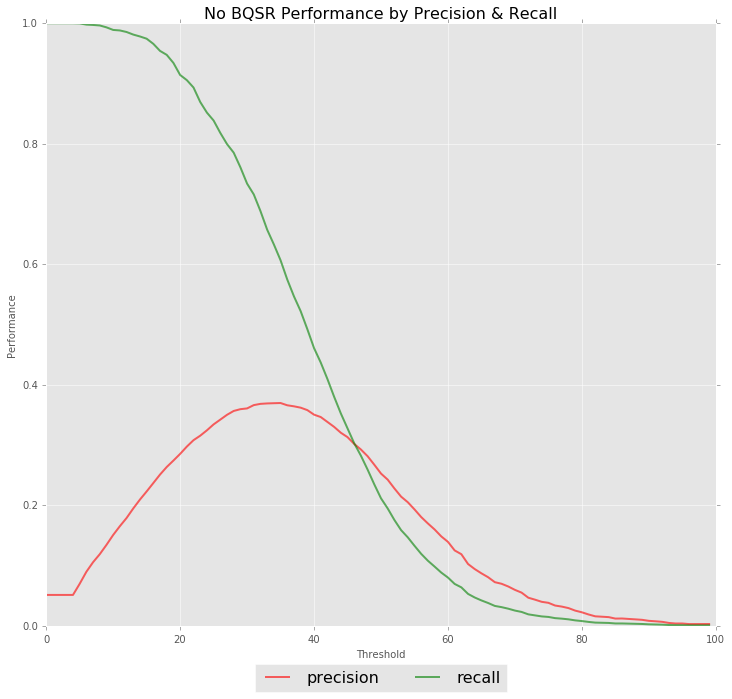

In [62]:
plotMetrics(condition1Analysis, precisionRecall, title = "No BQSR Performance by Precision & Recall")

### No BQSR Performance by Accuracy & F1-Score by Threshold

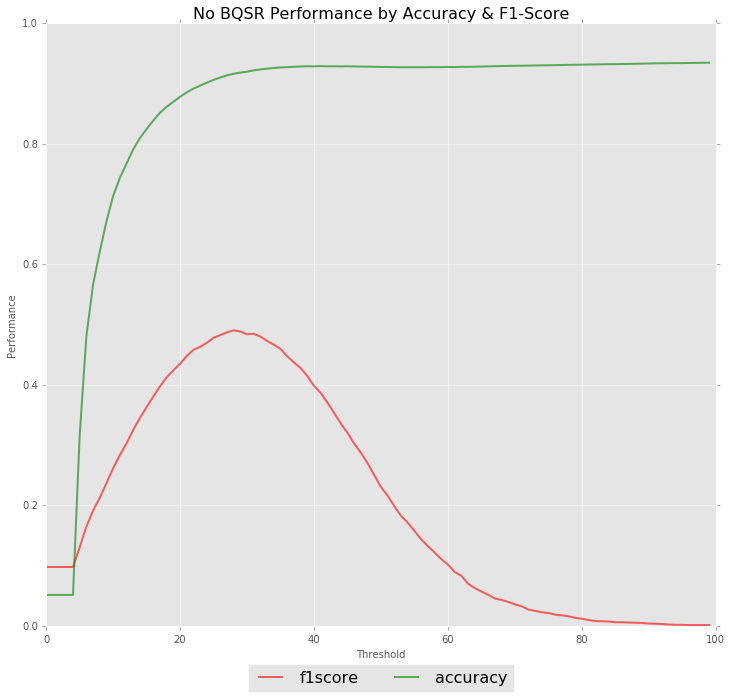

In [63]:
plotMetrics(condition1Analysis, accuracy, title = "No BQSR Performance by Accuracy & F1-Score")

### No BQSR Performance by Positive Predictive Value & Negative Predictive Value by Threshold

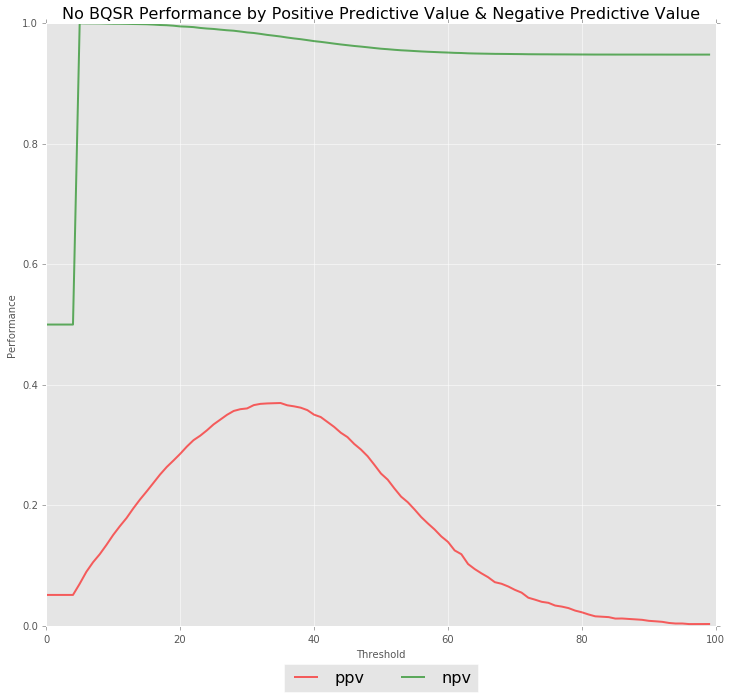

In [64]:
plotMetrics(condition1Analysis, predictiveValues, title = "No BQSR Performance by Positive Predictive Value & Negative Predictive Value")

### No BQSR Performance by False Discovery Rate & False Ommission Rate by Threshold

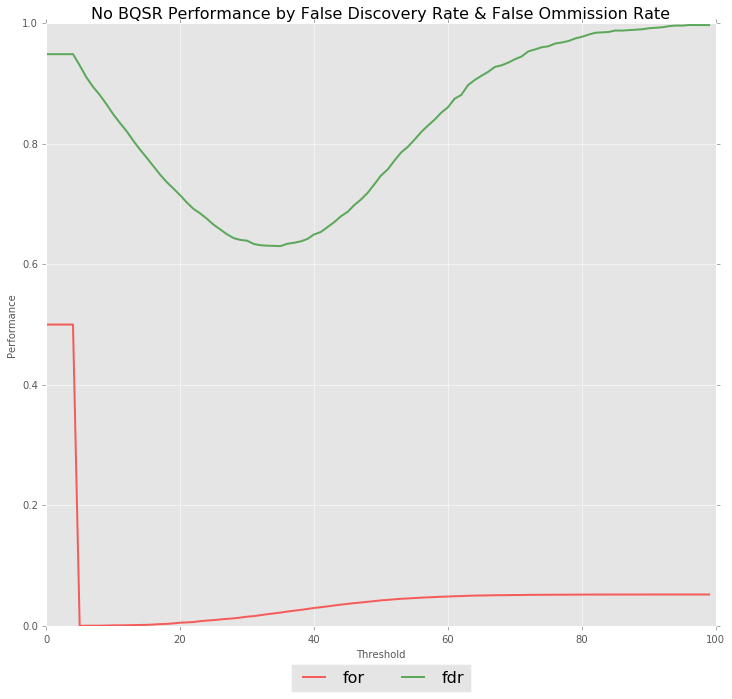

In [65]:
plotMetrics(condition1Analysis, fdrFor, title = "No BQSR Performance by False Discovery Rate & False Ommission Rate")

### No BQSR Performance by Diagnostic Odds Ratio by Threshold

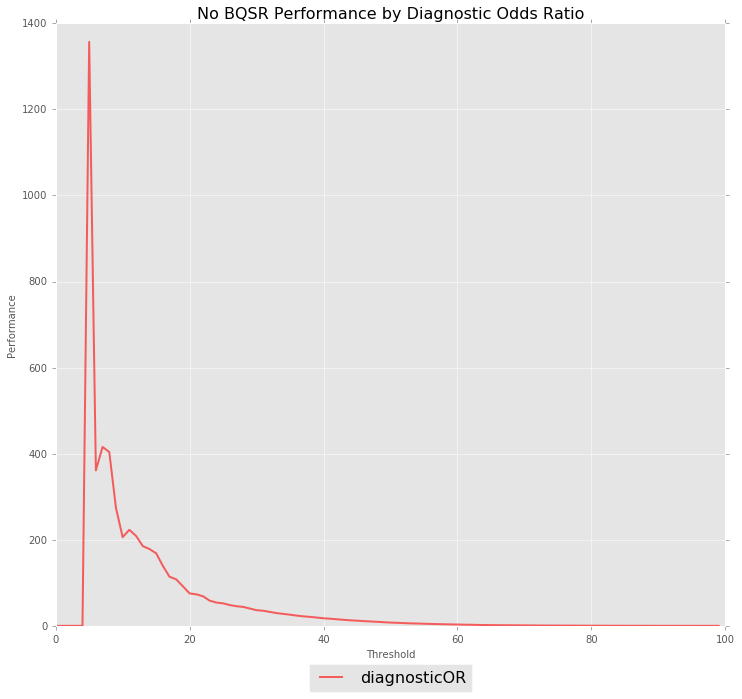

In [66]:
plotMetrics(condition1Analysis, diagnostic, title = "No BQSR Performance by Diagnostic Odds Ratio")

# BQSR Performance by Metric Group by Threshold

### BQSR Performance by  TPR, TNR, FPR, & FNR by Threshold

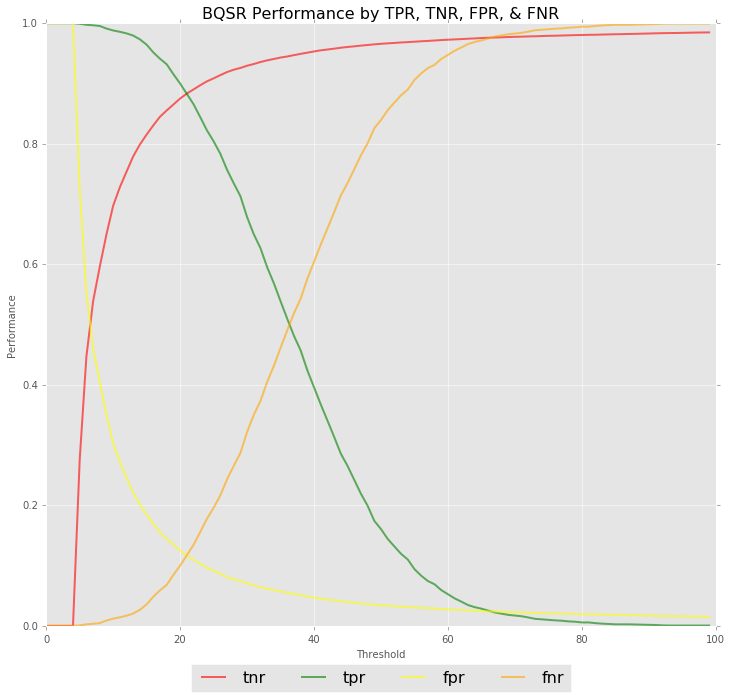

In [67]:
plotMetrics(condition2Analysis, rates, title = "BQSR Performance by TPR, TNR, FPR, & FNR")

### BQSR Performance by Sensitivity & Specificity by Threshold

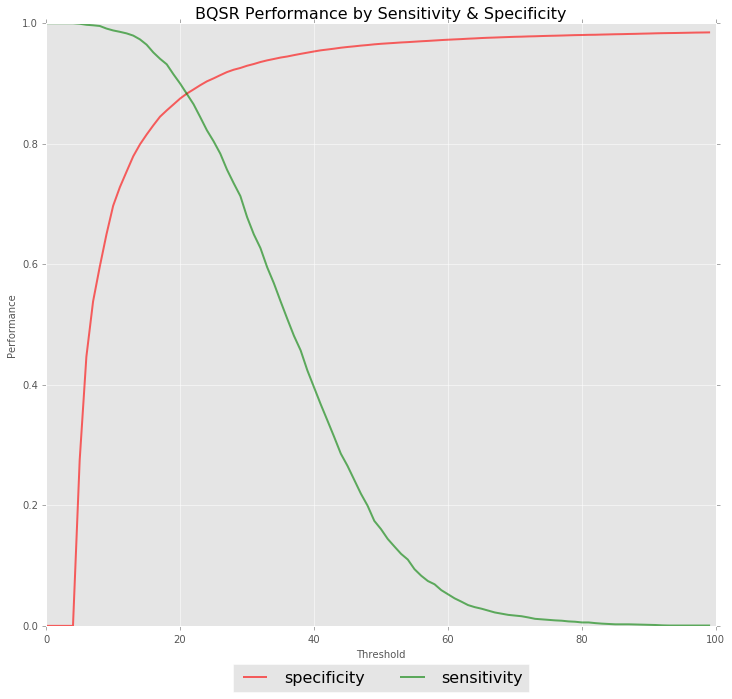

In [68]:
plotMetrics(condition2Analysis, sensitivitySpecificity, title = "BQSR Performance by Sensitivity & Specificity")

### BQSR Performance by Precision & Recall by Threshold

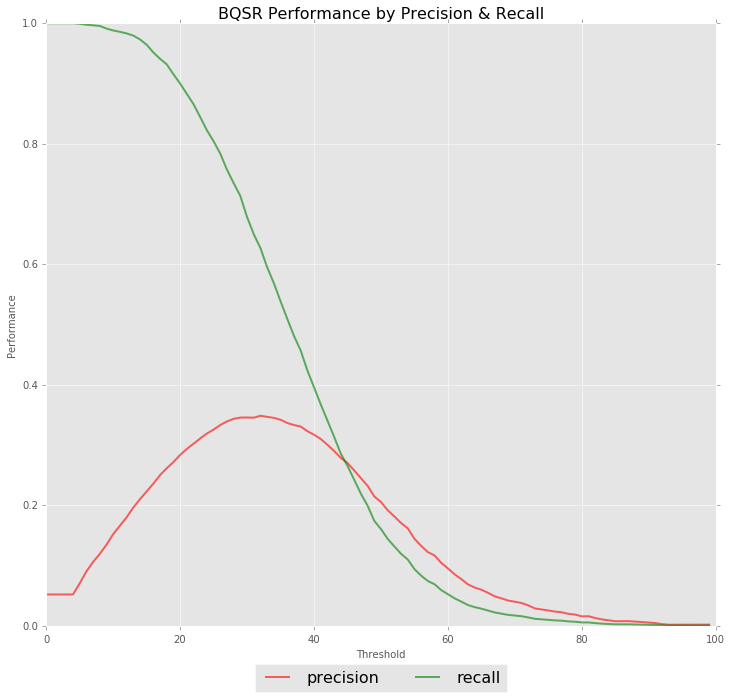

In [69]:
plotMetrics(condition2Analysis, precisionRecall, title = "BQSR Performance by Precision & Recall")

### BQSR Performance by Accuracy & F1-Score by Threshold

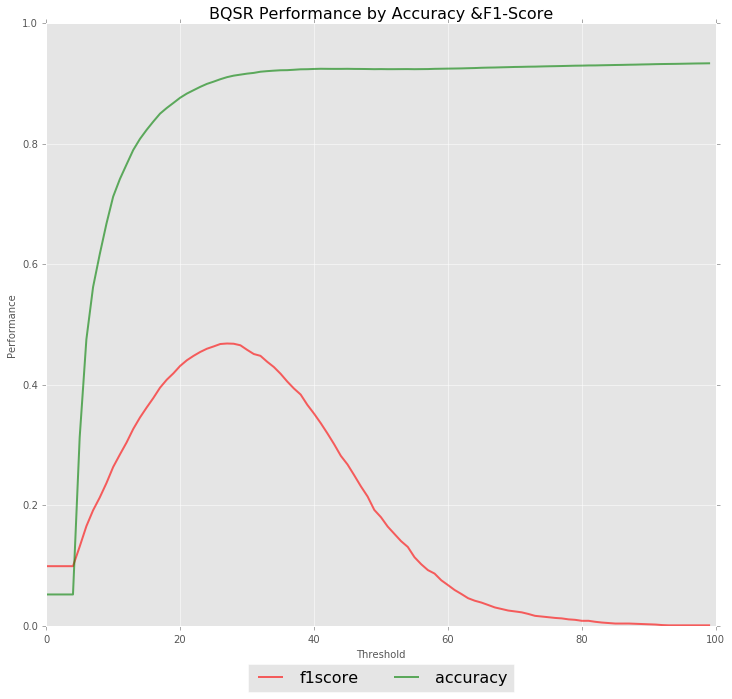

In [70]:
plotMetrics(condition2Analysis, accuracy, title = "BQSR Performance by Accuracy &F1-Score")

### BQSR Performance by Positive Predictive Value & Negative Predictive Value by Threshold

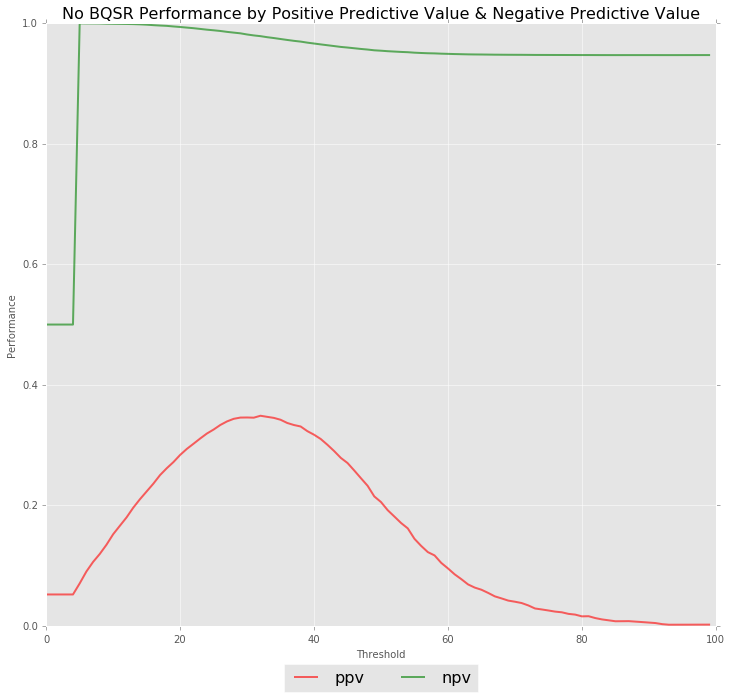

In [71]:
plotMetrics(condition2Analysis, predictiveValues, title = "No BQSR Performance by Positive Predictive Value & Negative Predictive Value")

### BQSR Performance by False Discovery Rate & False Ommission Rate by Threshold

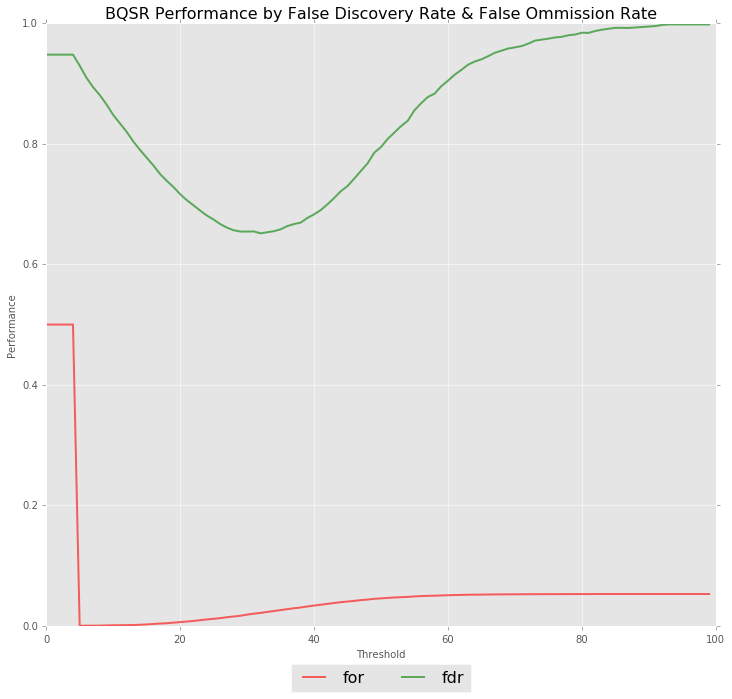

In [72]:
plotMetrics(condition2Analysis, fdrFor, title = "BQSR Performance by False Discovery Rate & False Ommission Rate")

### BQSR Performance by Diagnostic Odds Ratio by Threshold

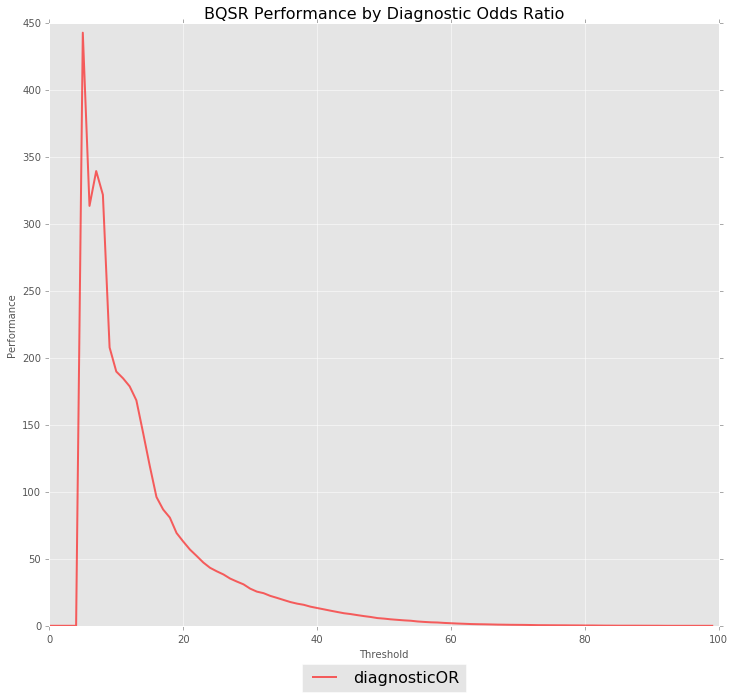

In [73]:
plotMetrics(condition2Analysis, diagnostic, title = "BQSR Performance by Diagnostic Odds Ratio")

# Statistics by Threshold

### No BQSR Condition Statistics by Threshold

In [74]:
printStatistics(condition1Analysis)


--------------------------------------------------

Tumor LOD Threshold: 0

	True Positive:     3506
	True Negative:     0
	False Positive:    64777
	False Negative:    0

	TPR:               100.00%
	TNR:               0.00%
	FPR:               100.00%
	FNR:               0.00%

	Sensitivity:       100.00%
	Specificity:       0.00%

	Precision:         5.13%
	Recall:            100.00%

	Accuracy:          5.13%
	F1-Score:          9.77%
	FDR:               94.87%


--------------------------------------------------


--------------------------------------------------

Tumor LOD Threshold: 1

	True Positive:     3506
	True Negative:     0
	False Positive:    64777
	False Negative:    0

	TPR:               100.00%
	TNR:               0.00%
	FPR:               100.00%
	FNR:               0.00%

	Sensitivity:       100.00%
	Specificity:       0.00%

	Precision:         5.13%
	Recall:            100.00%

	Accuracy:          5.13%
	F1-Score:          9.77%
	FDR:               94.87%


--

### BQSR Condition Statistics by Threshold

In [75]:
printStatistics(condition2Analysis)


--------------------------------------------------

Tumor LOD Threshold: 0

	True Positive:     3507
	True Negative:     0
	False Positive:    63792
	False Negative:    0

	TPR:               100.00%
	TNR:               0.00%
	FPR:               100.00%
	FNR:               0.00%

	Sensitivity:       100.00%
	Specificity:       0.00%

	Precision:         5.21%
	Recall:            100.00%

	Accuracy:          5.21%
	F1-Score:          9.91%
	FDR:               94.79%


--------------------------------------------------


--------------------------------------------------

Tumor LOD Threshold: 1

	True Positive:     3507
	True Negative:     0
	False Positive:    63792
	False Negative:    0

	TPR:               100.00%
	TNR:               0.00%
	FPR:               100.00%
	FNR:               0.00%

	Sensitivity:       100.00%
	Specificity:       0.00%

	Precision:         5.21%
	Recall:            100.00%

	Accuracy:          5.21%
	F1-Score:          9.91%
	FDR:               94.79%


--